In [3]:
!pip install spacy
!pip install networkx

In [4]:
!pip install plotly

  Created wheel for retrying: filename=retrying-1.3.3-cp37-none-any.whl size=11435 sha256=a4ec43c2b6cdbf6c64d186e1172d490254381d8495a7d5666872221d73cc5721
  Stored in directory: C:\Users\Madhumita Shankar\AppData\Local\pip\Cache\wheels\d7\a9\33\acc7b709e2a35caa7d4cae442f6fe6fbf2c43f80823d46460c
Successfully built retrying


In [2]:
!python -m spacy download en_core_web_lg

  Created wheel for en-core-web-lg: filename=en_core_web_lg-2.2.5-cp37-none-any.whl size=829180949 sha256=1468d5a280f9642f16e73be442f03c8eee011d6f57a78a45c595939c1710f712
  Stored in directory: C:\Users\MADHUM~1\AppData\Local\Temp\pip-ephem-wheel-cache-7rogeib9\wheels\2a\c1\a6\fc7a877b1efca9bc6a089d6f506f16d3868408f9ff89f8dbfc
Successfully built en-core-web-lg
[+] Download and installation successful
You can now load the model via spacy.load('en_core_web_lg')


In [14]:
import spacy
import pandas as pd
import numpy as np
import string
import networkx as nx
import matplotlib.pyplot as plt
import datetime                              
import os
import plotly.graph_objects as go
import re

In [2]:
nlp = sp.load('en_core_web_lg')  
plt.rcParams['figure.figsize'] = [10, 10]

In [3]:
# Data
df = pd.read_csv("Reviews.csv",nrows=2000)

In [4]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [22]:
def clean(text):
    A = []
    se = text.lower()
    cleanr = re.compile('<.*?>')
    se = re.sub(cleanr, ' ', se)
    se  = se.translate(str.maketrans('', '', string.punctuation))
    doc = spacy_nlp(se)
    tokens = [token.text for token in doc if not token.is_stop]
    Clean_set = " ".join(tokens)
    return Clean_set

In [23]:
spacy_nlp = spacy.load('en_core_web_sm')
stop_words = sp.lang.en.stop_words.STOP_WORDS
df['clean_text'] = df['Text'].apply(lambda x:clean(x))

In [24]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,clean_text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,bought vitality canned dog food products found...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,product arrived labeled jumbo salted peanutsth...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,confection centuries light pillowy citrus ge...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,looking secret ingredient robitussin believe f...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,great taffy great price wide assortment yumm...


In [26]:
tokens = []
lemma = []
pos = []
parsed_doc = [] 
col_to_parse = 'clean_text'

In [27]:
for doc in nlp.pipe(df[col_to_parse].astype('unicode').values, batch_size=50,
                        n_threads=3):
    if doc.is_parsed:
        parsed_doc.append(doc)
        tokens.append([n.text for n in doc])
        lemma.append([n.lemma_ for n in doc])
        pos.append([n.pos_ for n in doc])
    else:
        # We want to make sure that the lists of parsed results have the
        # same number of entries of the original Dataframe, so add some blanks in case the parse fails
        tokens.append(None)
        lemma.append(None)
        pos.append(None)

In [28]:
df['parsed_doc'] = parsed_doc
df['comment_tokens'] = tokens
df['comment_lemma'] = lemma
df['parsed_lemma'] = 
df['pos_pos'] = pos

In [29]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,clean_text,parsed_doc,comment_tokens,comment_lemma,pos_pos
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,bought vitality canned dog food products found...,"(bought, vitality, canned, dog, food, products...","[bought, vitality, canned, dog, food, products...","[buy, vitality, can, dog, food, product, find,...","[VERB, PROPN, VERB, NOUN, NOUN, NOUN, VERB, AD..."
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,product arrived labeled jumbo salted peanutsth...,"(product, arrived, labeled, jumbo, salted, pea...","[product, arrived, labeled, jumbo, salted, pea...","[product, arrive, label, jumbo, salt, peanutst...","[NOUN, VERB, VERB, NOUN, VERB, PROPN, NOUN, AD..."
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,confection centuries light pillowy citrus ge...,"(confection, centuries, , light, pillowy, ci...","[confection, centuries, , light, pillowy, ci...","[confection, century, , light, pillowy, citr...","[NOUN, NOUN, SPACE, ADJ, NOUN, NOUN, NOUN, NOU..."
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,looking secret ingredient robitussin believe f...,"(looking, secret, ingredient, robitussin, beli...","[looking, secret, ingredient, robitussin, beli...","[look, secret, ingredient, robitussin, believe...","[VERB, ADJ, NOUN, NOUN, VERB, VERB, SPACE, VER..."
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,great taffy great price wide assortment yumm...,"(great, taffy, great, price, , wide, assortm...","[great, taffy, great, price, , wide, assortm...","[great, taffy, great, price, , wide, assortm...","[ADJ, NOUN, ADJ, NOUN, SPACE, ADJ, ADJ, ADJ, N..."


In [74]:
df['lemma_text'] = df['comment_lemma'].apply(lambda x:" ".join(x))

In [76]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,clean_text,parsed_doc,comment_tokens,comment_lemma,pos_pos,lemma_text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,bought vitality canned dog food products found...,"(bought, vitality, canned, dog, food, products...","[bought, vitality, canned, dog, food, products...","[buy, vitality, can, dog, food, product, find,...","[VERB, PROPN, VERB, NOUN, NOUN, NOUN, VERB, AD...",buy vitality can dog food product find good qu...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,product arrived labeled jumbo salted peanutsth...,"(product, arrived, labeled, jumbo, salted, pea...","[product, arrived, labeled, jumbo, salted, pea...","[product, arrive, label, jumbo, salt, peanutst...","[NOUN, VERB, VERB, NOUN, VERB, PROPN, NOUN, AD...",product arrive label jumbo salt peanutsthe pea...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,confection centuries light pillowy citrus ge...,"(confection, centuries, , light, pillowy, ci...","[confection, centuries, , light, pillowy, ci...","[confection, century, , light, pillowy, citr...","[NOUN, NOUN, SPACE, ADJ, NOUN, NOUN, NOUN, NOU...",confection century light pillowy citrus gel...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,looking secret ingredient robitussin believe f...,"(looking, secret, ingredient, robitussin, beli...","[looking, secret, ingredient, robitussin, beli...","[look, secret, ingredient, robitussin, believe...","[VERB, ADJ, NOUN, NOUN, VERB, VERB, SPACE, VER...",look secret ingredient robitussin believe find...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,great taffy great price wide assortment yumm...,"(great, taffy, great, price, , wide, assortm...","[great, taffy, great, price, , wide, assortm...","[great, taffy, great, price, , wide, assortm...","[ADJ, NOUN, ADJ, NOUN, SPACE, ADJ, ADJ, ADJ, N...",great taffy great price wide assortment yum...


In [77]:
corpus = df['lemma_text'].to_list()

In [87]:
df['parsed_doc'] = parsed_doc
df['parsed_lema'] = df['lemma_text'].apply(lambda x:nlp(x))

In [88]:
type(df['parsed_lema'][0])

spacy.tokens.doc.Doc

In [78]:
# Extraction Keywords
from sklearn.feature_extraction.text import CountVectorizer
import re
cv=CountVectorizer(max_df=0.8,stop_words=stop_words, max_features=10000, ngram_range=(1,3))
X=cv.fit_transform(corpus)

C:\Users\Madhumita Shankar\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:300: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ll', 've'] not in stop_words.



In [79]:
list(cv.vocabulary_.keys())[:10]

['buy',
 'dog',
 'food',
 'product',
 'find',
 'good',
 'quality',
 'look',
 'like',
 'stew']

In [89]:
world_data1 = df
raw1_G = nx.Graph() # undirected
n = 0

for i in world_data1['parsed_lema']:        # sure, it's inefficient, but it will do
    for j in world_data1['parsed_lema']:
        if i != j:
            if not (raw1_G.has_edge(j, i)):
                sim = i.similarity(j)
                raw1_G.add_edge(i, j, weight = sim)
                n = n + 1

print(raw1_G.number_of_nodes(), "nodes, and", raw1_G.number_of_edges(), "edges created.")

2000 nodes, and 1999000 edges created.


In [91]:
edges_to_kill1 = []
min_wt = 0.94      # this is our cutoff value for a minimum edge-weight 

for n, nbrs in raw1_G.adj.items():
    #print("\nProcessing origin-node:", n, "... ")
    for nbr, eattr in nbrs.items():
        # remove edges below a certain weight
        data = eattr['weight']
        if data < min_wt: 
            # print('(%.3f)' % (data))  
            # print('(%d, %d, %.3f)' % (n, nbr, data))  
            #print("\nNode: ", n, "\n <-", data, "-> ", "\nNeighbour: ", nbr)
            edges_to_kill1.append((n, nbr)) 
            
print("\n", len(edges_to_kill1) / 2, "edges to kill (of", raw1_G.number_of_edges(), "), before de-duplicating")


 1993395.0 edges to kill (of 1999000 ), before de-duplicating


In [92]:
for u, v in edges_to_kill1:
    if raw1_G.has_edge(u, v):   # catches (e.g.) those edges where we've removed them using reverse ... (v, u)
        raw1_G.remove_edge(u, v)

In [93]:
strong1_G = raw1_G
print(strong1_G.number_of_edges())

5605


In [100]:
tt = nx.nodes(strong1_G)

In [102]:
tt

NodeView((buy vitality can dog food product find good quality product look like stew process meat smell well labrador finicky appreciate product better  , product arrive label jumbo salt peanutsthe peanut actually small sized unsalted sure error vendor intend represent product jumbo, confection century    light pillowy citrus gelatin nut    case filbert cut tiny square liberally coat powdered sugar    tiny mouthful heaven    chewy flavorful    highly recommend yummy treat    familiar story cs lewis lion witch wardrobe    treat seduce edmund sell brother sister witch, look secret ingredient robitussin believe find    get addition root beer extract order good cherry soda    flavor medicinal, great taffy great price    wide assortment yummy taffy    delivery quick    taffy lover deal, get wild hair taffy order pound bag taffy enjoyable flavor watermelon root beer melon peppermint grape etc complaint bit redblack licoriceflavored piece particular favorite kid husband last week recommend br

In [51]:
edge_x = []
edge_y = []
for edge in strong_G.edges():
    x0, y0 = strong_G.nodes[edge[0]]['pos']
    x1, y1 = strong_G.nodes[edge[1]]['pos']
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in strong_G.nodes():
    x, y = strong_G.nodes[node]['pos']
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

ValueError: not enough values to unpack (expected 2, got 0)

In [44]:
adjs = strong_G.adj

In [46]:
nodes = strong_G.nodes

In [47]:
nodes

NodeView((bought vitality canned dog food products found good quality product looks like stew processed meat smells better labrador finicky appreciates product better  , product arrived labeled jumbo salted peanutsthe peanuts actually small sized unsalted sure error vendor intended represent product jumbo, confection centuries   light pillowy citrus gelatin nuts   case filberts cut tiny squares liberally coated powdered sugar   tiny mouthful heaven   chewy flavorful   highly recommend yummy treat   familiar story cs lewis lion witch wardrobe   treat seduces edmund selling brother sisters witch, looking secret ingredient robitussin believe found   got addition root beer extract ordered good cherry soda   flavor medicinal, great taffy great price   wide assortment yummy taffy   delivery quick   taffy lover deal, got wild hair taffy ordered pound bag taffy enjoyable flavors watermelon root beer melon peppermint grape etc complaint bit redblack licoriceflavored pieces particular favorites 

In [48]:
fig = go.Figure(data=[edges, nodes],
             layout=go.Layout(
                title='<br>Network graph made with Python',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text="Python code: <a href='https://plot.ly/ipython-notebooks/network-graphs/'> https://plot.ly/ipython-notebooks/network-graphs/</a>",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

ValueError: 
    Invalid element(s) received for the 'data' property of 
        Invalid elements include: [EdgeView([(nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic internet case sauce ecstatic   love hot saucei mean love hot sauce nt want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan   realize taste want use sauce   thank personal incredible service, nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic internet case sauce ecstatic   love hot saucei mean love hot sauce nt want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan   realize taste want use sauce   thank personal incredible service), (nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic internet case sauce ecstatic   love hot saucei mean love hot sauce nt want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan   realize taste want use sauce   thank personal incredible service, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand), (cats happily eating felidae platinum years got new bag shape food different tried new food bowls bowls sit kitties touch food ve noticed similar reviews related formula changes past unfortunately need find new food cats eat, golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love), (cats happily eating felidae platinum years got new bag shape food different tried new food bowls bowls sit kitties touch food ve noticed similar reviews related formula changes past unfortunately need find new food cats eat, heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try), (cats happily eating felidae platinum years got new bag shape food different tried new food bowls bowls sit kitties touch food ve noticed similar reviews related formula changes past unfortunately need find new food cats eat, canidae felidae changed formula   cats like change comes food   change putting label   noticed color food changed smell   notice reviewd canidae happened time dogs having issues   prior change food lost cats moved new home   cats upset change enviorment loud noise stop eating   depends cat   stopped eating lost lot weight   took vet took months normal   year better   formula food changed   started noitce eating started bug   asked shop owner feed store knowledge change food   nt customers yelling dogs food making dogs sick   right away changed cats food started chowing nt suffered bit like dogs   cats sensitve animals changes thier food cause stop eating   thinking purchasing food   5 rescued fixed cats picky eaters change formula death found change formula   urge problems consumer affairs website fda website write letter let know affected animal   canidae care change affected animals tell buy   horrible), (cats happily eating felidae platinum years got new bag shape food different tried new food bowls bowls sit kitties touch food ve noticed similar reviews related formula changes past unfortunately need find new food cats eat, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (cats happily eating felidae platinum years got new bag shape food different tried new food bowls bowls sit kitties touch food ve noticed similar reviews related formula changes past unfortunately need find new food cats eat, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic internet case sauce ecstatic   love hot saucei mean love hot sauce nt want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan   realize taste want use sauce   thank personal incredible service, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand), (huge coffee fan mother purchased little machine talked trying latte macciato coffee shop better like products usually noncoffee drinker little dolche guesto machine super easy use prepares good coffeelattecappuccinoetc minute water heated recommend dolce gusto good price iam getting, primary point review note packaging expensive size offered folger coffee money     recently started drinking coffee lapse years nt know cups day use wanted avoid fuss coffeemaker nt particularly like instant coffee delighted find folgers bags     brew nice tasting cup coffee m kind coffee expert nt know special terms know let bag seep bit minute sure tastes good thanks better half ve learned bags produce good cups coffee     convenient easy tasty intend travel alternative inroom coffee makers yeck vending machines   jerry), (mccanns instant oatmeal great oatmeal scrape minutes prepare escaping fact best instant oatmeal near good store brand oatmeal requiring stovetop preparation   mccanns good gets instant oatmeal better organic allnatural brands tried   varieties mccanns variety pack taste good   prepared microwave adding boiling water convenient extreme time issue   mccanns use actual cane sugar instead high fructose corn syrup helped decide buy product   real sugar tastes better harmful stuff thing like mccanns use thickeners   oats plus water plus heat creamy tasty oatmeal need guar gum convenience product   maybe guar gum sitting bowl instant mccanns thick gluey, good instant oatmeal best oatmeal brand   uses cane sugar instead high fructouse corn syrup better sweetness doctors form sugar better   great cold morning nt time mccanns steel cut oats   apple cinnamon best maple brown sugar regular good   plus nt require doctoring actually tell flavors apart), (mccanns instant oatmeal great oatmeal scrape minutes prepare escaping fact best instant oatmeal near good store brand oatmeal requiring stovetop preparation   mccanns good gets instant oatmeal better organic allnatural brands tried   varieties mccanns variety pack taste good   prepared microwave adding boiling water convenient extreme time issue   mccanns use actual cane sugar instead high fructose corn syrup helped decide buy product   real sugar tastes better harmful stuff thing like mccanns use thickeners   oats plus water plus heat creamy tasty oatmeal need guar gum convenience product   maybe guar gum sitting bowl instant mccanns thick gluey, instant oatmeal soggy minute water hits bowl mccanns instant oatmeal holds texture excellent flavor good time mccanns regular oat meal excellent bit longer prepare time morning best instant brand ve eaten close second noninstant variety   mccanns instant irish oatmeal variety pack regular apples   cinnamon maple   brown sugar 10count boxes pack 6), (mccanns instant oatmeal great oatmeal scrape minutes prepare escaping fact best instant oatmeal near good store brand oatmeal requiring stovetop preparation   mccanns good gets instant oatmeal better organic allnatural brands tried   varieties mccanns variety pack taste good   prepared microwave adding boiling water convenient extreme time issue   mccanns use actual cane sugar instead high fructose corn syrup helped decide buy product   real sugar tastes better harmful stuff thing like mccanns use thickeners   oats plus water plus heat creamy tasty oatmeal need guar gum convenience product   maybe guar gum sitting bowl instant mccanns thick gluey, mccanns makes oatmeal oatmeal connoisseur likes raw pellet state cooks half hour sloth addled instant microwave minutes good s sure beauty instant variety available different flavors regular    variety pack allows different tastes explored giving chance experience difference mccanns wellknown oatmeals personally like mccanns cooks thicker body brand america apples   cinnamon tends little liquidy want experiment water add 1300watt microwave oatmeal cooks minute twentyseven seconds watch handle time water use    bad thing   consider bad thing   offering buy lot ll end tencount boxes good family oatmealeaters single person   love oatmeal), (mccanns instant oatmeal great oatmeal scrape minutes prepare escaping fact best instant oatmeal near good store brand oatmeal requiring stovetop preparation   mccanns good gets instant oatmeal better organic allnatural brands tried   varieties mccanns variety pack taste good   prepared microwave adding boiling water convenient extreme time issue   mccanns use actual cane sugar instead high fructose corn syrup helped decide buy product   real sugar tastes better harmful stuff thing like mccanns use thickeners   oats plus water plus heat creamy tasty oatmeal need guar gum convenience product   maybe guar gum sitting bowl instant mccanns thick gluey, know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great), (good instant oatmeal best oatmeal brand   uses cane sugar instead high fructouse corn syrup better sweetness doctors form sugar better   great cold morning nt time mccanns steel cut oats   apple cinnamon best maple brown sugar regular good   plus nt require doctoring actually tell flavors apart, instant oatmeal soggy minute water hits bowl mccanns instant oatmeal holds texture excellent flavor good time mccanns regular oat meal excellent bit longer prepare time morning best instant brand ve eaten close second noninstant variety   mccanns instant irish oatmeal variety pack regular apples   cinnamon maple   brown sugar 10count boxes pack 6), (good instant oatmeal best oatmeal brand   uses cane sugar instead high fructouse corn syrup better sweetness doctors form sugar better   great cold morning nt time mccanns steel cut oats   apple cinnamon best maple brown sugar regular good   plus nt require doctoring actually tell flavors apart, mccanns instant irish oatmeal variety pack regular apples   cinnamon maple   brown sugar 10count boxes pack 6   m fan mccanns steelcut oats thought d instant variety try found hardy meal sweet great folks like postbariatric surgery need food palatable easily digestible fiber wo nt bloat), (good instant oatmeal best oatmeal brand   uses cane sugar instead high fructouse corn syrup better sweetness doctors form sugar better   great cold morning nt time mccanns steel cut oats   apple cinnamon best maple brown sugar regular good   plus nt require doctoring actually tell flavors apart, like maple brown sugar flavor regular fine brown sugar added apples cinnamon flavor ok quick easy satisfying breakfast ill order brand variety ill maple brown sugar), (good instant oatmeal best oatmeal brand   uses cane sugar instead high fructouse corn syrup better sweetness doctors form sugar better   great cold morning nt time mccanns steel cut oats   apple cinnamon best maple brown sugar regular good   plus nt require doctoring actually tell flavors apart, know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great), (good instant oatmeal best oatmeal brand   uses cane sugar instead high fructouse corn syrup better sweetness doctors form sugar better   great cold morning nt time mccanns steel cut oats   apple cinnamon best maple brown sugar regular good   plus nt require doctoring actually tell flavors apart, want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications), (good instant oatmeal best oatmeal brand   uses cane sugar instead high fructouse corn syrup better sweetness doctors form sugar better   great cold morning nt time mccanns steel cut oats   apple cinnamon best maple brown sugar regular good   plus nt require doctoring actually tell flavors apart, love use sugar substitute beverages desserts cooking bitter hot drinks like coffee baking good substitution charts online tell stevia use cup sugar   need replace bulk sugar recipe add homemade apple fiber work   kids nt notice switch feel good natural), (instant oatmeal soggy minute water hits bowl mccanns instant oatmeal holds texture excellent flavor good time mccanns regular oat meal excellent bit longer prepare time morning best instant brand ve eaten close second noninstant variety   mccanns instant irish oatmeal variety pack regular apples   cinnamon maple   brown sugar 10count boxes pack 6, mccanns instant irish oatmeal variety pack regular apples   cinnamon maple   brown sugar 10count boxes pack 6   m fan mccanns steelcut oats thought d instant variety try found hardy meal sweet great folks like postbariatric surgery need food palatable easily digestible fiber wo nt bloat), (variety packs taste great   morning 030 cents meal nt understand earth nt buying stuff   maple brown sugar terrific followed apples cinnamon followed regular nt tired ole thing taste great   boil water small pot packet 2 bowl pour boiling water watch expand 2x size   taste good takes minutes prepare   sure earth nt convenient healthy quick excellent quality extremely cheap, m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches), (variety packs taste great   morning 030 cents meal nt understand earth nt buying stuff   maple brown sugar terrific followed apples cinnamon followed regular nt tired ole thing taste great   boil water small pot packet 2 bowl pour boiling water watch expand 2x size   taste good takes minutes prepare   sure earth nt convenient healthy quick excellent quality extremely cheap, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (variety packs taste great   morning 030 cents meal nt understand earth nt buying stuff   maple brown sugar terrific followed apples cinnamon followed regular nt tired ole thing taste great   boil water small pot packet 2 bowl pour boiling water watch expand 2x size   taste good takes minutes prepare   sure earth nt convenient healthy quick excellent quality extremely cheap, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (variety packs taste great   morning 030 cents meal nt understand earth nt buying stuff   maple brown sugar terrific followed apples cinnamon followed regular nt tired ole thing taste great   boil water small pot packet 2 bowl pour boiling water watch expand 2x size   taste good takes minutes prepare   sure earth nt convenient healthy quick excellent quality extremely cheap, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (mccanns makes oatmeal oatmeal connoisseur likes raw pellet state cooks half hour sloth addled instant microwave minutes good s sure beauty instant variety available different flavors regular    variety pack allows different tastes explored giving chance experience difference mccanns wellknown oatmeals personally like mccanns cooks thicker body brand america apples   cinnamon tends little liquidy want experiment water add 1300watt microwave oatmeal cooks minute twentyseven seconds watch handle time water use    bad thing   consider bad thing   offering buy lot ll end tencount boxes good family oatmealeaters single person   love oatmeal, simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better), (mccanns makes oatmeal oatmeal connoisseur likes raw pellet state cooks half hour sloth addled instant microwave minutes good s sure beauty instant variety available different flavors regular    variety pack allows different tastes explored giving chance experience difference mccanns wellknown oatmeals personally like mccanns cooks thicker body brand america apples   cinnamon tends little liquidy want experiment water add 1300watt microwave oatmeal cooks minute twentyseven seconds watch handle time water use    bad thing   consider bad thing   offering buy lot ll end tencount boxes good family oatmealeaters single person   love oatmeal, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (mccanns makes oatmeal oatmeal connoisseur likes raw pellet state cooks half hour sloth addled instant microwave minutes good s sure beauty instant variety available different flavors regular    variety pack allows different tastes explored giving chance experience difference mccanns wellknown oatmeals personally like mccanns cooks thicker body brand america apples   cinnamon tends little liquidy want experiment water add 1300watt microwave oatmeal cooks minute twentyseven seconds watch handle time water use    bad thing   consider bad thing   offering buy lot ll end tencount boxes good family oatmealeaters single person   love oatmeal, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, wow   product impressive bought 8 oz blueberry pleased packaging price shipping   powder dissolves instantly   water   ve mixing 14 tsp small glass water drinking tastes great add smoothies juiced fruit juices product economical compared purchasing fresh blueberries especially waste mold overripe berries thrown away   think add baked unbaked foods   m excited add superfoods diet fast easy way definitely trying flavors soon), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, got tasted strait bottle tasted like smoky flavored milk   yuck depressed stuck 4 bottles   sat shelf forgot weekend tasted zevia cream soda pleased flavor tasted weird smokey like lorann oil gotten   tried doctor soda little sf vanilla torani syrup tablespoon heavy cream   tasted amazing   odd smokiness gone wonderful rich mouthfeel   wanted help lorann oil   cup whipping cream bowl added teaspoon vanilla tasted tasted fine   added drop oil strong stirred   tasted better   whipped fruit treat   whip drop vanilla desserts whip cream   happy accident find use   added vanilla adds new depth flavor tastes different bottle cream   potent use drop increase tasting add ruin recipe use light touch), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, like vernors drink time old fashioned drink michigan 1866 labeling known lovely green gold colors gnome character look actually called ginger soda instead ale different typical ginger ale taste vernors strong vanilla presence smoother moist sweeter ginger ale closer cream soda ginger ale good ginger ale dry higher carbonation spicier bite vernors 39 grams sugar versus 33 grams schweppes ginger ale caffeine   recipe changed bit years choice sweeteners use high fructose corn syrup costcutting mega soda companies use cane sugar use corn syrup syrup drowns flavors microbrews cane sugar costs better taste vernors aged oak barrels 3 years doubt accounting smoothness great soda anytime soda known like ginger drinks use home remedy upset stomach vernors regional soda areas country nt find sells selling glass bottles soon page says day writing comment search amazon asin b001jk2seg mean vernors history books amazon soda vernors ginger ale images america michigan isbn10 0738551856 second book vernors story gnomes isbn10 0472066978 book companys marketing green gold packaging famous gnome vernors fans), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, hooked stevia natural tastes great truly guilt free sweetner   brands tried nunaturals best dissolves easily ice tea bitter taste   packets car backpack eat use stevia baking blend replace sugar muffins cookies large 12 oz jar best size use home 14 tsp measuring spoon jar spoon   given artificial sweetners longer drink diet coke wo nt stevia instead splenda   stevia urge try brands like try nustevia impressed), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, nt like artificial sweeteners chemicals nt taste good caregiver diabetic dad discovered product hooked hard find live found amazon auto ship nt run   price gone lot found amazon costs stores find limeade hand times gallon container water add 1 cup lime juice 2tbsp stevia powder refreshing calories chemical aftertaste   dad uses stevia coffee oatmeal nt tried cooking know designed baking ill possibly try winter), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, stevia pretty natural zerocalorie sweetener time powdered stevia bitter   nustevia   nustevia absolutely bitterness tastes exactly like real sugar   amazing   add plain yogurt amazing guiltfree dessert breakfast dish snack   add tea coffee recipes   truly magical product cheaper 12 oz container amazon   sell gnc 10 4 oz   drinks highly recommend extremely potent liquid stevia powdered version takes dissolve iced beverages eventually dissolve), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, love use sugar substitute beverages desserts cooking bitter hot drinks like coffee baking good substitution charts online tell stevia use cup sugar   need replace bulk sugar recipe add homemade apple fiber work   kids nt notice switch feel good natural), (know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (dogs like flavors tried dog food reason itching increased tried lamb rice itchy dogs giving limited ingredient dog food try help duck sweet potato cut itching significantly tried lamb rice started itching like natural balance quality ingredients, natural balance dry dog food lamb meal brown rice recipe wonders jack russell awful food allergys food hope food find nt allergic problem eating dry normally mix natural balance dry lamb brown rice natural balance wet lamb brown rice like better started feeding dog bichon loves dog allergys stomach issue want dog eat better food difference pet), (awesome dog food given boston severe reactions food ingredients itching increased violent jumping bed night scratching soon changed different formula scratching stopped glad natural balance choices guess try find s best pet, canidae felidae changed formula   cats like change comes food   change putting label   noticed color food changed smell   notice reviewd canidae happened time dogs having issues   prior change food lost cats moved new home   cats upset change enviorment loud noise stop eating   depends cat   stopped eating lost lot weight   took vet took months normal   year better   formula food changed   started noitce eating started bug   asked shop owner feed store knowledge change food   nt customers yelling dogs food making dogs sick   right away changed cats food started chowing nt suffered bit like dogs   cats sensitve animals changes thier food cause stop eating   thinking purchasing food   5 rescued fixed cats picky eaters change formula death found change formula   urge problems consumer affairs website fda website write letter let know affected animal   canidae care change affected animals tell buy   horrible), (awesome dog food given boston severe reactions food ingredients itching increased violent jumping bed night scratching soon changed different formula scratching stopped glad natural balance choices guess try find s best pet, years prompted death dogs inoperable brain tumor switched dogs foods corn   convinced right wrong animal died needlessly usage steriods prescribed cure constant ear infections   believe right wrong recurring ear infections caused allergy cornwhich turned main ingredient food   sorry ill soapbox address issue handi found food accident   type store weight loss formula   turns dogs love   nt seen spunky energy   ve got coon hound jack russells bounce wall kind mellow laid kinda dudes   gobble stuff stay fullno begging kitchen normal everyones skin smoother eyes brighter heck think ill bowl   looking good quality dog food   disappointed), (awesome dog food given boston severe reactions food ingredients itching increased violent jumping bed night scratching soon changed different formula scratching stopped glad natural balance choices guess try find s best pet, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (dog ton allergies environmental food prescription dog food tested allergies got test learned allergic prescription brand finally found dog food environmental triggers happy finally eat know wo nt cause pain, pup experienced allergies forms hotspots itching dog foods cheap buy food crazy preservatives cause health problems pets   food works wonders reducing allergies dog loves food message ramsey frankenstein approved), (natural balance dry dog food lamb meal brown rice recipe wonders jack russell awful food allergys food hope food find nt allergic problem eating dry normally mix natural balance dry lamb brown rice natural balance wet lamb brown rice like better started feeding dog bichon loves dog allergys stomach issue want dog eat better food difference pet, year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy), (natural balance dry dog food lamb meal brown rice recipe wonders jack russell awful food allergys food hope food find nt allergic problem eating dry normally mix natural balance dry lamb brown rice natural balance wet lamb brown rice like better started feeding dog bichon loves dog allergys stomach issue want dog eat better food difference pet, pleased dog food sheltie good coat good movements harmony farms better food picky eater add chicken eat stick harmony farms like bag helps food fresh), (great food love idea food ages   breeds îts real convenience good product   3 dogs eat gas poop regular perfect consistency mom ask, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (food great   ages dogs   3 year old puppy   soft hardly sick   food good especially amazon prime shipping  , 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, 112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, bought year old cocker dogs love coats look better shed eat use bathroom cocker chronic ear time puppy gave problems cleared smell eyes problems 7yr old yorkie eats throw time sensitive tummy black lab mix hot spots lick fur great changes matter month   mix roughly 5050 naturals dog food blend   great   sept 2012 love breed specific food went place bimonthly order shocked price hike month   paid 4179 aug 3 25 lb bag sept 20th price 5394 difference 1215 price   huge considering assuming price gouge speculation crops   look local vet product large bag petco discounts offer order larger bag ask), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, imagine taking kids playground chalk tan colored grinding powder plenty chunks scoop mouth   s disgusting bar   idea rating flavorful ve nutritional coaching 30 years watched healthy foods progress painfully bad barely edible excellent   neanderthalera gluten free bar bad want local grocery store boxes shelf hide different store s trash compactor protect people experience daughter product   save money ridiculously expensive spend   enjoy life bars ill better putting garbage mouth), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, natures recipe division mega company del monte foods   test   neat thing food look like photograph bag consists smallish kibble pieces dried carrots peas mixed bag opened girls ate small amounts farm selects unmixed readily took ve eating mixed blue food   thought evie piper fuss dried vegetables nt specifically target vegetables leave   quality food obvious reads ingredient list ingredient animal digest makes cringe little girls nt mind bit goodness heartily recommend natural food price relatively high rachel rays dry dog food example half price farm stands selects buffalo blue price household like dogs farm stands selects pricey   feed girls exclusively d feel obliged mix good expensive food pet money issue nt wrong farm selects), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, tried ocean fish tuna duck chicken variety food   cat prefer taste duck chicken little better probably rotate health benefits s gotten especially ocean fish tuna included softer coat scratching biting shedding   food nt drink water goes potty alot feel good s getting plenty fluids diet   complaint brand 4 stars little pieces potato peas cat eats ends wasteful nt like given price   big deal minor inconvenience clean leftover bits feeding opposed washing bowl daily   case wondering approximately 4 6 pea15 pea size potato bits 14 12), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, cats 7 love food glad amazon carrying local stores carry 15 lb bag 35lbs 12 lbs food sealed fresh tried expensive brands cheapo brands cat food far 9 lives agrees cats food rifle cause overly offensive litter pan odors like cheapo cat food digestive urinary tracts healthy cats ages range 3 years 18 years old believe 9 lives brand flavor like price good deal especially prime shipping free   buy iams orange bag cats variety putting bowl dry wetted water bowl love intestinal issues litter pan issues eating combination years   try switch cats patient week cats digestive system adjust end think pleased quality price   foster cats fed 9 lives brand), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, ultimate treat dogs sizes   dogs absolutely crazy liver biscotti   love size treat makes easy use daily treats worry feeding   size great bait conformation showing   love fact natural ingredients preservatives   open bag smell s inside   smells good tempted try   love 5 pound bag   having multiple dogs bag cost saver   ll significant savings buying small 8 oz bags   makes great gift dog lovingowning friends spread joy liver biscotti), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, giving shihtzu fromm adult gold dog food nt want eat thought try different found harmony farms thought d try actually liked cheaper food contain healthy ingredients nt believe gobbled having week developed rash stomach took rash went away completely 2 days hair nt soft kibble), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, know healthier dog food walmart brands like purina iams god forbid moist   meaty ingredients like ground flax seed peas carrots sweet potatoes apples blueberries probiotics lack sweeteners byproducts lowquality corn true   taste test harmonic farms dogs old iams proactive health decided results known let smell thoroughly letting eat placed piles bit apart immediately went harmonic farms finished nt look iams coming wagging tail hoping   dogadvisorcom aware past mistakes dog food choices hoping god shy away healthy organic stuff like great welcome surprise nt guess s hippie heart hand nachos bell grande), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, tired different dog foods 3 yrs cocker spaniel came breed specific dog food   figured d try dog loves food finishes food ve 1 yr   tired seen significant change better s active   buy brand food   buster gives 2 paws   5 stars), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, cats 7 love food glad amazon carrying local stores carry 15 lb bag 35lbs 12 lbs food sealed fresh tried expensive brands cheapo brands cat food far 9 lives agrees cats food rifle cause overly offensive litter pan odors like cheapo cat food digestive urinary tracts healthy cats ages range 3 years 18 years old believe 9 lives brand flavor like price good deal especially prime shipping free   buy iams orange bag cats variety putting bowl dry wetted water bowl love intestinal issues litter pan issues eating combination years   try switch cats patient week cats digestive system adjust end think pleased quality price   foster cats fed 9 lives brand), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, castor pollux amazon dog decided try different   dog dug dog food right away   helped maintain rough coat softer smoother   food helps weight healthy level   catch cat sneaking dogs food bowl eating food   look getting harmony farms   harmony farms good quality food affordable), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, wish known long time ago difference dog food makes 6 year old jack russell worst shedding problem recently read excessive sign poor nutrition feeding purina dog chow s dog food weeks noticeably tell difference shedding loves taste love price good quality dog food), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky), (english bulldog skin allergies summer got age 3   vet recommended wean food previous owner gave iams lamb rice new kind   second tried working   dogs need limited diet sensitive additives proteins commonly found commercial dog food like chicken beef, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (english bulldog skin allergies summer got age 3   vet recommended wean food previous owner gave iams lamb rice new kind   second tried working   dogs need limited diet sensitive additives proteins commonly found commercial dog food like chicken beef, heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend), (english bulldog skin allergies summer got age 3   vet recommended wean food previous owner gave iams lamb rice new kind   second tried working   dogs need limited diet sensitive additives proteins commonly found commercial dog food like chicken beef, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky), (m presently diet fresh easy neighborhood grocery looking possible diet foods wanted things tasty nonfat low calories came home dozen items s discovered tillen farms pickled crispy asparagus ve liked asparagus ve enjoyed brands pickled asparagus tillen farms brand good best recall s excellent flavor big clove garlic   jar m looking forward eating nt believe good asparagus tastes right says 60 calories jar idea good diet food   gary peterson, m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal), (m presently diet fresh easy neighborhood grocery looking possible diet foods wanted things tasty nonfat low calories came home dozen items s discovered tillen farms pickled crispy asparagus ve liked asparagus ve enjoyed brands pickled asparagus tillen farms brand good best recall s excellent flavor big clove garlic   jar m looking forward eating nt believe good asparagus tastes right says 60 calories jar idea good diet food   gary peterson, discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy), (m presently diet fresh easy neighborhood grocery looking possible diet foods wanted things tasty nonfat low calories came home dozen items s discovered tillen farms pickled crispy asparagus ve liked asparagus ve enjoyed brands pickled asparagus tillen farms brand good best recall s excellent flavor big clove garlic   jar m looking forward eating nt believe good asparagus tastes right says 60 calories jar idea good diet food   gary peterson, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good), (m presently diet fresh easy neighborhood grocery looking possible diet foods wanted things tasty nonfat low calories came home dozen items s discovered tillen farms pickled crispy asparagus ve liked asparagus ve enjoyed brands pickled asparagus tillen farms brand good best recall s excellent flavor big clove garlic   jar m looking forward eating nt believe good asparagus tastes right says 60 calories jar idea good diet food   gary peterson, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (m presently diet fresh easy neighborhood grocery looking possible diet foods wanted things tasty nonfat low calories came home dozen items s discovered tillen farms pickled crispy asparagus ve liked asparagus ve enjoyed brands pickled asparagus tillen farms brand good best recall s excellent flavor big clove garlic   jar m looking forward eating nt believe good asparagus tastes right says 60 calories jar idea good diet food   gary peterson, ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor), (m presently diet fresh easy neighborhood grocery looking possible diet foods wanted things tasty nonfat low calories came home dozen items s discovered tillen farms pickled crispy asparagus ve liked asparagus ve enjoyed brands pickled asparagus tillen farms brand good best recall s excellent flavor big clove garlic   jar m looking forward eating nt believe good asparagus tastes right says 60 calories jar idea good diet food   gary peterson, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (m presently diet fresh easy neighborhood grocery looking possible diet foods wanted things tasty nonfat low calories came home dozen items s discovered tillen farms pickled crispy asparagus ve liked asparagus ve enjoyed brands pickled asparagus tillen farms brand good best recall s excellent flavor big clove garlic   jar m looking forward eating nt believe good asparagus tastes right says 60 calories jar idea good diet food   gary peterson, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (m presently diet fresh easy neighborhood grocery looking possible diet foods wanted things tasty nonfat low calories came home dozen items s discovered tillen farms pickled crispy asparagus ve liked asparagus ve enjoyed brands pickled asparagus tillen farms brand good best recall s excellent flavor big clove garlic   jar m looking forward eating nt believe good asparagus tastes right says 60 calories jar idea good diet food   gary peterson, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (m presently diet fresh easy neighborhood grocery looking possible diet foods wanted things tasty nonfat low calories came home dozen items s discovered tillen farms pickled crispy asparagus ve liked asparagus ve enjoyed brands pickled asparagus tillen farms brand good best recall s excellent flavor big clove garlic   jar m looking forward eating nt believe good asparagus tastes right says 60 calories jar idea good diet food   gary peterson, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (drinking royal king 100 natural organic green tea 100 tea bags x 2 g day tea years   buy 12 boxes time save shipping   years drink coffee morning till night   finally realized drinking coffee healthy   finally resolved improve health stopped drinking coffee   tried alternative drinks replace coffee habit   found green tea good tasting health benefits   green tea drinks actually makes healthier coffe drinks   healthier drink quality cold water   opinion price royal king 100 natural organic green tea best tasting teas   green tea beautiful golden color taste bright fresh   recommend adding tiny ys organic bee farms raw honey tea add sweetness health benefits   treat having expense tea tribute xi hu long jing fantastic tea practical drink day tea afford   cons   latest shipment package shown amazon page different shipped   shipped displays naturally high polyphenol catechins key contributive element possible health effects tea amazon package displays caffene free   sure green tea caffene free   con tea bag rips open unwrap string tea bag string stuck tea bag bag hot water unstick, drink tea plain sugar milk pleasant aroma   price amazon cheaper local grocery store   reviewer right think herbal smell aroma   label imperial blend kind implied herb   exactly black tea drinker tea surprise affordable   usually prefer white chinese tea like white peony expensive requires lower temperature water   black tea aroma kind remind softness white tea), (drinking royal king 100 natural organic green tea 100 tea bags x 2 g day tea years   buy 12 boxes time save shipping   years drink coffee morning till night   finally realized drinking coffee healthy   finally resolved improve health stopped drinking coffee   tried alternative drinks replace coffee habit   found green tea good tasting health benefits   green tea drinks actually makes healthier coffe drinks   healthier drink quality cold water   opinion price royal king 100 natural organic green tea best tasting teas   green tea beautiful golden color taste bright fresh   recommend adding tiny ys organic bee farms raw honey tea add sweetness health benefits   treat having expense tea tribute xi hu long jing fantastic tea practical drink day tea afford   cons   latest shipment package shown amazon page different shipped   shipped displays naturally high polyphenol catechins key contributive element possible health effects tea amazon package displays caffene free   sure green tea caffene free   con tea bag rips open unwrap string tea bag string stuck tea bag bag hot water unstick, ve drinking tea past 8 10 years usually buying box visiting large metropolitan areas middleeastern stores carry loose ahmad teas usually 57 pound box   ve considered unremarkable robust tea aroma taste beautiful reddish color good tea drink decent base mixes tea sort freshly opened package characteristic tea smell brewed tea weak flat tasteless   product anymore lot tea money quality drink lipton bags worse), (drinking royal king 100 natural organic green tea 100 tea bags x 2 g day tea years   buy 12 boxes time save shipping   years drink coffee morning till night   finally realized drinking coffee healthy   finally resolved improve health stopped drinking coffee   tried alternative drinks replace coffee habit   found green tea good tasting health benefits   green tea drinks actually makes healthier coffe drinks   healthier drink quality cold water   opinion price royal king 100 natural organic green tea best tasting teas   green tea beautiful golden color taste bright fresh   recommend adding tiny ys organic bee farms raw honey tea add sweetness health benefits   treat having expense tea tribute xi hu long jing fantastic tea practical drink day tea afford   cons   latest shipment package shown amazon page different shipped   shipped displays naturally high polyphenol catechins key contributive element possible health effects tea amazon package displays caffene free   sure green tea caffene free   con tea bag rips open unwrap string tea bag string stuck tea bag bag hot water unstick, case nt know white tea opposed green black lets quote wikipedia white tea fastdried green tea roasted oven pan kept moving curing oolong black teas fermented curing mean translates favorite beverage start day going day objectively scientifically speaking white tea said antioxidants caffeine view overall better coffee black green varieties   particular product comes tea bags exactly supermarket variety unlike cheap teas black green herbal white delivered crushed inside paper bags choice brand delivered pyramid shaped biodegradable nylonlike bags ensure actual leaves indistinct crushed powder   white tea delicate subtle required adjectives use apply case found added flowers little strong bordering overpowering taste lychee osmanthus aromas acquired taste   think sweet green apples equivalent familiar aroma love sip time tolerate prefer flavors   ingredients    organic fair trade certified white tea   natural lychee flavor   organic osmanthus flavor   contains caffeine   somewhat offbalance added flavors premium price likely turn repeat customer time tell time 3 stars meaning okay fair rating), (drinking royal king 100 natural organic green tea 100 tea bags x 2 g day tea years   buy 12 boxes time save shipping   years drink coffee morning till night   finally realized drinking coffee healthy   finally resolved improve health stopped drinking coffee   tried alternative drinks replace coffee habit   found green tea good tasting health benefits   green tea drinks actually makes healthier coffe drinks   healthier drink quality cold water   opinion price royal king 100 natural organic green tea best tasting teas   green tea beautiful golden color taste bright fresh   recommend adding tiny ys organic bee farms raw honey tea add sweetness health benefits   treat having expense tea tribute xi hu long jing fantastic tea practical drink day tea afford   cons   latest shipment package shown amazon page different shipped   shipped displays naturally high polyphenol catechins key contributive element possible health effects tea amazon package displays caffene free   sure green tea caffene free   con tea bag rips open unwrap string tea bag string stuck tea bag bag hot water unstick, smooth tea argo tea   excited came nyc bought bag tea home   almondychocolatey flavor overpowering   great tea including people starting drink tea   love latte microwave milk use instead water), (drinking royal king 100 natural organic green tea 100 tea bags x 2 g day tea years   buy 12 boxes time save shipping   years drink coffee morning till night   finally realized drinking coffee healthy   finally resolved improve health stopped drinking coffee   tried alternative drinks replace coffee habit   found green tea good tasting health benefits   green tea drinks actually makes healthier coffe drinks   healthier drink quality cold water   opinion price royal king 100 natural organic green tea best tasting teas   green tea beautiful golden color taste bright fresh   recommend adding tiny ys organic bee farms raw honey tea add sweetness health benefits   treat having expense tea tribute xi hu long jing fantastic tea practical drink day tea afford   cons   latest shipment package shown amazon page different shipped   shipped displays naturally high polyphenol catechins key contributive element possible health effects tea amazon package displays caffene free   sure green tea caffene free   con tea bag rips open unwrap string tea bag string stuck tea bag bag hot water unstick, high hopes ordered tea years ago san francisco buy lovely rose black chinatown favorite tea unfortunately blend lacks body high caffeine prefer opposite fullbodied tea brew strong sending blood pressure roof   wants light tasting tea powerful caffeine punch good choice), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, started buying noticed 1 year old cat starting lose spunk decided time start buying real cat foodnot garbage super markets found pet store million choices m sure brands good went try great purchase cat past 8 months s active kitten coat sooo soft mainly loved taste highly recommend brand friends family animals), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, cat food recommended vet 13 year old cleo cat having trouble keeping food loosing weight   stopped problems   nt eat satisfied eating helps justify added price   aids digestion theok sorrysmells gone ya know mean   add experiencing problems cats lot benifits cat food), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, canidae felidae changed formula   cats like change comes food   change putting label   noticed color food changed smell   notice reviewd canidae happened time dogs having issues   prior change food lost cats moved new home   cats upset change enviorment loud noise stop eating   depends cat   stopped eating lost lot weight   took vet took months normal   year better   formula food changed   started noitce eating started bug   asked shop owner feed store knowledge change food   nt customers yelling dogs food making dogs sick   right away changed cats food started chowing nt suffered bit like dogs   cats sensitve animals changes thier food cause stop eating   thinking purchasing food   5 rescued fixed cats picky eaters change formula death found change formula   urge problems consumer affairs website fda website write letter let know affected animal   canidae care change affected animals tell buy   horrible), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, spaniel tried foods 6 years eat people food added course treat occasionally   went 12 month toothcleaning appointment vet told home teeth nt need cleaning 6 months   specially designed teeth health needs loves   actually cheaper fancy pet store   ask), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, tired different dog foods 3 yrs cocker spaniel came breed specific dog food   figured d try dog loves food finishes food ve 1 yr   tired seen significant change better s active   buy brand food   buster gives 2 paws   5 stars), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, cats 7 love food glad amazon carrying local stores carry 15 lb bag 35lbs 12 lbs food sealed fresh tried expensive brands cheapo brands cat food far 9 lives agrees cats food rifle cause overly offensive litter pan odors like cheapo cat food digestive urinary tracts healthy cats ages range 3 years 18 years old believe 9 lives brand flavor like price good deal especially prime shipping free   buy iams orange bag cats variety putting bowl dry wetted water bowl love intestinal issues litter pan issues eating combination years   try switch cats patient week cats digestive system adjust end think pleased quality price   foster cats fed 9 lives brand), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, giving shihtzu fromm adult gold dog food nt want eat thought try different found harmony farms thought d try actually liked cheaper food contain healthy ingredients nt believe gobbled having week developed rash stomach took rash went away completely 2 days hair nt soft kibble), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, wish known long time ago difference dog food makes 6 year old jack russell worst shedding problem recently read excessive sign poor nutrition feeding purina dog chow s dog food weeks noticeably tell difference shedding loves taste love price good quality dog food), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, switched 11 half year old boxer food awesome switched problems weaning old food cut gas easy stomach tastes good eat wet food mixed wish found food 11 years ago great switch boxer puppy time alsovery affordable), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky), (heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, 2 huskyshepherd mixes 13 months finicky stomach   eats fast drinks fast eats routine bring nt eat nibbles time 2nd 7 months old came severe diarrhea vets food nt fix eat let day dogs harmony farms fasting quick switch dogs digestive issues gone oldest finicky eater healthily eating meals pause hesitation youngest solid regular bathroom breaks able relax water intake result relaxed purchase local grocery store hannaford ny 131 lb price ingredients results   nt beat), (started buying noticed 1 year old cat starting lose spunk decided time start buying real cat foodnot garbage super markets found pet store million choices m sure brands good went try great purchase cat past 8 months s active kitten coat sooo soft mainly loved taste highly recommend brand friends family animals, recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better), (started buying noticed 1 year old cat starting lose spunk decided time start buying real cat foodnot garbage super markets found pet store million choices m sure brands good went try great purchase cat past 8 months s active kitten coat sooo soft mainly loved taste highly recommend brand friends family animals, bought year old cocker dogs love coats look better shed eat use bathroom cocker chronic ear time puppy gave problems cleared smell eyes problems 7yr old yorkie eats throw time sensitive tummy black lab mix hot spots lick fur great changes matter month   mix roughly 5050 naturals dog food blend   great   sept 2012 love breed specific food went place bimonthly order shocked price hike month   paid 4179 aug 3 25 lb bag sept 20th price 5394 difference 1215 price   huge considering assuming price gouge speculation crops   look local vet product large bag petco discounts offer order larger bag ask), (started buying noticed 1 year old cat starting lose spunk decided time start buying real cat foodnot garbage super markets found pet store million choices m sure brands good went try great purchase cat past 8 months s active kitten coat sooo soft mainly loved taste highly recommend brand friends family animals, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (started buying noticed 1 year old cat starting lose spunk decided time start buying real cat foodnot garbage super markets found pet store million choices m sure brands good went try great purchase cat past 8 months s active kitten coat sooo soft mainly loved taste highly recommend brand friends family animals, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (lot research find best food cat excellent food   according holistic veterinarian   probiotics kibble step important   best thing cat loved immediately stop mixing old food eat holistic select, educated feline nutrition allowed cats addicted dry cat food offered canned dry wish fed premium quality canned food limited dry food 15 year old cats 5 year old cats good quality dry foods eat wellness innova innovas manufacturer recently purchased proctergamble began looking replacement offering samples local holistic pet store holistic select usual wellness innova eat finicky cats recommend trying holistic select good quality food palatable finicky eaters), (cat food recommended vet 13 year old cleo cat having trouble keeping food loosing weight   stopped problems   nt eat satisfied eating helps justify added price   aids digestion theok sorrysmells gone ya know mean   add experiencing problems cats lot benifits cat food, canidae felidae changed formula   cats like change comes food   change putting label   noticed color food changed smell   notice reviewd canidae happened time dogs having issues   prior change food lost cats moved new home   cats upset change enviorment loud noise stop eating   depends cat   stopped eating lost lot weight   took vet took months normal   year better   formula food changed   started noitce eating started bug   asked shop owner feed store knowledge change food   nt customers yelling dogs food making dogs sick   right away changed cats food started chowing nt suffered bit like dogs   cats sensitve animals changes thier food cause stop eating   thinking purchasing food   5 rescued fixed cats picky eaters change formula death found change formula   urge problems consumer affairs website fda website write letter let know affected animal   canidae care change affected animals tell buy   horrible), (cat food recommended vet 13 year old cleo cat having trouble keeping food loosing weight   stopped problems   nt eat satisfied eating helps justify added price   aids digestion theok sorrysmells gone ya know mean   add experiencing problems cats lot benifits cat food, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (ve eating ramen noodles little kid ve found better flavor hot   spicy chicken   nt hot chilihead like sure good, loved spicy flavor   found liking broth noodles usually opposite   nt heat bother like hot hot foods), (bit wuss soup tastes imagine fire taste typically like spicy food good flavor   nt find case soup flavor killed burn, easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food), (bit wuss soup tastes imagine fire taste typically like spicy food good flavor   nt find case soup flavor killed burn, sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret), (got sale roughly 25 cents cup half price local grocery stores plus rarely stock spicy flavors things great snack office time constantly crunched nt escape real meal favorite flavors instant lunch buy time goes sale, buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run), (looking messy version licorice children sure try   soft easy chew nt hands sticky gross car summer beach etc love flavos mix chocolate nice snack great item great price highly recommend, peanut free product bought son   thought tasty   kids liked   reason think strawberry bars   love soft texture non crumbly state   makes clean car rides   like apple chocolate bars best   berry left   amazon wonderful price wish subscribe item), (salsa smelled delicious think probably   unfortunately person amazon packer probably little stuffing work especially bottoms   bottoms broken bottles reached computer told returns cause food item   looked customer service tag found new face lift   proud new face lift butthey place contact emergencies   like buy lot stuff comes styrofoam boxes   ship things especially salsa   cardboard box stripe large bubble wrap   matter carrier fed ex careful going break line   especially glass container   barbara l s, looking natural ways help sleep overloaded stress busy schedule yes d probably better served taking yoga class good second choice helps fall asleep stay asleep drank half night plenty 30 minutes ready bed woke refreshed sleepydrug hangover huge bonus   gave product 3 stars instead 5 deserves packing job marginal best product arrived 2 broken bottles price 6 loss bottles glass wrap layer smallbubbled bubble wrap case placed larger box extra room box big packing fail product awesome), (salsa smelled delicious think probably   unfortunately person amazon packer probably little stuffing work especially bottoms   bottoms broken bottles reached computer told returns cause food item   looked customer service tag found new face lift   proud new face lift butthey place contact emergencies   like buy lot stuff comes styrofoam boxes   ship things especially salsa   cardboard box stripe large bubble wrap   matter carrier fed ex careful going break line   especially glass container   barbara l s, case office tin desk visitors help folks stop grab mints pop like candy meet find keeps coming tin coworker asked save tins use pillboxes safety pin boxes like said real hit nt able hands candy dish good alternative nice garlic lunch gave item 4 stars nt tasty sugar version mints   sugar free item good sugar counterpart fact tin wrapped plastic like waste irritating remove totally wrap   nt easy deal), (salsa smelled delicious think probably   unfortunately person amazon packer probably little stuffing work especially bottoms   bottoms broken bottles reached computer told returns cause food item   looked customer service tag found new face lift   proud new face lift butthey place contact emergencies   like buy lot stuff comes styrofoam boxes   ship things especially salsa   cardboard box stripe large bubble wrap   matter carrier fed ex careful going break line   especially glass container   barbara l s, nt bad sugar raw   like better natural sugars better consistency   know nt matter   better color unfortunately natural paper bags got torn bit box   nt look like box damaged nt tell happened sort pain clean half bag spilled inside box kitchen opened   sure solution d order happens d switch brands ship unnatural plastic bag), (salsa smelled delicious think probably   unfortunately person amazon packer probably little stuffing work especially bottoms   bottoms broken bottles reached computer told returns cause food item   looked customer service tag found new face lift   proud new face lift butthey place contact emergencies   like buy lot stuff comes styrofoam boxes   ship things especially salsa   cardboard box stripe large bubble wrap   matter carrier fed ex careful going break line   especially glass container   barbara l s, disappointment products included fine real disappointment travel mug cheap plastic cup nutritional information cookies basically cookie package yeah want use travel mug agree review looks like came dollar store product description says polka dot tumbler definitely keeper simply cheap packaging quality enjoy known purchased set looking forward cute looking mug daily basis like products inside basket ok appeared), (salsa smelled delicious think probably   unfortunately person amazon packer probably little stuffing work especially bottoms   bottoms broken bottles reached computer told returns cause food item   looked customer service tag found new face lift   proud new face lift butthey place contact emergencies   like buy lot stuff comes styrofoam boxes   ship things especially salsa   cardboard box stripe large bubble wrap   matter carrier fed ex careful going break line   especially glass container   barbara l s, product qualify sort deceptive packaging award box contains 5 bars wrappers smaller normal 50 interior box air unwrap bar find 60 length normal snack bar rest air inside wrapper include wrappers 5 bars occupy 25 space inside box   far taste goes soso dry hint berry flavor celiacs inferior products wo nt disappointed taste   ve cookies suffer sort deceptive packaging picture box shows consider normal sized cookie open box find contains plastic tray holding cookies size quarter   want like company trying hard coming new products keeping allergens production process ve continued try products bought granola times wanting like worst food ve clusters hard partially popped kernels bag popcorn fitting gerbils people   recommend enjoy life foods), (salsa smelled delicious think probably   unfortunately person amazon packer probably little stuffing work especially bottoms   bottoms broken bottles reached computer told returns cause food item   looked customer service tag found new face lift   proud new face lift butthey place contact emergencies   like buy lot stuff comes styrofoam boxes   ship things especially salsa   cardboard box stripe large bubble wrap   matter carrier fed ex careful going break line   especially glass container   barbara l s, bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot), (salsa smelled delicious think probably   unfortunately person amazon packer probably little stuffing work especially bottoms   bottoms broken bottles reached computer told returns cause food item   looked customer service tag found new face lift   proud new face lift butthey place contact emergencies   like buy lot stuff comes styrofoam boxes   ship things especially salsa   cardboard box stripe large bubble wrap   matter carrier fed ex careful going break line   especially glass container   barbara l s, saw oprahs favorite things thought great little christmas gift friends love cooking come packages kept gave away nt open clean husband open hard time thought tight factory basil looked great days went use basil open pod husband homeneighbor homedog missing thumbs tried lightly rapping counter edge seam cracked right middle okay maybe little harder lightly pretty frustrated luckily emptied water small mess clean pod went garbageforcefully checked friends friend 1 problem pod rooting capsule plant clippings throw away clear coverit broke squeezed pod try open friend 2 warned special tips included open pod judging comments ve read ones problem think designed guy invented   security wrappingtape music cds ve gone old methoda widemouth mayo jar pretty hair band holdingdown circle fabricit works), (awesome yummy flavor got healthy alternative desserts normally eat glad things jello desserts taste good good definitentally purchasing product flavor wonderful, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, allergies family ended working great   nt negative reactions ingredients nt buy pre packaged foods work onthego family tried varieties prefer cocoa loco bars like tootsie roll methough nt eat tootsie rolls great substitute occasional craving   family prefers berry bars eat miss breakfast need healthy snack son cross country running meets   dense fillingnot soft bar eat having liquid drink time), (little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend), (little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal), (little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (case office tin desk visitors help folks stop grab mints pop like candy meet find keeps coming tin coworker asked save tins use pillboxes safety pin boxes like said real hit nt able hands candy dish good alternative nice garlic lunch gave item 4 stars nt tasty sugar version mints   sugar free item good sugar counterpart fact tin wrapped plastic like waste irritating remove totally wrap   nt easy deal, m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  ), (canidae felidae changed formula   cats like change comes food   change putting label   noticed color food changed smell   notice reviewd canidae happened time dogs having issues   prior change food lost cats moved new home   cats upset change enviorment loud noise stop eating   depends cat   stopped eating lost lot weight   took vet took months normal   year better   formula food changed   started noitce eating started bug   asked shop owner feed store knowledge change food   nt customers yelling dogs food making dogs sick   right away changed cats food started chowing nt suffered bit like dogs   cats sensitve animals changes thier food cause stop eating   thinking purchasing food   5 rescued fixed cats picky eaters change formula death found change formula   urge problems consumer affairs website fda website write letter let know affected animal   canidae care change affected animals tell buy   horrible, years prompted death dogs inoperable brain tumor switched dogs foods corn   convinced right wrong animal died needlessly usage steriods prescribed cure constant ear infections   believe right wrong recurring ear infections caused allergy cornwhich turned main ingredient food   sorry ill soapbox address issue handi found food accident   type store weight loss formula   turns dogs love   nt seen spunky energy   ve got coon hound jack russells bounce wall kind mellow laid kinda dudes   gobble stuff stay fullno begging kitchen normal everyones skin smoother eyes brighter heck think ill bowl   looking good quality dog food   disappointed), (canidae felidae changed formula   cats like change comes food   change putting label   noticed color food changed smell   notice reviewd canidae happened time dogs having issues   prior change food lost cats moved new home   cats upset change enviorment loud noise stop eating   depends cat   stopped eating lost lot weight   took vet took months normal   year better   formula food changed   started noitce eating started bug   asked shop owner feed store knowledge change food   nt customers yelling dogs food making dogs sick   right away changed cats food started chowing nt suffered bit like dogs   cats sensitve animals changes thier food cause stop eating   thinking purchasing food   5 rescued fixed cats picky eaters change formula death found change formula   urge problems consumer affairs website fda website write letter let know affected animal   canidae care change affected animals tell buy   horrible, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (canidae felidae changed formula   cats like change comes food   change putting label   noticed color food changed smell   notice reviewd canidae happened time dogs having issues   prior change food lost cats moved new home   cats upset change enviorment loud noise stop eating   depends cat   stopped eating lost lot weight   took vet took months normal   year better   formula food changed   started noitce eating started bug   asked shop owner feed store knowledge change food   nt customers yelling dogs food making dogs sick   right away changed cats food started chowing nt suffered bit like dogs   cats sensitve animals changes thier food cause stop eating   thinking purchasing food   5 rescued fixed cats picky eaters change formula death found change formula   urge problems consumer affairs website fda website write letter let know affected animal   canidae care change affected animals tell buy   horrible, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (canidae felidae changed formula   cats like change comes food   change putting label   noticed color food changed smell   notice reviewd canidae happened time dogs having issues   prior change food lost cats moved new home   cats upset change enviorment loud noise stop eating   depends cat   stopped eating lost lot weight   took vet took months normal   year better   formula food changed   started noitce eating started bug   asked shop owner feed store knowledge change food   nt customers yelling dogs food making dogs sick   right away changed cats food started chowing nt suffered bit like dogs   cats sensitve animals changes thier food cause stop eating   thinking purchasing food   5 rescued fixed cats picky eaters change formula death found change formula   urge problems consumer affairs website fda website write letter let know affected animal   canidae care change affected animals tell buy   horrible, treats dogs love dogs way food time acting kind offnothing major exactly right happened quit treats week noticed dogs came life eating like crazy certain pin treats mind pet little kilter), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, makes tasty super easy meal fast high calories   instructions saute veggies recommend cooking chicken chicken takes longer cook raw chicken ontop veggies makes slimy mess snow peas carrots nt like little corn   added red pepper flakes heat served ontop rice   came wonderful dinner table 30mins), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, try like addicted easy prepare tastes great absorbs flavors cook price good worth purchase like type couscous like tryit eaten hot room temp cold salad variety greens flavors takes flavors mixed cooked couscous broth oilive oil added flavor rocked taste buds big time), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, actually tasty   pure potatoes great texture nasty filler stuff   bacon cheesejust tasty potatoes   cook oven microwave   add touch salt   pepper fajita seasoning spice   rated 4 5 stars bit bigger portion   item fairly good value money), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, actually use mix vegetable biryani works purpose   slight adjustments recipe   caveat product recipe given spice mix think ghee suggested use 200 grams easily use 100 grams instead think easier mix spices yogurts cover chicken vegetables mix marinate mix pan frying   vegan biryani substitute vegetables chicken coconut milk yogurt safflower peanut oil ghee   overall spice mix makes tastiest biryani ve outside restaurant rivals price makes incredible dealthere 2 bags package 6 packages makes 12 large batches 13 free shipping definitely order run), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, yes expensive worth   find marinade stands   add crushed garlic sauteed onions vegetables choice mix sauce meat choose prefer resulting marinade adding fresh rosemary lamb days   wo nt believe oohs aahhhs tableworth penny), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, workdays minutes lunch dinner days dr mcdougalls products lifesavers fresh washed veggies office fridge great meal ready 5 minutes microwave instance cutting broccoli peppers carrot added half slim yellow squash day cut little twigs   delicous time cutting ll finished cooking soup soups standing time needs minutes thicken tablespoon broth tablespoon water add veggies liquid big bowl toss veggies liquid microwave 1 minute 30 seconds dump soup noodles delicious healthy meal men office come sniffing aroma soup comes microwave   fans despite initially worried fact meal vegan organized remember wash bring add spring onion use office scissors cut afford calories drops toasted sesame oil nice addition tamari yummy), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, great delicious way eat thia food home   melt entire packet like spicy cans coconut milk pan   add favorite meat veggies   usually use chicken strips bag frozen asian veggies), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, restaurants best curry pastes pretty tasty easy use   fast add meat veggies choice scared spicy use little right like spicier add little crushed red pepper coconut milk added separately control fat contentyou light yummier creamy stuff find green curry little sweeter red panang curries maybe little spicy), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (love strong bodied quality tea typically drink assam irish breakfast early grey tea reviewer noted price pound discouraging searching quality bodied tea nt bitter palatable price point certainly fits bill unlike teas tend better form ie iced vs hot tea excellent forms certainly recommend prefers smooth bodied quality tea nt cost arm leg, ve drinking tea past 8 10 years usually buying box visiting large metropolitan areas middleeastern stores carry loose ahmad teas usually 57 pound box   ve considered unremarkable robust tea aroma taste beautiful reddish color good tea drink decent base mixes tea sort freshly opened package characteristic tea smell brewed tea weak flat tasteless   product anymore lot tea money quality drink lipton bags worse), (drink tea plain sugar milk pleasant aroma   price amazon cheaper local grocery store   reviewer right think herbal smell aroma   label imperial blend kind implied herb   exactly black tea drinker tea surprise affordable   usually prefer white chinese tea like white peony expensive requires lower temperature water   black tea aroma kind remind softness white tea, ve drinking tea past 8 10 years usually buying box visiting large metropolitan areas middleeastern stores carry loose ahmad teas usually 57 pound box   ve considered unremarkable robust tea aroma taste beautiful reddish color good tea drink decent base mixes tea sort freshly opened package characteristic tea smell brewed tea weak flat tasteless   product anymore lot tea money quality drink lipton bags worse), (drink tea plain sugar milk pleasant aroma   price amazon cheaper local grocery store   reviewer right think herbal smell aroma   label imperial blend kind implied herb   exactly black tea drinker tea surprise affordable   usually prefer white chinese tea like white peony expensive requires lower temperature water   black tea aroma kind remind softness white tea, case nt know white tea opposed green black lets quote wikipedia white tea fastdried green tea roasted oven pan kept moving curing oolong black teas fermented curing mean translates favorite beverage start day going day objectively scientifically speaking white tea said antioxidants caffeine view overall better coffee black green varieties   particular product comes tea bags exactly supermarket variety unlike cheap teas black green herbal white delivered crushed inside paper bags choice brand delivered pyramid shaped biodegradable nylonlike bags ensure actual leaves indistinct crushed powder   white tea delicate subtle required adjectives use apply case found added flowers little strong bordering overpowering taste lychee osmanthus aromas acquired taste   think sweet green apples equivalent familiar aroma love sip time tolerate prefer flavors   ingredients    organic fair trade certified white tea   natural lychee flavor   organic osmanthus flavor   contains caffeine   somewhat offbalance added flavors premium price likely turn repeat customer time tell time 3 stars meaning okay fair rating), (drink tea plain sugar milk pleasant aroma   price amazon cheaper local grocery store   reviewer right think herbal smell aroma   label imperial blend kind implied herb   exactly black tea drinker tea surprise affordable   usually prefer white chinese tea like white peony expensive requires lower temperature water   black tea aroma kind remind softness white tea, loose prickly pear tea makes great iced tea difficult find pure form   tea black tea prickly pear flavor shipping cost twice cost tea   prickly pear component undetectable drink tastes like regular black tea   disappointing), (ve tried variety ahmad tea particularly like brand easier come   imperial blend believe complex balanced ones ve tried body like good cup assam means overpower delightful clean taste darjeerling complete long lasting note bergamot enjoy best evening gives satisfying relaxing finish busy day   interested specifics use 3 teaspoons lose tea stainless steel infuser 16 oz mug let steep 208f water 23 min infuser drink sugar milk savor sophistication, hardly write reviews tea excellent   decided try sweetener added taste enhancers   flavorful overpowering   great pleasure fine tea like loose reasonably priced   try continued drink comes   leaves soaked premium tea), (makes tasty super easy meal fast high calories   instructions saute veggies recommend cooking chicken chicken takes longer cook raw chicken ontop veggies makes slimy mess snow peas carrots nt like little corn   added red pepper flakes heat served ontop rice   came wonderful dinner table 30mins, workdays minutes lunch dinner days dr mcdougalls products lifesavers fresh washed veggies office fridge great meal ready 5 minutes microwave instance cutting broccoli peppers carrot added half slim yellow squash day cut little twigs   delicous time cutting ll finished cooking soup soups standing time needs minutes thicken tablespoon broth tablespoon water add veggies liquid big bowl toss veggies liquid microwave 1 minute 30 seconds dump soup noodles delicious healthy meal men office come sniffing aroma soup comes microwave   fans despite initially worried fact meal vegan organized remember wash bring add spring onion use office scissors cut afford calories drops toasted sesame oil nice addition tamari yummy), (makes tasty super easy meal fast high calories   instructions saute veggies recommend cooking chicken chicken takes longer cook raw chicken ontop veggies makes slimy mess snow peas carrots nt like little corn   added red pepper flakes heat served ontop rice   came wonderful dinner table 30mins, great delicious way eat thia food home   melt entire packet like spicy cans coconut milk pan   add favorite meat veggies   usually use chicken strips bag frozen asian veggies), (taste white cheddar flat breads like regular cracker   bad bought wanted cheese taste   huge disappointment misleading packaging box photo box bought store makes look like long flatbreads expanding length width box wrong plastic tray holds crackers 2 smaller   leaving 15 small flatbreads   bad company states use biodegradable ecofriendly packaging fail huge box ridiculously small crackers ecofriendly   buy   feel ripped crackers like sesame tarragon little bang buck flavor, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, bought year old cocker dogs love coats look better shed eat use bathroom cocker chronic ear time puppy gave problems cleared smell eyes problems 7yr old yorkie eats throw time sensitive tummy black lab mix hot spots lick fur great changes matter month   mix roughly 5050 naturals dog food blend   great   sept 2012 love breed specific food went place bimonthly order shocked price hike month   paid 4179 aug 3 25 lb bag sept 20th price 5394 difference 1215 price   huge considering assuming price gouge speculation crops   look local vet product large bag petco discounts offer order larger bag ask), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, normally love earths best products son tonight d given half jar thought try new flavor realized little pieces soft shredded plastic appalled   child nt experience kind thing called poison control said ok knew fine got angry looked online found earths best actually known plastic time selling nt buy earths best disappointing), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, cats 7 love food glad amazon carrying local stores carry 15 lb bag 35lbs 12 lbs food sealed fresh tried expensive brands cheapo brands cat food far 9 lives agrees cats food rifle cause overly offensive litter pan odors like cheapo cat food digestive urinary tracts healthy cats ages range 3 years 18 years old believe 9 lives brand flavor like price good deal especially prime shipping free   buy iams orange bag cats variety putting bowl dry wetted water bowl love intestinal issues litter pan issues eating combination years   try switch cats patient week cats digestive system adjust end think pleased quality price   foster cats fed 9 lives brand), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, giving shihtzu fromm adult gold dog food nt want eat thought try different found harmony farms thought d try actually liked cheaper food contain healthy ingredients nt believe gobbled having week developed rash stomach took rash went away completely 2 days hair nt soft kibble), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, switched 11 half year old boxer food awesome switched problems weaning old food cut gas easy stomach tastes good eat wet food mixed wish found food 11 years ago great switch boxer puppy time alsovery affordable), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (delicate green tea smooth light taste subtle floral tones bitter aftertaste   20 years drinking ahmad teas disappointed superb quality ahmad teas remained consistent years   happy find ahmad teas available thanks amazon stores carry area miles away current deal pack 6 superb cheaper find locally   great tasting tea happy recommend, like ceylon tea variety certainly enjoy appreciate tea   happy find ahmad teas available thanks amazon surprised negative review 2009 20 years drinking ahmad teas disappointed superb quality ahmad teas remained consistent years   current deal pack 4 good cheaper find locally   highly recommended   note listings description confusing packet tea weighs 500 grams equals 11 pounds 176 ounces), (delicate green tea smooth light taste subtle floral tones bitter aftertaste   20 years drinking ahmad teas disappointed superb quality ahmad teas remained consistent years   happy find ahmad teas available thanks amazon stores carry area miles away current deal pack 6 superb cheaper find locally   great tasting tea happy recommend, ve drinking tea past 8 10 years usually buying box visiting large metropolitan areas middleeastern stores carry loose ahmad teas usually 57 pound box   ve considered unremarkable robust tea aroma taste beautiful reddish color good tea drink decent base mixes tea sort freshly opened package characteristic tea smell brewed tea weak flat tasteless   product anymore lot tea money quality drink lipton bags worse), (ve drinking tea past 8 10 years usually buying box visiting large metropolitan areas middleeastern stores carry loose ahmad teas usually 57 pound box   ve considered unremarkable robust tea aroma taste beautiful reddish color good tea drink decent base mixes tea sort freshly opened package characteristic tea smell brewed tea weak flat tasteless   product anymore lot tea money quality drink lipton bags worse, taste tea saved trip home santa cruz hotel restaurant stale powder tea bags   needed fix   tourist stop giant artichoke beckoned chinese breakfast   yunnan black tea set straight   reviewers said tastes odd   flavor strong bit smoky like darjeeling earthier   like darjeeling earl grey flavor   milk sugar needed   expensive box teabags   finding loose large quantities price fantastic   arrived promptly wellsealed true label   unlike loose tea s actually cut leaves unfurl   ahhh), (ve drinking tea past 8 10 years usually buying box visiting large metropolitan areas middleeastern stores carry loose ahmad teas usually 57 pound box   ve considered unremarkable robust tea aroma taste beautiful reddish color good tea drink decent base mixes tea sort freshly opened package characteristic tea smell brewed tea weak flat tasteless   product anymore lot tea money quality drink lipton bags worse, ve maybe half dozen bags tea year delicious consistently good quality black tea mainly use numi teas tea blends making kombucha), (ve drinking tea past 8 10 years usually buying box visiting large metropolitan areas middleeastern stores carry loose ahmad teas usually 57 pound box   ve considered unremarkable robust tea aroma taste beautiful reddish color good tea drink decent base mixes tea sort freshly opened package characteristic tea smell brewed tea weak flat tasteless   product anymore lot tea money quality drink lipton bags worse, case nt know white tea opposed green black lets quote wikipedia white tea fastdried green tea roasted oven pan kept moving curing oolong black teas fermented curing mean translates favorite beverage start day going day objectively scientifically speaking white tea said antioxidants caffeine view overall better coffee black green varieties   particular product comes tea bags exactly supermarket variety unlike cheap teas black green herbal white delivered crushed inside paper bags choice brand delivered pyramid shaped biodegradable nylonlike bags ensure actual leaves indistinct crushed powder   white tea delicate subtle required adjectives use apply case found added flowers little strong bordering overpowering taste lychee osmanthus aromas acquired taste   think sweet green apples equivalent familiar aroma love sip time tolerate prefer flavors   ingredients    organic fair trade certified white tea   natural lychee flavor   organic osmanthus flavor   contains caffeine   somewhat offbalance added flavors premium price likely turn repeat customer time tell time 3 stars meaning okay fair rating), (ve drinking tea past 8 10 years usually buying box visiting large metropolitan areas middleeastern stores carry loose ahmad teas usually 57 pound box   ve considered unremarkable robust tea aroma taste beautiful reddish color good tea drink decent base mixes tea sort freshly opened package characteristic tea smell brewed tea weak flat tasteless   product anymore lot tea money quality drink lipton bags worse, tea new flavor black tea tazo better brands close good old flavor black tea citrus took market nt think tea worth sending away buy locally grocery stores), (wow   product impressive bought 8 oz blueberry pleased packaging price shipping   powder dissolves instantly   water   ve mixing 14 tsp small glass water drinking tastes great add smoothies juiced fruit juices product economical compared purchasing fresh blueberries especially waste mold overripe berries thrown away   think add baked unbaked foods   m excited add superfoods diet fast easy way definitely trying flavors soon, pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend), (wow   product impressive bought 8 oz blueberry pleased packaging price shipping   powder dissolves instantly   water   ve mixing 14 tsp small glass water drinking tastes great add smoothies juiced fruit juices product economical compared purchasing fresh blueberries especially waste mold overripe berries thrown away   think add baked unbaked foods   m excited add superfoods diet fast easy way definitely trying flavors soon, want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications), (wow   product impressive bought 8 oz blueberry pleased packaging price shipping   powder dissolves instantly   water   ve mixing 14 tsp small glass water drinking tastes great add smoothies juiced fruit juices product economical compared purchasing fresh blueberries especially waste mold overripe berries thrown away   think add baked unbaked foods   m excited add superfoods diet fast easy way definitely trying flavors soon, stevia pretty natural zerocalorie sweetener time powdered stevia bitter   nustevia   nustevia absolutely bitterness tastes exactly like real sugar   amazing   add plain yogurt amazing guiltfree dessert breakfast dish snack   add tea coffee recipes   truly magical product cheaper 12 oz container amazon   sell gnc 10 4 oz   drinks highly recommend extremely potent liquid stevia powdered version takes dissolve iced beverages eventually dissolve), (pork chops omaha steaks tasty time exceptionally dry pork usually dry meat extreme possibly shipping frozen keeping frozen partly problem, pork chops omaha steaks tasty time exceptionally dry pork usually dry meat extreme possibly shipping frozen keeping frozen partly problem), (yes probably healthier 5hour energy starbucks shots looking avoid caffeine overload energy drinks w high dosage caffeine believe caffeine content 1 guayaki shot 150 ml   probably lower unhealthy energy shot drinks believe people avoid brands bc contain caffeine andor sugar react caffeine guayaki good buy definitely feel energy boost w 1 guayaki shot w caffeine effects   irritability nervousness moodswings caffeine overdose stopped drinking coffee looks organic energy drinks safe   sensitive caffeine great buy loaded w sugar taste easy pleasant loaded w bunch chemicals like 5hour shots starbucks drinks energy boost lasts 4 5 hours takes 5 7 minutes kick probably depends bodyweight   note   want feel energized day protein drink thing morning stay away heavy fattening foods day feel sluggish sleepy, found steaz berry energy shots local organic market bought bottles cost dollars fell love instantly drink delicious   taste yerba mate acai juice like slightly bitter fruity chocolate honey tea sensitive sucralose splenda energy drinks days hate taste love steaz actual sugar artificial sweeteners rush gives slow medical conditions including fibromyalgia saps energy causes intense pain like steaz helps clear away fatigue fog things caffeine jitters 150 mg caffeine bottle expensive buy bottles separately stores started looking online bulk price thrilled found pack 12 amazon signed amazon prime specifically product hah), (buy sugar years eat sugar sugar called turbinado sugar misleading picked brand says real turbinado sugar brands local food store sugar brown colored caramel   find needed sweet water days ago sugar raw glass water brown glass got pure white sugar crystals shame producer u try sugar mouth seconds spit pure white crystals   m wondering consumers hold company liable practice, yes cubes expensive fact gave stars expense   regardless sugar cubes favorite sugar product   ve tried brown sugar cane sugar product find amazon grocery store compare rich sweet unique flavor brown sugar cubes la perruche   ve tried brown sugar products believe difference terroir groundland sugar grown   la perruche sugar cubes african grown sugar specifically sugar grown swaziland andor congo   cubes denser sugar cubes   nt know scientific perspective accomplished cubes regularly sized large irregularly shaped heaviersturdier cut cubes producers   flavor rich distinct molassesy flavor brown sugar cubes somewhat darker   wish describe flavor better months able find somewhat affordable supply   btw product sold free shipping amazon prime purchased boxes   better deal date review months ago   recommended), (delicious sugar pretty light brown color delicious aroma granules big   bigger plain refined sugar makes difficult cream butter sugar use recipe melt sugar baking use brew beer plan boil melt great product perfect sugar granules bit finer, want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications), (sugar good   use coffee cereal etc week ll white sugar white sugar taste terrible   plus ve read raw sugar contains lot minerals missing diets   product delivered fast wellpackaged   complaint price   wish find raw sugar cheaper   happy buy bulk cheapest found, 17day diet guided lowglycemic eating 67 months fair success amber agave nectar primary sweetener low glycemic effect blood sugar taste mellowand sweetening power higher sugar use twang honey thing tried sugar making kombucha   use sugar m sure good idea introduce raw element kombucha actually overcaution related actual chemistry circumstance   primary uses sweetening yogurt little baking use salad dressings fruit desserts etc limiting sweets consumptionwe nt use lot nice need plan try homemade jams later season buy subscription cost 33 local walmart 50 health food store brand best date bottles received 2015), (sugar good   use coffee cereal etc week ll white sugar white sugar taste terrible   plus ve read raw sugar contains lot minerals missing diets   product delivered fast wellpackaged   complaint price   wish find raw sugar cheaper   happy buy bulk cheapest found, yes cubes expensive fact gave stars expense   regardless sugar cubes favorite sugar product   ve tried brown sugar cane sugar product find amazon grocery store compare rich sweet unique flavor brown sugar cubes la perruche   ve tried brown sugar products believe difference terroir groundland sugar grown   la perruche sugar cubes african grown sugar specifically sugar grown swaziland andor congo   cubes denser sugar cubes   nt know scientific perspective accomplished cubes regularly sized large irregularly shaped heaviersturdier cut cubes producers   flavor rich distinct molassesy flavor brown sugar cubes somewhat darker   wish describe flavor better months able find somewhat affordable supply   btw product sold free shipping amazon prime purchased boxes   better deal date review months ago   recommended), (sugar good   use coffee cereal etc week ll white sugar white sugar taste terrible   plus ve read raw sugar contains lot minerals missing diets   product delivered fast wellpackaged   complaint price   wish find raw sugar cheaper   happy buy bulk cheapest found, reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace), (sugar good   use coffee cereal etc week ll white sugar white sugar taste terrible   plus ve read raw sugar contains lot minerals missing diets   product delivered fast wellpackaged   complaint price   wish find raw sugar cheaper   happy buy bulk cheapest found, buy product size health food store florida 27 dollars moved ny find stores looked online shipping costs cost 20 dollars   use product tea coffee like better real sugar nt find bitter accidently little ice tea forget real sugar ice tea especially like additives texture taste baking simple pound cakes cookies good), (love sugar tastes better nt overly sweet tasting regular sugar ve baking items turn good price amazon set good makes easy use everyday stuff, simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better), (love sugar tastes better nt overly sweet tasting regular sugar ve baking items turn good price amazon set good makes easy use everyday stuff, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (love sugar tastes better nt overly sweet tasting regular sugar ve baking items turn good price amazon set good makes easy use everyday stuff, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (love sugar tastes better nt overly sweet tasting regular sugar ve baking items turn good price amazon set good makes easy use everyday stuff, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (nt bad sugar raw   like better natural sugars better consistency   know nt matter   better color unfortunately natural paper bags got torn bit box   nt look like box damaged nt tell happened sort pain clean half bag spilled inside box kitchen opened   sure solution d order happens d switch brands ship unnatural plastic bag, yes good absolutely inundated flavoring stuff initially satisfying certainly nt good waistline general nutritional issues   package nt opened sharp implement nt pull apart nt normally carry knife scissors nt rodent teeth hungry able rip bag car key bag wow thick tough   package says krinkle cut chips turns means corrugated kind wanted nt eat rippleridged style chips skin roof mouth information important   good brands nt problems), (nt bad sugar raw   like better natural sugars better consistency   know nt matter   better color unfortunately natural paper bags got torn bit box   nt look like box damaged nt tell happened sort pain clean half bag spilled inside box kitchen opened   sure solution d order happens d switch brands ship unnatural plastic bag, m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  ), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, pretty good canned meat sausage dirty rice hamburger taco salad chicken wild rice pork stuffing turkey gave neighbor nt eat meats pretty good quality 3 large portions nt large chunks fat gristle cans ve experienced plenty brands canned meats proportion liquids meat fair spoonful meat rest liquid need cooked shrinks bit high fat content meat meat seasoned helpful meat flavoring mild spamlike texture taste meatsbut way better spam day brine s heavily seasoned nt plan frying fat meats gave slightly rancid soury tasteno idea higher calories higher price stock emergency food buy reason), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, 220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (fantastic product wish readily available stores taste greatest 25 oz shot gone second tastes like concentrated sweet tea record ve 5 hour energy tastes far worse taste results got 150 mg caffeine equivalent big red bulls monsters nt stand sucralose sugar substitutes shot sized energy drinks sugar sugar 9 g nt horrible drink 4 16 oz red bulls day caffeine gives far better energy subtle preference black coffee nt drink 812 cups day anymore overall steaz right real organic ingredients moderate amounts create big results, found steaz berry energy shots local organic market bought bottles cost dollars fell love instantly drink delicious   taste yerba mate acai juice like slightly bitter fruity chocolate honey tea sensitive sucralose splenda energy drinks days hate taste love steaz actual sugar artificial sweeteners rush gives slow medical conditions including fibromyalgia saps energy causes intense pain like steaz helps clear away fatigue fog things caffeine jitters 150 mg caffeine bottle expensive buy bottles separately stores started looking online bulk price thrilled found pack 12 amazon signed amazon prime specifically product hah), (fantastic product wish readily available stores taste greatest 25 oz shot gone second tastes like concentrated sweet tea record ve 5 hour energy tastes far worse taste results got 150 mg caffeine equivalent big red bulls monsters nt stand sucralose sugar substitutes shot sized energy drinks sugar sugar 9 g nt horrible drink 4 16 oz red bulls day caffeine gives far better energy subtle preference black coffee nt drink 812 cups day anymore overall steaz right real organic ingredients moderate amounts create big results, discovered product couple years ago liked taste coffee   tea fruit oatmeal   lot expensive packets ve switched large 12 oz container price good nt use sugar helps sweet increased blood sugaryeah), (early work work super tired middle afternoon drinking 5 hour energy usually extra strength day worked gave jittery feeling headachy husband got try skeptical works better 5 hour energy nt jittery almostheadache feeling   nt mind tasteit reminds inside fig newton mmm price ok amazon grocery store 3 yike   organicso feel good right feeling good, ve feeling extremely tired late afternoon software engineer entirely unacceptable asked nice lady counter local foods market extra energy need day   excitedly returned suspicious little green bottle hours drinking brain working unnatural speeds summarize experiences believe works   explain needed drink plenty water personally feel helped energy level feeling tired day hate coffee shot   preferably eat   woot), (tried guayaki energy shots nt like taste natural caffeine tastes better like cold sure husband road trips little cooler ice waters nt stops coffee especially turnpikes way expensive worth   shot normally split m sensitive caffeine natural kind little weird drink thing s coffee husband drinks shot gets nice wake boost recommend sinthetic shots feel good putting body ill ordering soon sure, ve feeling extremely tired late afternoon software engineer entirely unacceptable asked nice lady counter local foods market extra energy need day   excitedly returned suspicious little green bottle hours drinking brain working unnatural speeds summarize experiences believe works   explain needed drink plenty water personally feel helped energy level feeling tired day hate coffee shot   preferably eat   woot), (tried guayaki energy shots nt like taste natural caffeine tastes better like cold sure husband road trips little cooler ice waters nt stops coffee especially turnpikes way expensive worth   shot normally split m sensitive caffeine natural kind little weird drink thing s coffee husband drinks shot gets nice wake boost recommend sinthetic shots feel good putting body ill ordering soon sure, m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend), (found steaz berry energy shots local organic market bought bottles cost dollars fell love instantly drink delicious   taste yerba mate acai juice like slightly bitter fruity chocolate honey tea sensitive sucralose splenda energy drinks days hate taste love steaz actual sugar artificial sweeteners rush gives slow medical conditions including fibromyalgia saps energy causes intense pain like steaz helps clear away fatigue fog things caffeine jitters 150 mg caffeine bottle expensive buy bottles separately stores started looking online bulk price thrilled found pack 12 amazon signed amazon prime specifically product hah, 17day diet guided lowglycemic eating 67 months fair success amber agave nectar primary sweetener low glycemic effect blood sugar taste mellowand sweetening power higher sugar use twang honey thing tried sugar making kombucha   use sugar m sure good idea introduce raw element kombucha actually overcaution related actual chemistry circumstance   primary uses sweetening yogurt little baking use salad dressings fruit desserts etc limiting sweets consumptionwe nt use lot nice need plan try homemade jams later season buy subscription cost 33 local walmart 50 health food store brand best date bottles received 2015), (found steaz berry energy shots local organic market bought bottles cost dollars fell love instantly drink delicious   taste yerba mate acai juice like slightly bitter fruity chocolate honey tea sensitive sucralose splenda energy drinks days hate taste love steaz actual sugar artificial sweeteners rush gives slow medical conditions including fibromyalgia saps energy causes intense pain like steaz helps clear away fatigue fog things caffeine jitters 150 mg caffeine bottle expensive buy bottles separately stores started looking online bulk price thrilled found pack 12 amazon signed amazon prime specifically product hah, recently low carb diet find longer tolerate natural sugars like agave honey dates raise blood sugar spikes insulin hormone message store fat insulin causes kidneys retain water bloat high carb diet   dilemma love sweetsand problem thanks products like stevia natural plant safely parts world sweetener hundreds years calories impact blood sugar people bit brain tricked thinking getting sugar stevia legal usa cosmetic product politics companies low calorie sweeteners aspartame want competition aspartame gave headaches symptoms multiple sclerosis use stevia times aftertaste badand honest nt crazy taste   tried nunaturals product awesome like stevia tried delicious aftertaste way mucha common mistake people new comes tablets powdered form bottle handy packets individual servings comes alcoholfree liquid form vanilla flavor unlike aspartame toxic heated stevia baking nunaturals stevia baking blend raw fooder nt tell tastes sure good judging products   thanks great products low carb raw diet deprived sweets), (try like addicted easy prepare tastes great absorbs flavors cook price good worth purchase like type couscous like tryit eaten hot room temp cold salad variety greens flavors takes flavors mixed cooked couscous broth oilive oil added flavor rocked taste buds big time, pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend), (try like addicted easy prepare tastes great absorbs flavors cook price good worth purchase like type couscous like tryit eaten hot room temp cold salad variety greens flavors takes flavors mixed cooked couscous broth oilive oil added flavor rocked taste buds big time, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (try like addicted easy prepare tastes great absorbs flavors cook price good worth purchase like type couscous like tryit eaten hot room temp cold salad variety greens flavors takes flavors mixed cooked couscous broth oilive oil added flavor rocked taste buds big time, ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin), (try like addicted easy prepare tastes great absorbs flavors cook price good worth purchase like type couscous like tryit eaten hot room temp cold salad variety greens flavors takes flavors mixed cooked couscous broth oilive oil added flavor rocked taste buds big time, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (try like addicted easy prepare tastes great absorbs flavors cook price good worth purchase like type couscous like tryit eaten hot room temp cold salad variety greens flavors takes flavors mixed cooked couscous broth oilive oil added flavor rocked taste buds big time, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (try like addicted easy prepare tastes great absorbs flavors cook price good worth purchase like type couscous like tryit eaten hot room temp cold salad variety greens flavors takes flavors mixed cooked couscous broth oilive oil added flavor rocked taste buds big time, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (brand coffee available local stores time   ve believe company local   ve drinking time tired   m particularly fond turtle sundae flavors good   nt ve bad   turns expensive order amazon door run local walmart   brainer   try like rich flavored coffee ll like, tried britt dark roast costa rica   lot rich flavor bitter   ve bought case   expensive gourmet brands find local store   simply best coffee ve ve tried supposedly special ones years), (brand coffee available local stores time   ve believe company local   ve drinking time tired   m particularly fond turtle sundae flavors good   nt ve bad   turns expensive order amazon door run local walmart   brainer   try like rich flavored coffee ll like, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (bought set son 6 months started taking went eat   cut cantaloupe apple banana sweet potatoes times restaurant son busy long actually eat   great nt overly worried choking big chunks got try new foods   nt hesitate buy, decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors), (great idea daughter love nt think difficult wash mean like toss water s come absolutely recommend, saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips), (bought strawberry extract hoping spruce strawberry wine ended flavor d original expected common problem fruit wines   good strawberry flavor   add sugary concoction baking good dessert drink strawberry flavor add existing flavor presto licking lips maybe fingers   interested found right addition liquid volume 4 oz extract 1 gallon liquid, got tasted strait bottle tasted like smoky flavored milk   yuck depressed stuck 4 bottles   sat shelf forgot weekend tasted zevia cream soda pleased flavor tasted weird smokey like lorann oil gotten   tried doctor soda little sf vanilla torani syrup tablespoon heavy cream   tasted amazing   odd smokiness gone wonderful rich mouthfeel   wanted help lorann oil   cup whipping cream bowl added teaspoon vanilla tasted tasted fine   added drop oil strong stirred   tasted better   whipped fruit treat   whip drop vanilla desserts whip cream   happy accident find use   added vanilla adds new depth flavor tastes different bottle cream   potent use drop increase tasting add ruin recipe use light touch), (oh gosh good   like people ve eating ketchup life thought   hubby brought jar home   tomato flavor amazing   buy store ketchup, loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck), (tomatoes star classic flavor   clean fresh   perfect avocado chicken sandwich   spicy flavor complex best ketchup tried   good foods crazy, traditional bbq sauce terms flavor easily use thick strong hotness hot   hotter spicy bbq sauce better ingredients bbq sweet hot sauces tastes fruity sugary sweet great grilled stir fried incredible pork beans nt let price scare away outstanding condiment), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (cashews nice big vast majority   number small pieces bag s pretty expected cashews   absolutely excellent cashew brittle   order took week arrive pretty decent considering shipped country   came double bagged clear plastic bags 5 lb portions   highly convenient throw bags freezer ready work   great value price, ordered fair bit searching online   ordering smaller 13 oz bags admit bit sceptical ordered cheap idea good bad cashews   order came pretty fast   like 3 days cashews fresh   like 10 broken pieces 2 5 lb bags sealed clear tape found odd turned good deal considering second pack stayed fresh till opened trick actually airtight box stay fresh longer   negative think price went abt 500 10 lb bought), (shriveled ones taste fine   use vegan sauces recipes running food processor nt look perfect anyways   price great deal half find store, ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal), (shriveled ones taste fine   use vegan sauces recipes running food processor nt look perfect anyways   price great deal half find store, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (shriveled ones taste fine   use vegan sauces recipes running food processor nt look perfect anyways   price great deal half find store, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (shriveled ones taste fine   use vegan sauces recipes running food processor nt look perfect anyways   price great deal half find store, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (shriveled ones taste fine   use vegan sauces recipes running food processor nt look perfect anyways   price great deal half find store, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (shriveled ones taste fine   use vegan sauces recipes running food processor nt look perfect anyways   price great deal half find store, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (ordered fair bit searching online   ordering smaller 13 oz bags admit bit sceptical ordered cheap idea good bad cashews   order came pretty fast   like 3 days cashews fresh   like 10 broken pieces 2 5 lb bags sealed clear tape found odd turned good deal considering second pack stayed fresh till opened trick actually airtight box stay fresh longer   negative think price went abt 500 10 lb bought, christmas ordered coupons daughters school 3000 ohama steaks   excited try bombarded ads 2 years ready test   went online looked packages looking forward receiving package fine foods cook   choice fell min addons choice   went pay use gift cards use time having 2 1500 naturally thought getting 3000 total   said willing ahead order   12900 later ordered package deals addons   received order ups 57 days packaged styro cooler   packaged cooler cardboard boxes vacuumed packaged tiny steaks   person loves grill 4 nights week know little meat cook   high end dryaged meat wet aged inferior quality meat bought good butcher   steaks 3000 pound shipping high prices   hamburgers tiny frozen pucks dry   disappointed quantity quality words describe disappointed deal   received email coupon 2000 order coupon purchased 500 online deals   wow favor spend money good butcher shop grocery store), (ordered fair bit searching online   ordering smaller 13 oz bags admit bit sceptical ordered cheap idea good bad cashews   order came pretty fast   like 3 days cashews fresh   like 10 broken pieces 2 5 lb bags sealed clear tape found odd turned good deal considering second pack stayed fresh till opened trick actually airtight box stay fresh longer   negative think price went abt 500 10 lb bought, got 10 24 pack pretty good deal healthy baked chips usually buy   taste great m officially fan   pretty sounds like chips popped instead baked   air   8 ounce bags slightly 75 ounches baked lays bags buying   good buy good deal like), (discover mix amazon bought food store like mix pancakes came delicious fluffy small secret try add seltzer water instead regular, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (arrowhead mills buttermilk pancake mix favorite mix   tastes great cooks light fluffy super easy   water think better milk   love pure organic maple syrup, hey great waffles pancakes add 50 mix tho recipies bag thin lot fun arrowhead mills buttermilk pancake   waffle mix serve fried eggs real maple syrup   butternut mountain farm vermont pure maple syrup grade dark amber 1 pint jug   warm strawberry jam whipped cream cool whip add brown sugar mix change flavor crispy waffle add 14 cup sugar 14 cup malted milk powder   carnation malted milk original 13ounce jars pack 3   awesome gourmet pancakes waffles like serve hilton handy extra bags hand nt beat subscribe save price mix 70 organic), (simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better, glad introduced brand sweetner replace sugar better like sweetens herbal sweet teas having use place pancake syrup learning use thing learn learned use hooked look sugar highly reccomend want clean fresh taste feel foodsif purchase sweetner advantage ship save save lots money long run), (simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better, searching constant expensive supply real licorice favorite later decided try based reviews description disappointed intense bit salty preference noticed salt salt got licorice flavor charactize modest time favorite licorice discovered years ago visiting st louis mall remains excellent choice bissingers chocolate company french long licorice noticeably salty packed flavor sickysweet candy caution licorice lovers know favorite type licorice important reading reviews purchasing looking americanstyle junk candy actual licorice extract anise chewy lasting true strong licorice flavor flavor overtones   far bissingers concerned licorice year round advertise website catalogs toll free number ask production expensive worth excellent flavor lasting ability enjoy 15 minutes nt chew favorite thing reading great book limit 2 sitting fix okay 3 superb bookd time ordered generous added pound premium chocolate thankyou customer troubled find particular product live near stores visit st louis headquartered mailorderanyway prefer licorice hard let soften mouth order 56 2lbs leave lightly wrapped days harden makes longer mouth affect flavor personal mouth feel preference frezes problems pay pleasure stock   licoricegotta), (simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (met kettle brand chip like chips great loaded potato flavor flavorful like sweet onion chips better list greattasting potato chips kettle chips great chips fthe money, wow   eaten potato chips day kettle chips best nonbaked chips eaten decided try sweet onion chips ve favorite like onions buy definitely reorder mentioned best eaten flavor great), (met kettle brand chip like chips great loaded potato flavor flavorful like sweet onion chips better list greattasting potato chips kettle chips great chips fthe money, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (met kettle brand chip like chips great loaded potato flavor flavorful like sweet onion chips better list greattasting potato chips kettle chips great chips fthe money, try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, nt sidebyside comparison chips taste like real deal snack sized bags regular brand grocery store work portion control reduced fat yes   subscribe   save cheaper grocery store), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, subscribed   case months comes 5 month convenience having favorite chips handy want fritolay managed crowd chip vendor pretty local stores best way ensure steady supply items want items fritolay wants ounce bags larger buying subway example find works   large good snack share single bag lunch size perfect ensuring fantastically crunchy chips fresh   chip clip needed   problem subscribed cases year having yummy chips pantry makes easy increase ones kettle chip consumption definitely hide case kids), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, reading reviews got nervous opened bag recent order expecting worst worries bags great shape expiration dates nt june chips bag taste like supposed good world way bags thirty dollars ton expensive going price local grocery store yay team), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, best chips eaten   came visited costplus world market store opelika al tiger town mall 2007   nt big fan dijonflavored decided chips try   hooked   probably ended buying dozen bags months time   searched alabama northwestern state find   later tried find world market hoover patton creek shopping center carry flavor   learned available amazoncom available prime shipping   bought soon read kettle chips honey dijon 9ounce bags pack 12   pretty big box filled 12 bags delicious morsels   reorder soon   suggest buy bulk form enjoy   wo nt disappointed   great hamburgers hot dogs   perfect spring coming summers outdoor activities cookouts   word chips hidden gem lost world snack foods   buy today fall love like), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   ), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, 712 month old absolutely loves oneby far favorite jarred baby food like lentils add bit protein average baby food m ready introduce meats   subscribe   save brings price 080jar s fair price   amazing deal roughly equivalent sale prices grocery store   bigger issue particular blend hard find   foods regular grocery store target carry earths best blend daughter likes buy price bit higher store prices good), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, christmas ordered coupons daughters school 3000 ohama steaks   excited try bombarded ads 2 years ready test   went online looked packages looking forward receiving package fine foods cook   choice fell min addons choice   went pay use gift cards use time having 2 1500 naturally thought getting 3000 total   said willing ahead order   12900 later ordered package deals addons   received order ups 57 days packaged styro cooler   packaged cooler cardboard boxes vacuumed packaged tiny steaks   person loves grill 4 nights week know little meat cook   high end dryaged meat wet aged inferior quality meat bought good butcher   steaks 3000 pound shipping high prices   hamburgers tiny frozen pucks dry   disappointed quantity quality words describe disappointed deal   received email coupon 2000 order coupon purchased 500 online deals   wow favor spend money good butcher shop grocery store), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, far tasty chips available market greasy nt leave strong taste compared chips available market   time time tasting natural product expo west 2009 anaheim fell love right away   thing complain product probably price higher compared chips brands   addition barbeque flavor original flavor slightly salty compare rest flavor variety pack   amazons pricce item subscription discount pull trigger instantaneously   costco nearby purchase item discounted price slightly higher amazon offers), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (title says great flavor hint spice excellent crunch eat kettle chips truck load house like flavors far away favorite bags shipment wish amazon larger bags subscribe save buy sure, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (title says great flavor hint spice excellent crunch eat kettle chips truck load house like flavors far away favorite bags shipment wish amazon larger bags subscribe save buy sure, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (title says great flavor hint spice excellent crunch eat kettle chips truck load house like flavors far away favorite bags shipment wish amazon larger bags subscribe save buy sure, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (title says great flavor hint spice excellent crunch eat kettle chips truck load house like flavors far away favorite bags shipment wish amazon larger bags subscribe save buy sure, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (title says great flavor hint spice excellent crunch eat kettle chips truck load house like flavors far away favorite bags shipment wish amazon larger bags subscribe save buy sure, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (wow   eaten potato chips day kettle chips best nonbaked chips eaten decided try sweet onion chips ve favorite like onions buy definitely reorder mentioned best eaten flavor great, recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag), (wow   eaten potato chips day kettle chips best nonbaked chips eaten decided try sweet onion chips ve favorite like onions buy definitely reorder mentioned best eaten flavor great, rarely eat chips saw tried amazing love cheddar chips thin crunch delicious flavor recommend), (wow   eaten potato chips day kettle chips best nonbaked chips eaten decided try sweet onion chips ve favorite like onions buy definitely reorder mentioned best eaten flavor great, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (wow   eaten potato chips day kettle chips best nonbaked chips eaten decided try sweet onion chips ve favorite like onions buy definitely reorder mentioned best eaten flavor great, ve eaten brands unsalted potato chips ve terrible   nt expect bought   tasted amazed   enjoyed unsalted potato chips   natural potato flavor thick crunchy chips   bad thing bag pain open   use scissors save aggravation), (wow   eaten potato chips day kettle chips best nonbaked chips eaten decided try sweet onion chips ve favorite like onions buy definitely reorder mentioned best eaten flavor great, sound rediculous actually ordered wrong brand potato chips ordered kettlebrand jalapeno chips   time placed order nt remember jalapeno chips recently discovered liked kettlebrand chips packaged similarlycolored bag   worked best like kettlebrand jalapeno chips happily munch away upcoming tv football games   run probably year likey purchase miss vicky brand jalapeno chips plan try flavors kettlebrand chips   imho kettlebrand chips excellent recommend potato chip affectionados   sincerely     § homiedog §), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, nt know case chips received allowed sample chips buffet style setting agreed slightly salty person jokingly stated terrific melting ice snow salt   ordered expectations similar lays kettle mesquite potato chips kettle brands outback bbq chips exact opposite   sorry folks better expectations chips little salty   looking forward amazon finally getting lays kettle mesquite potato chips stock got 2 star bbq powder flavorful unique), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, chips come large box individually wrapped bags chips bags strong   thicker lays potato chip bags inside tasty kettle cooked chips salted right appear cooked actual kettle fashion cooked gives authentic nonmanufactured feel people like   reccomend), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  ), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, difficult purchase nosalt potato chips retail stores ordered case 3 ounce bags uncle rays   great   oily taste great   potato flavor instead salt   ill buying), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, bought uncle rays wavys 16 oz potato chips purchased   uncle rays 16 oz barbque potato chips past pleased oh wrong   purchase wavys chips   quality buying bag chips roadside service station store broken brown poor quality   disappointed   notdo notdo purchase uncle rays 16 oz wavy potato chips   october 03 2012   bought uncle rays sour cream onion flavored chips 5th shipment extreme disappointment 4 shipments good continued buy flavor   additive like item start buy lot change worse proving true   shipment chips awful   bags extremely deflated expecting stale   explain semiflat bags   chips barrel flakes   know try salt food comes seasoning chips like   appears came bottle barrel crumbled chips seasoning covered chips    opened 3three bags bags awful opened second bag   awful opened 3rd bag   awful   left 6 probably edible bags chips appear fresh burnedbottom barrel rid leftovers   disappointed   buy), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, got mail today know right sounds weird got hash browns mail haha   come dry ice cooler box lil plastic bags   stick baking sheet 35 min 400 degrees   oven smell cheese nice crunchy outside creamy potato inside want best dish steak meat hey use breakfast eggs sausage choice 55 taste 55 presentation buy great price thanks time thank omaha steaks best great prices), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, discovered pop chips year ago family loves   partial crunchy salty snacks like potato chips hardly calorie overload   perfect substitute   great tide meals sandwich moviewatching snack   small size bags perfect getting carried away), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag), (love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, chips best ve tasted filled chemicals taste tangy vinegar potato greasy perfectly crispy nt like salt vinegar tanginess nt bother try definitely zip love children friends love 4 year old loves), (love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand), (love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck), (love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, love uncle rays potatoe chips alot spice chip   taste spicy tang sweet order box pass friends love husband kids eat bag time   limit ordering twice ayear salt content makes blow love), (love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (chips thick crunchy   absolutely love   taste perfect   like buy smaller bags nt trust large bag taste good, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (chips thick crunchy   absolutely love   taste perfect   like buy smaller bags nt trust large bag taste good, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (chips thick crunchy   absolutely love   taste perfect   like buy smaller bags nt trust large bag taste good, nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon), (chips thick crunchy   absolutely love   taste perfect   like buy smaller bags nt trust large bag taste good, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (chips thick crunchy   absolutely love   taste perfect   like buy smaller bags nt trust large bag taste good, great chips   taste better need buy big bags), (chips thick crunchy   absolutely love   taste perfect   like buy smaller bags nt trust large bag taste good, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (enjoy chips got instead usual jalapeno ones company bit flavor change think better slightly like jalapenos great flavor overpowering small bag size prevents overeating larger bag, love chips buy 24 pack month bags right size snacking prevent eating way larger bags jalapeno spice subtle overpowering gives great flavor), (enjoy chips got instead usual jalapeno ones company bit flavor change think better slightly like jalapenos great flavor overpowering small bag size prevents overeating larger bag, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (enjoy chips got instead usual jalapeno ones company bit flavor change think better slightly like jalapenos great flavor overpowering small bag size prevents overeating larger bag, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (enjoy chips got instead usual jalapeno ones company bit flavor change think better slightly like jalapenos great flavor overpowering small bag size prevents overeating larger bag, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (enjoy chips got instead usual jalapeno ones company bit flavor change think better slightly like jalapenos great flavor overpowering small bag size prevents overeating larger bag, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (enjoy chips got instead usual jalapeno ones company bit flavor change think better slightly like jalapenos great flavor overpowering small bag size prevents overeating larger bag, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (enjoy chips got instead usual jalapeno ones company bit flavor change think better slightly like jalapenos great flavor overpowering small bag size prevents overeating larger bag, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (enjoy chips got instead usual jalapeno ones company bit flavor change think better slightly like jalapenos great flavor overpowering small bag size prevents overeating larger bag, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (love chips buy 24 pack month bags right size snacking prevent eating way larger bags jalapeno spice subtle overpowering gives great flavor, seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious), (favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close), (favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy), (favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, tasty chips original flavors ones salt flavor way saltynot sure likes salt chips), (favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, chips come large box individually wrapped bags chips bags strong   thicker lays potato chip bags inside tasty kettle cooked chips salted right appear cooked actual kettle fashion cooked gives authentic nonmanufactured feel people like   reccomend), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (honey dijon flavor okay flavor girlfriend thought left bad aftertaste aftertaste sort like old cheese presumably folks like m fancy cheese eater lingers hour d flavor rating 2 stars 5   tried ny cheddar flavor 4 stars liked better nt leave longlingering bad aftertaste   d consistency chips 4 stars chips crunchy greasy napkin near wash hands eating kettle chips, love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (usually love kettle chips love salt   vinegar chips way vinegary typical kettle chip crunch aggressively flavored taste, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (usually love kettle chips love salt   vinegar chips way vinegary typical kettle chip crunch aggressively flavored taste, honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (usually love kettle chips love salt   vinegar chips way vinegary typical kettle chip crunch aggressively flavored taste, far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close), (usually love kettle chips love salt   vinegar chips way vinegary typical kettle chip crunch aggressively flavored taste, kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy), (usually love kettle chips love salt   vinegar chips way vinegary typical kettle chip crunch aggressively flavored taste, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (usually love kettle chips love salt   vinegar chips way vinegary typical kettle chip crunch aggressively flavored taste, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (usually love kettle chips love salt   vinegar chips way vinegary typical kettle chip crunch aggressively flavored taste, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, nasty greasy rich blood plus lacked major flavor spicy jalapeno flavor   dissapointed chips hearing great things chips telling yuck yuck yuck   pain chips day   maybe better kettle chip brand staying clear chips wish zero stars), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, nt know case chips received allowed sample chips buffet style setting agreed slightly salty person jokingly stated terrific melting ice snow salt   ordered expectations similar lays kettle mesquite potato chips kettle brands outback bbq chips exact opposite   sorry folks better expectations chips little salty   looking forward amazon finally getting lays kettle mesquite potato chips stock got 2 star bbq powder flavorful unique), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (kettle chis best favorite flavor tried salt pepper kind m sure personal preference   crunchy real potato chips, far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close), (kettle chis best favorite flavor tried salt pepper kind m sure personal preference   crunchy real potato chips, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (subscribed   case months comes 5 month convenience having favorite chips handy want fritolay managed crowd chip vendor pretty local stores best way ensure steady supply items want items fritolay wants ounce bags larger buying subway example find works   large good snack share single bag lunch size perfect ensuring fantastically crunchy chips fresh   chip clip needed   problem subscribed cases year having yummy chips pantry makes easy increase ones kettle chip consumption definitely hide case kids, loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer), (subscribed   case months comes 5 month convenience having favorite chips handy want fritolay managed crowd chip vendor pretty local stores best way ensure steady supply items want items fritolay wants ounce bags larger buying subway example find works   large good snack share single bag lunch size perfect ensuring fantastically crunchy chips fresh   chip clip needed   problem subscribed cases year having yummy chips pantry makes easy increase ones kettle chip consumption definitely hide case kids, product qualify sort deceptive packaging award box contains 5 bars wrappers smaller normal 50 interior box air unwrap bar find 60 length normal snack bar rest air inside wrapper include wrappers 5 bars occupy 25 space inside box   far taste goes soso dry hint berry flavor celiacs inferior products wo nt disappointed taste   ve cookies suffer sort deceptive packaging picture box shows consider normal sized cookie open box find contains plastic tray holding cookies size quarter   want like company trying hard coming new products keeping allergens production process ve continued try products bought granola times wanting like worst food ve clusters hard partially popped kernels bag popcorn fitting gerbils people   recommend enjoy life foods), (subscribed   case months comes 5 month convenience having favorite chips handy want fritolay managed crowd chip vendor pretty local stores best way ensure steady supply items want items fritolay wants ounce bags larger buying subway example find works   large good snack share single bag lunch size perfect ensuring fantastically crunchy chips fresh   chip clip needed   problem subscribed cases year having yummy chips pantry makes easy increase ones kettle chip consumption definitely hide case kids, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (subscribed   case months comes 5 month convenience having favorite chips handy want fritolay managed crowd chip vendor pretty local stores best way ensure steady supply items want items fritolay wants ounce bags larger buying subway example find works   large good snack share single bag lunch size perfect ensuring fantastically crunchy chips fresh   chip clip needed   problem subscribed cases year having yummy chips pantry makes easy increase ones kettle chip consumption definitely hide case kids, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (subscribed   case months comes 5 month convenience having favorite chips handy want fritolay managed crowd chip vendor pretty local stores best way ensure steady supply items want items fritolay wants ounce bags larger buying subway example find works   large good snack share single bag lunch size perfect ensuring fantastically crunchy chips fresh   chip clip needed   problem subscribed cases year having yummy chips pantry makes easy increase ones kettle chip consumption definitely hide case kids, received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, brought party month nt buffet nt think like saltless potato chips   week friends pantry   oh gosh good   wrong think bland real potato flavor wonderfully crisp fresh tasting   amazon buy case want dips   truly delicious), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (barbeque flavor chips perfect spicy hint sweetness little smokey chips extra crunchy thick substantial hard makes wonderful snack great accompaniment burgers hot dogs brats chicken casual entree, kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard), (barbeque flavor chips perfect spicy hint sweetness little smokey chips extra crunchy thick substantial hard makes wonderful snack great accompaniment burgers hot dogs brats chicken casual entree, traditional bbq sauce terms flavor easily use thick strong hotness hot   hotter spicy bbq sauce better ingredients bbq sweet hot sauces tastes fruity sugary sweet great grilled stir fried incredible pork beans nt let price scare away outstanding condiment), (hesitant buy local grocery store lunds sale bought bag   ve found going simplyflavored chips like cheddar vinegar usually results disappointment   tried thai asianinspired chips target archer farms awful   kettle spicy thai chips awesomeso m considering buying bulk amazon   taste complicated stimulates different parts palate   taste sensations prevalent real thai food baked chipsweet salty spicy   sour   nt know wellmade wellbalanced chip addicting, easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food), (hesitant buy local grocery store lunds sale bought bag   ve found going simplyflavored chips like cheddar vinegar usually results disappointment   tried thai asianinspired chips target archer farms awful   kettle spicy thai chips awesomeso m considering buying bulk amazon   taste complicated stimulates different parts palate   taste sensations prevalent real thai food baked chipsweet salty spicy   sour   nt know wellmade wellbalanced chip addicting, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (hesitant buy local grocery store lunds sale bought bag   ve found going simplyflavored chips like cheddar vinegar usually results disappointment   tried thai asianinspired chips target archer farms awful   kettle spicy thai chips awesomeso m considering buying bulk amazon   taste complicated stimulates different parts palate   taste sensations prevalent real thai food baked chipsweet salty spicy   sour   nt know wellmade wellbalanced chip addicting, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (hesitant buy local grocery store lunds sale bought bag   ve found going simplyflavored chips like cheddar vinegar usually results disappointment   tried thai asianinspired chips target archer farms awful   kettle spicy thai chips awesomeso m considering buying bulk amazon   taste complicated stimulates different parts palate   taste sensations prevalent real thai food baked chipsweet salty spicy   sour   nt know wellmade wellbalanced chip addicting, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (hesitant buy local grocery store lunds sale bought bag   ve found going simplyflavored chips like cheddar vinegar usually results disappointment   tried thai asianinspired chips target archer farms awful   kettle spicy thai chips awesomeso m considering buying bulk amazon   taste complicated stimulates different parts palate   taste sensations prevalent real thai food baked chipsweet salty spicy   sour   nt know wellmade wellbalanced chip addicting, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, favorite nt everybody way sort taste like oriental flavor ramen kick wrong combination jalapeno ginger bit rich nt everydayforamonth snacking case purchase recommend trying single bag buying entire case 2 oz size longer available shame eat entire 5 oz bag), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  ), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, despite plethora positive product reviews snacks reason buy read positive reviews compare content guidelines nonprofit consumer organization reviews contain lot wow little specifics included true believer weigh proof pudding   texture best asset like sort texture s appear extruded potato product seasonings impress basic puts 160 mg sodium tiny 8 oz package deer eat fat reduced true   ready trade fat sodium deal wait baked kettle chips 1 oz serving fat 3 g 8 basic flavor got 2 oz free baked kettles possess 135 mg sodium vs 160 chips 1 g fiber 8 vs 2 1 oz baked kettles product loses   place gain carbs 21 kettle chips 15 remember 2 oz extra kettles nutrition info wash   topping   cost 092 oz vs 044 baked kettles subscription wow wonderful snacks cost 1472 pound packed prices fluctuate think things buy money instead microscopic bags help environment   portion control aside product largely deriving kick sodium cheap spices   positive thing product packed lots air bags protect chips arrive intact tiny portions tiny bags wo nt crumbs bottoms little bags good thing   line expensive junk health food wow), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (past couple years eaten reviewed kinds styles chips   best ve big disappointments   eaten lantchips varieties way best group kettle chips rightly salted irritated pringles products   kettle good flavor small size overwhelming oiliness takes away flavors   good choiceamazon stock lantchips time days choice, son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   ), (past couple years eaten reviewed kinds styles chips   best ve big disappointments   eaten lantchips varieties way best group kettle chips rightly salted irritated pringles products   kettle good flavor small size overwhelming oiliness takes away flavors   good choiceamazon stock lantchips time days choice, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (past couple years eaten reviewed kinds styles chips   best ve big disappointments   eaten lantchips varieties way best group kettle chips rightly salted irritated pringles products   kettle good flavor small size overwhelming oiliness takes away flavors   good choiceamazon stock lantchips time days choice, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (past couple years eaten reviewed kinds styles chips   best ve big disappointments   eaten lantchips varieties way best group kettle chips rightly salted irritated pringles products   kettle good flavor small size overwhelming oiliness takes away flavors   good choiceamazon stock lantchips time days choice, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (past couple years eaten reviewed kinds styles chips   best ve big disappointments   eaten lantchips varieties way best group kettle chips rightly salted irritated pringles products   kettle good flavor small size overwhelming oiliness takes away flavors   good choiceamazon stock lantchips time days choice, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  ), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (bought chips little sandwich shop sonoma vacation nt sure expect package bite nt know thinkand flavors hit yum bit spicy overpowering lots crunchy sweet spicy goodness nt sold m trying find close live, salsa delicious spicy m sure ve guessed pretty dang tasty bit sweeter prefer salsa given price nt think eat frequency definately worth novelty sweet spicy salsas thing end loving), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, took said good russet potato chip flavoring sudden seconds spread senses taste buds happy close thai food potato chip   chips spicy satisfy craving spice hint sweetness makes habit forming flavoring included garlic ginger jalapeno cilantro spices felt great eat buy treat), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, bought chips wanted try tasty sure   unique different flavor right thickness   remains crunchy spicy flavorful hint tabasco paprika sauce heat rice granules embedded tortilla chips spices lacking chip liked   recommend wants try red beans rice tortilla chips ahead ingredients nachos cheese   maybe el pastor shredded meat tomatoes etcetera), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, rarely eat chips saw tried amazing love cheddar chips thin crunch delicious flavor recommend), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, looking forward trying chips love cheese super disappointed big fan kettle chips tasted somewhat stale plain supposed cheddar taste taste thatits annoying recommend flavorsalt vinegar buffalo bleu favorite), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, ve eaten brands unsalted potato chips ve terrible   nt expect bought   tasted amazed   enjoyed unsalted potato chips   natural potato flavor thick crunchy chips   bad thing bag pain open   use scissors save aggravation), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, think chips awesome best poor brothers salt vinager chips buy spicy thai chips smaller bag flavor bag larger bag experience time bought amazon like 2010 suggest trying spicy thai bag bigger 5 ounces), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, flavorful taste seasoning falls chips sinks bag bad liked idea healthier potato chip buy), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (chips best ve tasted filled chemicals taste tangy vinegar potato greasy perfectly crispy nt like salt vinegar tanginess nt bother try definitely zip love children friends love 4 year old loves, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (chips best ve tasted filled chemicals taste tangy vinegar potato greasy perfectly crispy nt like salt vinegar tanginess nt bother try definitely zip love children friends love 4 year old loves, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (chips best ve tasted filled chemicals taste tangy vinegar potato greasy perfectly crispy nt like salt vinegar tanginess nt bother try definitely zip love children friends love 4 year old loves, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (chips best ve tasted filled chemicals taste tangy vinegar potato greasy perfectly crispy nt like salt vinegar tanginess nt bother try definitely zip love children friends love 4 year old loves, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (nt eat chips love great buy arrived quick packed great expiration date ways away awhile enjoy great natural potato flavor love brown russet hardy flavor fit description tee, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (nt eat chips love great buy arrived quick packed great expiration date ways away awhile enjoy great natural potato flavor love brown russet hardy flavor fit description tee, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (nt eat chips love great buy arrived quick packed great expiration date ways away awhile enjoy great natural potato flavor love brown russet hardy flavor fit description tee, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (simply fell love chips refused share friends     experience lot cheesefavored chips salty little greasy   ny cheddar kettle changed mind   thanks amazon great discounts nt buy store anymore, new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips), (like kettle chips disappointed order cooked   bought bigger sized bag costco chips cooked perfectly nt know different buy chips, uncle rays bbq potato chips comparable lays commonly available chips local markets   bbq spice ia bit pound bags consisted half broken chips   wo nt think buying discounted price pay bit better kettle fried potato chip), (husband likes lot bit different greasy salty taste usual chips buy browner like chips pretty sturdy texture bad takes getting eating chips better health 12 calories fat, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (husband likes lot bit different greasy salty taste usual chips buy browner like chips pretty sturdy texture bad takes getting eating chips better health 12 calories fat, definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty), (husband likes lot bit different greasy salty taste usual chips buy browner like chips pretty sturdy texture bad takes getting eating chips better health 12 calories fat, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (husband likes lot bit different greasy salty taste usual chips buy browner like chips pretty sturdy texture bad takes getting eating chips better health 12 calories fat, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (husband likes lot bit different greasy salty taste usual chips buy browner like chips pretty sturdy texture bad takes getting eating chips better health 12 calories fat, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (husband likes lot bit different greasy salty taste usual chips buy browner like chips pretty sturdy texture bad takes getting eating chips better health 12 calories fat, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (husband likes lot bit different greasy salty taste usual chips buy browner like chips pretty sturdy texture bad takes getting eating chips better health 12 calories fat, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (husband likes lot bit different greasy salty taste usual chips buy browner like chips pretty sturdy texture bad takes getting eating chips better health 12 calories fat, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (love kettle brand chips disappointing little sour cream onion flavor, worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, took said good russet potato chip flavoring sudden seconds spread senses taste buds happy close thai food potato chip   chips spicy satisfy craving spice hint sweetness makes habit forming flavoring included garlic ginger jalapeno cilantro spices felt great eat buy treat), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, bought chips wanted try tasty sure   unique different flavor right thickness   remains crunchy spicy flavorful hint tabasco paprika sauce heat rice granules embedded tortilla chips spices lacking chip liked   recommend wants try red beans rice tortilla chips ahead ingredients nachos cheese   maybe el pastor shredded meat tomatoes etcetera), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, flavorful taste seasoning falls chips sinks bag bad liked idea healthier potato chip buy), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (took said good russet potato chip flavoring sudden seconds spread senses taste buds happy close thai food potato chip   chips spicy satisfy craving spice hint sweetness makes habit forming flavoring included garlic ginger jalapeno cilantro spices felt great eat buy treat, kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard), (took said good russet potato chip flavoring sudden seconds spread senses taste buds happy close thai food potato chip   chips spicy satisfy craving spice hint sweetness makes habit forming flavoring included garlic ginger jalapeno cilantro spices felt great eat buy treat, worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips), (took said good russet potato chip flavoring sudden seconds spread senses taste buds happy close thai food potato chip   chips spicy satisfy craving spice hint sweetness makes habit forming flavoring included garlic ginger jalapeno cilantro spices felt great eat buy treat, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (took said good russet potato chip flavoring sudden seconds spread senses taste buds happy close thai food potato chip   chips spicy satisfy craving spice hint sweetness makes habit forming flavoring included garlic ginger jalapeno cilantro spices felt great eat buy treat, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (agree review chips sore mouth tender gums chips hard taste delightful enjoy saltvinegar combo unfortunately bag received case cooked dark golden brown chips bag definitely need improve, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (friend brought work claim   change life   life fairly unchanged chips      like kettle chips   find kettle chips thick greasy flavor chips amazing   type hot refreshing   enjoy spicy hot things     try convert, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (friend brought work claim   change life   life fairly unchanged chips      like kettle chips   find kettle chips thick greasy flavor chips amazing   type hot refreshing   enjoy spicy hot things     try convert, great fan potato chips thai food   happy kettle chips decided meld great loves concept   chips spicy burning hole tongue   nice hint sweetness makes habit forming careful   treat definitely worth indulging), (friend brought work claim   change life   life fairly unchanged chips      like kettle chips   find kettle chips thick greasy flavor chips amazing   type hot refreshing   enjoy spicy hot things     try convert, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (friend brought work claim   change life   life fairly unchanged chips      like kettle chips   find kettle chips thick greasy flavor chips amazing   type hot refreshing   enjoy spicy hot things     try convert, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (friend brought work claim   change life   life fairly unchanged chips      like kettle chips   find kettle chips thick greasy flavor chips amazing   type hot refreshing   enjoy spicy hot things     try convert, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (friend brought work claim   change life   life fairly unchanged chips      like kettle chips   find kettle chips thick greasy flavor chips amazing   type hot refreshing   enjoy spicy hot things     try convert, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (friend brought work claim   change life   life fairly unchanged chips      like kettle chips   find kettle chips thick greasy flavor chips amazing   type hot refreshing   enjoy spicy hot things     try convert, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (friend brought work claim   change life   life fairly unchanged chips      like kettle chips   find kettle chips thick greasy flavor chips amazing   type hot refreshing   enjoy spicy hot things     try convert, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (friend brought work claim   change life   life fairly unchanged chips      like kettle chips   find kettle chips thick greasy flavor chips amazing   type hot refreshing   enjoy spicy hot things     try convert, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (rarely eat chips saw tried amazing love cheddar chips thin crunch delicious flavor recommend, kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard), (rarely eat chips saw tried amazing love cheddar chips thin crunch delicious flavor recommend, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (rarely eat chips saw tried amazing love cheddar chips thin crunch delicious flavor recommend, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (rarely eat chips saw tried amazing love cheddar chips thin crunch delicious flavor recommend, love chips delicious hard eat bag flavors allow taste   favorite flavor cheese ones ahead try   delicious), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, local diner eat regularly   use kinds foods love   hot flavor   nt like sauces burn taste   burn awesome flavor   surprised find amazon stumbled   highly recommend likes good hot sauce), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, like concept like asian food roasted peanut noodle variety mcdougalls entree nt peanut flavor   sauce thin flavors finejust sure identify peanut   ill try different variety time think), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, great fan potato chips thai food   happy kettle chips decided meld great loves concept   chips spicy burning hole tongue   nice hint sweetness makes habit forming careful   treat definitely worth indulging), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, kettle lightly slated chips favorite market nt care fancy flavors salted right thick super crunchy flavor best), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  ), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, love chips flavor plain sweet spicy time   drawback tad bit salt great flavor), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, husband mexican picky tortilla chips absolutely love   texture light crispy thick crunchy actually usually prefers hearty cruncy chip like el ranchero flavor fantastic thilled bean rice corn base makes incredibly flavorful touch onion garlic addition embarrassing   like plain chips eat particularly amazing fresh salsa   highly recommend), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, brought party month nt buffet nt think like saltless potato chips   week friends pantry   oh gosh good   wrong think bland real potato flavor wonderfully crisp fresh tasting   amazon buy case want dips   truly delicious), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (favorite home like ones sea salt like barbeque   flavored ruffly chips ridges thickly cut plain slice potatoes thick crunchy great texture mouth great taste sea salt ones favorite salt salt feel like drink gallon water chips   enjoy, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags), (favorite home like ones sea salt like barbeque   flavored ruffly chips ridges thickly cut plain slice potatoes thick crunchy great texture mouth great taste sea salt ones favorite salt salt feel like drink gallon water chips   enjoy, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (favorite home like ones sea salt like barbeque   flavored ruffly chips ridges thickly cut plain slice potatoes thick crunchy great texture mouth great taste sea salt ones favorite salt salt feel like drink gallon water chips   enjoy, chips perfect snack having greasy fingers leftover   flavors great favorite vinegar sea salt), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, looking forward trying chips love cheese super disappointed big fan kettle chips tasted somewhat stale plain supposed cheddar taste taste thatits annoying recommend flavorsalt vinegar buffalo bleu favorite), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, great fan potato chips thai food   happy kettle chips decided meld great loves concept   chips spicy burning hole tongue   nice hint sweetness makes habit forming careful   treat definitely worth indulging), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, ve eaten brands unsalted potato chips ve terrible   nt expect bought   tasted amazed   enjoyed unsalted potato chips   natural potato flavor thick crunchy chips   bad thing bag pain open   use scissors save aggravation), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  ), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (looking forward trying chips love cheese super disappointed big fan kettle chips tasted somewhat stale plain supposed cheddar taste taste thatits annoying recommend flavorsalt vinegar buffalo bleu favorite, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (looking forward trying chips love cheese super disappointed big fan kettle chips tasted somewhat stale plain supposed cheddar taste taste thatits annoying recommend flavorsalt vinegar buffalo bleu favorite, thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese), (looking forward trying chips love cheese super disappointed big fan kettle chips tasted somewhat stale plain supposed cheddar taste taste thatits annoying recommend flavorsalt vinegar buffalo bleu favorite, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, fantastic chips ve   eat bag   lots grain beans complete protein qualms feeding kids snacks   great   problem   bag small   need bigger bag), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, discovered pop chips year ago family loves   partial crunchy salty snacks like potato chips hardly calorie overload   perfect substitute   great tide meals sandwich moviewatching snack   small size bags perfect getting carried away), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (nasty greasy rich blood plus lacked major flavor spicy jalapeno flavor   dissapointed chips hearing great things chips telling yuck yuck yuck   pain chips day   maybe better kettle chip brand staying clear chips wish zero stars, like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home), (nasty greasy rich blood plus lacked major flavor spicy jalapeno flavor   dissapointed chips hearing great things chips telling yuck yuck yuck   pain chips day   maybe better kettle chip brand staying clear chips wish zero stars, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (nasty greasy rich blood plus lacked major flavor spicy jalapeno flavor   dissapointed chips hearing great things chips telling yuck yuck yuck   pain chips day   maybe better kettle chip brand staying clear chips wish zero stars, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (nasty greasy rich blood plus lacked major flavor spicy jalapeno flavor   dissapointed chips hearing great things chips telling yuck yuck yuck   pain chips day   maybe better kettle chip brand staying clear chips wish zero stars, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (nasty greasy rich blood plus lacked major flavor spicy jalapeno flavor   dissapointed chips hearing great things chips telling yuck yuck yuck   pain chips day   maybe better kettle chip brand staying clear chips wish zero stars, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (best potato chips money buy   salt taste masks lingering potatoey awesomeness ve wolfed bag beauties   chip perfect thickness   teeth excited time mouth   chips perfect like god delivered gabriel   know amazon carries nt leave house buy   eat, discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy), (best potato chips money buy   salt taste masks lingering potatoey awesomeness ve wolfed bag beauties   chip perfect thickness   teeth excited time mouth   chips perfect like god delivered gabriel   know amazon carries nt leave house buy   eat, new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips), (best potato chips money buy   salt taste masks lingering potatoey awesomeness ve wolfed bag beauties   chip perfect thickness   teeth excited time mouth   chips perfect like god delivered gabriel   know amazon carries nt leave house buy   eat, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (best potato chips money buy   salt taste masks lingering potatoey awesomeness ve wolfed bag beauties   chip perfect thickness   teeth excited time mouth   chips perfect like god delivered gabriel   know amazon carries nt leave house buy   eat, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, brought party month nt buffet nt think like saltless potato chips   week friends pantry   oh gosh good   wrong think bland real potato flavor wonderfully crisp fresh tasting   amazon buy case want dips   truly delicious), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, nt know case chips received allowed sample chips buffet style setting agreed slightly salty person jokingly stated terrific melting ice snow salt   ordered expectations similar lays kettle mesquite potato chips kettle brands outback bbq chips exact opposite   sorry folks better expectations chips little salty   looking forward amazon finally getting lays kettle mesquite potato chips stock got 2 star bbq powder flavorful unique), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, m pleased nt sure d able replicate autumn classic flavors caramel apples figured werthers good bet   m diabetic wolfing real caramel apple mood strikes nt happen d like   tasty carb budget   real thing sugar alcohols wise limit eaten day going near home turboflush toilet   tmi   pack 6 definitely reorder  ), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, having eaten reeaten way das caramel range remains alltime favorite usually gets rave reviews share nt easy thing   try ll mean   ve caramel fan ages werthers butterscotch pinch come closer mother   chewy buttery little crunches salt spectacular ok mother nt salt improvement), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, pocky plain fun eat discovered snacks anime convention d heard seen manga characters eating slim sticks biscuity stuff flavor cross waffle cones pretzels charming tiny popping crispness chocolate flavor nice nonbitter nondark generically pleasing chocotaste popular given fast sell cons prefer flavor strawberry like strawberry ice cream nice   means health food category cookie got fat sugar nonhealthful ingredients hey junk food know supposed occasional habitual diet prone bingeeating nt stop smaller boxes huge calorie splurge stick reasonable number 10 chocolate pocky sticks set 125 calories 5 grams fat 3 saturated nt recommend scarfing multiple boxes fact nibble slowly fun cool texture effect   love flavor coconutchocolate like almond joy try coconut chocolate ones good oh man hubby says taste reminds girl scout caramel delights cookies turn similar old yes yes cookies seventies   read manga seen anime young folks eating sticklooking treats seen footage cute japanese girls nibbling skinny little stick treats eating   fun treats   crazy hot summer d recommend look local retailer wait falls cooler weather sticky clumped mess pocky sticks deep summer weather look local stores specialize japanese anime manga ll likely carry japanese snacks like south florida tates comics variety flavorsand fresh melted), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, allergies family ended working great   nt negative reactions ingredients nt buy pre packaged foods work onthego family tried varieties prefer cocoa loco bars like tootsie roll methough nt eat tootsie rolls great substitute occasional craving   family prefers berry bars eat miss breakfast need healthy snack son cross country running meets   dense fillingnot soft bar eat having liquid drink time), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, rice lentil dinner sons absolute favorite nt know gobbles time enjoys earths best foods found couple nt eat apple personal taste issue brand particular combination varieties tend runny great consistency right jar), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, love uncle rays potatoe chips alot spice chip   taste spicy tang sweet order box pass friends love husband kids eat bag time   limit ordering twice ayear salt content makes blow love), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, box 8 oz usually 8 oz mixed lean protein meal husband leftovers rare   time half leftover bc felt nt eat anymore   wonder bc high amt fiber morning hubby tells s 3 lbs   m jealous ve eating binge 2 weeks feeling unsatiated night strong urges eat snacks   ate apple habit eat bc truly hungry wo nt outcome thought d share   m leftover pasta bean soup tonight d like eventually try different varieties shapes pasta), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, discovered pop chips year ago family loves   partial crunchy salty snacks like potato chips hardly calorie overload   perfect substitute   great tide meals sandwich moviewatching snack   small size bags perfect getting carried away), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home), (nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came), (nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, nt know case chips received allowed sample chips buffet style setting agreed slightly salty person jokingly stated terrific melting ice snow salt   ordered expectations similar lays kettle mesquite potato chips kettle brands outback bbq chips exact opposite   sorry folks better expectations chips little salty   looking forward amazon finally getting lays kettle mesquite potato chips stock got 2 star bbq powder flavorful unique), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection), (kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot), (kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag), (kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, reading reviews got nervous opened bag recent order expecting worst worries bags great shape expiration dates nt june chips bag taste like supposed good world way bags thirty dollars ton expensive going price local grocery store yay team), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, package arrived double boxed wrapped inside boxthat holds goods perfect single dent rough mark outstanding packaging   product   best chips planet salt n vinegar flavor best chips ve actually m sure probably wo nt like bite try   mention particular flavor held numerous surveys comparisons manufactures), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, looking pictures showing crushed box write review   bought chips numerous times amazon warehouse deals time came packaged perfectly   sale end summer received casesboxes 1000   chips fresh hard eat bag   hid garage remembered went way nt eat   far pictures person contacted amazon ok   amazon great handling complaints person given perfect customer service called amazon   thanks great tasting product good price quick shipping   ill buy againsoon), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, extremely disappionted opened shipment enjoy life bars berry carmel apple cocoa loco boxes plain generic designyou know kind brands change want products look cheaper compared ingredients new shipment older boxes home guess cheaper ingredients tastetested let 3 year old help nt eat new onesand nt blame oily bland thought enjoy life brand actually cared quality ingredients goodtasting product wrong summary way expensive lowquality unpalatable ingredients), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, disappointment   use products linemanufacturer regular basis   bought item convenience carry liquid stevia purse   time went use liquid dark coloralmost blackand throw latte trying sweeten   manufacturers liquid products clear fact titled clear liquid   outdatedspoiled thrown packing nt know dated   tried calling amazon supplier rolled voice mail   money spend time followingup disappointing), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, christmas ordered coupons daughters school 3000 ohama steaks   excited try bombarded ads 2 years ready test   went online looked packages looking forward receiving package fine foods cook   choice fell min addons choice   went pay use gift cards use time having 2 1500 naturally thought getting 3000 total   said willing ahead order   12900 later ordered package deals addons   received order ups 57 days packaged styro cooler   packaged cooler cardboard boxes vacuumed packaged tiny steaks   person loves grill 4 nights week know little meat cook   high end dryaged meat wet aged inferior quality meat bought good butcher   steaks 3000 pound shipping high prices   hamburgers tiny frozen pucks dry   disappointed quantity quality words describe disappointed deal   received email coupon 2000 order coupon purchased 500 online deals   wow favor spend money good butcher shop grocery store), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, bought bags popchips foods original barbequeand loved   went amazon order lots liked idea single serving bags larger ones d consume quickly   knew taking risk order came disliked half flavors assortment   addition original barbeque nutritional values calculated 2 pts 3   like popchips buy bags flavors know enjoy eating choke   recommend try bag flavor spring volume order), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, far tasty chips available market greasy nt leave strong taste compared chips available market   time time tasting natural product expo west 2009 anaheim fell love right away   thing complain product probably price higher compared chips brands   addition barbeque flavor original flavor slightly salty compare rest flavor variety pack   amazons pricce item subscription discount pull trigger instantaneously   costco nearby purchase item discounted price slightly higher amazon offers), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, bought chips reading good reviews disappointed taste like expected granted expected good old kettle cooked potato chips bought 6flavor variety pack flavors care worth trying going purchase future), (loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (brought party month nt buffet nt think like saltless potato chips   week friends pantry   oh gosh good   wrong think bland real potato flavor wonderfully crisp fresh tasting   amazon buy case want dips   truly delicious, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand), (brought party month nt buffet nt think like saltless potato chips   week friends pantry   oh gosh good   wrong think bland real potato flavor wonderfully crisp fresh tasting   amazon buy case want dips   truly delicious, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (brought party month nt buffet nt think like saltless potato chips   week friends pantry   oh gosh good   wrong think bland real potato flavor wonderfully crisp fresh tasting   amazon buy case want dips   truly delicious, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (brought party month nt buffet nt think like saltless potato chips   week friends pantry   oh gosh good   wrong think bland real potato flavor wonderfully crisp fresh tasting   amazon buy case want dips   truly delicious, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (brought party month nt buffet nt think like saltless potato chips   week friends pantry   oh gosh good   wrong think bland real potato flavor wonderfully crisp fresh tasting   amazon buy case want dips   truly delicious, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (tried herrs utz wise pringles lays etcbut kettle tasted best quantity salt optimum required   serving size 1 ounce finish packet time total calories 300 2 ounce bag slightly higher ok compromised taste   issue packets burnt chips taste bad kettle care packing ensure burnt chips   thanks amazon 24 bags 12 bucks free shipping coupon, despite plethora positive product reviews snacks reason buy read positive reviews compare content guidelines nonprofit consumer organization reviews contain lot wow little specifics included true believer weigh proof pudding   texture best asset like sort texture s appear extruded potato product seasonings impress basic puts 160 mg sodium tiny 8 oz package deer eat fat reduced true   ready trade fat sodium deal wait baked kettle chips 1 oz serving fat 3 g 8 basic flavor got 2 oz free baked kettles possess 135 mg sodium vs 160 chips 1 g fiber 8 vs 2 1 oz baked kettles product loses   place gain carbs 21 kettle chips 15 remember 2 oz extra kettles nutrition info wash   topping   cost 092 oz vs 044 baked kettles subscription wow wonderful snacks cost 1472 pound packed prices fluctuate think things buy money instead microscopic bags help environment   portion control aside product largely deriving kick sodium cheap spices   positive thing product packed lots air bags protect chips arrive intact tiny portions tiny bags wo nt crumbs bottoms little bags good thing   line expensive junk health food wow), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, kettle chips best potato chip god invented   lord thanks day delivering unto incredulously delicious blend ginger spice veritable cornucopia flavor   actually changed diet strict regiment spicy thai   sea salt vinegar flavors alternating days lost 5 lbs mention myriad health benefits experiencing life   kettle chips), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, kettle chips careful   flavors nauseating   said fantastic plain chips   thick cuts potato fried dark golden brown   crunchy lightly salted sea salt   nt recommend chips   wo nt regret   people burnt nt   website quick look ll immediate difference kettle brand ® potato chips beautiful tawny gold cooking natural sugars select potatoes caramelize creating chips light gold deep amber   results flavors deep rich colors artisanal display bag   said chips oily true   explain website kettle foods exclusively use expeller pressed high monounsaturated sunflower andor safflower oil kettle brand ®   products oils naturally free trans fatty acids hydrogenated way taken extra step sending products independent party labs test presence trans fats results indicate trans fat free meaning detected zero trans fats listed packaging   oiliness natural happens quality oil   find chips natural potato flavor   m fan unsalted potato chips   watching salt intake unsalted chips best   period), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  ), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, twins love right start loaded lentils ingredients   introduced 7 months old 10 months   m glad eating green nt eat peas tried 7 months got eat peas later 9 months   favorite vegetable sweet potato ve tried sweet potato cinnamon love fruit varieties   m glad love lentils brown rice form complete protein view ingredients shows lentils prime ingredients   carrots ve heard babies like carrots   nt know like carrots   nt seen   lentils brown rice   local stores m glad subscription   course twins forced buy bulk busy great delivered   packaging excellent   ve ordered unbelievable number cases jars different types jar arrive broken   ingredients label water organic apples organic carrots organic brown rice organic lentils organic canola oil   70 calories 10 protein 100 vitamin 4 vitamin c 2 calcium 4 iron   m informed daily intake percentage based adult), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, twin 10month old babies treat dessert   earths best jar loved straight sweet potatoes   water sweet potatoes ingredient followed apricot puree   s dessert right   comes chicken brown rice flour good brown rice   meal babies age probably going love instantly   babies love sweet potatoes starters   add apricot puree s discourage babies   recommend flavor brand   ingredients label water organic sweet potatoes organic apricot puree mechanically separated organic chicken organic brown rice flour   rice flour absorbed water gave real nice consistency sweet potatoes gave nice color   nutrition label 80 calories 15 protein 90 vitamin 2 vitamin c 2 calcium 6 iron   vitamin earths best jars ve tried   ve informed percentage daily needs met based adult), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, earths best turkey vegetable dinner hits spot apples turkey add cranberries want level   nt find nonsweetened nondried cranberries better food stores   apples carrots turkey taste good 10month old growing twin girls   babies love carrots sweet taste great addition   barley flour absorbs water acceptable consistency   ingredients label water organic apples organic carrots mechanically separated organic turkey organic barley flour   addition 12 protein 50 vitamin 6 calcium 4 iron   m pleased babies like food introduced foods earths best   ve informed percentage daily needs met based adult), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (chips good nt stop eating nt long   reason gave 4 stars instead 5 think bags little hard open m sure need potato chip bag sturdy need scissors hand open easier, yes good absolutely inundated flavoring stuff initially satisfying certainly nt good waistline general nutritional issues   package nt opened sharp implement nt pull apart nt normally carry knife scissors nt rodent teeth hungry able rip bag car key bag wow thick tough   package says krinkle cut chips turns means corrugated kind wanted nt eat rippleridged style chips skin roof mouth information important   good brands nt problems), (chips good nt stop eating nt long   reason gave 4 stars instead 5 think bags little hard open m sure need potato chip bag sturdy need scissors hand open easier, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (nt know case chips received allowed sample chips buffet style setting agreed slightly salty person jokingly stated terrific melting ice snow salt   ordered expectations similar lays kettle mesquite potato chips kettle brands outback bbq chips exact opposite   sorry folks better expectations chips little salty   looking forward amazon finally getting lays kettle mesquite potato chips stock got 2 star bbq powder flavorful unique, uncle rays bbq potato chips comparable lays commonly available chips local markets   bbq spice ia bit pound bags consisted half broken chips   wo nt think buying discounted price pay bit better kettle fried potato chip), (nt know case chips received allowed sample chips buffet style setting agreed slightly salty person jokingly stated terrific melting ice snow salt   ordered expectations similar lays kettle mesquite potato chips kettle brands outback bbq chips exact opposite   sorry folks better expectations chips little salty   looking forward amazon finally getting lays kettle mesquite potato chips stock got 2 star bbq powder flavorful unique, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (nt know case chips received allowed sample chips buffet style setting agreed slightly salty person jokingly stated terrific melting ice snow salt   ordered expectations similar lays kettle mesquite potato chips kettle brands outback bbq chips exact opposite   sorry folks better expectations chips little salty   looking forward amazon finally getting lays kettle mesquite potato chips stock got 2 star bbq powder flavorful unique, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (loved kettle brand sea salt vinegar chips time tried   fact able find online great price wonderful   definitely purchase   quick simple snack lunch goes great cold sandwich, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (loved kettle brand sea salt vinegar chips time tried   fact able find online great price wonderful   definitely purchase   quick simple snack lunch goes great cold sandwich, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (loved kettle brand sea salt vinegar chips time tried   fact able find online great price wonderful   definitely purchase   quick simple snack lunch goes great cold sandwich, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (loved kettle brand sea salt vinegar chips time tried   fact able find online great price wonderful   definitely purchase   quick simple snack lunch goes great cold sandwich, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (loved kettle brand sea salt vinegar chips time tried   fact able find online great price wonderful   definitely purchase   quick simple snack lunch goes great cold sandwich, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (waiting ridiculous time case 15 5 oz bags arrive opening box noticed bag chewed open mouse   nt know box outside porch   son gets home m going pictures taken email amazon   outside amazon box intact kettle chips people amazon warehouse nt know   buy amazon   tell disgusted purchase   makes sick think   included pictures page   poor little mousie high cholesterol   update   forgot mention offered email pictures mouse damage amazon told nt want, looking pictures showing crushed box write review   bought chips numerous times amazon warehouse deals time came packaged perfectly   sale end summer received casesboxes 1000   chips fresh hard eat bag   hid garage remembered went way nt eat   far pictures person contacted amazon ok   amazon great handling complaints person given perfect customer service called amazon   thanks great tasting product good price quick shipping   ill buy againsoon), (great fan potato chips thai food   happy kettle chips decided meld great loves concept   chips spicy burning hole tongue   nice hint sweetness makes habit forming careful   treat definitely worth indulging, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (great fan potato chips thai food   happy kettle chips decided meld great loves concept   chips spicy burning hole tongue   nice hint sweetness makes habit forming careful   treat definitely worth indulging, saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet), (great fan potato chips thai food   happy kettle chips decided meld great loves concept   chips spicy burning hole tongue   nice hint sweetness makes habit forming careful   treat definitely worth indulging, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (great fan potato chips thai food   happy kettle chips decided meld great loves concept   chips spicy burning hole tongue   nice hint sweetness makes habit forming careful   treat definitely worth indulging, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (reading reviews got nervous opened bag recent order expecting worst worries bags great shape expiration dates nt june chips bag taste like supposed good world way bags thirty dollars ton expensive going price local grocery store yay team, best chips eaten   came visited costplus world market store opelika al tiger town mall 2007   nt big fan dijonflavored decided chips try   hooked   probably ended buying dozen bags months time   searched alabama northwestern state find   later tried find world market hoover patton creek shopping center carry flavor   learned available amazoncom available prime shipping   bought soon read kettle chips honey dijon 9ounce bags pack 12   pretty big box filled 12 bags delicious morsels   reorder soon   suggest buy bulk form enjoy   wo nt disappointed   great hamburgers hot dogs   perfect spring coming summers outdoor activities cookouts   word chips hidden gem lost world snack foods   buy today fall love like), (reading reviews got nervous opened bag recent order expecting worst worries bags great shape expiration dates nt june chips bag taste like supposed good world way bags thirty dollars ton expensive going price local grocery store yay team, looking pictures showing crushed box write review   bought chips numerous times amazon warehouse deals time came packaged perfectly   sale end summer received casesboxes 1000   chips fresh hard eat bag   hid garage remembered went way nt eat   far pictures person contacted amazon ok   amazon great handling complaints person given perfect customer service called amazon   thanks great tasting product good price quick shipping   ill buy againsoon), (reading reviews got nervous opened bag recent order expecting worst worries bags great shape expiration dates nt june chips bag taste like supposed good world way bags thirty dollars ton expensive going price local grocery store yay team, buying product literally like rolling dice game craps   experience similar experience peter r unfortunately   price excellent   ordered date   j robert bois positive experience   review written date cindy 2366s positive experience   written review   bought   gave dad loves dates   noticed visiting dried fruit basket hanging fridge lot longer date basket ordered   finally asked   said want rude hurt feelings   dates wondering try   eat seeds center   soft dates hard rock   tasted stale   mortified   wanted know jokingly mad   bought punishment   laugh asked personally tried   word     told throw away squirrels   week offering dates   picked backyard threw away   squirrels opossums   raccoons declined dine dates   hit miss broadway basketeers irish st patricks dried fruit gift basket purchase   flat   purchase item good   choice   wanted pass experience gift basket   thank goodness caught special   current purchase price invested box   sad   amazon usual fabulous job shipping packaging arrived quickly time frame advertised   promised   best luck   hope better experiences dad      broadway basketeers irish st patricks dried fruit gift basket), (kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot, try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand), (kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (chips taste awesome unlike flavored chips actually sure plenty flavory salty goodness gets individual chip nt pass gas near pretty ladies consumption ll totally know, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand), (chips taste awesome unlike flavored chips actually sure plenty flavory salty goodness gets individual chip nt pass gas near pretty ladies consumption ll totally know, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (chips taste awesome unlike flavored chips actually sure plenty flavory salty goodness gets individual chip nt pass gas near pretty ladies consumption ll totally know, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (chips taste awesome unlike flavored chips actually sure plenty flavory salty goodness gets individual chip nt pass gas near pretty ladies consumption ll totally know, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (chips taste awesome unlike flavored chips actually sure plenty flavory salty goodness gets individual chip nt pass gas near pretty ladies consumption ll totally know, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (chips taste awesome unlike flavored chips actually sure plenty flavory salty goodness gets individual chip nt pass gas near pretty ladies consumption ll totally know, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (chips taste awesome unlike flavored chips actually sure plenty flavory salty goodness gets individual chip nt pass gas near pretty ladies consumption ll totally know, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (kettle chips careful   flavors nauseating   said fantastic plain chips   thick cuts potato fried dark golden brown   crunchy lightly salted sea salt   nt recommend chips   wo nt regret   people burnt nt   website quick look ll immediate difference kettle brand ® potato chips beautiful tawny gold cooking natural sugars select potatoes caramelize creating chips light gold deep amber   results flavors deep rich colors artisanal display bag   said chips oily true   explain website kettle foods exclusively use expeller pressed high monounsaturated sunflower andor safflower oil kettle brand ®   products oils naturally free trans fatty acids hydrogenated way taken extra step sending products independent party labs test presence trans fats results indicate trans fat free meaning detected zero trans fats listed packaging   oiliness natural happens quality oil   find chips natural potato flavor   m fan unsalted potato chips   watching salt intake unsalted chips best   period, salty like regular supermarket chips snack overwhelm guilt got ta chips kettle chips lightly salted chips ve searching   s cholesterol trans fats artificial   manufacturing process actually kind homemade quality   excellent product), (kettle chips careful   flavors nauseating   said fantastic plain chips   thick cuts potato fried dark golden brown   crunchy lightly salted sea salt   nt recommend chips   wo nt regret   people burnt nt   website quick look ll immediate difference kettle brand ® potato chips beautiful tawny gold cooking natural sugars select potatoes caramelize creating chips light gold deep amber   results flavors deep rich colors artisanal display bag   said chips oily true   explain website kettle foods exclusively use expeller pressed high monounsaturated sunflower andor safflower oil kettle brand ®   products oils naturally free trans fatty acids hydrogenated way taken extra step sending products independent party labs test presence trans fats results indicate trans fat free meaning detected zero trans fats listed packaging   oiliness natural happens quality oil   find chips natural potato flavor   m fan unsalted potato chips   watching salt intake unsalted chips best   period, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags), (kettle chips careful   flavors nauseating   said fantastic plain chips   thick cuts potato fried dark golden brown   crunchy lightly salted sea salt   nt recommend chips   wo nt regret   people burnt nt   website quick look ll immediate difference kettle brand ® potato chips beautiful tawny gold cooking natural sugars select potatoes caramelize creating chips light gold deep amber   results flavors deep rich colors artisanal display bag   said chips oily true   explain website kettle foods exclusively use expeller pressed high monounsaturated sunflower andor safflower oil kettle brand ®   products oils naturally free trans fatty acids hydrogenated way taken extra step sending products independent party labs test presence trans fats results indicate trans fat free meaning detected zero trans fats listed packaging   oiliness natural happens quality oil   find chips natural potato flavor   m fan unsalted potato chips   watching salt intake unsalted chips best   period, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (kettle chips careful   flavors nauseating   said fantastic plain chips   thick cuts potato fried dark golden brown   crunchy lightly salted sea salt   nt recommend chips   wo nt regret   people burnt nt   website quick look ll immediate difference kettle brand ® potato chips beautiful tawny gold cooking natural sugars select potatoes caramelize creating chips light gold deep amber   results flavors deep rich colors artisanal display bag   said chips oily true   explain website kettle foods exclusively use expeller pressed high monounsaturated sunflower andor safflower oil kettle brand ®   products oils naturally free trans fatty acids hydrogenated way taken extra step sending products independent party labs test presence trans fats results indicate trans fat free meaning detected zero trans fats listed packaging   oiliness natural happens quality oil   find chips natural potato flavor   m fan unsalted potato chips   watching salt intake unsalted chips best   period, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (best chips eaten   came visited costplus world market store opelika al tiger town mall 2007   nt big fan dijonflavored decided chips try   hooked   probably ended buying dozen bags months time   searched alabama northwestern state find   later tried find world market hoover patton creek shopping center carry flavor   learned available amazoncom available prime shipping   bought soon read kettle chips honey dijon 9ounce bags pack 12   pretty big box filled 12 bags delicious morsels   reorder soon   suggest buy bulk form enjoy   wo nt disappointed   great hamburgers hot dogs   perfect spring coming summers outdoor activities cookouts   word chips hidden gem lost world snack foods   buy today fall love like, new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips), (best chips eaten   came visited costplus world market store opelika al tiger town mall 2007   nt big fan dijonflavored decided chips try   hooked   probably ended buying dozen bags months time   searched alabama northwestern state find   later tried find world market hoover patton creek shopping center carry flavor   learned available amazoncom available prime shipping   bought soon read kettle chips honey dijon 9ounce bags pack 12   pretty big box filled 12 bags delicious morsels   reorder soon   suggest buy bulk form enjoy   wo nt disappointed   great hamburgers hot dogs   perfect spring coming summers outdoor activities cookouts   word chips hidden gem lost world snack foods   buy today fall love like, introduced red rice   beans chips hometown bethlehem pa   moved north carolina unable find chips local area   trips home buy bunch bags bring nc   discovered order online life great   chips time favorite serve loves   got ta try   ll hooked     nancy walsh), (best chips eaten   came visited costplus world market store opelika al tiger town mall 2007   nt big fan dijonflavored decided chips try   hooked   probably ended buying dozen bags months time   searched alabama northwestern state find   later tried find world market hoover patton creek shopping center carry flavor   learned available amazoncom available prime shipping   bought soon read kettle chips honey dijon 9ounce bags pack 12   pretty big box filled 12 bags delicious morsels   reorder soon   suggest buy bulk form enjoy   wo nt disappointed   great hamburgers hot dogs   perfect spring coming summers outdoor activities cookouts   word chips hidden gem lost world snack foods   buy today fall love like, buying product literally like rolling dice game craps   experience similar experience peter r unfortunately   price excellent   ordered date   j robert bois positive experience   review written date cindy 2366s positive experience   written review   bought   gave dad loves dates   noticed visiting dried fruit basket hanging fridge lot longer date basket ordered   finally asked   said want rude hurt feelings   dates wondering try   eat seeds center   soft dates hard rock   tasted stale   mortified   wanted know jokingly mad   bought punishment   laugh asked personally tried   word     told throw away squirrels   week offering dates   picked backyard threw away   squirrels opossums   raccoons declined dine dates   hit miss broadway basketeers irish st patricks dried fruit gift basket purchase   flat   purchase item good   choice   wanted pass experience gift basket   thank goodness caught special   current purchase price invested box   sad   amazon usual fabulous job shipping packaging arrived quickly time frame advertised   promised   best luck   hope better experiences dad      broadway basketeers irish st patricks dried fruit gift basket), (best chips eaten   came visited costplus world market store opelika al tiger town mall 2007   nt big fan dijonflavored decided chips try   hooked   probably ended buying dozen bags months time   searched alabama northwestern state find   later tried find world market hoover patton creek shopping center carry flavor   learned available amazoncom available prime shipping   bought soon read kettle chips honey dijon 9ounce bags pack 12   pretty big box filled 12 bags delicious morsels   reorder soon   suggest buy bulk form enjoy   wo nt disappointed   great hamburgers hot dogs   perfect spring coming summers outdoor activities cookouts   word chips hidden gem lost world snack foods   buy today fall love like, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (best chips eaten   came visited costplus world market store opelika al tiger town mall 2007   nt big fan dijonflavored decided chips try   hooked   probably ended buying dozen bags months time   searched alabama northwestern state find   later tried find world market hoover patton creek shopping center carry flavor   learned available amazoncom available prime shipping   bought soon read kettle chips honey dijon 9ounce bags pack 12   pretty big box filled 12 bags delicious morsels   reorder soon   suggest buy bulk form enjoy   wo nt disappointed   great hamburgers hot dogs   perfect spring coming summers outdoor activities cookouts   word chips hidden gem lost world snack foods   buy today fall love like, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (addicted lifeuntil tasted chips   tried brands sea salt vinegar flavor   ve got stick blue bag chips, ve liked salt vinegar chips time stronger flavor bag vinegar overflowing right chip nt stop ve finished bag addictive like salt vinegar ultimate chips compares), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   ), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  ), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, m potato chip addict like snack   chose d tried   delicious zesty slightly sweet spicyits like combination sweet tart oils chips better health hard bag   detroit michigan contain trans fats s good try), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet, love chips flavor plain sweet spicy time   drawback tad bit salt great flavor), (saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet, love potato chip r soooo good   sweet spicy overwhelming work palate salty balance sweetness ordering soon love), (saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet, salsa delicious spicy m sure ve guessed pretty dang tasty bit sweeter prefer salsa given price nt think eat frequency definately worth novelty sweet spicy salsas thing end loving), (smiles thank lord found healthy snack food unsalted tastes great gave finding potato chip like thing ask kettle change texture slightly hardcrunchy problem prefer softer kettle happen thank, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (smiles thank lord found healthy snack food unsalted tastes great gave finding potato chip like thing ask kettle change texture slightly hardcrunchy problem prefer softer kettle happen thank, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (smiles thank lord found healthy snack food unsalted tastes great gave finding potato chip like thing ask kettle change texture slightly hardcrunchy problem prefer softer kettle happen thank, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (favorite nt everybody way sort taste like oriental flavor ramen kick wrong combination jalapeno ginger bit rich nt everydayforamonth snacking case purchase recommend trying single bag buying entire case 2 oz size longer available shame eat entire 5 oz bag, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (favorite nt everybody way sort taste like oriental flavor ramen kick wrong combination jalapeno ginger bit rich nt everydayforamonth snacking case purchase recommend trying single bag buying entire case 2 oz size longer available shame eat entire 5 oz bag, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (favorite nt everybody way sort taste like oriental flavor ramen kick wrong combination jalapeno ginger bit rich nt everydayforamonth snacking case purchase recommend trying single bag buying entire case 2 oz size longer available shame eat entire 5 oz bag, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (favorite nt everybody way sort taste like oriental flavor ramen kick wrong combination jalapeno ginger bit rich nt everydayforamonth snacking case purchase recommend trying single bag buying entire case 2 oz size longer available shame eat entire 5 oz bag, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (favorite nt everybody way sort taste like oriental flavor ramen kick wrong combination jalapeno ginger bit rich nt everydayforamonth snacking case purchase recommend trying single bag buying entire case 2 oz size longer available shame eat entire 5 oz bag, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (salt   vinegar chips favorite flavor think ve tried brand   far best   like sodium content high like excessively greasy   right balance salt vinegar taste, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags), (salt   vinegar chips favorite flavor think ve tried brand   far best   like sodium content high like excessively greasy   right balance salt vinegar taste, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (salt   vinegar chips favorite flavor think ve tried brand   far best   like sodium content high like excessively greasy   right balance salt vinegar taste, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (salt   vinegar chips favorite flavor think ve tried brand   far best   like sodium content high like excessively greasy   right balance salt vinegar taste, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (salt   vinegar chips favorite flavor think ve tried brand   far best   like sodium content high like excessively greasy   right balance salt vinegar taste, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (package arrived double boxed wrapped inside boxthat holds goods perfect single dent rough mark outstanding packaging   product   best chips planet salt n vinegar flavor best chips ve actually m sure probably wo nt like bite try   mention particular flavor held numerous surveys comparisons manufactures, m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  ), (package arrived double boxed wrapped inside boxthat holds goods perfect single dent rough mark outstanding packaging   product   best chips planet salt n vinegar flavor best chips ve actually m sure probably wo nt like bite try   mention particular flavor held numerous surveys comparisons manufactures, product qualify sort deceptive packaging award box contains 5 bars wrappers smaller normal 50 interior box air unwrap bar find 60 length normal snack bar rest air inside wrapper include wrappers 5 bars occupy 25 space inside box   far taste goes soso dry hint berry flavor celiacs inferior products wo nt disappointed taste   ve cookies suffer sort deceptive packaging picture box shows consider normal sized cookie open box find contains plastic tray holding cookies size quarter   want like company trying hard coming new products keeping allergens production process ve continued try products bought granola times wanting like worst food ve clusters hard partially popped kernels bag popcorn fitting gerbils people   recommend enjoy life foods), (package arrived double boxed wrapped inside boxthat holds goods perfect single dent rough mark outstanding packaging   product   best chips planet salt n vinegar flavor best chips ve actually m sure probably wo nt like bite try   mention particular flavor held numerous surveys comparisons manufactures, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (package arrived double boxed wrapped inside boxthat holds goods perfect single dent rough mark outstanding packaging   product   best chips planet salt n vinegar flavor best chips ve actually m sure probably wo nt like bite try   mention particular flavor held numerous surveys comparisons manufactures, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (package arrived double boxed wrapped inside boxthat holds goods perfect single dent rough mark outstanding packaging   product   best chips planet salt n vinegar flavor best chips ve actually m sure probably wo nt like bite try   mention particular flavor held numerous surveys comparisons manufactures, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , bought chips reading good reviews disappointed taste like expected granted expected good old kettle cooked potato chips bought 6flavor variety pack flavors care worth trying going purchase future), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (looking pictures showing crushed box write review   bought chips numerous times amazon warehouse deals time came packaged perfectly   sale end summer received casesboxes 1000   chips fresh hard eat bag   hid garage remembered went way nt eat   far pictures person contacted amazon ok   amazon great handling complaints person given perfect customer service called amazon   thanks great tasting product good price quick shipping   ill buy againsoon, time ate chips aruba 2007   nt find area ct imagine joy found amazon   love hope continue carry   prices terrific   pay 299 aruba run 246 bag buy case 12 amazon   good job   problem everybody wants steal bags case comes s oksharing good), (looking pictures showing crushed box write review   bought chips numerous times amazon warehouse deals time came packaged perfectly   sale end summer received casesboxes 1000   chips fresh hard eat bag   hid garage remembered went way nt eat   far pictures person contacted amazon ok   amazon great handling complaints person given perfect customer service called amazon   thanks great tasting product good price quick shipping   ill buy againsoon, buying product literally like rolling dice game craps   experience similar experience peter r unfortunately   price excellent   ordered date   j robert bois positive experience   review written date cindy 2366s positive experience   written review   bought   gave dad loves dates   noticed visiting dried fruit basket hanging fridge lot longer date basket ordered   finally asked   said want rude hurt feelings   dates wondering try   eat seeds center   soft dates hard rock   tasted stale   mortified   wanted know jokingly mad   bought punishment   laugh asked personally tried   word     told throw away squirrels   week offering dates   picked backyard threw away   squirrels opossums   raccoons declined dine dates   hit miss broadway basketeers irish st patricks dried fruit gift basket purchase   flat   purchase item good   choice   wanted pass experience gift basket   thank goodness caught special   current purchase price invested box   sad   amazon usual fabulous job shipping packaging arrived quickly time frame advertised   promised   best luck   hope better experiences dad      broadway basketeers irish st patricks dried fruit gift basket), (looking pictures showing crushed box write review   bought chips numerous times amazon warehouse deals time came packaged perfectly   sale end summer received casesboxes 1000   chips fresh hard eat bag   hid garage remembered went way nt eat   far pictures person contacted amazon ok   amazon great handling complaints person given perfect customer service called amazon   thanks great tasting product good price quick shipping   ill buy againsoon, christmas ordered coupons daughters school 3000 ohama steaks   excited try bombarded ads 2 years ready test   went online looked packages looking forward receiving package fine foods cook   choice fell min addons choice   went pay use gift cards use time having 2 1500 naturally thought getting 3000 total   said willing ahead order   12900 later ordered package deals addons   received order ups 57 days packaged styro cooler   packaged cooler cardboard boxes vacuumed packaged tiny steaks   person loves grill 4 nights week know little meat cook   high end dryaged meat wet aged inferior quality meat bought good butcher   steaks 3000 pound shipping high prices   hamburgers tiny frozen pucks dry   disappointed quantity quality words describe disappointed deal   received email coupon 2000 order coupon purchased 500 online deals   wow favor spend money good butcher shop grocery store), (looking pictures showing crushed box write review   bought chips numerous times amazon warehouse deals time came packaged perfectly   sale end summer received casesboxes 1000   chips fresh hard eat bag   hid garage remembered went way nt eat   far pictures person contacted amazon ok   amazon great handling complaints person given perfect customer service called amazon   thanks great tasting product good price quick shipping   ill buy againsoon, thought larger sized ones stores mistaken   pops 7 inches long little 1 inch wide   flavors comparable flavorice necessarily better   wife enjoy year instead ice cream find local grocery store summer months   glad amazon sale 548 box 100 free shipping think got good value   sale pricing m sure d choose brand sale probably buy   bad little small   eat  ), (looking pictures showing crushed box write review   bought chips numerous times amazon warehouse deals time came packaged perfectly   sale end summer received casesboxes 1000   chips fresh hard eat bag   hid garage remembered went way nt eat   far pictures person contacted amazon ok   amazon great handling complaints person given perfect customer service called amazon   thanks great tasting product good price quick shipping   ill buy againsoon, tried colorado came home find sell west coast amazon nt sell ones wanted wish list gift loved week birthday amazon emailed available great chips took longer ship expected nick time birthday want real bad amazon usually comes), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, think chips awesome best poor brothers salt vinager chips buy spicy thai chips smaller bag flavor bag larger bag experience time bought amazon like 2010 suggest trying spicy thai bag bigger 5 ounces), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, bought uncle rays wavys 16 oz potato chips purchased   uncle rays 16 oz barbque potato chips past pleased oh wrong   purchase wavys chips   quality buying bag chips roadside service station store broken brown poor quality   disappointed   notdo notdo purchase uncle rays 16 oz wavy potato chips   october 03 2012   bought uncle rays sour cream onion flavored chips 5th shipment extreme disappointment 4 shipments good continued buy flavor   additive like item start buy lot change worse proving true   shipment chips awful   bags extremely deflated expecting stale   explain semiflat bags   chips barrel flakes   know try salt food comes seasoning chips like   appears came bottle barrel crumbled chips seasoning covered chips    opened 3three bags bags awful opened second bag   awful opened 3rd bag   awful   left 6 probably edible bags chips appear fresh burnedbottom barrel rid leftovers   disappointed   buy), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, got 10 24 pack pretty good deal healthy baked chips usually buy   taste great m officially fan   pretty sounds like chips popped instead baked   air   8 ounce bags slightly 75 ounches baked lays bags buying   good buy good deal like), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip, picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like), (second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip, trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came), (second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, good gave people liked plain flavored ones scoops dip salsa eating bbq flavored ones brings memories yester years eat bbq pork skins riding truck range think pepper ones use pepper good good snack dish lunch 100 cal pack), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (ve eaten brands unsalted potato chips ve terrible   nt expect bought   tasted amazed   enjoyed unsalted potato chips   natural potato flavor thick crunchy chips   bad thing bag pain open   use scissors save aggravation, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like), (ve eaten brands unsalted potato chips ve terrible   nt expect bought   tasted amazed   enjoyed unsalted potato chips   natural potato flavor thick crunchy chips   bad thing bag pain open   use scissors save aggravation, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, kettle lightly slated chips favorite market nt care fancy flavors salted right thick super crunchy flavor best), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  ), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly), (oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand), (oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, bought chips wanted try tasty sure   unique different flavor right thickness   remains crunchy spicy flavorful hint tabasco paprika sauce heat rice granules embedded tortilla chips spices lacking chip liked   recommend wants try red beans rice tortilla chips ahead ingredients nachos cheese   maybe el pastor shredded meat tomatoes etcetera), (oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag), (oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, chips come large box individually wrapped bags chips bags strong   thicker lays potato chip bags inside tasty kettle cooked chips salted right appear cooked actual kettle fashion cooked gives authentic nonmanufactured feel people like   reccomend), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (salty like regular supermarket chips snack overwhelm guilt got ta chips kettle chips lightly salted chips ve searching   s cholesterol trans fats artificial   manufacturing process actually kind homemade quality   excellent product, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (agree company motto natural obsession   tried small bag local store immediately bought bulk online save 30 percent   flavor strong best paired food mild flavor like steamed vegetables plain grain bread   compete clash food, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, chips truly amazing light crisp great tasting nice texture natural low fat sodium need recently bought bag regular grocery store nt belive taste buds s excited saw amazon decided buy case), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, got mail today know right sounds weird got hash browns mail haha   come dry ice cooler box lil plastic bags   stick baking sheet 35 min 400 degrees   oven smell cheese nice crunchy outside creamy potato inside want best dish steak meat hey use breakfast eggs sausage choice 55 taste 55 presentation buy great price thanks time thank omaha steaks best great prices), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (new favorite   fan salt vinegar honey dijons replaced new number   strong taste loving honey mustard flavor hope like   price wisei deal   purchased 299 grocery shipping   given product 5 stars easily price   taste fabulous   wo nt disappointed, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (new favorite   fan salt vinegar honey dijons replaced new number   strong taste loving honey mustard flavor hope like   price wisei deal   purchased 299 grocery shipping   given product 5 stars easily price   taste fabulous   wo nt disappointed, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand, potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  ), (try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, think chips awesome best poor brothers salt vinager chips buy spicy thai chips smaller bag flavor bag larger bag experience time bought amazon like 2010 suggest trying spicy thai bag bigger 5 ounces), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, bought uncle rays wavys 16 oz potato chips purchased   uncle rays 16 oz barbque potato chips past pleased oh wrong   purchase wavys chips   quality buying bag chips roadside service station store broken brown poor quality   disappointed   notdo notdo purchase uncle rays 16 oz wavy potato chips   october 03 2012   bought uncle rays sour cream onion flavored chips 5th shipment extreme disappointment 4 shipments good continued buy flavor   additive like item start buy lot change worse proving true   shipment chips awful   bags extremely deflated expecting stale   explain semiflat bags   chips barrel flakes   know try salt food comes seasoning chips like   appears came bottle barrel crumbled chips seasoning covered chips    opened 3three bags bags awful opened second bag   awful opened 3rd bag   awful   left 6 probably edible bags chips appear fresh burnedbottom barrel rid leftovers   disappointed   buy), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (ve long enjoyed brand chip began think seriously limiting salt intake particularly pleased find     granted bought somewhat reluctantly m confirmed saltaholic generously sprinkling eggs green beans   pleasantly surprised chips satisfying robust taste crispy boot     nice able munch worrying salt, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (ve long enjoyed brand chip began think seriously limiting salt intake particularly pleased find     granted bought somewhat reluctantly m confirmed saltaholic generously sprinkling eggs green beans   pleasantly surprised chips satisfying robust taste crispy boot     nice able munch worrying salt, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (chips come large box individually wrapped bags chips bags strong   thicker lays potato chip bags inside tasty kettle cooked chips salted right appear cooked actual kettle fashion cooked gives authentic nonmanufactured feel people like   reccomend, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (think chips awesome best poor brothers salt vinager chips buy spicy thai chips smaller bag flavor bag larger bag experience time bought amazon like 2010 suggest trying spicy thai bag bigger 5 ounces, bought uncle rays wavys 16 oz potato chips purchased   uncle rays 16 oz barbque potato chips past pleased oh wrong   purchase wavys chips   quality buying bag chips roadside service station store broken brown poor quality   disappointed   notdo notdo purchase uncle rays 16 oz wavy potato chips   october 03 2012   bought uncle rays sour cream onion flavored chips 5th shipment extreme disappointment 4 shipments good continued buy flavor   additive like item start buy lot change worse proving true   shipment chips awful   bags extremely deflated expecting stale   explain semiflat bags   chips barrel flakes   know try salt food comes seasoning chips like   appears came bottle barrel crumbled chips seasoning covered chips    opened 3three bags bags awful opened second bag   awful opened 3rd bag   awful   left 6 probably edible bags chips appear fresh burnedbottom barrel rid leftovers   disappointed   buy), (think chips awesome best poor brothers salt vinager chips buy spicy thai chips smaller bag flavor bag larger bag experience time bought amazon like 2010 suggest trying spicy thai bag bigger 5 ounces, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (think chips awesome best poor brothers salt vinager chips buy spicy thai chips smaller bag flavor bag larger bag experience time bought amazon like 2010 suggest trying spicy thai bag bigger 5 ounces, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (delicious tea   m tea geek exploring stuff like earl grey especially bergamot   problem find bergamot added usually little   perfect like balance flavor nt add tea teaspoon cup 23 minutes ready   tastes like expensive tea priced like lipton definitely recommend fans earl grey kick, taste tea saved trip home santa cruz hotel restaurant stale powder tea bags   needed fix   tourist stop giant artichoke beckoned chinese breakfast   yunnan black tea set straight   reviewers said tastes odd   flavor strong bit smoky like darjeeling earthier   like darjeeling earl grey flavor   milk sugar needed   expensive box teabags   finding loose large quantities price fantastic   arrived promptly wellsealed true label   unlike loose tea s actually cut leaves unfurl   ahhh), (like vernors drink time old fashioned drink michigan 1866 labeling known lovely green gold colors gnome character look actually called ginger soda instead ale different typical ginger ale taste vernors strong vanilla presence smoother moist sweeter ginger ale closer cream soda ginger ale good ginger ale dry higher carbonation spicier bite vernors 39 grams sugar versus 33 grams schweppes ginger ale caffeine   recipe changed bit years choice sweeteners use high fructose corn syrup costcutting mega soda companies use cane sugar use corn syrup syrup drowns flavors microbrews cane sugar costs better taste vernors aged oak barrels 3 years doubt accounting smoothness great soda anytime soda known like ginger drinks use home remedy upset stomach vernors regional soda areas country nt find sells selling glass bottles soon page says day writing comment search amazon asin b001jk2seg mean vernors history books amazon soda vernors ginger ale images america michigan isbn10 0738551856 second book vernors story gnomes isbn10 0472066978 book companys marketing green gold packaging famous gnome vernors fans, yes cubes expensive fact gave stars expense   regardless sugar cubes favorite sugar product   ve tried brown sugar cane sugar product find amazon grocery store compare rich sweet unique flavor brown sugar cubes la perruche   ve tried brown sugar products believe difference terroir groundland sugar grown   la perruche sugar cubes african grown sugar specifically sugar grown swaziland andor congo   cubes denser sugar cubes   nt know scientific perspective accomplished cubes regularly sized large irregularly shaped heaviersturdier cut cubes producers   flavor rich distinct molassesy flavor brown sugar cubes somewhat darker   wish describe flavor better months able find somewhat affordable supply   btw product sold free shipping amazon prime purchased boxes   better deal date review months ago   recommended), (want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications, love product best natural sweetener tried tried use pancake syrup substitute honey peanut butter honey sandwich long time good value), (want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications, twin 10month old babies treat dessert   earths best jar loved straight sweet potatoes   water sweet potatoes ingredient followed apricot puree   s dessert right   comes chicken brown rice flour good brown rice   meal babies age probably going love instantly   babies love sweet potatoes starters   add apricot puree s discourage babies   recommend flavor brand   ingredients label water organic sweet potatoes organic apricot puree mechanically separated organic chicken organic brown rice flour   rice flour absorbed water gave real nice consistency sweet potatoes gave nice color   nutrition label 80 calories 15 protein 90 vitamin 2 vitamin c 2 calcium 6 iron   vitamin earths best jars ve tried   ve informed percentage daily needs met based adult), (want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications, love baking bobs red mill sweet white sorghum flour use things tend lean sweeter treats cakes muffins crumble topping flour family guests beg highly recommend flour baker glutenintolerant ones use normal recipes replace wheat flour turns fantastic), (want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications, big fan sorghum flour baked goods gives bit sponge especially cakes adds extra bit sweet baking highly recommend baking flour mixes   want add savory recipes light sweet flavor), (want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications, use agave nectar honey picked organic sugar desired recipes actually got tinea versicolor sugars products   product great use protein shakes smoothies baking recipes muffins breads awesome   chocolate milkshake stuff rounds edges   cottage cheese   chocolate protein powder   cacao powder   almond milk   nustevia powder   need maybe 14 cup ingredient 1 cup almond milk takes like sugary chocolate milk shake), (want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications, love use sugar substitute beverages desserts cooking bitter hot drinks like coffee baking good substitution charts online tell stevia use cup sugar   need replace bulk sugar recipe add homemade apple fiber work   kids nt notice switch feel good natural), (17day diet guided lowglycemic eating 67 months fair success amber agave nectar primary sweetener low glycemic effect blood sugar taste mellowand sweetening power higher sugar use twang honey thing tried sugar making kombucha   use sugar m sure good idea introduce raw element kombucha actually overcaution related actual chemistry circumstance   primary uses sweetening yogurt little baking use salad dressings fruit desserts etc limiting sweets consumptionwe nt use lot nice need plan try homemade jams later season buy subscription cost 33 local walmart 50 health food store brand best date bottles received 2015, reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace), (17day diet guided lowglycemic eating 67 months fair success amber agave nectar primary sweetener low glycemic effect blood sugar taste mellowand sweetening power higher sugar use twang honey thing tried sugar making kombucha   use sugar m sure good idea introduce raw element kombucha actually overcaution related actual chemistry circumstance   primary uses sweetening yogurt little baking use salad dressings fruit desserts etc limiting sweets consumptionwe nt use lot nice need plan try homemade jams later season buy subscription cost 33 local walmart 50 health food store brand best date bottles received 2015, recently low carb diet find longer tolerate natural sugars like agave honey dates raise blood sugar spikes insulin hormone message store fat insulin causes kidneys retain water bloat high carb diet   dilemma love sweetsand problem thanks products like stevia natural plant safely parts world sweetener hundreds years calories impact blood sugar people bit brain tricked thinking getting sugar stevia legal usa cosmetic product politics companies low calorie sweeteners aspartame want competition aspartame gave headaches symptoms multiple sclerosis use stevia times aftertaste badand honest nt crazy taste   tried nunaturals product awesome like stevia tried delicious aftertaste way mucha common mistake people new comes tablets powdered form bottle handy packets individual servings comes alcoholfree liquid form vanilla flavor unlike aspartame toxic heated stevia baking nunaturals stevia baking blend raw fooder nt tell tastes sure good judging products   thanks great products low carb raw diet deprived sweets), (17day diet guided lowglycemic eating 67 months fair success amber agave nectar primary sweetener low glycemic effect blood sugar taste mellowand sweetening power higher sugar use twang honey thing tried sugar making kombucha   use sugar m sure good idea introduce raw element kombucha actually overcaution related actual chemistry circumstance   primary uses sweetening yogurt little baking use salad dressings fruit desserts etc limiting sweets consumptionwe nt use lot nice need plan try homemade jams later season buy subscription cost 33 local walmart 50 health food store brand best date bottles received 2015, cutting sugar dietwe went splenda finding unhealthy baking foods flat dry went stevia calorie powder research proved stevia hundreds years bad health effects trick stevia use tiny amounts taste add bit time suit taste found stevia 80 ratio best tasting best found small amounts jar lasts months best price swanson trusted vendor amazon), (17day diet guided lowglycemic eating 67 months fair success amber agave nectar primary sweetener low glycemic effect blood sugar taste mellowand sweetening power higher sugar use twang honey thing tried sugar making kombucha   use sugar m sure good idea introduce raw element kombucha actually overcaution related actual chemistry circumstance   primary uses sweetening yogurt little baking use salad dressings fruit desserts etc limiting sweets consumptionwe nt use lot nice need plan try homemade jams later season buy subscription cost 33 local walmart 50 health food store brand best date bottles received 2015, years synthetic sweeteners like equal sweet n low realized longterm effects wanted find good alternative nustevia lucky discovery virtually bitter aftertase natural ve exclusively year works hot cold beverages comes bulk packets portabilityi nt baking probably wo nt chemistry recipes depends sugar similar good effect daily use beverages product good), (17day diet guided lowglycemic eating 67 months fair success amber agave nectar primary sweetener low glycemic effect blood sugar taste mellowand sweetening power higher sugar use twang honey thing tried sugar making kombucha   use sugar m sure good idea introduce raw element kombucha actually overcaution related actual chemistry circumstance   primary uses sweetening yogurt little baking use salad dressings fruit desserts etc limiting sweets consumptionwe nt use lot nice need plan try homemade jams later season buy subscription cost 33 local walmart 50 health food store brand best date bottles received 2015, love use sugar substitute beverages desserts cooking bitter hot drinks like coffee baking good substitution charts online tell stevia use cup sugar   need replace bulk sugar recipe add homemade apple fiber work   kids nt notice switch feel good natural), (17day diet guided lowglycemic eating 67 months fair success amber agave nectar primary sweetener low glycemic effect blood sugar taste mellowand sweetening power higher sugar use twang honey thing tried sugar making kombucha   use sugar m sure good idea introduce raw element kombucha actually overcaution related actual chemistry circumstance   primary uses sweetening yogurt little baking use salad dressings fruit desserts etc limiting sweets consumptionwe nt use lot nice need plan try homemade jams later season buy subscription cost 33 local walmart 50 health food store brand best date bottles received 2015, nunaturals stevia sweetener use beverages cooking tried brands best nt odd taste tastes better sugar buy large 12 ounce container lasts months wish products sold grocery stores soda stevia purchase health food store called virgils zero comes different flavorsit great nt concerned sugar content traditional sodas product great think best stevia products market), (17day diet guided lowglycemic eating 67 months fair success amber agave nectar primary sweetener low glycemic effect blood sugar taste mellowand sweetening power higher sugar use twang honey thing tried sugar making kombucha   use sugar m sure good idea introduce raw element kombucha actually overcaution related actual chemistry circumstance   primary uses sweetening yogurt little baking use salad dressings fruit desserts etc limiting sweets consumptionwe nt use lot nice need plan try homemade jams later season buy subscription cost 33 local walmart 50 health food store brand best date bottles received 2015, nustevias white stevia powder amazing   lowcarb diet year lost 27 lbs nustevia products big help success diet   love sweet things nt think d able stay lowcarb diet   unable eat sugar long long   previously switched natural sweeteners like honey agave discovered lowcarb diet d switched find use substitute   nustevia products chose   tried types stevia nustevia products best far   bitter aftertaste associated stevia products completely absent nustevia products nustevia white stevia powder super sweet ll use sparingly bottle lasts long time m happy product buying), (best tasting tortilla chips   allergic tomatoes love tortilla chips   flavor chips longer miss pico de gallo prefer eat plain right heat flovorful overpoweringly spicy, bought chips wanted try tasty sure   unique different flavor right thickness   remains crunchy spicy flavorful hint tabasco paprika sauce heat rice granules embedded tortilla chips spices lacking chip liked   recommend wants try red beans rice tortilla chips ahead ingredients nachos cheese   maybe el pastor shredded meat tomatoes etcetera), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, bbq chips great   liked better regular chips   nice crunch   hate kettle chips hard like eating shards glass   definitely buying popchips), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (ordered week organic foods delivery service oh word spicy burning spicy like tonguewarming sweetish saltya stronglyflavored delicious chip like barbecue flavor nice sweetmexified barecue   like organic   ate 5 oz bag 15 minutes bad dang sinfully delicious   granted 5 oz lot skimpy price case comes organic 750 calories pop geesh   yes 150 cals 1 oz serving s par course fried chips   verdict fattening crispy flavorful delicious best stick small servings lowfat sandwich soup   enjoy   mir, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (ordered week organic foods delivery service oh word spicy burning spicy like tonguewarming sweetish saltya stronglyflavored delicious chip like barbecue flavor nice sweetmexified barecue   like organic   ate 5 oz bag 15 minutes bad dang sinfully delicious   granted 5 oz lot skimpy price case comes organic 750 calories pop geesh   yes 150 cals 1 oz serving s par course fried chips   verdict fattening crispy flavorful delicious best stick small servings lowfat sandwich soup   enjoy   mir, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, nt sure chips thought try tasty crispy chips   100 calories bag like flavors included variety pack definitely buy), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, liked chips   came recommended friend like variety pack great try flavors   nt fond   cheddar bbq saltpepper chips great traditional ones traditional excitement   chips great   brother asks house nt purchased   hint texture snack munchos), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (bought chips wanted try tasty sure   unique different flavor right thickness   remains crunchy spicy flavorful hint tabasco paprika sauce heat rice granules embedded tortilla chips spices lacking chip liked   recommend wants try red beans rice tortilla chips ahead ingredients nachos cheese   maybe el pastor shredded meat tomatoes etcetera, husband mexican picky tortilla chips absolutely love   texture light crispy thick crunchy actually usually prefers hearty cruncy chip like el ranchero flavor fantastic thilled bean rice corn base makes incredibly flavorful touch onion garlic addition embarrassing   like plain chips eat particularly amazing fresh salsa   highly recommend), (chips ones found tasty healthy fewer fat calories plus higher fiber want good taste nutritionthe perfect blend, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (husband mexican picky tortilla chips absolutely love   texture light crispy thick crunchy actually usually prefers hearty cruncy chip like el ranchero flavor fantastic thilled bean rice corn base makes incredibly flavorful touch onion garlic addition embarrassing   like plain chips eat particularly amazing fresh salsa   highly recommend, thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese), (husband mexican picky tortilla chips absolutely love   texture light crispy thick crunchy actually usually prefers hearty cruncy chip like el ranchero flavor fantastic thilled bean rice corn base makes incredibly flavorful touch onion garlic addition embarrassing   like plain chips eat particularly amazing fresh salsa   highly recommend, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (husband mexican picky tortilla chips absolutely love   texture light crispy thick crunchy actually usually prefers hearty cruncy chip like el ranchero flavor fantastic thilled bean rice corn base makes incredibly flavorful touch onion garlic addition embarrassing   like plain chips eat particularly amazing fresh salsa   highly recommend, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (husband mexican picky tortilla chips absolutely love   texture light crispy thick crunchy actually usually prefers hearty cruncy chip like el ranchero flavor fantastic thilled bean rice corn base makes incredibly flavorful touch onion garlic addition embarrassing   like plain chips eat particularly amazing fresh salsa   highly recommend, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (guess s telling tickle palate   m huge tabasco fan love unconventional snacks   nt taste remotely like wonderful sauce nt find kick   practically bland fact   strong aversion wasting food throw away case   favor find bag locally taking chance 12, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (guess s telling tickle palate   m huge tabasco fan love unconventional snacks   nt taste remotely like wonderful sauce nt find kick   practically bland fact   strong aversion wasting food throw away case   favor find bag locally taking chance 12, m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend), (guess s telling tickle palate   m huge tabasco fan love unconventional snacks   nt taste remotely like wonderful sauce nt find kick   practically bland fact   strong aversion wasting food throw away case   favor find bag locally taking chance 12, familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok), (guess s telling tickle palate   m huge tabasco fan love unconventional snacks   nt taste remotely like wonderful sauce nt find kick   practically bland fact   strong aversion wasting food throw away case   favor find bag locally taking chance 12, saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips), (guess s telling tickle palate   m huge tabasco fan love unconventional snacks   nt taste remotely like wonderful sauce nt find kick   practically bland fact   strong aversion wasting food throw away case   favor find bag locally taking chance 12, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (guess s telling tickle palate   m huge tabasco fan love unconventional snacks   nt taste remotely like wonderful sauce nt find kick   practically bland fact   strong aversion wasting food throw away case   favor find bag locally taking chance 12, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (guess s telling tickle palate   m huge tabasco fan love unconventional snacks   nt taste remotely like wonderful sauce nt find kick   practically bland fact   strong aversion wasting food throw away case   favor find bag locally taking chance 12, decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors), (guess s telling tickle palate   m huge tabasco fan love unconventional snacks   nt taste remotely like wonderful sauce nt find kick   practically bland fact   strong aversion wasting food throw away case   favor find bag locally taking chance 12, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (guess s telling tickle palate   m huge tabasco fan love unconventional snacks   nt taste remotely like wonderful sauce nt find kick   practically bland fact   strong aversion wasting food throw away case   favor find bag locally taking chance 12, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (received chips gift basket absolutely loved searched high low unable find saw immediately ordered case chips light crispy flavorful good love dip chili plain try ll hooked, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (chips truly amazing light crisp great tasting nice texture natural low fat sodium need recently bought bag regular grocery store nt belive taste buds s excited saw amazon decided buy case, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (chips truly amazing light crisp great tasting nice texture natural low fat sodium need recently bought bag regular grocery store nt belive taste buds s excited saw amazon decided buy case, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (chips truly amazing light crisp great tasting nice texture natural low fat sodium need recently bought bag regular grocery store nt belive taste buds s excited saw amazon decided buy case, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (chips truly amazing light crisp great tasting nice texture natural low fat sodium need recently bought bag regular grocery store nt belive taste buds s excited saw amazon decided buy case, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (chips truly amazing light crisp great tasting nice texture natural low fat sodium need recently bought bag regular grocery store nt belive taste buds s excited saw amazon decided buy case, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (chips truly amazing light crisp great tasting nice texture natural low fat sodium need recently bought bag regular grocery store nt belive taste buds s excited saw amazon decided buy case, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (opened immediately concerned saw looked like dried white crust fluffy frosting   package recommended stirring use gave try crust indescribable gelatinous goo   best equate white version blue goop mother serves dinner better dead raisins tried stir end result gelatinous goo white crusties   lifting knife spread long strings goo trailed knife opted making frosting instead   easy   little sprectrum palm shortening lot powdered sugar tiny splash vanilla tiny bit salt rice milk needed consistency beat 5 minutes fluffy butter cream frosting thought d cherrybrook   wonder overheated store foods ve read positive reviews frosting mix maybe ill try time, love cherrybrook kitchen tried products   excited try ready spread frosting usually needed ingredients hand box frosting   picky eater especially item contains sugar horrible   consistency absolutely like regular canned frosting   light fluffy   gooey   imagine trying spread cake   rip pieces thick gooey   try cake taste texture offputting   seriously waste money), (love cherrybrook kitchen tried products   excited try ready spread frosting usually needed ingredients hand box frosting   picky eater especially item contains sugar horrible   consistency absolutely like regular canned frosting   light fluffy   gooey   imagine trying spread cake   rip pieces thick gooey   try cake taste texture offputting   seriously waste money, product disappointment   reviewers said gluey sticky texture akin elmers glue edible food product   flavor sickening sweet   actually thought frosting spoiled   bad   save time   paid 499 frosting brand   cherrybrook cake cookie mixes good   hard believe sell), (love cherrybrook kitchen tried products   excited try ready spread frosting usually needed ingredients hand box frosting   picky eater especially item contains sugar horrible   consistency absolutely like regular canned frosting   light fluffy   gooey   imagine trying spread cake   rip pieces thick gooey   try cake taste texture offputting   seriously waste money, recently purchased sale local grocery store know sale   fluffy creamy white frosting d expect find opening jar nt expecting like betty crocker pretty bad like said glueytacky mess completely ruin cake tried spread   reminds taffy nt hit right stage candy making process   taste nt great sickeningly sweet frosting   thing frosting cinnamon buns   nt think right consistency), (love cherrybrook kitchen tried products   excited try ready spread frosting usually needed ingredients hand box frosting   picky eater especially item contains sugar horrible   consistency absolutely like regular canned frosting   light fluffy   gooey   imagine trying spread cake   rip pieces thick gooey   try cake taste texture offputting   seriously waste money, honestly worst frosting bought kind generous frosting consistency rubber cement time crunch nt luxury going store different frosting forged ahead decorated cake horrible experience bad cake decorating forever spread easily chewing gum stuck came contact got crumbs cake mixed nt taste good time decorating knew way feed mess family ended going store buy premade cake cake took twice long decorate stuff gooey centerpiece ugly centerpiece cracked peeled frosting dried), (love cherrybrook kitchen tried products   excited try ready spread frosting usually needed ingredients hand box frosting   picky eater especially item contains sugar horrible   consistency absolutely like regular canned frosting   light fluffy   gooey   imagine trying spread cake   rip pieces thick gooey   try cake taste texture offputting   seriously waste money, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (recently purchased sale local grocery store know sale   fluffy creamy white frosting d expect find opening jar nt expecting like betty crocker pretty bad like said glueytacky mess completely ruin cake tried spread   reminds taffy nt hit right stage candy making process   taste nt great sickeningly sweet frosting   thing frosting cinnamon buns   nt think right consistency, honestly worst frosting bought kind generous frosting consistency rubber cement time crunch nt luxury going store different frosting forged ahead decorated cake horrible experience bad cake decorating forever spread easily chewing gum stuck came contact got crumbs cake mixed nt taste good time decorating knew way feed mess family ended going store buy premade cake cake took twice long decorate stuff gooey centerpiece ugly centerpiece cracked peeled frosting dried), (honestly worst frosting bought kind generous frosting consistency rubber cement time crunch nt luxury going store different frosting forged ahead decorated cake horrible experience bad cake decorating forever spread easily chewing gum stuck came contact got crumbs cake mixed nt taste good time decorating knew way feed mess family ended going store buy premade cake cake took twice long decorate stuff gooey centerpiece ugly centerpiece cracked peeled frosting dried, son sb fanatic excited find 2010 holiday season year version gingerbread knew reading reviews nt yellow frosting whipped edible glue water confectionery sugar hold levels gingerbread pineapple save yellow frosting outside   worked great fun idea enjoyed creating licorice worthless), (honestly worst frosting bought kind generous frosting consistency rubber cement time crunch nt luxury going store different frosting forged ahead decorated cake horrible experience bad cake decorating forever spread easily chewing gum stuck came contact got crumbs cake mixed nt taste good time decorating knew way feed mess family ended going store buy premade cake cake took twice long decorate stuff gooey centerpiece ugly centerpiece cracked peeled frosting dried, disappointed frosting   time frosting disappointed year gone thought maybe gotten bad container   thought twice buying wanted pillsbury benefit doubt   boy wrong   times frosting pretty sagged cake   cakes definitely cooled   latest freezer slice layers   thawing fridge began ice   sure putting frosting started slide cake   product needs marketed cupcake frosting recipe needs tweaked needs pulled shelves   shame trying second time), (pretty good canned meat sausage dirty rice hamburger taco salad chicken wild rice pork stuffing turkey gave neighbor nt eat meats pretty good quality 3 large portions nt large chunks fat gristle cans ve experienced plenty brands canned meats proportion liquids meat fair spoonful meat rest liquid need cooked shrinks bit high fat content meat meat seasoned helpful meat flavoring mild spamlike texture taste meatsbut way better spam day brine s heavily seasoned nt plan frying fat meats gave slightly rancid soury tasteno idea higher calories higher price stock emergency food buy reason, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (pretty good canned meat sausage dirty rice hamburger taco salad chicken wild rice pork stuffing turkey gave neighbor nt eat meats pretty good quality 3 large portions nt large chunks fat gristle cans ve experienced plenty brands canned meats proportion liquids meat fair spoonful meat rest liquid need cooked shrinks bit high fat content meat meat seasoned helpful meat flavoring mild spamlike texture taste meatsbut way better spam day brine s heavily seasoned nt plan frying fat meats gave slightly rancid soury tasteno idea higher calories higher price stock emergency food buy reason, ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin), (pretty good canned meat sausage dirty rice hamburger taco salad chicken wild rice pork stuffing turkey gave neighbor nt eat meats pretty good quality 3 large portions nt large chunks fat gristle cans ve experienced plenty brands canned meats proportion liquids meat fair spoonful meat rest liquid need cooked shrinks bit high fat content meat meat seasoned helpful meat flavoring mild spamlike texture taste meatsbut way better spam day brine s heavily seasoned nt plan frying fat meats gave slightly rancid soury tasteno idea higher calories higher price stock emergency food buy reason, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (pretty good canned meat sausage dirty rice hamburger taco salad chicken wild rice pork stuffing turkey gave neighbor nt eat meats pretty good quality 3 large portions nt large chunks fat gristle cans ve experienced plenty brands canned meats proportion liquids meat fair spoonful meat rest liquid need cooked shrinks bit high fat content meat meat seasoned helpful meat flavoring mild spamlike texture taste meatsbut way better spam day brine s heavily seasoned nt plan frying fat meats gave slightly rancid soury tasteno idea higher calories higher price stock emergency food buy reason, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (pretty good regular style soy sauce   superwonderfulbetter good quality soy sauce buy asian market   main value unique gift    japanese soy sauce world 4 types regular mild usukuchi raw fish sashimi light colored   bluegrass soy sauce regular style   compared kikoman good commercial brand widely available bluegrass starts saltier flat middle ends complex   interesting flavor   kikoman salty initially round flavor middle   nt complex ending flavors   initial saltiness bluegrass minus kikomans middle flavor plus   prefere kikoman especially dipping sushi flavor direct   lived japan years standard japanese flavor   nt tried bluegrass blended food background flavor soy sauce usually    bluegrass perfectly good soy sauce   brand different flavor favorite   want unique kentucky gift asian friend different standard bottle bourbon box chocolate, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (m pleased nt sure d able replicate autumn classic flavors caramel apples figured werthers good bet   m diabetic wolfing real caramel apple mood strikes nt happen d like   tasty carb budget   real thing sugar alcohols wise limit eaten day going near home turboflush toilet   tmi   pack 6 definitely reorder  , having eaten reeaten way das caramel range remains alltime favorite usually gets rave reviews share nt easy thing   try ll mean   ve caramel fan ages werthers butterscotch pinch come closer mother   chewy buttery little crunches salt spectacular ok mother nt salt improvement), (m pleased nt sure d able replicate autumn classic flavors caramel apples figured werthers good bet   m diabetic wolfing real caramel apple mood strikes nt happen d like   tasty carb budget   real thing sugar alcohols wise limit eaten day going near home turboflush toilet   tmi   pack 6 definitely reorder  , m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (m pleased nt sure d able replicate autumn classic flavors caramel apples figured werthers good bet   m diabetic wolfing real caramel apple mood strikes nt happen d like   tasty carb budget   real thing sugar alcohols wise limit eaten day going near home turboflush toilet   tmi   pack 6 definitely reorder  , s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks), (m pleased nt sure d able replicate autumn classic flavors caramel apples figured werthers good bet   m diabetic wolfing real caramel apple mood strikes nt happen d like   tasty carb budget   real thing sugar alcohols wise limit eaten day going near home turboflush toilet   tmi   pack 6 definitely reorder  , picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (coffee good special buy nice mellow blend favorite daily coffee nabob shipped canada order canadian company taking long time delivered nt gotten   reason stars quality coffee fact description product mention fact kona coffee actually 15 kona look carefully photo disc information s legal disclaimer saying product match exactly description fault reading carefully happy thought 100 kona nt careful ve bought 15 kona local store know product tassimo discs read product title ordered   said coffee tastes good coffee usual small cups european coffees extra large size recommend coffee aware blended coffee 15 kona nt expect come flash amazon prime delivered, primary point review note packaging expensive size offered folger coffee money     recently started drinking coffee lapse years nt know cups day use wanted avoid fuss coffeemaker nt particularly like instant coffee delighted find folgers bags     brew nice tasting cup coffee m kind coffee expert nt know special terms know let bag seep bit minute sure tastes good thanks better half ve learned bags produce good cups coffee     convenient easy tasty intend travel alternative inroom coffee makers yeck vending machines   jerry), (spaniel tried foods 6 years eat people food added course treat occasionally   went 12 month toothcleaning appointment vet told home teeth nt need cleaning 6 months   specially designed teeth health needs loves   actually cheaper fancy pet store   ask, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (tired different dog foods 3 yrs cocker spaniel came breed specific dog food   figured d try dog loves food finishes food ve 1 yr   tired seen significant change better s active   buy brand food   buster gives 2 paws   5 stars, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (tired different dog foods 3 yrs cocker spaniel came breed specific dog food   figured d try dog loves food finishes food ve 1 yr   tired seen significant change better s active   buy brand food   buster gives 2 paws   5 stars, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (tired different dog foods 3 yrs cocker spaniel came breed specific dog food   figured d try dog loves food finishes food ve 1 yr   tired seen significant change better s active   buy brand food   buster gives 2 paws   5 stars, wish known long time ago difference dog food makes 6 year old jack russell worst shedding problem recently read excessive sign poor nutrition feeding purina dog chow s dog food weeks noticeably tell difference shedding loves taste love price good quality dog food), (tired different dog foods 3 yrs cocker spaniel came breed specific dog food   figured d try dog loves food finishes food ve 1 yr   tired seen significant change better s active   buy brand food   buster gives 2 paws   5 stars, purchased good reviews great ingredients doubt quality food 5 month old dachuhund puppy loves realized nt dha helps develop cognitive brain function kibble little big puppy believe great food adult dog nt recommend puppy), (bought year old cocker dogs love coats look better shed eat use bathroom cocker chronic ear time puppy gave problems cleared smell eyes problems 7yr old yorkie eats throw time sensitive tummy black lab mix hot spots lick fur great changes matter month   mix roughly 5050 naturals dog food blend   great   sept 2012 love breed specific food went place bimonthly order shocked price hike month   paid 4179 aug 3 25 lb bag sept 20th price 5394 difference 1215 price   huge considering assuming price gouge speculation crops   look local vet product large bag petco discounts offer order larger bag ask, cats 7 love food glad amazon carrying local stores carry 15 lb bag 35lbs 12 lbs food sealed fresh tried expensive brands cheapo brands cat food far 9 lives agrees cats food rifle cause overly offensive litter pan odors like cheapo cat food digestive urinary tracts healthy cats ages range 3 years 18 years old believe 9 lives brand flavor like price good deal especially prime shipping free   buy iams orange bag cats variety putting bowl dry wetted water bowl love intestinal issues litter pan issues eating combination years   try switch cats patient week cats digestive system adjust end think pleased quality price   foster cats fed 9 lives brand), (bought year old cocker dogs love coats look better shed eat use bathroom cocker chronic ear time puppy gave problems cleared smell eyes problems 7yr old yorkie eats throw time sensitive tummy black lab mix hot spots lick fur great changes matter month   mix roughly 5050 naturals dog food blend   great   sept 2012 love breed specific food went place bimonthly order shocked price hike month   paid 4179 aug 3 25 lb bag sept 20th price 5394 difference 1215 price   huge considering assuming price gouge speculation crops   look local vet product large bag petco discounts offer order larger bag ask, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (bought year old cocker dogs love coats look better shed eat use bathroom cocker chronic ear time puppy gave problems cleared smell eyes problems 7yr old yorkie eats throw time sensitive tummy black lab mix hot spots lick fur great changes matter month   mix roughly 5050 naturals dog food blend   great   sept 2012 love breed specific food went place bimonthly order shocked price hike month   paid 4179 aug 3 25 lb bag sept 20th price 5394 difference 1215 price   huge considering assuming price gouge speculation crops   look local vet product large bag petco discounts offer order larger bag ask, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (taste tea saved trip home santa cruz hotel restaurant stale powder tea bags   needed fix   tourist stop giant artichoke beckoned chinese breakfast   yunnan black tea set straight   reviewers said tastes odd   flavor strong bit smoky like darjeeling earthier   like darjeeling earl grey flavor   milk sugar needed   expensive box teabags   finding loose large quantities price fantastic   arrived promptly wellsealed true label   unlike loose tea s actually cut leaves unfurl   ahhh, originally ordered teas art tea   silver needles coconut creme package came shipped coconut creme mistakenly bundled mandarin silk tea accident contacted amazon refunded silver needles told dispose mandarin silk oolong saw fit m turn tea chose dispose drinking   nt bad tea nt experience oolongs like flavor nt taste mandarin tastes sort like straight green tea similar light greenyellow color drink little honey   decent tea nt think ill order ill certainly finish tin), (taste tea saved trip home santa cruz hotel restaurant stale powder tea bags   needed fix   tourist stop giant artichoke beckoned chinese breakfast   yunnan black tea set straight   reviewers said tastes odd   flavor strong bit smoky like darjeeling earthier   like darjeeling earl grey flavor   milk sugar needed   expensive box teabags   finding loose large quantities price fantastic   arrived promptly wellsealed true label   unlike loose tea s actually cut leaves unfurl   ahhh, case nt know white tea opposed green black lets quote wikipedia white tea fastdried green tea roasted oven pan kept moving curing oolong black teas fermented curing mean translates favorite beverage start day going day objectively scientifically speaking white tea said antioxidants caffeine view overall better coffee black green varieties   particular product comes tea bags exactly supermarket variety unlike cheap teas black green herbal white delivered crushed inside paper bags choice brand delivered pyramid shaped biodegradable nylonlike bags ensure actual leaves indistinct crushed powder   white tea delicate subtle required adjectives use apply case found added flowers little strong bordering overpowering taste lychee osmanthus aromas acquired taste   think sweet green apples equivalent familiar aroma love sip time tolerate prefer flavors   ingredients    organic fair trade certified white tea   natural lychee flavor   organic osmanthus flavor   contains caffeine   somewhat offbalance added flavors premium price likely turn repeat customer time tell time 3 stars meaning okay fair rating), (having eaten reeaten way das caramel range remains alltime favorite usually gets rave reviews share nt easy thing   try ll mean   ve caramel fan ages werthers butterscotch pinch come closer mother   chewy buttery little crunches salt spectacular ok mother nt salt improvement, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (having eaten reeaten way das caramel range remains alltime favorite usually gets rave reviews share nt easy thing   try ll mean   ve caramel fan ages werthers butterscotch pinch come closer mother   chewy buttery little crunches salt spectacular ok mother nt salt improvement, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (looooove pocky got luckys nt stop like chocolate laced crack anywho product good sad thing shipped stored hot room chocolate melted partially nt effort apart sticks   great product great price merchant, bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , product qualify sort deceptive packaging award box contains 5 bars wrappers smaller normal 50 interior box air unwrap bar find 60 length normal snack bar rest air inside wrapper include wrappers 5 bars occupy 25 space inside box   far taste goes soso dry hint berry flavor celiacs inferior products wo nt disappointed taste   ve cookies suffer sort deceptive packaging picture box shows consider normal sized cookie open box find contains plastic tray holding cookies size quarter   want like company trying hard coming new products keeping allergens production process ve continued try products bought granola times wanting like worst food ve clusters hard partially popped kernels bag popcorn fitting gerbils people   recommend enjoy life foods), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , hoping true caramels caramelflavored truffles delicious definitely order maybe extra gifts salt makes extra amazing   bummer shipping shipping item reasonable bought chocolate covered pretzels time shipping charged items arrived box nt fancy packaging   edit okay actually bother stomach little truffle package nt shipped ingredients list company site directly find wellhidden hard follow ingredients page discover s lot shady ingredients including high fructose corn syrup 40 box expect corn syrup nt expect propylene glycol antifreeze vanilla expect 100 vanilla beans artificial vanillin comes anal glands beavers m disappointed ingredient quality   httpwwwpremiumchocolatierscomingredientinfophp   review goes 5 stars 3 d 2 extra star delicious), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , despite plethora positive product reviews snacks reason buy read positive reviews compare content guidelines nonprofit consumer organization reviews contain lot wow little specifics included true believer weigh proof pudding   texture best asset like sort texture s appear extruded potato product seasonings impress basic puts 160 mg sodium tiny 8 oz package deer eat fat reduced true   ready trade fat sodium deal wait baked kettle chips 1 oz serving fat 3 g 8 basic flavor got 2 oz free baked kettles possess 135 mg sodium vs 160 chips 1 g fiber 8 vs 2 1 oz baked kettles product loses   place gain carbs 21 kettle chips 15 remember 2 oz extra kettles nutrition info wash   topping   cost 092 oz vs 044 baked kettles subscription wow wonderful snacks cost 1472 pound packed prices fluctuate think things buy money instead microscopic bags help environment   portion control aside product largely deriving kick sodium cheap spices   positive thing product packed lots air bags protect chips arrive intact tiny portions tiny bags wo nt crumbs bottoms little bags good thing   line expensive junk health food wow), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, pocky plain fun eat discovered snacks anime convention d heard seen manga characters eating slim sticks biscuity stuff flavor cross waffle cones pretzels charming tiny popping crispness chocolate flavor nice nonbitter nondark generically pleasing chocotaste popular given fast sell cons prefer flavor strawberry like strawberry ice cream nice   means health food category cookie got fat sugar nonhealthful ingredients hey junk food know supposed occasional habitual diet prone bingeeating nt stop smaller boxes huge calorie splurge stick reasonable number 10 chocolate pocky sticks set 125 calories 5 grams fat 3 saturated nt recommend scarfing multiple boxes fact nibble slowly fun cool texture effect   love flavor coconutchocolate like almond joy try coconut chocolate ones good oh man hubby says taste reminds girl scout caramel delights cookies turn similar old yes yes cookies seventies   read manga seen anime young folks eating sticklooking treats seen footage cute japanese girls nibbling skinny little stick treats eating   fun treats   crazy hot summer d recommend look local retailer wait falls cooler weather sticky clumped mess pocky sticks deep summer weather look local stores specialize japanese anime manga ll likely carry japanese snacks like south florida tates comics variety flavorsand fresh melted), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (pocky plain fun eat discovered snacks anime convention d heard seen manga characters eating slim sticks biscuity stuff flavor cross waffle cones pretzels charming tiny popping crispness chocolate flavor nice nonbitter nondark generically pleasing chocotaste popular given fast sell cons prefer flavor strawberry like strawberry ice cream nice   means health food category cookie got fat sugar nonhealthful ingredients hey junk food know supposed occasional habitual diet prone bingeeating nt stop smaller boxes huge calorie splurge stick reasonable number 10 chocolate pocky sticks set 125 calories 5 grams fat 3 saturated nt recommend scarfing multiple boxes fact nibble slowly fun cool texture effect   love flavor coconutchocolate like almond joy try coconut chocolate ones good oh man hubby says taste reminds girl scout caramel delights cookies turn similar old yes yes cookies seventies   read manga seen anime young folks eating sticklooking treats seen footage cute japanese girls nibbling skinny little stick treats eating   fun treats   crazy hot summer d recommend look local retailer wait falls cooler weather sticky clumped mess pocky sticks deep summer weather look local stores specialize japanese anime manga ll likely carry japanese snacks like south florida tates comics variety flavorsand fresh melted, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (pocky plain fun eat discovered snacks anime convention d heard seen manga characters eating slim sticks biscuity stuff flavor cross waffle cones pretzels charming tiny popping crispness chocolate flavor nice nonbitter nondark generically pleasing chocotaste popular given fast sell cons prefer flavor strawberry like strawberry ice cream nice   means health food category cookie got fat sugar nonhealthful ingredients hey junk food know supposed occasional habitual diet prone bingeeating nt stop smaller boxes huge calorie splurge stick reasonable number 10 chocolate pocky sticks set 125 calories 5 grams fat 3 saturated nt recommend scarfing multiple boxes fact nibble slowly fun cool texture effect   love flavor coconutchocolate like almond joy try coconut chocolate ones good oh man hubby says taste reminds girl scout caramel delights cookies turn similar old yes yes cookies seventies   read manga seen anime young folks eating sticklooking treats seen footage cute japanese girls nibbling skinny little stick treats eating   fun treats   crazy hot summer d recommend look local retailer wait falls cooler weather sticky clumped mess pocky sticks deep summer weather look local stores specialize japanese anime manga ll likely carry japanese snacks like south florida tates comics variety flavorsand fresh melted, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (pocky plain fun eat discovered snacks anime convention d heard seen manga characters eating slim sticks biscuity stuff flavor cross waffle cones pretzels charming tiny popping crispness chocolate flavor nice nonbitter nondark generically pleasing chocotaste popular given fast sell cons prefer flavor strawberry like strawberry ice cream nice   means health food category cookie got fat sugar nonhealthful ingredients hey junk food know supposed occasional habitual diet prone bingeeating nt stop smaller boxes huge calorie splurge stick reasonable number 10 chocolate pocky sticks set 125 calories 5 grams fat 3 saturated nt recommend scarfing multiple boxes fact nibble slowly fun cool texture effect   love flavor coconutchocolate like almond joy try coconut chocolate ones good oh man hubby says taste reminds girl scout caramel delights cookies turn similar old yes yes cookies seventies   read manga seen anime young folks eating sticklooking treats seen footage cute japanese girls nibbling skinny little stick treats eating   fun treats   crazy hot summer d recommend look local retailer wait falls cooler weather sticky clumped mess pocky sticks deep summer weather look local stores specialize japanese anime manga ll likely carry japanese snacks like south florida tates comics variety flavorsand fresh melted, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (pocky plain fun eat discovered snacks anime convention d heard seen manga characters eating slim sticks biscuity stuff flavor cross waffle cones pretzels charming tiny popping crispness chocolate flavor nice nonbitter nondark generically pleasing chocotaste popular given fast sell cons prefer flavor strawberry like strawberry ice cream nice   means health food category cookie got fat sugar nonhealthful ingredients hey junk food know supposed occasional habitual diet prone bingeeating nt stop smaller boxes huge calorie splurge stick reasonable number 10 chocolate pocky sticks set 125 calories 5 grams fat 3 saturated nt recommend scarfing multiple boxes fact nibble slowly fun cool texture effect   love flavor coconutchocolate like almond joy try coconut chocolate ones good oh man hubby says taste reminds girl scout caramel delights cookies turn similar old yes yes cookies seventies   read manga seen anime young folks eating sticklooking treats seen footage cute japanese girls nibbling skinny little stick treats eating   fun treats   crazy hot summer d recommend look local retailer wait falls cooler weather sticky clumped mess pocky sticks deep summer weather look local stores specialize japanese anime manga ll likely carry japanese snacks like south florida tates comics variety flavorsand fresh melted, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (pocky plain fun eat discovered snacks anime convention d heard seen manga characters eating slim sticks biscuity stuff flavor cross waffle cones pretzels charming tiny popping crispness chocolate flavor nice nonbitter nondark generically pleasing chocotaste popular given fast sell cons prefer flavor strawberry like strawberry ice cream nice   means health food category cookie got fat sugar nonhealthful ingredients hey junk food know supposed occasional habitual diet prone bingeeating nt stop smaller boxes huge calorie splurge stick reasonable number 10 chocolate pocky sticks set 125 calories 5 grams fat 3 saturated nt recommend scarfing multiple boxes fact nibble slowly fun cool texture effect   love flavor coconutchocolate like almond joy try coconut chocolate ones good oh man hubby says taste reminds girl scout caramel delights cookies turn similar old yes yes cookies seventies   read manga seen anime young folks eating sticklooking treats seen footage cute japanese girls nibbling skinny little stick treats eating   fun treats   crazy hot summer d recommend look local retailer wait falls cooler weather sticky clumped mess pocky sticks deep summer weather look local stores specialize japanese anime manga ll likely carry japanese snacks like south florida tates comics variety flavorsand fresh melted, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (pocky plain fun eat discovered snacks anime convention d heard seen manga characters eating slim sticks biscuity stuff flavor cross waffle cones pretzels charming tiny popping crispness chocolate flavor nice nonbitter nondark generically pleasing chocotaste popular given fast sell cons prefer flavor strawberry like strawberry ice cream nice   means health food category cookie got fat sugar nonhealthful ingredients hey junk food know supposed occasional habitual diet prone bingeeating nt stop smaller boxes huge calorie splurge stick reasonable number 10 chocolate pocky sticks set 125 calories 5 grams fat 3 saturated nt recommend scarfing multiple boxes fact nibble slowly fun cool texture effect   love flavor coconutchocolate like almond joy try coconut chocolate ones good oh man hubby says taste reminds girl scout caramel delights cookies turn similar old yes yes cookies seventies   read manga seen anime young folks eating sticklooking treats seen footage cute japanese girls nibbling skinny little stick treats eating   fun treats   crazy hot summer d recommend look local retailer wait falls cooler weather sticky clumped mess pocky sticks deep summer weather look local stores specialize japanese anime manga ll likely carry japanese snacks like south florida tates comics variety flavorsand fresh melted, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (pocky plain fun eat discovered snacks anime convention d heard seen manga characters eating slim sticks biscuity stuff flavor cross waffle cones pretzels charming tiny popping crispness chocolate flavor nice nonbitter nondark generically pleasing chocotaste popular given fast sell cons prefer flavor strawberry like strawberry ice cream nice   means health food category cookie got fat sugar nonhealthful ingredients hey junk food know supposed occasional habitual diet prone bingeeating nt stop smaller boxes huge calorie splurge stick reasonable number 10 chocolate pocky sticks set 125 calories 5 grams fat 3 saturated nt recommend scarfing multiple boxes fact nibble slowly fun cool texture effect   love flavor coconutchocolate like almond joy try coconut chocolate ones good oh man hubby says taste reminds girl scout caramel delights cookies turn similar old yes yes cookies seventies   read manga seen anime young folks eating sticklooking treats seen footage cute japanese girls nibbling skinny little stick treats eating   fun treats   crazy hot summer d recommend look local retailer wait falls cooler weather sticky clumped mess pocky sticks deep summer weather look local stores specialize japanese anime manga ll likely carry japanese snacks like south florida tates comics variety flavorsand fresh melted, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (product qualify sort deceptive packaging award box contains 5 bars wrappers smaller normal 50 interior box air unwrap bar find 60 length normal snack bar rest air inside wrapper include wrappers 5 bars occupy 25 space inside box   far taste goes soso dry hint berry flavor celiacs inferior products wo nt disappointed taste   ve cookies suffer sort deceptive packaging picture box shows consider normal sized cookie open box find contains plastic tray holding cookies size quarter   want like company trying hard coming new products keeping allergens production process ve continued try products bought granola times wanting like worst food ve clusters hard partially popped kernels bag popcorn fitting gerbils people   recommend enjoy life foods, daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging), (product qualify sort deceptive packaging award box contains 5 bars wrappers smaller normal 50 interior box air unwrap bar find 60 length normal snack bar rest air inside wrapper include wrappers 5 bars occupy 25 space inside box   far taste goes soso dry hint berry flavor celiacs inferior products wo nt disappointed taste   ve cookies suffer sort deceptive packaging picture box shows consider normal sized cookie open box find contains plastic tray holding cookies size quarter   want like company trying hard coming new products keeping allergens production process ve continued try products bought granola times wanting like worst food ve clusters hard partially popped kernels bag popcorn fitting gerbils people   recommend enjoy life foods, imagine taking kids playground chalk tan colored grinding powder plenty chunks scoop mouth   s disgusting bar   idea rating flavorful ve nutritional coaching 30 years watched healthy foods progress painfully bad barely edible excellent   neanderthalera gluten free bar bad want local grocery store boxes shelf hide different store s trash compactor protect people experience daughter product   save money ridiculously expensive spend   enjoy life bars ill better putting garbage mouth), (daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, extremely disappionted opened shipment enjoy life bars berry carmel apple cocoa loco boxes plain generic designyou know kind brands change want products look cheaper compared ingredients new shipment older boxes home guess cheaper ingredients tastetested let 3 year old help nt eat new onesand nt blame oily bland thought enjoy life brand actually cared quality ingredients goodtasting product wrong summary way expensive lowquality unpalatable ingredients), (daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, imagine taking kids playground chalk tan colored grinding powder plenty chunks scoop mouth   s disgusting bar   idea rating flavorful ve nutritional coaching 30 years watched healthy foods progress painfully bad barely edible excellent   neanderthalera gluten free bar bad want local grocery store boxes shelf hide different store s trash compactor protect people experience daughter product   save money ridiculously expensive spend   enjoy life bars ill better putting garbage mouth), (daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, love time sons food everyday case honestly time days nt timeenergy enter product bought baby food read reviews people saying fruit like dessert yadda yadda yadda truth yes bit fruit sweet fruit merely brings flavors naturally nt add great product enter proteins babys diet consistency smooth wanted add cereal   baby choke highly recommend), (daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips), (daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (extremely disappionted opened shipment enjoy life bars berry carmel apple cocoa loco boxes plain generic designyou know kind brands change want products look cheaper compared ingredients new shipment older boxes home guess cheaper ingredients tastetested let 3 year old help nt eat new onesand nt blame oily bland thought enjoy life brand actually cared quality ingredients goodtasting product wrong summary way expensive lowquality unpalatable ingredients, reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace), (extremely disappionted opened shipment enjoy life bars berry carmel apple cocoa loco boxes plain generic designyou know kind brands change want products look cheaper compared ingredients new shipment older boxes home guess cheaper ingredients tastetested let 3 year old help nt eat new onesand nt blame oily bland thought enjoy life brand actually cared quality ingredients goodtasting product wrong summary way expensive lowquality unpalatable ingredients, main ingredients dog food better ingredients common grocery store brands tends expensive specialty brands   dogs coat looks shiny healthier switched food year ago   nice thing target sells brand find end bag nt ordered time stop target), (extremely disappionted opened shipment enjoy life bars berry carmel apple cocoa loco boxes plain generic designyou know kind brands change want products look cheaper compared ingredients new shipment older boxes home guess cheaper ingredients tastetested let 3 year old help nt eat new onesand nt blame oily bland thought enjoy life brand actually cared quality ingredients goodtasting product wrong summary way expensive lowquality unpalatable ingredients, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (extremely disappionted opened shipment enjoy life bars berry carmel apple cocoa loco boxes plain generic designyou know kind brands change want products look cheaper compared ingredients new shipment older boxes home guess cheaper ingredients tastetested let 3 year old help nt eat new onesand nt blame oily bland thought enjoy life brand actually cared quality ingredients goodtasting product wrong summary way expensive lowquality unpalatable ingredients, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (refer picture posted   bar half size think going beit literally twobite bar   deceptive advertising   fact ridiculously expensive reason star   10 year old son ate nt like ate agreed husband   nt away   different tastes tasty treat far m concerned, decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors), (allergies family ended working great   nt negative reactions ingredients nt buy pre packaged foods work onthego family tried varieties prefer cocoa loco bars like tootsie roll methough nt eat tootsie rolls great substitute occasional craving   family prefers berry bars eat miss breakfast need healthy snack son cross country running meets   dense fillingnot soft bar eat having liquid drink time, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded), (allergies family ended working great   nt negative reactions ingredients nt buy pre packaged foods work onthego family tried varieties prefer cocoa loco bars like tootsie roll methough nt eat tootsie rolls great substitute occasional craving   family prefers berry bars eat miss breakfast need healthy snack son cross country running meets   dense fillingnot soft bar eat having liquid drink time, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (allergies family ended working great   nt negative reactions ingredients nt buy pre packaged foods work onthego family tried varieties prefer cocoa loco bars like tootsie roll methough nt eat tootsie rolls great substitute occasional craving   family prefers berry bars eat miss breakfast need healthy snack son cross country running meets   dense fillingnot soft bar eat having liquid drink time, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, ok husband eats car celiac snack hard find roaming wo nt eat definitely raspberry kind dry    tried snack bars honesty norm nt know    like enjoy lifes products    gf msg related products aspartates), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, imagine taking kids playground chalk tan colored grinding powder plenty chunks scoop mouth   s disgusting bar   idea rating flavorful ve nutritional coaching 30 years watched healthy foods progress painfully bad barely edible excellent   neanderthalera gluten free bar bad want local grocery store boxes shelf hide different store s trash compactor protect people experience daughter product   save money ridiculously expensive spend   enjoy life bars ill better putting garbage mouth), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, love time sons food everyday case honestly time days nt timeenergy enter product bought baby food read reviews people saying fruit like dessert yadda yadda yadda truth yes bit fruit sweet fruit merely brings flavors naturally nt add great product enter proteins babys diet consistency smooth wanted add cereal   baby choke highly recommend), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, daughter big fan baby food especially proteins love flavor right sweet savory nt strong chicken flavor like plain sweet potatoes sharp good protein offer good picky eaters nephews niece liked flavor pretty safe bet hand nt know particular babys preferences wish known bit runnier stage 2 earths best especially having chicken added bit rice cereal thicken daughter gotten tired runny texture liked fine extra step runnier texture makes workable younger babies gaggingtexture problems), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, box 8 oz usually 8 oz mixed lean protein meal husband leftovers rare   time half leftover bc felt nt eat anymore   wonder bc high amt fiber morning hubby tells s 3 lbs   m jealous ve eating binge 2 weeks feeling unsatiated night strong urges eat snacks   ate apple habit eat bc truly hungry wo nt outcome thought d share   m leftover pasta bean soup tonight d like eventually try different varieties shapes pasta), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, giving shihtzu fromm adult gold dog food nt want eat thought try different found harmony farms thought d try actually liked cheaper food contain healthy ingredients nt believe gobbled having week developed rash stomach took rash went away completely 2 days hair nt soft kibble), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, nt discovered pop chips   nt know missing   low calorie high flavor   great kids lunches need single servings eat big bag), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (ok husband eats car celiac snack hard find roaming wo nt eat definitely raspberry kind dry    tried snack bars honesty norm nt know    like enjoy lifes products    gf msg related products aspartates, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (imagine taking kids playground chalk tan colored grinding powder plenty chunks scoop mouth   s disgusting bar   idea rating flavorful ve nutritional coaching 30 years watched healthy foods progress painfully bad barely edible excellent   neanderthalera gluten free bar bad want local grocery store boxes shelf hide different store s trash compactor protect people experience daughter product   save money ridiculously expensive spend   enjoy life bars ill better putting garbage mouth, familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok), (imagine taking kids playground chalk tan colored grinding powder plenty chunks scoop mouth   s disgusting bar   idea rating flavorful ve nutritional coaching 30 years watched healthy foods progress painfully bad barely edible excellent   neanderthalera gluten free bar bad want local grocery store boxes shelf hide different store s trash compactor protect people experience daughter product   save money ridiculously expensive spend   enjoy life bars ill better putting garbage mouth, doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives), (imagine taking kids playground chalk tan colored grinding powder plenty chunks scoop mouth   s disgusting bar   idea rating flavorful ve nutritional coaching 30 years watched healthy foods progress painfully bad barely edible excellent   neanderthalera gluten free bar bad want local grocery store boxes shelf hide different store s trash compactor protect people experience daughter product   save money ridiculously expensive spend   enjoy life bars ill better putting garbage mouth, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (imagine taking kids playground chalk tan colored grinding powder plenty chunks scoop mouth   s disgusting bar   idea rating flavorful ve nutritional coaching 30 years watched healthy foods progress painfully bad barely edible excellent   neanderthalera gluten free bar bad want local grocery store boxes shelf hide different store s trash compactor protect people experience daughter product   save money ridiculously expensive spend   enjoy life bars ill better putting garbage mouth, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (imagine taking kids playground chalk tan colored grinding powder plenty chunks scoop mouth   s disgusting bar   idea rating flavorful ve nutritional coaching 30 years watched healthy foods progress painfully bad barely edible excellent   neanderthalera gluten free bar bad want local grocery store boxes shelf hide different store s trash compactor protect people experience daughter product   save money ridiculously expensive spend   enjoy life bars ill better putting garbage mouth, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (looking exotic tea drinking experience like white jasmine tea numis flower jewel worth look size gumball jewels slowly open water form flower shape central amaranth flower meant decorative glass teapot preparing tea   decorative mean tasteless white tea flavor mild rich soothing jasmine wonderful overpower tea stronger jasmine teas balanced tasty small glass pot preparing able 7 yummy infusions jewel flavor scent began fade white tea tips plentiful high quality nt bitter seeped long periods   deduct points high price tea ratio fragility flower jewels pouring hot water directly cause pieces fall 3rd 4th infusion flower starts fall apart fair main flower shape remains fairly intact come box starting missing central flower bits leaf better packaging solve   want tea experience looks good tastes smells entertaining want conversation piece numi tea flower jewel short list, case nt know white tea opposed green black lets quote wikipedia white tea fastdried green tea roasted oven pan kept moving curing oolong black teas fermented curing mean translates favorite beverage start day going day objectively scientifically speaking white tea said antioxidants caffeine view overall better coffee black green varieties   particular product comes tea bags exactly supermarket variety unlike cheap teas black green herbal white delivered crushed inside paper bags choice brand delivered pyramid shaped biodegradable nylonlike bags ensure actual leaves indistinct crushed powder   white tea delicate subtle required adjectives use apply case found added flowers little strong bordering overpowering taste lychee osmanthus aromas acquired taste   think sweet green apples equivalent familiar aroma love sip time tolerate prefer flavors   ingredients    organic fair trade certified white tea   natural lychee flavor   organic osmanthus flavor   contains caffeine   somewhat offbalance added flavors premium price likely turn repeat customer time tell time 3 stars meaning okay fair rating), (twins love right start loaded lentils ingredients   introduced 7 months old 10 months   m glad eating green nt eat peas tried 7 months got eat peas later 9 months   favorite vegetable sweet potato ve tried sweet potato cinnamon love fruit varieties   m glad love lentils brown rice form complete protein view ingredients shows lentils prime ingredients   carrots ve heard babies like carrots   nt know like carrots   nt seen   lentils brown rice   local stores m glad subscription   course twins forced buy bulk busy great delivered   packaging excellent   ve ordered unbelievable number cases jars different types jar arrive broken   ingredients label water organic apples organic carrots organic brown rice organic lentils organic canola oil   70 calories 10 protein 100 vitamin 4 vitamin c 2 calcium 4 iron   m informed daily intake percentage based adult, twin 10month old babies treat dessert   earths best jar loved straight sweet potatoes   water sweet potatoes ingredient followed apricot puree   s dessert right   comes chicken brown rice flour good brown rice   meal babies age probably going love instantly   babies love sweet potatoes starters   add apricot puree s discourage babies   recommend flavor brand   ingredients label water organic sweet potatoes organic apricot puree mechanically separated organic chicken organic brown rice flour   rice flour absorbed water gave real nice consistency sweet potatoes gave nice color   nutrition label 80 calories 15 protein 90 vitamin 2 vitamin c 2 calcium 6 iron   vitamin earths best jars ve tried   ve informed percentage daily needs met based adult), (twins love right start loaded lentils ingredients   introduced 7 months old 10 months   m glad eating green nt eat peas tried 7 months got eat peas later 9 months   favorite vegetable sweet potato ve tried sweet potato cinnamon love fruit varieties   m glad love lentils brown rice form complete protein view ingredients shows lentils prime ingredients   carrots ve heard babies like carrots   nt know like carrots   nt seen   lentils brown rice   local stores m glad subscription   course twins forced buy bulk busy great delivered   packaging excellent   ve ordered unbelievable number cases jars different types jar arrive broken   ingredients label water organic apples organic carrots organic brown rice organic lentils organic canola oil   70 calories 10 protein 100 vitamin 4 vitamin c 2 calcium 4 iron   m informed daily intake percentage based adult, liked getting twin 10month olds interesting ingredients particularly zucchini garbanzo beans   like fact vegetarian believe complete protein brown rice   list ingredients looks excellent green color naturally   babies liked   liked carrots   subscription like ingredients fact m giving babies food naturally green   ingredients label water organic corn organic zucchini organic green beans organic brown rice organic carrots organic garbanzo beans organic canola oil   70 calories 8 protein 40 vitamin 10 vitamin c 2 calcium 2 iron   ve informed percentage daily needs met based adult), (twins love right start loaded lentils ingredients   introduced 7 months old 10 months   m glad eating green nt eat peas tried 7 months got eat peas later 9 months   favorite vegetable sweet potato ve tried sweet potato cinnamon love fruit varieties   m glad love lentils brown rice form complete protein view ingredients shows lentils prime ingredients   carrots ve heard babies like carrots   nt know like carrots   nt seen   lentils brown rice   local stores m glad subscription   course twins forced buy bulk busy great delivered   packaging excellent   ve ordered unbelievable number cases jars different types jar arrive broken   ingredients label water organic apples organic carrots organic brown rice organic lentils organic canola oil   70 calories 10 protein 100 vitamin 4 vitamin c 2 calcium 4 iron   m informed daily intake percentage based adult, earths best turkey vegetable dinner hits spot apples turkey add cranberries want level   nt find nonsweetened nondried cranberries better food stores   apples carrots turkey taste good 10month old growing twin girls   babies love carrots sweet taste great addition   barley flour absorbs water acceptable consistency   ingredients label water organic apples organic carrots mechanically separated organic turkey organic barley flour   addition 12 protein 50 vitamin 6 calcium 4 iron   m pleased babies like food introduced foods earths best   ve informed percentage daily needs met based adult), (twins love right start loaded lentils ingredients   introduced 7 months old 10 months   m glad eating green nt eat peas tried 7 months got eat peas later 9 months   favorite vegetable sweet potato ve tried sweet potato cinnamon love fruit varieties   m glad love lentils brown rice form complete protein view ingredients shows lentils prime ingredients   carrots ve heard babies like carrots   nt know like carrots   nt seen   lentils brown rice   local stores m glad subscription   course twins forced buy bulk busy great delivered   packaging excellent   ve ordered unbelievable number cases jars different types jar arrive broken   ingredients label water organic apples organic carrots organic brown rice organic lentils organic canola oil   70 calories 10 protein 100 vitamin 4 vitamin c 2 calcium 4 iron   m informed daily intake percentage based adult, little girl nt like organic contains fruit veggies protein grains tasty meal wish came larger portions 10 month old wants 2 jars), (twins love right start loaded lentils ingredients   introduced 7 months old 10 months   m glad eating green nt eat peas tried 7 months got eat peas later 9 months   favorite vegetable sweet potato ve tried sweet potato cinnamon love fruit varieties   m glad love lentils brown rice form complete protein view ingredients shows lentils prime ingredients   carrots ve heard babies like carrots   nt know like carrots   nt seen   lentils brown rice   local stores m glad subscription   course twins forced buy bulk busy great delivered   packaging excellent   ve ordered unbelievable number cases jars different types jar arrive broken   ingredients label water organic apples organic carrots organic brown rice organic lentils organic canola oil   70 calories 10 protein 100 vitamin 4 vitamin c 2 calcium 4 iron   m informed daily intake percentage based adult, like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein), (twins love right start loaded lentils ingredients   introduced 7 months old 10 months   m glad eating green nt eat peas tried 7 months got eat peas later 9 months   favorite vegetable sweet potato ve tried sweet potato cinnamon love fruit varieties   m glad love lentils brown rice form complete protein view ingredients shows lentils prime ingredients   carrots ve heard babies like carrots   nt know like carrots   nt seen   lentils brown rice   local stores m glad subscription   course twins forced buy bulk busy great delivered   packaging excellent   ve ordered unbelievable number cases jars different types jar arrive broken   ingredients label water organic apples organic carrots organic brown rice organic lentils organic canola oil   70 calories 10 protein 100 vitamin 4 vitamin c 2 calcium 4 iron   m informed daily intake percentage based adult, received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein), (twins love right start loaded lentils ingredients   introduced 7 months old 10 months   m glad eating green nt eat peas tried 7 months got eat peas later 9 months   favorite vegetable sweet potato ve tried sweet potato cinnamon love fruit varieties   m glad love lentils brown rice form complete protein view ingredients shows lentils prime ingredients   carrots ve heard babies like carrots   nt know like carrots   nt seen   lentils brown rice   local stores m glad subscription   course twins forced buy bulk busy great delivered   packaging excellent   ve ordered unbelievable number cases jars different types jar arrive broken   ingredients label water organic apples organic carrots organic brown rice organic lentils organic canola oil   70 calories 10 protein 100 vitamin 4 vitamin c 2 calcium 4 iron   m informed daily intake percentage based adult, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good), (twins love right start loaded lentils ingredients   introduced 7 months old 10 months   m glad eating green nt eat peas tried 7 months got eat peas later 9 months   favorite vegetable sweet potato ve tried sweet potato cinnamon love fruit varieties   m glad love lentils brown rice form complete protein view ingredients shows lentils prime ingredients   carrots ve heard babies like carrots   nt know like carrots   nt seen   lentils brown rice   local stores m glad subscription   course twins forced buy bulk busy great delivered   packaging excellent   ve ordered unbelievable number cases jars different types jar arrive broken   ingredients label water organic apples organic carrots organic brown rice organic lentils organic canola oil   70 calories 10 protein 100 vitamin 4 vitamin c 2 calcium 4 iron   m informed daily intake percentage based adult, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (twin 10month old babies treat dessert   earths best jar loved straight sweet potatoes   water sweet potatoes ingredient followed apricot puree   s dessert right   comes chicken brown rice flour good brown rice   meal babies age probably going love instantly   babies love sweet potatoes starters   add apricot puree s discourage babies   recommend flavor brand   ingredients label water organic sweet potatoes organic apricot puree mechanically separated organic chicken organic brown rice flour   rice flour absorbed water gave real nice consistency sweet potatoes gave nice color   nutrition label 80 calories 15 protein 90 vitamin 2 vitamin c 2 calcium 6 iron   vitamin earths best jars ve tried   ve informed percentage daily needs met based adult, liked getting twin 10month olds interesting ingredients particularly zucchini garbanzo beans   like fact vegetarian believe complete protein brown rice   list ingredients looks excellent green color naturally   babies liked   liked carrots   subscription like ingredients fact m giving babies food naturally green   ingredients label water organic corn organic zucchini organic green beans organic brown rice organic carrots organic garbanzo beans organic canola oil   70 calories 8 protein 40 vitamin 10 vitamin c 2 calcium 2 iron   ve informed percentage daily needs met based adult), (twin 10month old babies treat dessert   earths best jar loved straight sweet potatoes   water sweet potatoes ingredient followed apricot puree   s dessert right   comes chicken brown rice flour good brown rice   meal babies age probably going love instantly   babies love sweet potatoes starters   add apricot puree s discourage babies   recommend flavor brand   ingredients label water organic sweet potatoes organic apricot puree mechanically separated organic chicken organic brown rice flour   rice flour absorbed water gave real nice consistency sweet potatoes gave nice color   nutrition label 80 calories 15 protein 90 vitamin 2 vitamin c 2 calcium 6 iron   vitamin earths best jars ve tried   ve informed percentage daily needs met based adult, earths best turkey vegetable dinner hits spot apples turkey add cranberries want level   nt find nonsweetened nondried cranberries better food stores   apples carrots turkey taste good 10month old growing twin girls   babies love carrots sweet taste great addition   barley flour absorbs water acceptable consistency   ingredients label water organic apples organic carrots mechanically separated organic turkey organic barley flour   addition 12 protein 50 vitamin 6 calcium 4 iron   m pleased babies like food introduced foods earths best   ve informed percentage daily needs met based adult), (twin 10month old babies treat dessert   earths best jar loved straight sweet potatoes   water sweet potatoes ingredient followed apricot puree   s dessert right   comes chicken brown rice flour good brown rice   meal babies age probably going love instantly   babies love sweet potatoes starters   add apricot puree s discourage babies   recommend flavor brand   ingredients label water organic sweet potatoes organic apricot puree mechanically separated organic chicken organic brown rice flour   rice flour absorbed water gave real nice consistency sweet potatoes gave nice color   nutrition label 80 calories 15 protein 90 vitamin 2 vitamin c 2 calcium 6 iron   vitamin earths best jars ve tried   ve informed percentage daily needs met based adult, like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein), (twin 10month old babies treat dessert   earths best jar loved straight sweet potatoes   water sweet potatoes ingredient followed apricot puree   s dessert right   comes chicken brown rice flour good brown rice   meal babies age probably going love instantly   babies love sweet potatoes starters   add apricot puree s discourage babies   recommend flavor brand   ingredients label water organic sweet potatoes organic apricot puree mechanically separated organic chicken organic brown rice flour   rice flour absorbed water gave real nice consistency sweet potatoes gave nice color   nutrition label 80 calories 15 protein 90 vitamin 2 vitamin c 2 calcium 6 iron   vitamin earths best jars ve tried   ve informed percentage daily needs met based adult, received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein), (liked getting twin 10month olds interesting ingredients particularly zucchini garbanzo beans   like fact vegetarian believe complete protein brown rice   list ingredients looks excellent green color naturally   babies liked   liked carrots   subscription like ingredients fact m giving babies food naturally green   ingredients label water organic corn organic zucchini organic green beans organic brown rice organic carrots organic garbanzo beans organic canola oil   70 calories 8 protein 40 vitamin 10 vitamin c 2 calcium 2 iron   ve informed percentage daily needs met based adult, earths best turkey vegetable dinner hits spot apples turkey add cranberries want level   nt find nonsweetened nondried cranberries better food stores   apples carrots turkey taste good 10month old growing twin girls   babies love carrots sweet taste great addition   barley flour absorbs water acceptable consistency   ingredients label water organic apples organic carrots mechanically separated organic turkey organic barley flour   addition 12 protein 50 vitamin 6 calcium 4 iron   m pleased babies like food introduced foods earths best   ve informed percentage daily needs met based adult), (earths best turkey vegetable dinner hits spot apples turkey add cranberries want level   nt find nonsweetened nondried cranberries better food stores   apples carrots turkey taste good 10month old growing twin girls   babies love carrots sweet taste great addition   barley flour absorbs water acceptable consistency   ingredients label water organic apples organic carrots mechanically separated organic turkey organic barley flour   addition 12 protein 50 vitamin 6 calcium 4 iron   m pleased babies like food introduced foods earths best   ve informed percentage daily needs met based adult, like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, love time sons food everyday case honestly time days nt timeenergy enter product bought baby food read reviews people saying fruit like dessert yadda yadda yadda truth yes bit fruit sweet fruit merely brings flavors naturally nt add great product enter proteins babys diet consistency smooth wanted add cereal   baby choke highly recommend), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, daughters   favorite baby food far   ones shell eat rarely eat kinds   taste bland adult unfinished portion fridge sort watery point throw unique combination vegetables especially zucchini update review today saw little pieces thin stretchy plastic jars baby food   plastic baby food notified earths best sending pieces plastic testing giving baby food likes s), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, tried ocean fish tuna duck chicken variety food   cat prefer taste duck chicken little better probably rotate health benefits s gotten especially ocean fish tuna included softer coat scratching biting shedding   food nt drink water goes potty alot feel good s getting plenty fluids diet   complaint brand 4 stars little pieces potato peas cat eats ends wasteful nt like given price   big deal minor inconvenience clean leftover bits feeding opposed washing bowl daily   case wondering approximately 4 6 pea15 pea size potato bits 14 12), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, despite think ton fillers ingredient list omaha site bad thing case unhealthy fillers delicious kids love serve ball serving perfect healthy carb portion meal 1 piece following nutrition case wondering   calories 120   fat 45   trans fat 0   sodium 270   carbohydrate 17   protein 3   dinners try carb 5 fat   25 carb fits perfectly   taste superb baked oven come crispy outside moist tender inside grease hand instead french fries know cost taste better healthier wait sales buy boxes time), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (love time sons food everyday case honestly time days nt timeenergy enter product bought baby food read reviews people saying fruit like dessert yadda yadda yadda truth yes bit fruit sweet fruit merely brings flavors naturally nt add great product enter proteins babys diet consistency smooth wanted add cereal   baby choke highly recommend, daughter big fan baby food especially proteins love flavor right sweet savory nt strong chicken flavor like plain sweet potatoes sharp good protein offer good picky eaters nephews niece liked flavor pretty safe bet hand nt know particular babys preferences wish known bit runnier stage 2 earths best especially having chicken added bit rice cereal thicken daughter gotten tired runny texture liked fine extra step runnier texture makes workable younger babies gaggingtexture problems), (love time sons food everyday case honestly time days nt timeenergy enter product bought baby food read reviews people saying fruit like dessert yadda yadda yadda truth yes bit fruit sweet fruit merely brings flavors naturally nt add great product enter proteins babys diet consistency smooth wanted add cereal   baby choke highly recommend, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good), (love time sons food everyday case honestly time days nt timeenergy enter product bought baby food read reviews people saying fruit like dessert yadda yadda yadda truth yes bit fruit sweet fruit merely brings flavors naturally nt add great product enter proteins babys diet consistency smooth wanted add cereal   baby choke highly recommend, reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace), (love time sons food everyday case honestly time days nt timeenergy enter product bought baby food read reviews people saying fruit like dessert yadda yadda yadda truth yes bit fruit sweet fruit merely brings flavors naturally nt add great product enter proteins babys diet consistency smooth wanted add cereal   baby choke highly recommend, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (love time sons food everyday case honestly time days nt timeenergy enter product bought baby food read reviews people saying fruit like dessert yadda yadda yadda truth yes bit fruit sweet fruit merely brings flavors naturally nt add great product enter proteins babys diet consistency smooth wanted add cereal   baby choke highly recommend, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (love time sons food everyday case honestly time days nt timeenergy enter product bought baby food read reviews people saying fruit like dessert yadda yadda yadda truth yes bit fruit sweet fruit merely brings flavors naturally nt add great product enter proteins babys diet consistency smooth wanted add cereal   baby choke highly recommend, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (love earths best organic baby food tastiest ve tried think pretty gross daughter eats enthusiasm flavors got decent protein important vegetarian family, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good), (baby loves sweet potatoes essentially mix food sweet potatoes eat case good bad thing depending wanted mix horribly runny like spooning formula mouth ick, daughter big fan baby food especially proteins love flavor right sweet savory nt strong chicken flavor like plain sweet potatoes sharp good protein offer good picky eaters nephews niece liked flavor pretty safe bet hand nt know particular babys preferences wish known bit runnier stage 2 earths best especially having chicken added bit rice cereal thicken daughter gotten tired runny texture liked fine extra step runnier texture makes workable younger babies gaggingtexture problems), (daughter big fan baby food especially proteins love flavor right sweet savory nt strong chicken flavor like plain sweet potatoes sharp good protein offer good picky eaters nephews niece liked flavor pretty safe bet hand nt know particular babys preferences wish known bit runnier stage 2 earths best especially having chicken added bit rice cereal thicken daughter gotten tired runny texture liked fine extra step runnier texture makes workable younger babies gaggingtexture problems, rice lentil dinner sons absolute favorite nt know gobbles time enjoys earths best foods found couple nt eat apple personal taste issue brand particular combination varieties tend runny great consistency right jar), (daughter big fan baby food especially proteins love flavor right sweet savory nt strong chicken flavor like plain sweet potatoes sharp good protein offer good picky eaters nephews niece liked flavor pretty safe bet hand nt know particular babys preferences wish known bit runnier stage 2 earths best especially having chicken added bit rice cereal thicken daughter gotten tired runny texture liked fine extra step runnier texture makes workable younger babies gaggingtexture problems, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (daughter big fan baby food especially proteins love flavor right sweet savory nt strong chicken flavor like plain sweet potatoes sharp good protein offer good picky eaters nephews niece liked flavor pretty safe bet hand nt know particular babys preferences wish known bit runnier stage 2 earths best especially having chicken added bit rice cereal thicken daughter gotten tired runny texture liked fine extra step runnier texture makes workable younger babies gaggingtexture problems, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (daughter big fan baby food especially proteins love flavor right sweet savory nt strong chicken flavor like plain sweet potatoes sharp good protein offer good picky eaters nephews niece liked flavor pretty safe bet hand nt know particular babys preferences wish known bit runnier stage 2 earths best especially having chicken added bit rice cereal thicken daughter gotten tired runny texture liked fine extra step runnier texture makes workable younger babies gaggingtexture problems, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (daughter big fan baby food especially proteins love flavor right sweet savory nt strong chicken flavor like plain sweet potatoes sharp good protein offer good picky eaters nephews niece liked flavor pretty safe bet hand nt know particular babys preferences wish known bit runnier stage 2 earths best especially having chicken added bit rice cereal thicken daughter gotten tired runny texture liked fine extra step runnier texture makes workable younger babies gaggingtexture problems, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (daughter big fan baby food especially proteins love flavor right sweet savory nt strong chicken flavor like plain sweet potatoes sharp good protein offer good picky eaters nephews niece liked flavor pretty safe bet hand nt know particular babys preferences wish known bit runnier stage 2 earths best especially having chicken added bit rice cereal thicken daughter gotten tired runny texture liked fine extra step runnier texture makes workable younger babies gaggingtexture problems, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (normally love earths best products son tonight d given half jar thought try new flavor realized little pieces soft shredded plastic appalled   child nt experience kind thing called poison control said ok knew fine got angry looked online found earths best actually known plastic time selling nt buy earths best disappointing, saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips), (received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good), (received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein, workdays minutes lunch dinner days dr mcdougalls products lifesavers fresh washed veggies office fridge great meal ready 5 minutes microwave instance cutting broccoli peppers carrot added half slim yellow squash day cut little twigs   delicous time cutting ll finished cooking soup soups standing time needs minutes thicken tablespoon broth tablespoon water add veggies liquid big bowl toss veggies liquid microwave 1 minute 30 seconds dump soup noodles delicious healthy meal men office come sniffing aroma soup comes microwave   fans despite initially worried fact meal vegan organized remember wash bring add spring onion use office scissors cut afford calories drops toasted sesame oil nice addition tamari yummy), (received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (rice lentil dinner sons absolute favorite nt know gobbles time enjoys earths best foods found couple nt eat apple personal taste issue brand particular combination varieties tend runny great consistency right jar, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good), (rice lentil dinner sons absolute favorite nt know gobbles time enjoys earths best foods found couple nt eat apple personal taste issue brand particular combination varieties tend runny great consistency right jar, ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor), (rice lentil dinner sons absolute favorite nt know gobbles time enjoys earths best foods found couple nt eat apple personal taste issue brand particular combination varieties tend runny great consistency right jar, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (rice lentil dinner sons absolute favorite nt know gobbles time enjoys earths best foods found couple nt eat apple personal taste issue brand particular combination varieties tend runny great consistency right jar, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (rice lentil dinner sons absolute favorite nt know gobbles time enjoys earths best foods found couple nt eat apple personal taste issue brand particular combination varieties tend runny great consistency right jar, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (712 month old absolutely loves oneby far favorite jarred baby food like lentils add bit protein average baby food m ready introduce meats   subscribe   save brings price 080jar s fair price   amazing deal roughly equivalent sale prices grocery store   bigger issue particular blend hard find   foods regular grocery store target carry earths best blend daughter likes buy price bit higher store prices good, thought larger sized ones stores mistaken   pops 7 inches long little 1 inch wide   flavors comparable flavorice necessarily better   wife enjoy year instead ice cream find local grocery store summer months   glad amazon sale 548 box 100 free shipping think got good value   sale pricing m sure d choose brand sale probably buy   bad little small   eat  ), (6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good, son started eating 8 months old s 14 months old favorites unfortunately nt carry local grocery store carry varieties earths best favorites spinachpotatoes spaghetti cheese carry foods buy m glad find amazon tired ringing gazillion little jars store   use base mix things   bits cooked broccoli small pieces meat ve started adding spices introduce new flavors), (6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good, son loves best earths baby food favorite vegetable turkey smiles mouthful   recommend product looking healthy feeding organic way food feed son earths best), (6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good, month old baby loves earths best 2nd sweet potato chicken dinner   favorite love earths best 2nd foods   fruits vegetables dinners consistency food makes easy eat   thick thin), (6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good, daughters   favorite baby food far   ones shell eat rarely eat kinds   taste bland adult unfinished portion fridge sort watery point throw unique combination vegetables especially zucchini update review today saw little pieces thin stretchy plastic jars baby food   plastic baby food notified earths best sending pieces plastic testing giving baby food likes s), (6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good, natures recipe division mega company del monte foods   test   neat thing food look like photograph bag consists smallish kibble pieces dried carrots peas mixed bag opened girls ate small amounts farm selects unmixed readily took ve eating mixed blue food   thought evie piper fuss dried vegetables nt specifically target vegetables leave   quality food obvious reads ingredient list ingredient animal digest makes cringe little girls nt mind bit goodness heartily recommend natural food price relatively high rachel rays dry dog food example half price farm stands selects buffalo blue price household like dogs farm stands selects pricey   feed girls exclusively d feel obliged mix good expensive food pet money issue nt wrong farm selects), (6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good, ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor), (6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (son started eating 8 months old s 14 months old favorites unfortunately nt carry local grocery store carry varieties earths best favorites spinachpotatoes spaghetti cheese carry foods buy m glad find amazon tired ringing gazillion little jars store   use base mix things   bits cooked broccoli small pieces meat ve started adding spices introduce new flavors, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (son started eating 8 months old s 14 months old favorites unfortunately nt carry local grocery store carry varieties earths best favorites spinachpotatoes spaghetti cheese carry foods buy m glad find amazon tired ringing gazillion little jars store   use base mix things   bits cooked broccoli small pieces meat ve started adding spices introduce new flavors, got christmas stocking stepfather   foodies try cook like chefs homes   love product   use scallionsgreen onions recently went bad use   threw 5 times 2 3 honestly remember time single     inside savor pod grow weeks easily 3   planning buying set mini savor pods actually use fresh herbs   storing herbs container onions good idea   drawback product clear plastic cover little tricky remove mentioned wrestling ok long use product goes bad), (son started eating 8 months old s 14 months old favorites unfortunately nt carry local grocery store carry varieties earths best favorites spinachpotatoes spaghetti cheese carry foods buy m glad find amazon tired ringing gazillion little jars store   use base mix things   bits cooked broccoli small pieces meat ve started adding spices introduce new flavors, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (usually babys food easy steam fruits   veggies puree nt time cook buy earths best baby foodsbaby likes fruits veggies far nt like refused eat tried understood nt eat tastes nasty poor baby immediately homemade potato zucchini   asparagus puree loved nt recommend flavor, ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor), (daughters   favorite baby food far   ones shell eat rarely eat kinds   taste bland adult unfinished portion fridge sort watery point throw unique combination vegetables especially zucchini update review today saw little pieces thin stretchy plastic jars baby food   plastic baby food notified earths best sending pieces plastic testing giving baby food likes s, wanted post found small bits plastic food feeding 9 month old   plastic food baby food   careful buy considering   daughter loves food actually favorite   time noticed plastic 2 months), (daughters   favorite baby food far   ones shell eat rarely eat kinds   taste bland adult unfinished portion fridge sort watery point throw unique combination vegetables especially zucchini update review today saw little pieces thin stretchy plastic jars baby food   plastic baby food notified earths best sending pieces plastic testing giving baby food likes s, natures recipe division mega company del monte foods   test   neat thing food look like photograph bag consists smallish kibble pieces dried carrots peas mixed bag opened girls ate small amounts farm selects unmixed readily took ve eating mixed blue food   thought evie piper fuss dried vegetables nt specifically target vegetables leave   quality food obvious reads ingredient list ingredient animal digest makes cringe little girls nt mind bit goodness heartily recommend natural food price relatively high rachel rays dry dog food example half price farm stands selects buffalo blue price household like dogs farm stands selects pricey   feed girls exclusively d feel obliged mix good expensive food pet money issue nt wrong farm selects), (daughters   favorite baby food far   ones shell eat rarely eat kinds   taste bland adult unfinished portion fridge sort watery point throw unique combination vegetables especially zucchini update review today saw little pieces thin stretchy plastic jars baby food   plastic baby food notified earths best sending pieces plastic testing giving baby food likes s, tried ocean fish tuna duck chicken variety food   cat prefer taste duck chicken little better probably rotate health benefits s gotten especially ocean fish tuna included softer coat scratching biting shedding   food nt drink water goes potty alot feel good s getting plenty fluids diet   complaint brand 4 stars little pieces potato peas cat eats ends wasteful nt like given price   big deal minor inconvenience clean leftover bits feeding opposed washing bowl daily   case wondering approximately 4 6 pea15 pea size potato bits 14 12), (love panang curry avoid white rice restaurants serve   decided try making product exactly want hot tasty panang curry adding lots fresh veggies tofu brown rice   hot nt add spices   great product purchase, restaurants best curry pastes pretty tasty easy use   fast add meat veggies choice scared spicy use little right like spicier add little crushed red pepper coconut milk added separately control fat contentyou light yummier creamy stuff find green curry little sweeter red panang curries maybe little spicy), (coffee fanatic stayed away liked instant coffee assumption similar   enjoy starbucks instant coffee   drink expensive thought try   wife pleasantly surprised taste   nt think equals fresh brewed acceptable   bought 38 pack local grocery store 7   little high figured check online find best price   started calculating online prices charging 7 bucks 19 count   suggest check local grocery stores able find cheaper   nt math7   38   184 single   online price 27   114   236 shipping calculated   looking supposed discount coffee supplier case 12 boxes 69 sales tax free shippingsounds like great deal   12 x 19   228 singles 69   228   302 single   expensive, thought larger sized ones stores mistaken   pops 7 inches long little 1 inch wide   flavors comparable flavorice necessarily better   wife enjoy year instead ice cream find local grocery store summer months   glad amazon sale 548 box 100 free shipping think got good value   sale pricing m sure d choose brand sale probably buy   bad little small   eat  ), (nt think coffee bags good fresh ground fresh brewed coffee taste far better instant coffee   work water cooler hot water dispenser   brewed hot water like tea bag making tea tastes far better instant coffee   highly recommend coffee lover access hot water nt access coffee maker   individual wrapped sealed bags allow tiny tea like bag pocket purse early morning meetings, primary point review note packaging expensive size offered folger coffee money     recently started drinking coffee lapse years nt know cups day use wanted avoid fuss coffeemaker nt particularly like instant coffee delighted find folgers bags     brew nice tasting cup coffee m kind coffee expert nt know special terms know let bag seep bit minute sure tastes good thanks better half ve learned bags produce good cups coffee     convenient easy tasty intend travel alternative inroom coffee makers yeck vending machines   jerry), (nt think coffee bags good fresh ground fresh brewed coffee taste far better instant coffee   work water cooler hot water dispenser   brewed hot water like tea bag making tea tastes far better instant coffee   highly recommend coffee lover access hot water nt access coffee maker   individual wrapped sealed bags allow tiny tea like bag pocket purse early morning meetings, smooth tea argo tea   excited came nyc bought bag tea home   almondychocolatey flavor overpowering   great tea including people starting drink tea   love latte microwave milk use instead water), (primary point review note packaging expensive size offered folger coffee money     recently started drinking coffee lapse years nt know cups day use wanted avoid fuss coffeemaker nt particularly like instant coffee delighted find folgers bags     brew nice tasting cup coffee m kind coffee expert nt know special terms know let bag seep bit minute sure tastes good thanks better half ve learned bags produce good cups coffee     convenient easy tasty intend travel alternative inroom coffee makers yeck vending machines   jerry, forget starbucks peets real deal like good vintage wine britt coffee truly gourmet taste fussy coffee generally avoid trip costa rica fell love beverage use french press favor throw away coffee making contraptions beans deserve best taste buds deserve best nt work britt paid   guys britt read send sample), (primary point review note packaging expensive size offered folger coffee money     recently started drinking coffee lapse years nt know cups day use wanted avoid fuss coffeemaker nt particularly like instant coffee delighted find folgers bags     brew nice tasting cup coffee m kind coffee expert nt know special terms know let bag seep bit minute sure tastes good thanks better half ve learned bags produce good cups coffee     convenient easy tasty intend travel alternative inroom coffee makers yeck vending machines   jerry, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (hot sauce favorites perfect balance tasty spicy smell flavors immediately open bottle mix garlic habanero spices tend bottle week highly recommend likes hot sauce, traditional bbq sauce terms flavor easily use thick strong hotness hot   hotter spicy bbq sauce better ingredients bbq sweet hot sauces tastes fruity sugary sweet great grilled stir fried incredible pork beans nt let price scare away outstanding condiment), (local diner eat regularly   use kinds foods love   hot flavor   nt like sauces burn taste   burn awesome flavor   surprised find amazon stumbled   highly recommend likes good hot sauce, sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret), (local diner eat regularly   use kinds foods love   hot flavor   nt like sauces burn taste   burn awesome flavor   surprised find amazon stumbled   highly recommend likes good hot sauce, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (local diner eat regularly   use kinds foods love   hot flavor   nt like sauces burn taste   burn awesome flavor   surprised find amazon stumbled   highly recommend likes good hot sauce, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (local diner eat regularly   use kinds foods love   hot flavor   nt like sauces burn taste   burn awesome flavor   surprised find amazon stumbled   highly recommend likes good hot sauce, time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips), (favorite hot sauce buy locally love flavor hopefully flavors amazon people enjoy favorites medium pineapple flavored ones far thank making flavorful hot sauce, love chips delicious hard eat bag flavors allow taste   favorite flavor cheese ones ahead try   delicious), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, love mcdougall asian entreacutees nt tried amazing peanutty flavor nt expect product containing 3 grams fat serving imagine great dinner added pound mixed stirfry vegetablesi buying case test peanut flavor strong bet d distribute fair vegetables tofu added nt saucy noodles dry veggies   recommend product besttasting peanut noodle ll able find 3 grams fat), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, 220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (little animal crackers taste good   doggies like wo nt buying like human animal crackers   flour   sugar   bad stuff dogs continue buy healthy treats doggies love sugar want try wellness blue buffalo natural balance zukes, know healthier dog food walmart brands like purina iams god forbid moist   meaty ingredients like ground flax seed peas carrots sweet potatoes apples blueberries probiotics lack sweeteners byproducts lowquality corn true   taste test harmonic farms dogs old iams proactive health decided results known let smell thoroughly letting eat placed piles bit apart immediately went harmonic farms finished nt look iams coming wagging tail hoping   dogadvisorcom aware past mistakes dog food choices hoping god shy away healthy organic stuff like great welcome surprise nt guess s hippie heart hand nachos bell grande), (hoping true caramels caramelflavored truffles delicious definitely order maybe extra gifts salt makes extra amazing   bummer shipping shipping item reasonable bought chocolate covered pretzels time shipping charged items arrived box nt fancy packaging   edit okay actually bother stomach little truffle package nt shipped ingredients list company site directly find wellhidden hard follow ingredients page discover s lot shady ingredients including high fructose corn syrup 40 box expect corn syrup nt expect propylene glycol antifreeze vanilla expect 100 vanilla beans artificial vanillin comes anal glands beavers m disappointed ingredient quality   httpwwwpremiumchocolatierscomingredientinfophp   review goes 5 stars 3 d 2 extra star delicious, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (hoping true caramels caramelflavored truffles delicious definitely order maybe extra gifts salt makes extra amazing   bummer shipping shipping item reasonable bought chocolate covered pretzels time shipping charged items arrived box nt fancy packaging   edit okay actually bother stomach little truffle package nt shipped ingredients list company site directly find wellhidden hard follow ingredients page discover s lot shady ingredients including high fructose corn syrup 40 box expect corn syrup nt expect propylene glycol antifreeze vanilla expect 100 vanilla beans artificial vanillin comes anal glands beavers m disappointed ingredient quality   httpwwwpremiumchocolatierscomingredientinfophp   review goes 5 stars 3 d 2 extra star delicious, reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace), (hoping true caramels caramelflavored truffles delicious definitely order maybe extra gifts salt makes extra amazing   bummer shipping shipping item reasonable bought chocolate covered pretzels time shipping charged items arrived box nt fancy packaging   edit okay actually bother stomach little truffle package nt shipped ingredients list company site directly find wellhidden hard follow ingredients page discover s lot shady ingredients including high fructose corn syrup 40 box expect corn syrup nt expect propylene glycol antifreeze vanilla expect 100 vanilla beans artificial vanillin comes anal glands beavers m disappointed ingredient quality   httpwwwpremiumchocolatierscomingredientinfophp   review goes 5 stars 3 d 2 extra star delicious, buy product size health food store florida 27 dollars moved ny find stores looked online shipping costs cost 20 dollars   use product tea coffee like better real sugar nt find bitter accidently little ice tea forget real sugar ice tea especially like additives texture taste baking simple pound cakes cookies good), (enjoying mueslix early 90s   reason locate mueslix local supermarkets new york order amazon   taste perfect sweet   care raisins cereal enjoy greatly   enjoyable way supplement fibers grain perfect breakfast lasts lunch time   tried different kind   choices cereals like mueslix, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (wow soooo good easily favorite dressing typically dressings use treat   given gift absolutely love perfect balance sweet oily bitter granted needs good shaking oil based absolutely love sad running eat salads like day want dressing unique somebody nt love, saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips), (claim product unadulterated think oh sweet going best elses coconut oil says unadulterated   checked website nt know want cold pressed oils cold pressed means ve processed major machinery subjected high heats goes usually kill good minerals vitamins site posts information extraction process today states   manila coco oil extraction method proprietary stateoftheart mechanical expeller manila virginflo thermostable hold lowest moisture possible 01 avoid rancidity shelf life consistent 3 years normal conditions oils 1st 2nd stage pressinduced chemical solvents bleaching deodorizing hydrogenation fermentation enzymes   natural light sweet coconut aroma taste method sustains unique character subjected high 170 degrees celsius heat temperatures   mechanical expeller form extraction sustains unique character blah blah blah subjected high heat temperatures personal opinion unadulterated information products amazon sound steering clear products   m sorry review offends going pay good money know use different brands sticking looking larger quantities looked product sticking nutiva coconut oil cold pressed soon coconuts cut open information direct website   makes nutivas virgin coconut oil special magic lies way oil processed hours coconuts chopped meat coldpressed unlike varieties coconut oil left 10 hours pressing nutivas approach preserves oils natural color flavor aroma giving best results use   nt care processed going healthier average grocery store found vegetable canola oils want read scary things look dark information processed yuck talk horrifying   thank time amy   ps organic kind fruitcake think special anybody people learned past year half dealing sons allergies intollerances s oh expensive making feel special afford s way urge everybody talk people organic foods way life healthier way life deserve live healthier live healthier costs long term saving money healthier means doctor visits expensive nasty harmful medications etc, reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace), (claim product unadulterated think oh sweet going best elses coconut oil says unadulterated   checked website nt know want cold pressed oils cold pressed means ve processed major machinery subjected high heats goes usually kill good minerals vitamins site posts information extraction process today states   manila coco oil extraction method proprietary stateoftheart mechanical expeller manila virginflo thermostable hold lowest moisture possible 01 avoid rancidity shelf life consistent 3 years normal conditions oils 1st 2nd stage pressinduced chemical solvents bleaching deodorizing hydrogenation fermentation enzymes   natural light sweet coconut aroma taste method sustains unique character subjected high 170 degrees celsius heat temperatures   mechanical expeller form extraction sustains unique character blah blah blah subjected high heat temperatures personal opinion unadulterated information products amazon sound steering clear products   m sorry review offends going pay good money know use different brands sticking looking larger quantities looked product sticking nutiva coconut oil cold pressed soon coconuts cut open information direct website   makes nutivas virgin coconut oil special magic lies way oil processed hours coconuts chopped meat coldpressed unlike varieties coconut oil left 10 hours pressing nutivas approach preserves oils natural color flavor aroma giving best results use   nt care processed going healthier average grocery store found vegetable canola oils want read scary things look dark information processed yuck talk horrifying   thank time amy   ps organic kind fruitcake think special anybody people learned past year half dealing sons allergies intollerances s oh expensive making feel special afford s way urge everybody talk people organic foods way life healthier way life deserve live healthier live healthier costs long term saving money healthier means doctor visits expensive nasty harmful medications etc, years synthetic sweeteners like equal sweet n low realized longterm effects wanted find good alternative nustevia lucky discovery virtually bitter aftertase natural ve exclusively year works hot cold beverages comes bulk packets portabilityi nt baking probably wo nt chemistry recipes depends sugar similar good effect daily use beverages product good), (natures recipe division mega company del monte foods   test   neat thing food look like photograph bag consists smallish kibble pieces dried carrots peas mixed bag opened girls ate small amounts farm selects unmixed readily took ve eating mixed blue food   thought evie piper fuss dried vegetables nt specifically target vegetables leave   quality food obvious reads ingredient list ingredient animal digest makes cringe little girls nt mind bit goodness heartily recommend natural food price relatively high rachel rays dry dog food example half price farm stands selects buffalo blue price household like dogs farm stands selects pricey   feed girls exclusively d feel obliged mix good expensive food pet money issue nt wrong farm selects, tried ocean fish tuna duck chicken variety food   cat prefer taste duck chicken little better probably rotate health benefits s gotten especially ocean fish tuna included softer coat scratching biting shedding   food nt drink water goes potty alot feel good s getting plenty fluids diet   complaint brand 4 stars little pieces potato peas cat eats ends wasteful nt like given price   big deal minor inconvenience clean leftover bits feeding opposed washing bowl daily   case wondering approximately 4 6 pea15 pea size potato bits 14 12), (natures recipe division mega company del monte foods   test   neat thing food look like photograph bag consists smallish kibble pieces dried carrots peas mixed bag opened girls ate small amounts farm selects unmixed readily took ve eating mixed blue food   thought evie piper fuss dried vegetables nt specifically target vegetables leave   quality food obvious reads ingredient list ingredient animal digest makes cringe little girls nt mind bit goodness heartily recommend natural food price relatively high rachel rays dry dog food example half price farm stands selects buffalo blue price household like dogs farm stands selects pricey   feed girls exclusively d feel obliged mix good expensive food pet money issue nt wrong farm selects, doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives), (natures recipe division mega company del monte foods   test   neat thing food look like photograph bag consists smallish kibble pieces dried carrots peas mixed bag opened girls ate small amounts farm selects unmixed readily took ve eating mixed blue food   thought evie piper fuss dried vegetables nt specifically target vegetables leave   quality food obvious reads ingredient list ingredient animal digest makes cringe little girls nt mind bit goodness heartily recommend natural food price relatively high rachel rays dry dog food example half price farm stands selects buffalo blue price household like dogs farm stands selects pricey   feed girls exclusively d feel obliged mix good expensive food pet money issue nt wrong farm selects, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (natures recipe division mega company del monte foods   test   neat thing food look like photograph bag consists smallish kibble pieces dried carrots peas mixed bag opened girls ate small amounts farm selects unmixed readily took ve eating mixed blue food   thought evie piper fuss dried vegetables nt specifically target vegetables leave   quality food obvious reads ingredient list ingredient animal digest makes cringe little girls nt mind bit goodness heartily recommend natural food price relatively high rachel rays dry dog food example half price farm stands selects buffalo blue price household like dogs farm stands selects pricey   feed girls exclusively d feel obliged mix good expensive food pet money issue nt wrong farm selects, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (natures recipe division mega company del monte foods   test   neat thing food look like photograph bag consists smallish kibble pieces dried carrots peas mixed bag opened girls ate small amounts farm selects unmixed readily took ve eating mixed blue food   thought evie piper fuss dried vegetables nt specifically target vegetables leave   quality food obvious reads ingredient list ingredient animal digest makes cringe little girls nt mind bit goodness heartily recommend natural food price relatively high rachel rays dry dog food example half price farm stands selects buffalo blue price household like dogs farm stands selects pricey   feed girls exclusively d feel obliged mix good expensive food pet money issue nt wrong farm selects, know healthier dog food walmart brands like purina iams god forbid moist   meaty ingredients like ground flax seed peas carrots sweet potatoes apples blueberries probiotics lack sweeteners byproducts lowquality corn true   taste test harmonic farms dogs old iams proactive health decided results known let smell thoroughly letting eat placed piles bit apart immediately went harmonic farms finished nt look iams coming wagging tail hoping   dogadvisorcom aware past mistakes dog food choices hoping god shy away healthy organic stuff like great welcome surprise nt guess s hippie heart hand nachos bell grande), (natures recipe division mega company del monte foods   test   neat thing food look like photograph bag consists smallish kibble pieces dried carrots peas mixed bag opened girls ate small amounts farm selects unmixed readily took ve eating mixed blue food   thought evie piper fuss dried vegetables nt specifically target vegetables leave   quality food obvious reads ingredient list ingredient animal digest makes cringe little girls nt mind bit goodness heartily recommend natural food price relatively high rachel rays dry dog food example half price farm stands selects buffalo blue price household like dogs farm stands selects pricey   feed girls exclusively d feel obliged mix good expensive food pet money issue nt wrong farm selects, year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy), (real deal genmai cha loose green tea roasted brown rice bags originally known peoples tea nt afford better popular mild flavor drink day long like wo nt disappointed, originally ordered teas art tea   silver needles coconut creme package came shipped coconut creme mistakenly bundled mandarin silk tea accident contacted amazon refunded silver needles told dispose mandarin silk oolong saw fit m turn tea chose dispose drinking   nt bad tea nt experience oolongs like flavor nt taste mandarin tastes sort like straight green tea similar light greenyellow color drink little honey   decent tea nt think ill order ill certainly finish tin), (jerky processed hard like rock greasy stale smelling stripe nt break smaller 2 inches long certainly size training treat dogs 45 lb dogs eat impressed hard chew sounded like crunching rocks spat chews left time eat entire lives dogs work lettuce zero star button, jerky processed hard like rock greasy stale smelling stripe nt break smaller 2 inches long certainly size training treat dogs eat impressed hard chew sounded like crunching rocks zero star button), (uncle rays chips years ago traveling west tracked amazon recognized good remember smoky sweet kick s adequate seasoning chips bag little story courtesy uncle ray usually moral message anecdote pretty funny intentionally problem chips texture bit thin s crunchy texture good chips worth trying, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (m potato chip addict like snack   chose d tried   delicious zesty slightly sweet spicyits like combination sweet tart oils chips better health hard bag   detroit michigan contain trans fats s good try, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, like fence buying popchips possibility stuck 24 bags chips dogs eat   turns enjoy kids like plain ones saying taste like pringles wife particularly fond cracked pepper salt   fans bbq chips general ate bbq popchips   definitely buying), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, tried product jelly belly fairfield pleased wanted   husband said saw costco got flavors boy hooked sent grandsons idaho box 24 mixed small packages friend ohio thing   calorie counting diet husband eat popchips day like different flavors fact healthy youalot better baked fried   sold enjoy themyou came fantastic product   sincerely viki crabtree), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, liked chips   came recommended friend like variety pack great try flavors   nt fond   cheddar bbq saltpepper chips great traditional ones traditional excitement   chips great   brother asks house nt purchased   hint texture snack munchos), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance), (reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands, expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate), (reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands, bought chips reading good reviews disappointed taste like expected granted expected good old kettle cooked potato chips bought 6flavor variety pack flavors care worth trying going purchase future), (reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (love uncle rays potatoe chips alot spice chip   taste spicy tang sweet order box pass friends love husband kids eat bag time   limit ordering twice ayear salt content makes blow love, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, searching constant expensive supply real licorice favorite later decided try based reviews description disappointed intense bit salty preference noticed salt salt got licorice flavor charactize modest time favorite licorice discovered years ago visiting st louis mall remains excellent choice bissingers chocolate company french long licorice noticeably salty packed flavor sickysweet candy caution licorice lovers know favorite type licorice important reading reviews purchasing looking americanstyle junk candy actual licorice extract anise chewy lasting true strong licorice flavor flavor overtones   far bissingers concerned licorice year round advertise website catalogs toll free number ask production expensive worth excellent flavor lasting ability enjoy 15 minutes nt chew favorite thing reading great book limit 2 sitting fix okay 3 superb bookd time ordered generous added pound premium chocolate thankyou customer troubled find particular product live near stores visit st louis headquartered mailorderanyway prefer licorice hard let soften mouth order 56 2lbs leave lightly wrapped days harden makes longer mouth affect flavor personal mouth feel preference frezes problems pay pleasure stock   licoricegotta), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, product arrived sanitary seal place good condition   nearly 10 months iraq able shake pepper thing smell air heaven compared tiny little pepper packets little taste   love smell pepper tastes great   better buying grocery store paying shipping manage), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, overall good great   ginger sauce like need extra fourth star   think expecting little ginger taste   d buy especially find good way punch little   try egg tip), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (difficult purchase nosalt potato chips retail stores ordered case 3 ounce bags uncle rays   great   oily taste great   potato flavor instead salt   ill buying, bought uncle rays wavys 16 oz potato chips purchased   uncle rays 16 oz barbque potato chips past pleased oh wrong   purchase wavys chips   quality buying bag chips roadside service station store broken brown poor quality   disappointed   notdo notdo purchase uncle rays 16 oz wavy potato chips   october 03 2012   bought uncle rays sour cream onion flavored chips 5th shipment extreme disappointment 4 shipments good continued buy flavor   additive like item start buy lot change worse proving true   shipment chips awful   bags extremely deflated expecting stale   explain semiflat bags   chips barrel flakes   know try salt food comes seasoning chips like   appears came bottle barrel crumbled chips seasoning covered chips    opened 3three bags bags awful opened second bag   awful opened 3rd bag   awful   left 6 probably edible bags chips appear fresh burnedbottom barrel rid leftovers   disappointed   buy), (difficult purchase nosalt potato chips retail stores ordered case 3 ounce bags uncle rays   great   oily taste great   potato flavor instead salt   ill buying, huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online), (difficult purchase nosalt potato chips retail stores ordered case 3 ounce bags uncle rays   great   oily taste great   potato flavor instead salt   ill buying, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (difficult purchase nosalt potato chips retail stores ordered case 3 ounce bags uncle rays   great   oily taste great   potato flavor instead salt   ill buying, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (difficult purchase nosalt potato chips retail stores ordered case 3 ounce bags uncle rays   great   oily taste great   potato flavor instead salt   ill buying, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (difficult purchase nosalt potato chips retail stores ordered case 3 ounce bags uncle rays   great   oily taste great   potato flavor instead salt   ill buying, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (difficult purchase nosalt potato chips retail stores ordered case 3 ounce bags uncle rays   great   oily taste great   potato flavor instead salt   ill buying, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (heat good coating seasoning 2 cases amazing best restocked tried 45 cases taste like plain chips slight hint seasoning shame cut quality save money bad uncle ray, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (uncle rays bbq potato chips comparable lays commonly available chips local markets   bbq spice ia bit pound bags consisted half broken chips   wo nt think buying discounted price pay bit better kettle fried potato chip, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (uncle rays bbq potato chips comparable lays commonly available chips local markets   bbq spice ia bit pound bags consisted half broken chips   wo nt think buying discounted price pay bit better kettle fried potato chip, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (bought uncle rays wavys 16 oz potato chips purchased   uncle rays 16 oz barbque potato chips past pleased oh wrong   purchase wavys chips   quality buying bag chips roadside service station store broken brown poor quality   disappointed   notdo notdo purchase uncle rays 16 oz wavy potato chips   october 03 2012   bought uncle rays sour cream onion flavored chips 5th shipment extreme disappointment 4 shipments good continued buy flavor   additive like item start buy lot change worse proving true   shipment chips awful   bags extremely deflated expecting stale   explain semiflat bags   chips barrel flakes   know try salt food comes seasoning chips like   appears came bottle barrel crumbled chips seasoning covered chips    opened 3three bags bags awful opened second bag   awful opened 3rd bag   awful   left 6 probably edible bags chips appear fresh burnedbottom barrel rid leftovers   disappointed   buy, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (bought uncle rays wavys 16 oz potato chips purchased   uncle rays 16 oz barbque potato chips past pleased oh wrong   purchase wavys chips   quality buying bag chips roadside service station store broken brown poor quality   disappointed   notdo notdo purchase uncle rays 16 oz wavy potato chips   october 03 2012   bought uncle rays sour cream onion flavored chips 5th shipment extreme disappointment 4 shipments good continued buy flavor   additive like item start buy lot change worse proving true   shipment chips awful   bags extremely deflated expecting stale   explain semiflat bags   chips barrel flakes   know try salt food comes seasoning chips like   appears came bottle barrel crumbled chips seasoning covered chips    opened 3three bags bags awful opened second bag   awful opened 3rd bag   awful   left 6 probably edible bags chips appear fresh burnedbottom barrel rid leftovers   disappointed   buy, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (tried ocean fish tuna duck chicken variety food   cat prefer taste duck chicken little better probably rotate health benefits s gotten especially ocean fish tuna included softer coat scratching biting shedding   food nt drink water goes potty alot feel good s getting plenty fluids diet   complaint brand 4 stars little pieces potato peas cat eats ends wasteful nt like given price   big deal minor inconvenience clean leftover bits feeding opposed washing bowl daily   case wondering approximately 4 6 pea15 pea size potato bits 14 12, doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives), (tried ocean fish tuna duck chicken variety food   cat prefer taste duck chicken little better probably rotate health benefits s gotten especially ocean fish tuna included softer coat scratching biting shedding   food nt drink water goes potty alot feel good s getting plenty fluids diet   complaint brand 4 stars little pieces potato peas cat eats ends wasteful nt like given price   big deal minor inconvenience clean leftover bits feeding opposed washing bowl daily   case wondering approximately 4 6 pea15 pea size potato bits 14 12, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (case nt know white tea opposed green black lets quote wikipedia white tea fastdried green tea roasted oven pan kept moving curing oolong black teas fermented curing mean translates favorite beverage start day going day objectively scientifically speaking white tea said antioxidants caffeine view overall better coffee black green varieties   particular product comes tea bags exactly supermarket variety unlike cheap teas black green herbal white delivered crushed inside paper bags choice brand delivered pyramid shaped biodegradable nylonlike bags ensure actual leaves indistinct crushed powder   white tea delicate subtle required adjectives use apply case found added flowers little strong bordering overpowering taste lychee osmanthus aromas acquired taste   think sweet green apples equivalent familiar aroma love sip time tolerate prefer flavors   ingredients    organic fair trade certified white tea   natural lychee flavor   organic osmanthus flavor   contains caffeine   somewhat offbalance added flavors premium price likely turn repeat customer time tell time 3 stars meaning okay fair rating, looking choice tea probably aware extraordinary company pioneer use organic fair trade ingredients tea   choice innovative design creative ingredient combinations design lychee white choices new line characterized innovative biodegradable pyramidshaped tea bag allows use regular loose tea leaves creative ingredient combinations healthy white tea enhanced ethereal marriage natural lychee flavor sublime organic osmanthus blossoms flavor scent savor celebrate), (cats 7 love food glad amazon carrying local stores carry 15 lb bag 35lbs 12 lbs food sealed fresh tried expensive brands cheapo brands cat food far 9 lives agrees cats food rifle cause overly offensive litter pan odors like cheapo cat food digestive urinary tracts healthy cats ages range 3 years 18 years old believe 9 lives brand flavor like price good deal especially prime shipping free   buy iams orange bag cats variety putting bowl dry wetted water bowl love intestinal issues litter pan issues eating combination years   try switch cats patient week cats digestive system adjust end think pleased quality price   foster cats fed 9 lives brand, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (cats 7 love food glad amazon carrying local stores carry 15 lb bag 35lbs 12 lbs food sealed fresh tried expensive brands cheapo brands cat food far 9 lives agrees cats food rifle cause overly offensive litter pan odors like cheapo cat food digestive urinary tracts healthy cats ages range 3 years 18 years old believe 9 lives brand flavor like price good deal especially prime shipping free   buy iams orange bag cats variety putting bowl dry wetted water bowl love intestinal issues litter pan issues eating combination years   try switch cats patient week cats digestive system adjust end think pleased quality price   foster cats fed 9 lives brand, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (cats 7 love food glad amazon carrying local stores carry 15 lb bag 35lbs 12 lbs food sealed fresh tried expensive brands cheapo brands cat food far 9 lives agrees cats food rifle cause overly offensive litter pan odors like cheapo cat food digestive urinary tracts healthy cats ages range 3 years 18 years old believe 9 lives brand flavor like price good deal especially prime shipping free   buy iams orange bag cats variety putting bowl dry wetted water bowl love intestinal issues litter pan issues eating combination years   try switch cats patient week cats digestive system adjust end think pleased quality price   foster cats fed 9 lives brand, heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend), (cats 7 love food glad amazon carrying local stores carry 15 lb bag 35lbs 12 lbs food sealed fresh tried expensive brands cheapo brands cat food far 9 lives agrees cats food rifle cause overly offensive litter pan odors like cheapo cat food digestive urinary tracts healthy cats ages range 3 years 18 years old believe 9 lives brand flavor like price good deal especially prime shipping free   buy iams orange bag cats variety putting bowl dry wetted water bowl love intestinal issues litter pan issues eating combination years   try switch cats patient week cats digestive system adjust end think pleased quality price   foster cats fed 9 lives brand, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (buying product literally like rolling dice game craps   experience similar experience peter r unfortunately   price excellent   ordered date   j robert bois positive experience   review written date cindy 2366s positive experience   written review   bought   gave dad loves dates   noticed visiting dried fruit basket hanging fridge lot longer date basket ordered   finally asked   said want rude hurt feelings   dates wondering try   eat seeds center   soft dates hard rock   tasted stale   mortified   wanted know jokingly mad   bought punishment   laugh asked personally tried   word     told throw away squirrels   week offering dates   picked backyard threw away   squirrels opossums   raccoons declined dine dates   hit miss broadway basketeers irish st patricks dried fruit gift basket purchase   flat   purchase item good   choice   wanted pass experience gift basket   thank goodness caught special   current purchase price invested box   sad   amazon usual fabulous job shipping packaging arrived quickly time frame advertised   promised   best luck   hope better experiences dad      broadway basketeers irish st patricks dried fruit gift basket, tried colorado came home find sell west coast amazon nt sell ones wanted wish list gift loved week birthday amazon emailed available great chips took longer ship expected nick time birthday want real bad amazon usually comes), (searching constant expensive supply real licorice favorite later decided try based reviews description disappointed intense bit salty preference noticed salt salt got licorice flavor charactize modest time favorite licorice discovered years ago visiting st louis mall remains excellent choice bissingers chocolate company french long licorice noticeably salty packed flavor sickysweet candy caution licorice lovers know favorite type licorice important reading reviews purchasing looking americanstyle junk candy actual licorice extract anise chewy lasting true strong licorice flavor flavor overtones   far bissingers concerned licorice year round advertise website catalogs toll free number ask production expensive worth excellent flavor lasting ability enjoy 15 minutes nt chew favorite thing reading great book limit 2 sitting fix okay 3 superb bookd time ordered generous added pound premium chocolate thankyou customer troubled find particular product live near stores visit st louis headquartered mailorderanyway prefer licorice hard let soften mouth order 56 2lbs leave lightly wrapped days harden makes longer mouth affect flavor personal mouth feel preference frezes problems pay pleasure stock   licoricegotta, ya know glutenfree diet yearn forbidden treats   like licorice malted milk realizing true licorice challenging diet past likely repeated near future need alter expectations treat   tried companys raspberry laces strawberry laces   pretty good easy chew think bubblegum   real licorice understand pretty doggone good alternative   thought try   bad   found pleasant chew   tough   taste   nasty medicinal cough syrup aftertaste truly awful   m stuck 11 packs   nt find source buy pack try   tastes different enjoy), (searching constant expensive supply real licorice favorite later decided try based reviews description disappointed intense bit salty preference noticed salt salt got licorice flavor charactize modest time favorite licorice discovered years ago visiting st louis mall remains excellent choice bissingers chocolate company french long licorice noticeably salty packed flavor sickysweet candy caution licorice lovers know favorite type licorice important reading reviews purchasing looking americanstyle junk candy actual licorice extract anise chewy lasting true strong licorice flavor flavor overtones   far bissingers concerned licorice year round advertise website catalogs toll free number ask production expensive worth excellent flavor lasting ability enjoy 15 minutes nt chew favorite thing reading great book limit 2 sitting fix okay 3 superb bookd time ordered generous added pound premium chocolate thankyou customer troubled find particular product live near stores visit st louis headquartered mailorderanyway prefer licorice hard let soften mouth order 56 2lbs leave lightly wrapped days harden makes longer mouth affect flavor personal mouth feel preference frezes problems pay pleasure stock   licoricegotta, licorice jelly beans use absolute favorite jelly bean flavors longer eat sugar   bought gift try     ve years giving sugar honestly good flavor   customer service excellent needed contact responsive willing sure customer happy   lacking companies days compare   tried couple jelly belly licorice ones fruit flavor wrong   licorice taste   gimbals expensive way superior aspect licorice jelly bean   large quantity mind purchasing   lot jelly bean lovers life large family collection friends share   course sweet tooth wo nt stop savor   enjoy), (searching constant expensive supply real licorice favorite later decided try based reviews description disappointed intense bit salty preference noticed salt salt got licorice flavor charactize modest time favorite licorice discovered years ago visiting st louis mall remains excellent choice bissingers chocolate company french long licorice noticeably salty packed flavor sickysweet candy caution licorice lovers know favorite type licorice important reading reviews purchasing looking americanstyle junk candy actual licorice extract anise chewy lasting true strong licorice flavor flavor overtones   far bissingers concerned licorice year round advertise website catalogs toll free number ask production expensive worth excellent flavor lasting ability enjoy 15 minutes nt chew favorite thing reading great book limit 2 sitting fix okay 3 superb bookd time ordered generous added pound premium chocolate thankyou customer troubled find particular product live near stores visit st louis headquartered mailorderanyway prefer licorice hard let soften mouth order 56 2lbs leave lightly wrapped days harden makes longer mouth affect flavor personal mouth feel preference frezes problems pay pleasure stock   licoricegotta, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (searching constant expensive supply real licorice favorite later decided try based reviews description disappointed intense bit salty preference noticed salt salt got licorice flavor charactize modest time favorite licorice discovered years ago visiting st louis mall remains excellent choice bissingers chocolate company french long licorice noticeably salty packed flavor sickysweet candy caution licorice lovers know favorite type licorice important reading reviews purchasing looking americanstyle junk candy actual licorice extract anise chewy lasting true strong licorice flavor flavor overtones   far bissingers concerned licorice year round advertise website catalogs toll free number ask production expensive worth excellent flavor lasting ability enjoy 15 minutes nt chew favorite thing reading great book limit 2 sitting fix okay 3 superb bookd time ordered generous added pound premium chocolate thankyou customer troubled find particular product live near stores visit st louis headquartered mailorderanyway prefer licorice hard let soften mouth order 56 2lbs leave lightly wrapped days harden makes longer mouth affect flavor personal mouth feel preference frezes problems pay pleasure stock   licoricegotta, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (searching constant expensive supply real licorice favorite later decided try based reviews description disappointed intense bit salty preference noticed salt salt got licorice flavor charactize modest time favorite licorice discovered years ago visiting st louis mall remains excellent choice bissingers chocolate company french long licorice noticeably salty packed flavor sickysweet candy caution licorice lovers know favorite type licorice important reading reviews purchasing looking americanstyle junk candy actual licorice extract anise chewy lasting true strong licorice flavor flavor overtones   far bissingers concerned licorice year round advertise website catalogs toll free number ask production expensive worth excellent flavor lasting ability enjoy 15 minutes nt chew favorite thing reading great book limit 2 sitting fix okay 3 superb bookd time ordered generous added pound premium chocolate thankyou customer troubled find particular product live near stores visit st louis headquartered mailorderanyway prefer licorice hard let soften mouth order 56 2lbs leave lightly wrapped days harden makes longer mouth affect flavor personal mouth feel preference frezes problems pay pleasure stock   licoricegotta, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (searching constant expensive supply real licorice favorite later decided try based reviews description disappointed intense bit salty preference noticed salt salt got licorice flavor charactize modest time favorite licorice discovered years ago visiting st louis mall remains excellent choice bissingers chocolate company french long licorice noticeably salty packed flavor sickysweet candy caution licorice lovers know favorite type licorice important reading reviews purchasing looking americanstyle junk candy actual licorice extract anise chewy lasting true strong licorice flavor flavor overtones   far bissingers concerned licorice year round advertise website catalogs toll free number ask production expensive worth excellent flavor lasting ability enjoy 15 minutes nt chew favorite thing reading great book limit 2 sitting fix okay 3 superb bookd time ordered generous added pound premium chocolate thankyou customer troubled find particular product live near stores visit st louis headquartered mailorderanyway prefer licorice hard let soften mouth order 56 2lbs leave lightly wrapped days harden makes longer mouth affect flavor personal mouth feel preference frezes problems pay pleasure stock   licoricegotta, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (searching constant expensive supply real licorice favorite later decided try based reviews description disappointed intense bit salty preference noticed salt salt got licorice flavor charactize modest time favorite licorice discovered years ago visiting st louis mall remains excellent choice bissingers chocolate company french long licorice noticeably salty packed flavor sickysweet candy caution licorice lovers know favorite type licorice important reading reviews purchasing looking americanstyle junk candy actual licorice extract anise chewy lasting true strong licorice flavor flavor overtones   far bissingers concerned licorice year round advertise website catalogs toll free number ask production expensive worth excellent flavor lasting ability enjoy 15 minutes nt chew favorite thing reading great book limit 2 sitting fix okay 3 superb bookd time ordered generous added pound premium chocolate thankyou customer troubled find particular product live near stores visit st louis headquartered mailorderanyway prefer licorice hard let soften mouth order 56 2lbs leave lightly wrapped days harden makes longer mouth affect flavor personal mouth feel preference frezes problems pay pleasure stock   licoricegotta, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (ingredients simple pure brands add unnecessary additives   generally like sauce scratch second choice short time   taste good artificially sweet   love bionaturae products including tomato paste, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (despite think ton fillers ingredient list omaha site bad thing case unhealthy fillers delicious kids love serve ball serving perfect healthy carb portion meal 1 piece following nutrition case wondering   calories 120   fat 45   trans fat 0   sodium 270   carbohydrate 17   protein 3   dinners try carb 5 fat   25 carb fits perfectly   taste superb baked oven come crispy outside moist tender inside grease hand instead french fries know cost taste better healthier wait sales buy boxes time, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients), (despite think ton fillers ingredient list omaha site bad thing case unhealthy fillers delicious kids love serve ball serving perfect healthy carb portion meal 1 piece following nutrition case wondering   calories 120   fat 45   trans fat 0   sodium 270   carbohydrate 17   protein 3   dinners try carb 5 fat   25 carb fits perfectly   taste superb baked oven come crispy outside moist tender inside grease hand instead french fries know cost taste better healthier wait sales buy boxes time, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (despite think ton fillers ingredient list omaha site bad thing case unhealthy fillers delicious kids love serve ball serving perfect healthy carb portion meal 1 piece following nutrition case wondering   calories 120   fat 45   trans fat 0   sodium 270   carbohydrate 17   protein 3   dinners try carb 5 fat   25 carb fits perfectly   taste superb baked oven come crispy outside moist tender inside grease hand instead french fries know cost taste better healthier wait sales buy boxes time, m crunchaholic day crunch chips high fat sodium makes difficult eating healthy crunch popchips answer individual bags great way control calories highly recommend salt pepper favorite), (despite think ton fillers ingredient list omaha site bad thing case unhealthy fillers delicious kids love serve ball serving perfect healthy carb portion meal 1 piece following nutrition case wondering   calories 120   fat 45   trans fat 0   sodium 270   carbohydrate 17   protein 3   dinners try carb 5 fat   25 carb fits perfectly   taste superb baked oven come crispy outside moist tender inside grease hand instead french fries know cost taste better healthier wait sales buy boxes time, despite plethora positive product reviews snacks reason buy read positive reviews compare content guidelines nonprofit consumer organization reviews contain lot wow little specifics included true believer weigh proof pudding   texture best asset like sort texture s appear extruded potato product seasonings impress basic puts 160 mg sodium tiny 8 oz package deer eat fat reduced true   ready trade fat sodium deal wait baked kettle chips 1 oz serving fat 3 g 8 basic flavor got 2 oz free baked kettles possess 135 mg sodium vs 160 chips 1 g fiber 8 vs 2 1 oz baked kettles product loses   place gain carbs 21 kettle chips 15 remember 2 oz extra kettles nutrition info wash   topping   cost 092 oz vs 044 baked kettles subscription wow wonderful snacks cost 1472 pound packed prices fluctuate think things buy money instead microscopic bags help environment   portion control aside product largely deriving kick sodium cheap spices   positive thing product packed lots air bags protect chips arrive intact tiny portions tiny bags wo nt crumbs bottoms little bags good thing   line expensive junk health food wow), (despite think ton fillers ingredient list omaha site bad thing case unhealthy fillers delicious kids love serve ball serving perfect healthy carb portion meal 1 piece following nutrition case wondering   calories 120   fat 45   trans fat 0   sodium 270   carbohydrate 17   protein 3   dinners try carb 5 fat   25 carb fits perfectly   taste superb baked oven come crispy outside moist tender inside grease hand instead french fries know cost taste better healthier wait sales buy boxes time, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (despite think ton fillers ingredient list omaha site bad thing case unhealthy fillers delicious kids love serve ball serving perfect healthy carb portion meal 1 piece following nutrition case wondering   calories 120   fat 45   trans fat 0   sodium 270   carbohydrate 17   protein 3   dinners try carb 5 fat   25 carb fits perfectly   taste superb baked oven come crispy outside moist tender inside grease hand instead french fries know cost taste better healthier wait sales buy boxes time, trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came), (despite think ton fillers ingredient list omaha site bad thing case unhealthy fillers delicious kids love serve ball serving perfect healthy carb portion meal 1 piece following nutrition case wondering   calories 120   fat 45   trans fat 0   sodium 270   carbohydrate 17   protein 3   dinners try carb 5 fat   25 carb fits perfectly   taste superb baked oven come crispy outside moist tender inside grease hand instead french fries know cost taste better healthier wait sales buy boxes time, love amazon love reviews people ve introduced alot great products bc reviews time total complete let popchips having 45 stars right perplexing 3 generally 12 sorta want 1 packaging pretty aesthetically pleasing extra point   ordered thinking d d maybe slightly better version baked lays man wrong ve tried baked lays flavors gotos 1 original baked lays 2 sour cream baked lays favorite regular lays   discovered bbq baked lays seriously fantastically great bbq baked lays packed flavor   popchips taste like slightly burnt airpocket chips literally nt good baked lays definitely eating benefit use portion control zip lock bag bunch baked lays   m trying think ways detail s   summary   popchips taste like slightly burnt air chips sort weird taste takes alot getting   suggest buying eager try buy bag local grocery store week ordered saw m local krogers definitely expanding   nutrition information 1 bag 8 oz 23 g   100 calories total fat   3 g 5 sodium   210 mg 9 total carbohydrate   16 g 5 dietary fiber   1 g 4 sugar   2 g protein 1 g vitamin   vitamin c calcium iron   2    buy big bag bbq popchips big bag bbq baked lays nutrition information sidebyside   pop chips serving size 1oz28gabout 19 chips calories 120 total fat   45 g 6 sodium 280 mg 11 total carbohydrate 20 g 6 dietary fiber 1 g 4 sugars 2 g protein 1 g   baked lays serving size 1oz28gabout 19 chips calories   120 total fat 3 g 5   sodium 210 mg 9 potassium 230 mg total carbohydrate 22 g 7 dietary fiber 2 g 8 sugars 3 g protein 2 g vitamin c 4 calcium 2   close baked lays wins virtually sodium potassium 230 mg offsets sodium 210 mg leaving 20 g potassium plus s fiber vitamin c importantly taste better   careful sodium intake fact baked lays potassium huge benefit   end day decision d strongly advise purchase bag store maybe compare favorite flavor baked lays popchips guarantee baked lays win hands   hopefully amazon starts selling wellpriced variety singleserve bags baked lays soon found seller price little high 40 bags instead 20   smart mix variety pack 30count 7baked lays classic 6baked cheetos 6baked ruffles 6baked doritos nachos cheese   5rold gold tiny twists pack 2  ), (christmas ordered coupons daughters school 3000 ohama steaks   excited try bombarded ads 2 years ready test   went online looked packages looking forward receiving package fine foods cook   choice fell min addons choice   went pay use gift cards use time having 2 1500 naturally thought getting 3000 total   said willing ahead order   12900 later ordered package deals addons   received order ups 57 days packaged styro cooler   packaged cooler cardboard boxes vacuumed packaged tiny steaks   person loves grill 4 nights week know little meat cook   high end dryaged meat wet aged inferior quality meat bought good butcher   steaks 3000 pound shipping high prices   hamburgers tiny frozen pucks dry   disappointed quantity quality words describe disappointed deal   received email coupon 2000 order coupon purchased 500 online deals   wow favor spend money good butcher shop grocery store, thought larger sized ones stores mistaken   pops 7 inches long little 1 inch wide   flavors comparable flavorice necessarily better   wife enjoy year instead ice cream find local grocery store summer months   glad amazon sale 548 box 100 free shipping think got good value   sale pricing m sure d choose brand sale probably buy   bad little small   eat  ), (actually tasty   pure potatoes great texture nasty filler stuff   bacon cheesejust tasty potatoes   cook oven microwave   add touch salt   pepper fajita seasoning spice   rated 4 5 stars bit bigger portion   item fairly good value money, ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin), (actually tasty   pure potatoes great texture nasty filler stuff   bacon cheesejust tasty potatoes   cook oven microwave   add touch salt   pepper fajita seasoning spice   rated 4 5 stars bit bigger portion   item fairly good value money, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (actually pretty good little potato puffs best   cheese   like sort thing nt nice actually find potato dish cheese   anyways   surprisingly good toast nicely oven like 10 minutes   worth 10, got mail today know right sounds weird got hash browns mail haha   come dry ice cooler box lil plastic bags   stick baking sheet 35 min 400 degrees   oven smell cheese nice crunchy outside creamy potato inside want best dish steak meat hey use breakfast eggs sausage choice 55 taste 55 presentation buy great price thanks time thank omaha steaks best great prices), (actually pretty good little potato puffs best   cheese   like sort thing nt nice actually find potato dish cheese   anyways   surprisingly good toast nicely oven like 10 minutes   worth 10, january 3 2011   purchased potatoes omaha steaks online week sure expect   au gratin potatoes seen tasted sliced potatoes globbs gooey cheese sauce looks certainly nt   opened box got skillet thing noticed things huge   like gigantic tater tot browned sides 10 minutes surprise tasty texture light fluffy potatoes tasted extra fresh   frozen freezer burned liked alot think perfect kids   flavors overpowering great texture   4 stars), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, got mail today know right sounds weird got hash browns mail haha   come dry ice cooler box lil plastic bags   stick baking sheet 35 min 400 degrees   oven smell cheese nice crunchy outside creamy potato inside want best dish steak meat hey use breakfast eggs sausage choice 55 taste 55 presentation buy great price thanks time thank omaha steaks best great prices), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, despite plethora positive product reviews snacks reason buy read positive reviews compare content guidelines nonprofit consumer organization reviews contain lot wow little specifics included true believer weigh proof pudding   texture best asset like sort texture s appear extruded potato product seasonings impress basic puts 160 mg sodium tiny 8 oz package deer eat fat reduced true   ready trade fat sodium deal wait baked kettle chips 1 oz serving fat 3 g 8 basic flavor got 2 oz free baked kettles possess 135 mg sodium vs 160 chips 1 g fiber 8 vs 2 1 oz baked kettles product loses   place gain carbs 21 kettle chips 15 remember 2 oz extra kettles nutrition info wash   topping   cost 092 oz vs 044 baked kettles subscription wow wonderful snacks cost 1472 pound packed prices fluctuate think things buy money instead microscopic bags help environment   portion control aside product largely deriving kick sodium cheap spices   positive thing product packed lots air bags protect chips arrive intact tiny portions tiny bags wo nt crumbs bottoms little bags good thing   line expensive junk health food wow), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (got mail today know right sounds weird got hash browns mail haha   come dry ice cooler box lil plastic bags   stick baking sheet 35 min 400 degrees   oven smell cheese nice crunchy outside creamy potato inside want best dish steak meat hey use breakfast eggs sausage choice 55 taste 55 presentation buy great price thanks time thank omaha steaks best great prices, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (got mail today know right sounds weird got hash browns mail haha   come dry ice cooler box lil plastic bags   stick baking sheet 35 min 400 degrees   oven smell cheese nice crunchy outside creamy potato inside want best dish steak meat hey use breakfast eggs sausage choice 55 taste 55 presentation buy great price thanks time thank omaha steaks best great prices, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (got mail today know right sounds weird got hash browns mail haha   come dry ice cooler box lil plastic bags   stick baking sheet 35 min 400 degrees   oven smell cheese nice crunchy outside creamy potato inside want best dish steak meat hey use breakfast eggs sausage choice 55 taste 55 presentation buy great price thanks time thank omaha steaks best great prices, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, product arrived sanitary seal place good condition   nearly 10 months iraq able shake pepper thing smell air heaven compared tiny little pepper packets little taste   love smell pepper tastes great   better buying grocery store paying shipping manage), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, flavor stand barbecue reason purchased place   away   wo nt buying lunches sizepackaging great   wish flavors tasted better plain salt pepper etc nt kidfriendly), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (love taste real garlic   granulated brined stuff great flavoring agents especially popcorn liquid glazes rubs love choice roasted raw little goes long way bought product 2 years ago despite week needing replace yum, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (2 dogs love treat   oldest male younger sit stand roll etc trick repertoire gave command pulled bag liver biscotti   female loves s little silly   upset stomachs caused allergic reactions   finally find place sold bulk ie 5 lbs bags going store time buy   stuff kongs combo regular kibble pumpkin freeze highly recommend treat, ultimate treat dogs sizes   dogs absolutely crazy liver biscotti   love size treat makes easy use daily treats worry feeding   size great bait conformation showing   love fact natural ingredients preservatives   open bag smell s inside   smells good tempted try   love 5 pound bag   having multiple dogs bag cost saver   ll significant savings buying small 8 oz bags   makes great gift dog lovingowning friends spread joy liver biscotti), (2 dogs love treat   oldest male younger sit stand roll etc trick repertoire gave command pulled bag liver biscotti   female loves s little silly   upset stomachs caused allergic reactions   finally find place sold bulk ie 5 lbs bags going store time buy   stuff kongs combo regular kibble pumpkin freeze highly recommend treat, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (remember beer nuts savor days big redskin type peanut surrounded glaze honey sweetness punctuated salty tang remember nuts palm hand reminiscent beer nuts way yes discernible salty taste sweetness imagined real plus nuts simply common inexpensive spanish peanuts short ask beer nuts   happened, flavor old beer nuts entirely gone beer nuts plain spanish peanuts slight flavor hardly noticeable extremely disappointing), (reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace, time ordering raw cacao powder pleasantly surprised   item packed shipped professionally love resealable bag   initially tasted cacao dipping finger bag nt taste   placed tablespoons homemade vegetablefruit juice normally tastes like bananas   pleasantly surprised tasted like bona fide chocolate shake   best deals ll find online certified organic raw cacao tastes great   healthiest foods world recommend seller looking purchase), (reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace, product described organic raw cacao powder peru clearly inferior raw cacao powder   taste product definitely good   product bitter muddy thin taste compared fuller richer taste real thing vendors   soon tasted product destined trash bag understood cheaper organic cacao vendors   near good   spend dollars real thing), (reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace, years synthetic sweeteners like equal sweet n low realized longterm effects wanted find good alternative nustevia lucky discovery virtually bitter aftertase natural ve exclusively year works hot cold beverages comes bulk packets portabilityi nt baking probably wo nt chemistry recipes depends sugar similar good effect daily use beverages product good), (reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace, licorice jelly beans use absolute favorite jelly bean flavors longer eat sugar   bought gift try     ve years giving sugar honestly good flavor   customer service excellent needed contact responsive willing sure customer happy   lacking companies days compare   tried couple jelly belly licorice ones fruit flavor wrong   licorice taste   gimbals expensive way superior aspect licorice jelly bean   large quantity mind purchasing   lot jelly bean lovers life large family collection friends share   course sweet tooth wo nt stop savor   enjoy), (reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (cocoa powder deep fruity taste highly recommend   recently bought vitamix blender means 5 smoothies day   cocoa powder plus almond milk frozen fruit yogurt dash maple syrup makes excellent milk shake   disclaimer like 999 chocolate positive review grain salt, use agave nectar honey picked organic sugar desired recipes actually got tinea versicolor sugars products   product great use protein shakes smoothies baking recipes muffins breads awesome   chocolate milkshake stuff rounds edges   cottage cheese   chocolate protein powder   cacao powder   almond milk   nustevia powder   need maybe 14 cup ingredient 1 cup almond milk takes like sugary chocolate milk shake), (ya know glutenfree diet yearn forbidden treats   like licorice malted milk realizing true licorice challenging diet past likely repeated near future need alter expectations treat   tried companys raspberry laces strawberry laces   pretty good easy chew think bubblegum   real licorice understand pretty doggone good alternative   thought try   bad   found pleasant chew   tough   taste   nasty medicinal cough syrup aftertaste truly awful   m stuck 11 packs   nt find source buy pack try   tastes different enjoy, licorice jelly beans use absolute favorite jelly bean flavors longer eat sugar   bought gift try     ve years giving sugar honestly good flavor   customer service excellent needed contact responsive willing sure customer happy   lacking companies days compare   tried couple jelly belly licorice ones fruit flavor wrong   licorice taste   gimbals expensive way superior aspect licorice jelly bean   large quantity mind purchasing   lot jelly bean lovers life large family collection friends share   course sweet tooth wo nt stop savor   enjoy), (ya know glutenfree diet yearn forbidden treats   like licorice malted milk realizing true licorice challenging diet past likely repeated near future need alter expectations treat   tried companys raspberry laces strawberry laces   pretty good easy chew think bubblegum   real licorice understand pretty doggone good alternative   thought try   bad   found pleasant chew   tough   taste   nasty medicinal cough syrup aftertaste truly awful   m stuck 11 packs   nt find source buy pack try   tastes different enjoy, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (love baking bobs red mill sweet white sorghum flour use things tend lean sweeter treats cakes muffins crumble topping flour family guests beg highly recommend flour baker glutenintolerant ones use normal recipes replace wheat flour turns fantastic, big fan sorghum flour baked goods gives bit sponge especially cakes adds extra bit sweet baking highly recommend baking flour mixes   want add savory recipes light sweet flavor), (recently low carb diet find longer tolerate natural sugars like agave honey dates raise blood sugar spikes insulin hormone message store fat insulin causes kidneys retain water bloat high carb diet   dilemma love sweetsand problem thanks products like stevia natural plant safely parts world sweetener hundreds years calories impact blood sugar people bit brain tricked thinking getting sugar stevia legal usa cosmetic product politics companies low calorie sweeteners aspartame want competition aspartame gave headaches symptoms multiple sclerosis use stevia times aftertaste badand honest nt crazy taste   tried nunaturals product awesome like stevia tried delicious aftertaste way mucha common mistake people new comes tablets powdered form bottle handy packets individual servings comes alcoholfree liquid form vanilla flavor unlike aspartame toxic heated stevia baking nunaturals stevia baking blend raw fooder nt tell tastes sure good judging products   thanks great products low carb raw diet deprived sweets, cutting sugar dietwe went splenda finding unhealthy baking foods flat dry went stevia calorie powder research proved stevia hundreds years bad health effects trick stevia use tiny amounts taste add bit time suit taste found stevia 80 ratio best tasting best found small amounts jar lasts months best price swanson trusted vendor amazon), (recently low carb diet find longer tolerate natural sugars like agave honey dates raise blood sugar spikes insulin hormone message store fat insulin causes kidneys retain water bloat high carb diet   dilemma love sweetsand problem thanks products like stevia natural plant safely parts world sweetener hundreds years calories impact blood sugar people bit brain tricked thinking getting sugar stevia legal usa cosmetic product politics companies low calorie sweeteners aspartame want competition aspartame gave headaches symptoms multiple sclerosis use stevia times aftertaste badand honest nt crazy taste   tried nunaturals product awesome like stevia tried delicious aftertaste way mucha common mistake people new comes tablets powdered form bottle handy packets individual servings comes alcoholfree liquid form vanilla flavor unlike aspartame toxic heated stevia baking nunaturals stevia baking blend raw fooder nt tell tastes sure good judging products   thanks great products low carb raw diet deprived sweets, nustevias white stevia powder amazing   lowcarb diet year lost 27 lbs nustevia products big help success diet   love sweet things nt think d able stay lowcarb diet   unable eat sugar long long   previously switched natural sweeteners like honey agave discovered lowcarb diet d switched find use substitute   nustevia products chose   tried types stevia nustevia products best far   bitter aftertaste associated stevia products completely absent nustevia products nustevia white stevia powder super sweet ll use sparingly bottle lasts long time m happy product buying), (cutting sugar dietwe went splenda finding unhealthy baking foods flat dry went stevia calorie powder research proved stevia hundreds years bad health effects trick stevia use tiny amounts taste add bit time suit taste found stevia 80 ratio best tasting best found small amounts jar lasts months best price swanson trusted vendor amazon, nt like artificial sweeteners chemicals nt taste good caregiver diabetic dad discovered product hooked hard find live found amazon auto ship nt run   price gone lot found amazon costs stores find limeade hand times gallon container water add 1 cup lime juice 2tbsp stevia powder refreshing calories chemical aftertaste   dad uses stevia coffee oatmeal nt tried cooking know designed baking ill possibly try winter), (cutting sugar dietwe went splenda finding unhealthy baking foods flat dry went stevia calorie powder research proved stevia hundreds years bad health effects trick stevia use tiny amounts taste add bit time suit taste found stevia 80 ratio best tasting best found small amounts jar lasts months best price swanson trusted vendor amazon, nunaturals stevia sweetener use beverages cooking tried brands best nt odd taste tastes better sugar buy large 12 ounce container lasts months wish products sold grocery stores soda stevia purchase health food store called virgils zero comes different flavorsit great nt concerned sugar content traditional sodas product great think best stevia products market), (cutting sugar dietwe went splenda finding unhealthy baking foods flat dry went stevia calorie powder research proved stevia hundreds years bad health effects trick stevia use tiny amounts taste add bit time suit taste found stevia 80 ratio best tasting best found small amounts jar lasts months best price swanson trusted vendor amazon, nustevias white stevia powder amazing   lowcarb diet year lost 27 lbs nustevia products big help success diet   love sweet things nt think d able stay lowcarb diet   unable eat sugar long long   previously switched natural sweeteners like honey agave discovered lowcarb diet d switched find use substitute   nustevia products chose   tried types stevia nustevia products best far   bitter aftertaste associated stevia products completely absent nustevia products nustevia white stevia powder super sweet ll use sparingly bottle lasts long time m happy product buying), (hooked stevia natural tastes great truly guilt free sweetner   brands tried nunaturals best dissolves easily ice tea bitter taste   packets car backpack eat use stevia baking blend replace sugar muffins cookies large 12 oz jar best size use home 14 tsp measuring spoon jar spoon   given artificial sweetners longer drink diet coke wo nt stevia instead splenda   stevia urge try brands like try nustevia impressed, looking sweetener delicious tea stevia sweeten hot cold tea goodbye regular sugars drinks taste stevia powder   unlike artificial sweeteners stevia bitter wo nt leave nasty aftertaste mouth packets easy carry notice cravings sugary foods   low calorie 0 calories sweetener 1 gram carbs ahead game single time use packet stevia sugar wo nt miss   rebecca review), (hooked stevia natural tastes great truly guilt free sweetner   brands tried nunaturals best dissolves easily ice tea bitter taste   packets car backpack eat use stevia baking blend replace sugar muffins cookies large 12 oz jar best size use home 14 tsp measuring spoon jar spoon   given artificial sweetners longer drink diet coke wo nt stevia instead splenda   stevia urge try brands like try nustevia impressed, nt like artificial sweeteners chemicals nt taste good caregiver diabetic dad discovered product hooked hard find live found amazon auto ship nt run   price gone lot found amazon costs stores find limeade hand times gallon container water add 1 cup lime juice 2tbsp stevia powder refreshing calories chemical aftertaste   dad uses stevia coffee oatmeal nt tried cooking know designed baking ill possibly try winter), (hooked stevia natural tastes great truly guilt free sweetner   brands tried nunaturals best dissolves easily ice tea bitter taste   packets car backpack eat use stevia baking blend replace sugar muffins cookies large 12 oz jar best size use home 14 tsp measuring spoon jar spoon   given artificial sweetners longer drink diet coke wo nt stevia instead splenda   stevia urge try brands like try nustevia impressed, tried brands stevia come nunaturals   buy 12 ounce container use sweeten   sweet tooth nt need added pounds ticket   drink lot tea sweetener   lot stevia brands leave bitter taste best found resolve problem   highly recommended), (hooked stevia natural tastes great truly guilt free sweetner   brands tried nunaturals best dissolves easily ice tea bitter taste   packets car backpack eat use stevia baking blend replace sugar muffins cookies large 12 oz jar best size use home 14 tsp measuring spoon jar spoon   given artificial sweetners longer drink diet coke wo nt stevia instead splenda   stevia urge try brands like try nustevia impressed, stevia pretty natural zerocalorie sweetener time powdered stevia bitter   nustevia   nustevia absolutely bitterness tastes exactly like real sugar   amazing   add plain yogurt amazing guiltfree dessert breakfast dish snack   add tea coffee recipes   truly magical product cheaper 12 oz container amazon   sell gnc 10 4 oz   drinks highly recommend extremely potent liquid stevia powdered version takes dissolve iced beverages eventually dissolve), (hooked stevia natural tastes great truly guilt free sweetner   brands tried nunaturals best dissolves easily ice tea bitter taste   packets car backpack eat use stevia baking blend replace sugar muffins cookies large 12 oz jar best size use home 14 tsp measuring spoon jar spoon   given artificial sweetners longer drink diet coke wo nt stevia instead splenda   stevia urge try brands like try nustevia impressed, love use sugar substitute beverages desserts cooking bitter hot drinks like coffee baking good substitution charts online tell stevia use cup sugar   need replace bulk sugar recipe add homemade apple fiber work   kids nt notice switch feel good natural), (nt like artificial sweeteners chemicals nt taste good caregiver diabetic dad discovered product hooked hard find live found amazon auto ship nt run   price gone lot found amazon costs stores find limeade hand times gallon container water add 1 cup lime juice 2tbsp stevia powder refreshing calories chemical aftertaste   dad uses stevia coffee oatmeal nt tried cooking know designed baking ill possibly try winter, tried brands stevia come nunaturals   buy 12 ounce container use sweeten   sweet tooth nt need added pounds ticket   drink lot tea sweetener   lot stevia brands leave bitter taste best found resolve problem   highly recommended), (nt like artificial sweeteners chemicals nt taste good caregiver diabetic dad discovered product hooked hard find live found amazon auto ship nt run   price gone lot found amazon costs stores find limeade hand times gallon container water add 1 cup lime juice 2tbsp stevia powder refreshing calories chemical aftertaste   dad uses stevia coffee oatmeal nt tried cooking know designed baking ill possibly try winter, love use sugar substitute beverages desserts cooking bitter hot drinks like coffee baking good substitution charts online tell stevia use cup sugar   need replace bulk sugar recipe add homemade apple fiber work   kids nt notice switch feel good natural), (nt like artificial sweeteners chemicals nt taste good caregiver diabetic dad discovered product hooked hard find live found amazon auto ship nt run   price gone lot found amazon costs stores find limeade hand times gallon container water add 1 cup lime juice 2tbsp stevia powder refreshing calories chemical aftertaste   dad uses stevia coffee oatmeal nt tried cooking know designed baking ill possibly try winter, buy product size health food store florida 27 dollars moved ny find stores looked online shipping costs cost 20 dollars   use product tea coffee like better real sugar nt find bitter accidently little ice tea forget real sugar ice tea especially like additives texture taste baking simple pound cakes cookies good), (tried brands stevia come nunaturals   buy 12 ounce container use sweeten   sweet tooth nt need added pounds ticket   drink lot tea sweetener   lot stevia brands leave bitter taste best found resolve problem   highly recommended, nunaturals stevia sweetener use beverages cooking tried brands best nt odd taste tastes better sugar buy large 12 ounce container lasts months wish products sold grocery stores soda stevia purchase health food store called virgils zero comes different flavorsit great nt concerned sugar content traditional sodas product great think best stevia products market), (stevia pretty natural zerocalorie sweetener time powdered stevia bitter   nustevia   nustevia absolutely bitterness tastes exactly like real sugar   amazing   add plain yogurt amazing guiltfree dessert breakfast dish snack   add tea coffee recipes   truly magical product cheaper 12 oz container amazon   sell gnc 10 4 oz   drinks highly recommend extremely potent liquid stevia powdered version takes dissolve iced beverages eventually dissolve, happy discovered product tried brands extract powder form nunaturals far best virtually aftertaste quick dissolving convenient economical 15 cents serving use 14 teaspoon measuring spoon sweetens coffee tea perfectly flavor stevia powder   ll happy), (years synthetic sweeteners like equal sweet n low realized longterm effects wanted find good alternative nustevia lucky discovery virtually bitter aftertase natural ve exclusively year works hot cold beverages comes bulk packets portabilityi nt baking probably wo nt chemistry recipes depends sugar similar good effect daily use beverages product good, time tried product   2 years ago venetian spa restaurant las vegas   having   cup tea friends remarked delicious tasty tea   ve little goes long way use anytime ordinarily use sweetener   artificial sweeteners unsafe unhealthy sweet tooth felt safe alternative safer s aftertaste nt raise blood sugar level particular stevia absolutely bitter taste ve tried s comparison), (discovered product couple years ago liked taste coffee   tea fruit oatmeal   lot expensive packets ve switched large 12 oz container price good nt use sugar helps sweet increased blood sugaryeah, buy product size health food store florida 27 dollars moved ny find stores looked online shipping costs cost 20 dollars   use product tea coffee like better real sugar nt find bitter accidently little ice tea forget real sugar ice tea especially like additives texture taste baking simple pound cakes cookies good), (nunaturals stevia sweetener use beverages cooking tried brands best nt odd taste tastes better sugar buy large 12 ounce container lasts months wish products sold grocery stores soda stevia purchase health food store called virgils zero comes different flavorsit great nt concerned sugar content traditional sodas product great think best stevia products market, buy product size health food store florida 27 dollars moved ny find stores looked online shipping costs cost 20 dollars   use product tea coffee like better real sugar nt find bitter accidently little ice tea forget real sugar ice tea especially like additives texture taste baking simple pound cakes cookies good), (buy product size health food store florida 27 dollars moved ny find stores looked online shipping costs cost 20 dollars   use product tea coffee like better real sugar nt find bitter accidently little ice tea forget real sugar ice tea especially like additives texture taste baking simple pound cakes cookies good, despite plethora positive product reviews snacks reason buy read positive reviews compare content guidelines nonprofit consumer organization reviews contain lot wow little specifics included true believer weigh proof pudding   texture best asset like sort texture s appear extruded potato product seasonings impress basic puts 160 mg sodium tiny 8 oz package deer eat fat reduced true   ready trade fat sodium deal wait baked kettle chips 1 oz serving fat 3 g 8 basic flavor got 2 oz free baked kettles possess 135 mg sodium vs 160 chips 1 g fiber 8 vs 2 1 oz baked kettles product loses   place gain carbs 21 kettle chips 15 remember 2 oz extra kettles nutrition info wash   topping   cost 092 oz vs 044 baked kettles subscription wow wonderful snacks cost 1472 pound packed prices fluctuate think things buy money instead microscopic bags help environment   portion control aside product largely deriving kick sodium cheap spices   positive thing product packed lots air bags protect chips arrive intact tiny portions tiny bags wo nt crumbs bottoms little bags good thing   line expensive junk health food wow), (buy product size health food store florida 27 dollars moved ny find stores looked online shipping costs cost 20 dollars   use product tea coffee like better real sugar nt find bitter accidently little ice tea forget real sugar ice tea especially like additives texture taste baking simple pound cakes cookies good, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (forget starbucks peets real deal like good vintage wine britt coffee truly gourmet taste fussy coffee generally avoid trip costa rica fell love beverage use french press favor throw away coffee making contraptions beans deserve best taste buds deserve best nt work britt paid   guys britt read send sample, love coffee like reviewers took trip costa rica immediately addicted bold flavorful coffee cover lover tried different brands find britt handsdown best ve brought bag costa rica started ordering supply nt bland storebought coffees definitely worth try wo nt disappointed), (forget starbucks peets real deal like good vintage wine britt coffee truly gourmet taste fussy coffee generally avoid trip costa rica fell love beverage use french press favor throw away coffee making contraptions beans deserve best taste buds deserve best nt work britt paid   guys britt read send sample, husband took vacation costa rica wonderful time   time drank britt dark roast loved taste   bitter taste plus normally drink decaf noticed britt regular dark roast nt bother nt order decaf anymore enjoy regular order line find best tasting coffee ve thanks growing best coffee beans world), (love coffee like reviewers took trip costa rica immediately addicted bold flavorful coffee cover lover tried different brands find britt handsdown best ve brought bag costa rica started ordering supply nt bland storebought coffees definitely worth try wo nt disappointed, tried britt dark roast costa rica   lot rich flavor bitter   ve bought case   expensive gourmet brands find local store   simply best coffee ve ve tried supposedly special ones years), (husband took vacation costa rica wonderful time   time drank britt dark roast loved taste   bitter taste plus normally drink decaf noticed britt regular dark roast nt bother nt order decaf anymore enjoy regular order line find best tasting coffee ve thanks growing best coffee beans world, husband fell love cafe britt coffee costa rica   return delighted order amazoncom   coffee easy drink   bitter harsh great way start day   highly recommended), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, tried bbq flavor restaurant good carried away 12 fat pay realizing mistake   salt   pepper ok ok trying changed mind   bbq good good   rest pure trash like whatsoever 4 friends   price wayyyyyy high worth small single serving utz wayyyy better cheaper   3 starts overmarketed flavor overpriced snack   avoid   2 stars bad flavors   1 star pricy sh worth), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, got christmas stocking stepfather   foodies try cook like chefs homes   love product   use scallionsgreen onions recently went bad use   threw 5 times 2 3 honestly remember time single     inside savor pod grow weeks easily 3   planning buying set mini savor pods actually use fresh herbs   storing herbs container onions good idea   drawback product clear plastic cover little tricky remove mentioned wrestling ok long use product goes bad), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, like concept like asian food roasted peanut noodle variety mcdougalls entree nt peanut flavor   sauce thin flavors finejust sure identify peanut   ill try different variety time think), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, 220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, great delicious way eat thia food home   melt entire packet like spicy cans coconut milk pan   add favorite meat veggies   usually use chicken strips bag frozen asian veggies), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, restaurants best curry pastes pretty tasty easy use   fast add meat veggies choice scared spicy use little right like spicier add little crushed red pepper coconut milk added separately control fat contentyou light yummier creamy stuff find green curry little sweeter red panang curries maybe little spicy), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (radiationtreated dinners nt need freezing great convenience   ve tried hormel compleats favorites   home cookin ai nt bit salty satisfying meal 90 seconds hard beat   reason ve given flavorful decently chickenfilled dish 4 stars instead 5 rice white   know grains healthier companies start making dishes wheat pasta brown rice ill mark, ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor), (wife tried wide range hormel compleats far worst tasting bunch complain lack chicken horrid taste overshadows minor drawback know cheap meal   expect little edible   looking compleats worth money pick far superior tasting spaghetti turkey dinners feed thing family dog, ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal), (wife tried wide range hormel compleats far worst tasting bunch complain lack chicken horrid taste overshadows minor drawback know cheap meal   expect little edible   looking compleats worth money pick far superior tasting spaghetti turkey dinners feed thing family dog, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (m sure guy nt like love   fact favorite foods   tried true rarely cooks wrong good warm belly soul   flavor good deviate   tried brands bit maruchan makes best ramen noodles time, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (m sure guy nt like love   fact favorite foods   tried true rarely cooks wrong good warm belly soul   flavor good deviate   tried brands bit maruchan makes best ramen noodles time, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, bad prepackaged quickie meal looking authentic thai half flavor taste thai accurate cartons fancy big hold definitely meal looking takeout carton food eat better grab tasty meal authentic asian supermarket guarantee find tastier options quick easy substance flavor lower price ie 6 boxes noodles 6   m talking cup o noodles things find american supermarkets overall husband noodlemongers enjoy new palate probably opt order thai takeout fresh noodles time craving), (ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, tried bbq flavor restaurant good carried away 12 fat pay realizing mistake   salt   pepper ok ok trying changed mind   bbq good good   rest pure trash like whatsoever 4 friends   price wayyyyyy high worth small single serving utz wayyyy better cheaper   3 starts overmarketed flavor overpriced snack   avoid   2 stars bad flavors   1 star pricy sh worth), (ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, love mcdougall asian entreacutees nt tried amazing peanutty flavor nt expect product containing 3 grams fat serving imagine great dinner added pound mixed stirfry vegetablesi buying case test peanut flavor strong bet d distribute fair vegetables tofu added nt saucy noodles dry veggies   recommend product besttasting peanut noodle ll able find 3 grams fat), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, 220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, bad prepackaged quickie meal looking authentic thai half flavor taste thai accurate cartons fancy big hold definitely meal looking takeout carton food eat better grab tasty meal authentic asian supermarket guarantee find tastier options quick easy substance flavor lower price ie 6 boxes noodles 6   m talking cup o noodles things find american supermarkets overall husband noodlemongers enjoy new palate probably opt order thai takeout fresh noodles time craving), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (want hot meal effort deliousthis way cooking noodlesmicrowave left meathot dogbolonisp microwave spoon vegetableleft overfrozencanned noodles cookadd season packetpour meatvegafter minute pour liquid outyou wonderful meal sodium poured college kids live meal cheapquick microwave need case libbys carotpeas amazon about11 spoon twolasts long time, workdays minutes lunch dinner days dr mcdougalls products lifesavers fresh washed veggies office fridge great meal ready 5 minutes microwave instance cutting broccoli peppers carrot added half slim yellow squash day cut little twigs   delicous time cutting ll finished cooking soup soups standing time needs minutes thicken tablespoon broth tablespoon water add veggies liquid big bowl toss veggies liquid microwave 1 minute 30 seconds dump soup noodles delicious healthy meal men office come sniffing aroma soup comes microwave   fans despite initially worried fact meal vegan organized remember wash bring add spring onion use office scissors cut afford calories drops toasted sesame oil nice addition tamari yummy), (ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor, love pasta love   nt able digest   pasta tastes great easy digest   added bonus healthy   low calories   tried version pasta   amazing   reviewers complained pasta firm case   simply need cook bit longer regular pasta   light feather wonderful tastes   light think eating homemade pasta   hard beleive stuff comes box), (ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (love mcdougall asian entreacutees nt tried amazing peanutty flavor nt expect product containing 3 grams fat serving imagine great dinner added pound mixed stirfry vegetablesi buying case test peanut flavor strong bet d distribute fair vegetables tofu added nt saucy noodles dry veggies   recommend product besttasting peanut noodle ll able find 3 grams fat, 220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way), (love mcdougall asian entreacutees nt tried amazing peanutty flavor nt expect product containing 3 grams fat serving imagine great dinner added pound mixed stirfry vegetablesi buying case test peanut flavor strong bet d distribute fair vegetables tofu added nt saucy noodles dry veggies   recommend product besttasting peanut noodle ll able find 3 grams fat, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (love mcdougall asian entreacutees nt tried amazing peanutty flavor nt expect product containing 3 grams fat serving imagine great dinner added pound mixed stirfry vegetablesi buying case test peanut flavor strong bet d distribute fair vegetables tofu added nt saucy noodles dry veggies   recommend product besttasting peanut noodle ll able find 3 grams fat, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (love mcdougall asian entreacutees nt tried amazing peanutty flavor nt expect product containing 3 grams fat serving imagine great dinner added pound mixed stirfry vegetablesi buying case test peanut flavor strong bet d distribute fair vegetables tofu added nt saucy noodles dry veggies   recommend product besttasting peanut noodle ll able find 3 grams fat, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (love mcdougall asian entreacutees nt tried amazing peanutty flavor nt expect product containing 3 grams fat serving imagine great dinner added pound mixed stirfry vegetablesi buying case test peanut flavor strong bet d distribute fair vegetables tofu added nt saucy noodles dry veggies   recommend product besttasting peanut noodle ll able find 3 grams fat, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (sure gone food crusade local grocery find similar product nt think found product good tasty dr mcdougall noodles quick easy prepare tasty satisfy appetite surprised peanuts bite like thai food restaurant overall m pleased order quality product, bad prepackaged quickie meal looking authentic thai half flavor taste thai accurate cartons fancy big hold definitely meal looking takeout carton food eat better grab tasty meal authentic asian supermarket guarantee find tastier options quick easy substance flavor lower price ie 6 boxes noodles 6   m talking cup o noodles things find american supermarkets overall husband noodlemongers enjoy new palate probably opt order thai takeout fresh noodles time craving), (like concept like asian food roasted peanut noodle variety mcdougalls entree nt peanut flavor   sauce thin flavors finejust sure identify peanut   ill try different variety time think, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (like concept like asian food roasted peanut noodle variety mcdougalls entree nt peanut flavor   sauce thin flavors finejust sure identify peanut   ill try different variety time think, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (workdays minutes lunch dinner days dr mcdougalls products lifesavers fresh washed veggies office fridge great meal ready 5 minutes microwave instance cutting broccoli peppers carrot added half slim yellow squash day cut little twigs   delicous time cutting ll finished cooking soup soups standing time needs minutes thicken tablespoon broth tablespoon water add veggies liquid big bowl toss veggies liquid microwave 1 minute 30 seconds dump soup noodles delicious healthy meal men office come sniffing aroma soup comes microwave   fans despite initially worried fact meal vegan organized remember wash bring add spring onion use office scissors cut afford calories drops toasted sesame oil nice addition tamari yummy, great delicious way eat thia food home   melt entire packet like spicy cans coconut milk pan   add favorite meat veggies   usually use chicken strips bag frozen asian veggies), (220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (read reviews product high hopes healthy decent tasting cup noodles needless found true consistency gross second taste awful maybe accustomed eating crap think twice ordering product wish, expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate), (read reviews product high hopes healthy decent tasting cup noodles needless found true consistency gross second taste awful maybe accustomed eating crap think twice ordering product wish, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (read reviews product high hopes healthy decent tasting cup noodles needless found true consistency gross second taste awful maybe accustomed eating crap think twice ordering product wish, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (product arrived sanitary seal place good condition   nearly 10 months iraq able shake pepper thing smell air heaven compared tiny little pepper packets little taste   love smell pepper tastes great   better buying grocery store paying shipping manage, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (product arrived sanitary seal place good condition   nearly 10 months iraq able shake pepper thing smell air heaven compared tiny little pepper packets little taste   love smell pepper tastes great   better buying grocery store paying shipping manage, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (licorice jelly beans use absolute favorite jelly bean flavors longer eat sugar   bought gift try     ve years giving sugar honestly good flavor   customer service excellent needed contact responsive willing sure customer happy   lacking companies days compare   tried couple jelly belly licorice ones fruit flavor wrong   licorice taste   gimbals expensive way superior aspect licorice jelly bean   large quantity mind purchasing   lot jelly bean lovers life large family collection friends share   course sweet tooth wo nt stop savor   enjoy, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (licorice jelly beans use absolute favorite jelly bean flavors longer eat sugar   bought gift try     ve years giving sugar honestly good flavor   customer service excellent needed contact responsive willing sure customer happy   lacking companies days compare   tried couple jelly belly licorice ones fruit flavor wrong   licorice taste   gimbals expensive way superior aspect licorice jelly bean   large quantity mind purchasing   lot jelly bean lovers life large family collection friends share   course sweet tooth wo nt stop savor   enjoy, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (licorice jelly beans use absolute favorite jelly bean flavors longer eat sugar   bought gift try     ve years giving sugar honestly good flavor   customer service excellent needed contact responsive willing sure customer happy   lacking companies days compare   tried couple jelly belly licorice ones fruit flavor wrong   licorice taste   gimbals expensive way superior aspect licorice jelly bean   large quantity mind purchasing   lot jelly bean lovers life large family collection friends share   course sweet tooth wo nt stop savor   enjoy, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (licorice jelly beans use absolute favorite jelly bean flavors longer eat sugar   bought gift try     ve years giving sugar honestly good flavor   customer service excellent needed contact responsive willing sure customer happy   lacking companies days compare   tried couple jelly belly licorice ones fruit flavor wrong   licorice taste   gimbals expensive way superior aspect licorice jelly bean   large quantity mind purchasing   lot jelly bean lovers life large family collection friends share   course sweet tooth wo nt stop savor   enjoy, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (licorice jelly beans use absolute favorite jelly bean flavors longer eat sugar   bought gift try     ve years giving sugar honestly good flavor   customer service excellent needed contact responsive willing sure customer happy   lacking companies days compare   tried couple jelly belly licorice ones fruit flavor wrong   licorice taste   gimbals expensive way superior aspect licorice jelly bean   large quantity mind purchasing   lot jelly bean lovers life large family collection friends share   course sweet tooth wo nt stop savor   enjoy, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (hands best formula market   sadly breast milk dried fine formula   poor son gi stomach gas crying reflux etc issues   alimentum month   tried ready eat bc heard corn free   tried hypoallergenic version enfamel   better   researching dhaarai found scary things   basically chemicals   babies horrible reaction bc toxins   google   found organic formula nt buy dhaara seperate eggs organically chemicals   nervousbc son issuesi nt want worse   tried   seriously changed sons life   completely different baby   longer acid reflux meds anymorei mean course therebut better   son 6 weeks   know says toddler site fda approved infants   toddler bc fully support breast feeding year   cals fats nutrients vit minerals pretty leading brandsits organicno dhaaraand nt use corn syrup   seriously try formula, daughter infant allergic breastmilk neocate worked wonders allergic colitis   son careful came time picking formula supplement breastmilk   stomach react accidentally dairy tolerate pediatrician recommended lactose free formula especially given asian background   wanted organic soy lactose free clean label possible formula fulfills criteria   son nt like switches easily breastmillk formula   gassy spit   wish amazon stocked), (love pasta love   nt able digest   pasta tastes great easy digest   added bonus healthy   low calories   tried version pasta   amazing   reviewers complained pasta firm case   simply need cook bit longer regular pasta   light feather wonderful tastes   light think eating homemade pasta   hard beleive stuff comes box, eat pasta day guilt love pasta maintain desired weight problem cook pasta little longer normal pasta bit good), (love pasta love   nt able digest   pasta tastes great easy digest   added bonus healthy   low calories   tried version pasta   amazing   reviewers complained pasta firm case   simply need cook bit longer regular pasta   light feather wonderful tastes   light think eating homemade pasta   hard beleive stuff comes box, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (love pasta love   nt able digest   pasta tastes great easy digest   added bonus healthy   low calories   tried version pasta   amazing   reviewers complained pasta firm case   simply need cook bit longer regular pasta   light feather wonderful tastes   light think eating homemade pasta   hard beleive stuff comes box, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (love pasta love   nt able digest   pasta tastes great easy digest   added bonus healthy   low calories   tried version pasta   amazing   reviewers complained pasta firm case   simply need cook bit longer regular pasta   light feather wonderful tastes   light think eating homemade pasta   hard beleive stuff comes box, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (love pasta love   nt able digest   pasta tastes great easy digest   added bonus healthy   low calories   tried version pasta   amazing   reviewers complained pasta firm case   simply need cook bit longer regular pasta   light feather wonderful tastes   light think eating homemade pasta   hard beleive stuff comes box, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (box 8 oz usually 8 oz mixed lean protein meal husband leftovers rare   time half leftover bc felt nt eat anymore   wonder bc high amt fiber morning hubby tells s 3 lbs   m jealous ve eating binge 2 weeks feeling unsatiated night strong urges eat snacks   ate apple habit eat bc truly hungry wo nt outcome thought d share   m leftover pasta bean soup tonight d like eventually try different varieties shapes pasta, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review), (wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (enjoying coffee vanilla little overpowering   strength coffee good   use packet 2 4 oz cups senseo coffee maker definitely saves money   plus easy coffee clean morning,   senseo decaffeinated coffee 18count pods pack 6     hamilton beach personal cup stay pod brewer   senseo coffee good wanted variety found excellent vanilla flavor rich importantly leaves taste drink tall cups 16 oz 1 type vanilla strong tastes great senseo decaf little cheaper cost saving measure signed subscribe save reduce cost   like vanilla coffee pod brewer confident love coffee), (bad prepackaged quickie meal looking authentic thai half flavor taste thai accurate cartons fancy big hold definitely meal looking takeout carton food eat better grab tasty meal authentic asian supermarket guarantee find tastier options quick easy substance flavor lower price ie 6 boxes noodles 6   m talking cup o noodles things find american supermarkets overall husband noodlemongers enjoy new palate probably opt order thai takeout fresh noodles time craving, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (overall good great   ginger sauce like need extra fourth star   think expecting little ginger taste   d buy especially find good way punch little   try egg tip, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (taste thai coconut ginger noodles yummy coconut ginger flavors mild   recloseable chinesetakeoutshaped box conveniently serves microwaveable container box makes 2 filling lunches family share dish kids lunge opportunity   negative thing wish nt separate little seasoning packets mix 3 plus noodles single combined spice packet easier course benefit multiple packets ability leave certain spice fond like, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (recently tried similar product trader joes having tjs presently decided try readilyavailable variation   nt like thing   starters packaging liking   things throw away   agree previous reviewer kind big cartons hold   inside container 4 packages   noodles seasonings   add water   fill line kind awkward   microwave 3 minutes   stir microwave minute   trader joes packets   noodles sauce   water involved   microwave 2 minutes   lot tastier   nt like texture thing clumped nt taste especially considering different packets seasoning   time try couple brands things, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (recently tried similar product trader joes having tjs presently decided try readilyavailable variation   nt like thing   starters packaging liking   things throw away   agree previous reviewer kind big cartons hold   inside container 4 packages   noodles seasonings   add water   fill line kind awkward   microwave 3 minutes   stir microwave minute   trader joes packets   noodles sauce   water involved   microwave 2 minutes   lot tastier   nt like texture thing clumped nt taste especially considering different packets seasoning   time try couple brands things, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (recently tried similar product trader joes having tjs presently decided try readilyavailable variation   nt like thing   starters packaging liking   things throw away   agree previous reviewer kind big cartons hold   inside container 4 packages   noodles seasonings   add water   fill line kind awkward   microwave 3 minutes   stir microwave minute   trader joes packets   noodles sauce   water involved   microwave 2 minutes   lot tastier   nt like texture thing clumped nt taste especially considering different packets seasoning   time try couple brands things, got christmas stocking stepfather   foodies try cook like chefs homes   love product   use scallionsgreen onions recently went bad use   threw 5 times 2 3 honestly remember time single     inside savor pod grow weeks easily 3   planning buying set mini savor pods actually use fresh herbs   storing herbs container onions good idea   drawback product clear plastic cover little tricky remove mentioned wrestling ok long use product goes bad), (tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy), (tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives, heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend), (doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives, castor pollux amazon dog decided try different   dog dug dog food right away   helped maintain rough coat softer smoother   food helps weight healthy level   catch cat sneaking dogs food bowl eating food   look getting harmony farms   harmony farms good quality food affordable), (doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives, know healthier dog food walmart brands like purina iams god forbid moist   meaty ingredients like ground flax seed peas carrots sweet potatoes apples blueberries probiotics lack sweeteners byproducts lowquality corn true   taste test harmonic farms dogs old iams proactive health decided results known let smell thoroughly letting eat placed piles bit apart immediately went harmonic farms finished nt look iams coming wagging tail hoping   dogadvisorcom aware past mistakes dog food choices hoping god shy away healthy organic stuff like great welcome surprise nt guess s hippie heart hand nachos bell grande), (doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives, year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy), (doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives, dogs eating brand years having found available amazon able save money pound trips store arrives promptly quality harmony farms easier digest healthier commercial foods love), (doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (years prompted death dogs inoperable brain tumor switched dogs foods corn   convinced right wrong animal died needlessly usage steriods prescribed cure constant ear infections   believe right wrong recurring ear infections caused allergy cornwhich turned main ingredient food   sorry ill soapbox address issue handi found food accident   type store weight loss formula   turns dogs love   nt seen spunky energy   ve got coon hound jack russells bounce wall kind mellow laid kinda dudes   gobble stuff stay fullno begging kitchen normal everyones skin smoother eyes brighter heck think ill bowl   looking good quality dog food   disappointed, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, giving shihtzu fromm adult gold dog food nt want eat thought try different found harmony farms thought d try actually liked cheaper food contain healthy ingredients nt believe gobbled having week developed rash stomach took rash went away completely 2 days hair nt soft kibble), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, castor pollux amazon dog decided try different   dog dug dog food right away   helped maintain rough coat softer smoother   food helps weight healthy level   catch cat sneaking dogs food bowl eating food   look getting harmony farms   harmony farms good quality food affordable), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, ordered came today thought try amazementmy little daisy ate wanted moremy little dog 8 yrs trouble flareups pancreas avoid fats corn needs fiber making dog food missed eating dryi wondered small chew  ), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, harmony farms produces excellent dog food products   8 month softcoated wheaten terrier sensitive gluten corn meal products generally found popular   brands   preparing vet 4 months old bc great difficulty eliminating   point whining attempt   research breed purchased harmony farms local store   expensive quickly resolved puppys digestive issues   58 days harmony farms products puppy happy healthy   happy find harmony farms amazon   economical delivered right door   puppy connor eats harmony farms dog food treats happier puppy definitely recommend softcoated wheaten terriers breeds difficulty digesting popular brands), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, wish known long time ago difference dog food makes 6 year old jack russell worst shedding problem recently read excessive sign poor nutrition feeding purina dog chow s dog food weeks noticeably tell difference shedding loves taste love price good quality dog food), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, purchased good reviews great ingredients doubt quality food 5 month old dachuhund puppy loves realized nt dha helps develop cognitive brain function kibble little big puppy believe great food adult dog nt recommend puppy), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, live rural area d drive town dog foodneedless expensive   26 wfreeshipping harmony farms cheaper purchasing lower quality namebrands   dog likes food skin dry   flaky love getting shipped directly dog eating healthy   thankful afford   wish amazon offered subscription service item like), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, switched 11 half year old boxer food awesome switched problems weaning old food cut gas easy stomach tastes good eat wet food mixed wish found food 11 years ago great switch boxer puppy time alsovery affordable), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, 2 huskyshepherd mixes 13 months finicky stomach   eats fast drinks fast eats routine bring nt eat nibbles time 2nd 7 months old came severe diarrhea vets food nt fix eat let day dogs harmony farms fasting quick switch dogs digestive issues gone oldest finicky eater healthily eating meals pause hesitation youngest solid regular bathroom breaks able relax water intake result relaxed purchase local grocery store hannaford ny 131 lb price ingredients results   nt beat), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, read reviews thought d dog pup touch mix home cooked food   like dollar store dog food better   amazon let allowing dog food sold), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, treats dogs love dogs way food time acting kind offnothing major exactly right happened quit treats week noticed dogs came life eating like crazy certain pin treats mind pet little kilter), (coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago, heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend), (coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago, year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy), (coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago, wish known long time ago difference dog food makes 6 year old jack russell worst shedding problem recently read excessive sign poor nutrition feeding purina dog chow s dog food weeks noticeably tell difference shedding loves taste love price good quality dog food), (coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky), (coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago, read reviews thought d dog pup touch mix home cooked food   like dollar store dog food better   amazon let allowing dog food sold), (heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend, castor pollux amazon dog decided try different   dog dug dog food right away   helped maintain rough coat softer smoother   food helps weight healthy level   catch cat sneaking dogs food bowl eating food   look getting harmony farms   harmony farms good quality food affordable), (heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend, year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy), (heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky), (giving shihtzu fromm adult gold dog food nt want eat thought try different found harmony farms thought d try actually liked cheaper food contain healthy ingredients nt believe gobbled having week developed rash stomach took rash went away completely 2 days hair nt soft kibble, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (castor pollux amazon dog decided try different   dog dug dog food right away   helped maintain rough coat softer smoother   food helps weight healthy level   catch cat sneaking dogs food bowl eating food   look getting harmony farms   harmony farms good quality food affordable, year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy), (castor pollux amazon dog decided try different   dog dug dog food right away   helped maintain rough coat softer smoother   food helps weight healthy level   catch cat sneaking dogs food bowl eating food   look getting harmony farms   harmony farms good quality food affordable, pleased dog food sheltie good coat good movements harmony farms better food picky eater add chicken eat stick harmony farms like bag helps food fresh), (castor pollux amazon dog decided try different   dog dug dog food right away   helped maintain rough coat softer smoother   food helps weight healthy level   catch cat sneaking dogs food bowl eating food   look getting harmony farms   harmony farms good quality food affordable, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky), (year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy, pleased dog food sheltie good coat good movements harmony farms better food picky eater add chicken eat stick harmony farms like bag helps food fresh), (year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky), (wish known long time ago difference dog food makes 6 year old jack russell worst shedding problem recently read excessive sign poor nutrition feeding purina dog chow s dog food weeks noticeably tell difference shedding loves taste love price good quality dog food, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live), (wish known long time ago difference dog food makes 6 year old jack russell worst shedding problem recently read excessive sign poor nutrition feeding purina dog chow s dog food weeks noticeably tell difference shedding loves taste love price good quality dog food, purchased good reviews great ingredients doubt quality food 5 month old dachuhund puppy loves realized nt dha helps develop cognitive brain function kibble little big puppy believe great food adult dog nt recommend puppy), (wish known long time ago difference dog food makes 6 year old jack russell worst shedding problem recently read excessive sign poor nutrition feeding purina dog chow s dog food weeks noticeably tell difference shedding loves taste love price good quality dog food, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky), (nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live, switched 11 half year old boxer food awesome switched problems weaning old food cut gas easy stomach tastes good eat wet food mixed wish found food 11 years ago great switch boxer puppy time alsovery affordable), (dogs eating brand years having found available amazon able save money pound trips store arrives promptly quality harmony farms easier digest healthier commercial foods love, live rural area d drive town dog foodneedless expensive   26 wfreeshipping harmony farms cheaper purchasing lower quality namebrands   dog likes food skin dry   flaky love getting shipped directly dog eating healthy   thankful afford   wish amazon offered subscription service item like), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, good gave people liked plain flavored ones scoops dip salsa eating bbq flavored ones brings memories yester years eat bbq pork skins riding truck range think pepper ones use pepper good good snack dish lunch 100 cal pack), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, discovered pop chips year ago family loves   partial crunchy salty snacks like potato chips hardly calorie overload   perfect substitute   great tide meals sandwich moviewatching snack   small size bags perfect getting carried away), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (liked chips entire family wish pick choose flavors variety pack love try sweet potato chili lime leave salt pepper, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (liked chips entire family wish pick choose flavors variety pack love try sweet potato chili lime leave salt pepper, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (liked chips entire family wish pick choose flavors variety pack love try sweet potato chili lime leave salt pepper, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, chips awesome light airy texture makes pleasant snack dieting thesse fit reall nice gives salty crunchy yummy taste keeps points low day love recommended diet buddies love nt tried flavors variety pack trust tracking hopefully find favorite difficult good), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, popchips absolutely delicious getting variety pack great   family favorite flavor   highly recommend feed chip craving nearly bad chips), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, recently received variety packs popchips delivered work loves   tried flavor delicious flavor excellent flavor oh goodness better gets better better   best snack recent memory  ), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (bought bags popchips foods original barbequeand loved   went amazon order lots liked idea single serving bags larger ones d consume quickly   knew taking risk order came disliked half flavors assortment   addition original barbeque nutritional values calculated 2 pts 3   like popchips buy bags flavors know enjoy eating choke   recommend try bag flavor spring volume order, tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips), (bought bags popchips foods original barbequeand loved   went amazon order lots liked idea single serving bags larger ones d consume quickly   knew taking risk order came disliked half flavors assortment   addition original barbeque nutritional values calculated 2 pts 3   like popchips buy bags flavors know enjoy eating choke   recommend try bag flavor spring volume order, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance), (bought bags popchips foods original barbequeand loved   went amazon order lots liked idea single serving bags larger ones d consume quickly   knew taking risk order came disliked half flavors assortment   addition original barbeque nutritional values calculated 2 pts 3   like popchips buy bags flavors know enjoy eating choke   recommend try bag flavor spring volume order, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (bought bags popchips foods original barbequeand loved   went amazon order lots liked idea single serving bags larger ones d consume quickly   knew taking risk order came disliked half flavors assortment   addition original barbeque nutritional values calculated 2 pts 3   like popchips buy bags flavors know enjoy eating choke   recommend try bag flavor spring volume order, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (bought bags popchips foods original barbequeand loved   went amazon order lots liked idea single serving bags larger ones d consume quickly   knew taking risk order came disliked half flavors assortment   addition original barbeque nutritional values calculated 2 pts 3   like popchips buy bags flavors know enjoy eating choke   recommend try bag flavor spring volume order, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (bought bags popchips foods original barbequeand loved   went amazon order lots liked idea single serving bags larger ones d consume quickly   knew taking risk order came disliked half flavors assortment   addition original barbeque nutritional values calculated 2 pts 3   like popchips buy bags flavors know enjoy eating choke   recommend try bag flavor spring volume order, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (bought bags popchips foods original barbequeand loved   went amazon order lots liked idea single serving bags larger ones d consume quickly   knew taking risk order came disliked half flavors assortment   addition original barbeque nutritional values calculated 2 pts 3   like popchips buy bags flavors know enjoy eating choke   recommend try bag flavor spring volume order, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (bought bags popchips foods original barbequeand loved   went amazon order lots liked idea single serving bags larger ones d consume quickly   knew taking risk order came disliked half flavors assortment   addition original barbeque nutritional values calculated 2 pts 3   like popchips buy bags flavors know enjoy eating choke   recommend try bag flavor spring volume order, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, nt believe actually decent   taste awesome   love chips great crunch great flavor   addicted boyfriend hates s healthy   recommend friends   m auto refill program having reorder early bf keeps eating), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, trying eat healthy find good tasting low fat snacks friend told   pop chips bought amazon said loved try said heck likes good know loved bag everyday snack), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, tried product jelly belly fairfield pleased wanted   husband said saw costco got flavors boy hooked sent grandsons idaho box 24 mixed small packages friend ohio thing   calorie counting diet husband eat popchips day like different flavors fact healthy youalot better baked fried   sold enjoy themyou came fantastic product   sincerely viki crabtree), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, chips pretty delicious original flavor good delicious doritos fried definitely balances good snack times day), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, variety pack perfect want crunchy salty selection flavors great choices   liked portion keeps overeating healthier potato chips baked ones recommend buying), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, love chips delicious hard eat bag flavors allow taste   favorite flavor cheese ones ahead try   delicious), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, monthly reoccurring purchase making unit price lower list   said pop chips tasty variety pack comes 6 different flavors   favorite flavors salt   vinegar far   calorie count makes snack guilt free affair), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, liked chips   came recommended friend like variety pack great try flavors   nt fond   cheddar bbq saltpepper chips great traditional ones traditional excitement   chips great   brother asks house nt purchased   hint texture snack munchos), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, bought chips reading good reviews disappointed taste like expected granted expected good old kettle cooked potato chips bought 6flavor variety pack flavors care worth trying going purchase future), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (got gf nt supposed eat gluten   flavors taste great healthier regular potato chips   looking glutenfree snack highly recommend popchips, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, trying eat healthy find good tasting low fat snacks friend told   pop chips bought amazon said loved try said heck likes good know loved bag everyday snack), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, loved chips exactly looking friedgreasy bakeddry greattasting satisfying healthy alternative regular potato chips feel good eating chips nt ll try ordering), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, expectedidkmaybe tasteless cardboardbut goodi tried bbq farbut packs lot flavor lot chips single serving bag   update family beach trip taking 24 pack moderately healthy snackingmy caveat isthese prove addictivei looking watch weightand definitely temptation   happy product), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, discovered pop chips year ago family loves   partial crunchy salty snacks like potato chips hardly calorie overload   perfect substitute   great tide meals sandwich moviewatching snack   small size bags perfect getting carried away), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (nt sure chips thought try tasty crispy chips   100 calories bag like flavors included variety pack definitely buy, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (nt sure chips thought try tasty crispy chips   100 calories bag like flavors included variety pack definitely buy, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (nt sure chips thought try tasty crispy chips   100 calories bag like flavors included variety pack definitely buy, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (nt sure chips thought try tasty crispy chips   100 calories bag like flavors included variety pack definitely buy, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (nt sure chips thought try tasty crispy chips   100 calories bag like flavors included variety pack definitely buy, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (nt sure chips thought try tasty crispy chips   100 calories bag like flavors included variety pack definitely buy, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, bbq chips great   liked better regular chips   nice crunch   hate kettle chips hard like eating shards glass   definitely buying popchips), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, loved chips exactly looking friedgreasy bakeddry greattasting satisfying healthy alternative regular potato chips feel good eating chips nt ll try ordering), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, m crunchaholic day crunch chips high fat sodium makes difficult eating healthy crunch popchips answer individual bags great way control calories highly recommend salt pepper favorite), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (m crunchaholic day crunch chips high fat sodium makes difficult eating healthy crunch popchips answer individual bags great way control calories highly recommend salt pepper favorite, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (yum tried original barbq liked decided variety pack reason 24 pack cheaper 12 flavored ones contain yeast extract similar msg gave grandmother bad headache know sensitivity msg   tasty nice substitute greasy potato chip filling better eating granola bar, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order), (yum tried original barbq liked decided variety pack reason 24 pack cheaper 12 flavored ones contain yeast extract similar msg gave grandmother bad headache know sensitivity msg   tasty nice substitute greasy potato chip filling better eating granola bar, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (yum tried original barbq liked decided variety pack reason 24 pack cheaper 12 flavored ones contain yeast extract similar msg gave grandmother bad headache know sensitivity msg   tasty nice substitute greasy potato chip filling better eating granola bar, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (yum tried original barbq liked decided variety pack reason 24 pack cheaper 12 flavored ones contain yeast extract similar msg gave grandmother bad headache know sensitivity msg   tasty nice substitute greasy potato chip filling better eating granola bar, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (nt believe actually decent   taste awesome   love chips great crunch great flavor   addicted boyfriend hates s healthy   recommend friends   m auto refill program having reorder early bf keeps eating, saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips), (nt believe actually decent   taste awesome   love chips great crunch great flavor   addicted boyfriend hates s healthy   recommend friends   m auto refill program having reorder early bf keeps eating, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (nt believe actually decent   taste awesome   love chips great crunch great flavor   addicted boyfriend hates s healthy   recommend friends   m auto refill program having reorder early bf keeps eating, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, trying eat healthy find good tasting low fat snacks friend told   pop chips bought amazon said loved try said heck likes good know loved bag everyday snack), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, found chips shocked little fat taste great actually bad told sister told friend loves try order boxes work instead vending machines office loves little hard find order online), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, ve heard chips thought good alternative regular chips nt eat nt taste good personally grandmother loved gave rest), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, saw oprahs favorite things thought great little christmas gift friends love cooking come packages kept gave away nt open clean husband open hard time thought tight factory basil looked great days went use basil open pod husband homeneighbor homedog missing thumbs tried lightly rapping counter edge seam cracked right middle okay maybe little harder lightly pretty frustrated luckily emptied water small mess clean pod went garbageforcefully checked friends friend 1 problem pod rooting capsule plant clippings throw away clear coverit broke squeezed pod try open friend 2 warned special tips included open pod judging comments ve read ones problem think designed guy invented   security wrappingtape music cds ve gone old methoda widemouth mayo jar pretty hair band holdingdown circle fabricit works), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, ve addicted candy   fact nt usually like candy occasional exception halloween moment need sweet   little guys watch   like 12 pack lot hold seat vestal tongue   12 pack like s shortage caramels world lol   tried come way explain awesome flavor world nt   like eating world ate feel like ahhh s   hope gubment nt tax like cigs d institution), (received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative, happy try enjoy popchips recommended calorie countcom products like available local grocers caloriecountcom mentioned snacks available amazoncom know easy order accept delivery door pop chips delicious come flavors ordered twice shared friends love single serving 100 calorie packs treats tasty delicious email list alert jalepemo flavored pop chips available thanks amazon planning order snacks family vacation variety fun treat compared 100 calorie treats product gets 1010 rating family), (received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative, popchips healthy light alternative regular potato chips   flavor 2 weight watcher points delicious bag   shared chips family friends fans popchips 6flavor variety pack 08ounce single serve bags pack 24), (received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, loved chips exactly looking friedgreasy bakeddry greattasting satisfying healthy alternative regular potato chips feel good eating chips nt ll try ordering), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, got 10 24 pack pretty good deal healthy baked chips usually buy   taste great m officially fan   pretty sounds like chips popped instead baked   air   8 ounce bags slightly 75 ounches baked lays bags buying   good buy good deal like), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, m picky comes chips ve gone hits spot right crunch right flavor great know eating s bad 100 calories pack definitely ideal snack), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (good gave people liked plain flavored ones scoops dip salsa eating bbq flavored ones brings memories yester years eat bbq pork skins riding truck range think pepper ones use pepper good good snack dish lunch 100 cal pack, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (good gave people liked plain flavored ones scoops dip salsa eating bbq flavored ones brings memories yester years eat bbq pork skins riding truck range think pepper ones use pepper good good snack dish lunch 100 cal pack, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (good gave people liked plain flavored ones scoops dip salsa eating bbq flavored ones brings memories yester years eat bbq pork skins riding truck range think pepper ones use pepper good good snack dish lunch 100 cal pack, amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good), (good gave people liked plain flavored ones scoops dip salsa eating bbq flavored ones brings memories yester years eat bbq pork skins riding truck range think pepper ones use pepper good good snack dish lunch 100 cal pack, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (good gave people liked plain flavored ones scoops dip salsa eating bbq flavored ones brings memories yester years eat bbq pork skins riding truck range think pepper ones use pepper good good snack dish lunch 100 cal pack, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (good gave people liked plain flavored ones scoops dip salsa eating bbq flavored ones brings memories yester years eat bbq pork skins riding truck range think pepper ones use pepper good good snack dish lunch 100 cal pack, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks, nt discovered pop chips   nt know missing   low calorie high flavor   great kids lunches need single servings eat big bag), (s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks, m picky comes chips ve gone hits spot right crunch right flavor great know eating s bad 100 calories pack definitely ideal snack), (s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (read reference jillian michaelss website checked popchips web page liked read proof tasting course arrived today consensus house popchips incredible taste sinfully good crunchy yummy love sea salt vinegar chips general truly loved popchips version weight watchers plus happy know single serving bag 3 measly points highly recommend, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (trying eat healthy find good tasting low fat snacks friend told   pop chips bought amazon said loved try said heck likes good know loved bag everyday snack, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (trying eat healthy find good tasting low fat snacks friend told   pop chips bought amazon said loved try said heck likes good know loved bag everyday snack, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (complaint pop chips nt flavors stores live husband love pop chips favorite salt pepper sour cream onion   pop chips perfect mix chip rice cake good things, absolutely love pop chips healthy alternative regular fatty chips   seat salt pepper sour cream onion favorites   nt crave regular chips), (complaint pop chips nt flavors stores live husband love pop chips favorite salt pepper sour cream onion   pop chips perfect mix chip rice cake good things, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (tasty chips original flavors ones salt flavor way saltynot sure likes salt chips, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (tasty chips original flavors ones salt flavor way saltynot sure likes salt chips, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, variety pack perfect want crunchy salty selection flavors great choices   liked portion keeps overeating healthier potato chips baked ones recommend buying), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, love chips delicious hard eat bag flavors allow taste   favorite flavor cheese ones ahead try   delicious), (great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (chips awesome light airy texture makes pleasant snack dieting thesse fit reall nice gives salty crunchy yummy taste keeps points low day love recommended diet buddies love nt tried flavors variety pack trust tracking hopefully find favorite difficult good, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (chips awesome light airy texture makes pleasant snack dieting thesse fit reall nice gives salty crunchy yummy taste keeps points low day love recommended diet buddies love nt tried flavors variety pack trust tracking hopefully find favorite difficult good, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (chips awesome light airy texture makes pleasant snack dieting thesse fit reall nice gives salty crunchy yummy taste keeps points low day love recommended diet buddies love nt tried flavors variety pack trust tracking hopefully find favorite difficult good, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (chips awesome light airy texture makes pleasant snack dieting thesse fit reall nice gives salty crunchy yummy taste keeps points low day love recommended diet buddies love nt tried flavors variety pack trust tracking hopefully find favorite difficult good, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (chips awesome light airy texture makes pleasant snack dieting thesse fit reall nice gives salty crunchy yummy taste keeps points low day love recommended diet buddies love nt tried flavors variety pack trust tracking hopefully find favorite difficult good, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (chips awesome light airy texture makes pleasant snack dieting thesse fit reall nice gives salty crunchy yummy taste keeps points low day love recommended diet buddies love nt tried flavors variety pack trust tracking hopefully find favorite difficult good, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (chips awesome light airy texture makes pleasant snack dieting thesse fit reall nice gives salty crunchy yummy taste keeps points low day love recommended diet buddies love nt tried flavors variety pack trust tracking hopefully find favorite difficult good, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (popchips absolutely delicious getting variety pack great   family favorite flavor   highly recommend feed chip craving nearly bad chips, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack), (like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy), (like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (nt discovered pop chips   nt know missing   low calorie high flavor   great kids lunches need single servings eat big bag, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (nt discovered pop chips   nt know missing   low calorie high flavor   great kids lunches need single servings eat big bag, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (love popchips   best   individual serving bags flavors great taste excellent   daughter grandson love barbeque   found buying amazon cheaper amazon offers bigger bags   watch eat bag, great   entire family loves   great addition sons school lunch   satisfaction knowing better alternative normal chip market   great flavor   bbq sourcream   onion favorites   love single serve bags   wish buy store   continue purchase amazon   great service varieties), (love popchips delicious nt believe bag 100 calories flavors great fan salt pepper highy recommend way try different flavors sure love, awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy), (love popchips delicious nt believe bag 100 calories flavors great fan salt pepper highy recommend way try different flavors sure love, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (love popchips delicious nt believe bag 100 calories flavors great fan salt pepper highy recommend way try different flavors sure love, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, loved chips exactly looking friedgreasy bakeddry greattasting satisfying healthy alternative regular potato chips feel good eating chips nt ll try ordering), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, variety pack perfect want crunchy salty selection flavors great choices   liked portion keeps overeating healthier potato chips baked ones recommend buying), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, pop chips incredible flavorful crispy favorite bbq good highly recommend watching weight overall better health), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try), (m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy), (m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, flavor stand barbecue reason purchased place   away   wo nt buying lunches sizepackaging great   wish flavors tasted better plain salt pepper etc nt kidfriendly), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (great   entire family loves   great addition sons school lunch   satisfaction knowing better alternative normal chip market   great flavor   bbq sourcream   onion favorites   love single serve bags   wish buy store   continue purchase amazon   great service varieties, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, got 10 24 pack pretty good deal healthy baked chips usually buy   taste great m officially fan   pretty sounds like chips popped instead baked   air   8 ounce bags slightly 75 ounches baked lays bags buying   good buy good deal like), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, variety pack perfect want crunchy salty selection flavors great choices   liked portion keeps overeating healthier potato chips baked ones recommend buying), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, love chips delicious hard eat bag flavors allow taste   favorite flavor cheese ones ahead try   delicious), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (loved chips exactly looking friedgreasy bakeddry greattasting satisfying healthy alternative regular potato chips feel good eating chips nt ll try ordering, tried chips dr oz recommended healthier potato chip alternative   family loves found flavor nt like   way better baked style chip   try wo nt disappointed), (loved chips exactly looking friedgreasy bakeddry greattasting satisfying healthy alternative regular potato chips feel good eating chips nt ll try ordering, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (loved chips exactly looking friedgreasy bakeddry greattasting satisfying healthy alternative regular potato chips feel good eating chips nt ll try ordering, chips good fun getting variety pack   good regular chips   probably nearly fattening bad regular chips   given healthier version want chips highly recommend), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, like fence buying popchips possibility stuck 24 bags chips dogs eat   turns enjoy kids like plain ones saying taste like pringles wife particularly fond cracked pepper salt   fans bbq chips general ate bbq popchips   definitely buying), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, got 10 24 pack pretty good deal healthy baked chips usually buy   taste great m officially fan   pretty sounds like chips popped instead baked   air   8 ounce bags slightly 75 ounches baked lays bags buying   good buy good deal like), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, expectedidkmaybe tasteless cardboardbut goodi tried bbq farbut packs lot flavor lot chips single serving bag   update family beach trip taking 24 pack moderately healthy snackingmy caveat isthese prove addictivei looking watch weightand definitely temptation   happy product), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, liked chips   came recommended friend like variety pack great try flavors   nt fond   cheddar bbq saltpepper chips great traditional ones traditional excitement   chips great   brother asks house nt purchased   hint texture snack munchos), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, happy discovered chips hate stealing phrase product melt mouth ordered tried flavors disappointmentjust getting ready place order 100 calorie bag air popped chips try people), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, tried chips dr oz recommended healthier potato chip alternative   family loves found flavor nt like   way better baked style chip   try wo nt disappointed), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, got 10 24 pack pretty good deal healthy baked chips usually buy   taste great m officially fan   pretty sounds like chips popped instead baked   air   8 ounce bags slightly 75 ounches baked lays bags buying   good buy good deal like), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, son daughterinlaw told chips purchased bags store higher stores online amazon brought bag hooked ordered popchips online best chips nt flavor nt like family nt like chipaholic better great tasting chip highly recommend nt eating chips sandwich hamburger munch midday wo nt dissapointed), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, m glad amazon carries better regular chips actually taste good   nt found flavor nt like   ill probably use amazon subscribe feature 3 fairly regularly   awesome chips), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, tried bbq flavor restaurant good carried away 12 fat pay realizing mistake   salt   pepper ok ok trying changed mind   bbq good good   rest pure trash like whatsoever 4 friends   price wayyyyyy high worth small single serving utz wayyyy better cheaper   3 starts overmarketed flavor overpriced snack   avoid   2 stars bad flavors   1 star pricy sh worth), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, bought chips reading good reviews disappointed taste like expected granted expected good old kettle cooked potato chips bought 6flavor variety pack flavors care worth trying going purchase future), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, m picky comes chips ve gone hits spot right crunch right flavor great know eating s bad 100 calories pack definitely ideal snack), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, ve addicted candy   fact nt usually like candy occasional exception halloween moment need sweet   little guys watch   like 12 pack lot hold seat vestal tongue   12 pack like s shortage caramels world lol   tried come way explain awesome flavor world nt   like eating world ate feel like ahhh s   hope gubment nt tax like cigs d institution), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, got 10 24 pack pretty good deal healthy baked chips usually buy   taste great m officially fan   pretty sounds like chips popped instead baked   air   8 ounce bags slightly 75 ounches baked lays bags buying   good buy good deal like), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, better low calorie chips ve prefer normal chips wonderful oprah loves   buy box probably love 100 calorie packs barbeque salt vinegar ones awesome), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, discovered pop chips year ago family loves   partial crunchy salty snacks like potato chips hardly calorie overload   perfect substitute   great tide meals sandwich moviewatching snack   small size bags perfect getting carried away), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (ordered chips readers reviews good addition pregnant wife enjoy foods portioned easy taking main reason ordered chips health conscious choice flavor disappoint excellent   nutritional breakdown   calories 100 calories fat 30 total fat 3 g saturated fat trans fat poly mono 0 g cholesterol 0 mg sodium 160 mg   7 potassium 180 mg   5 total carbohydrates 15 g   5 dietary fiber 1 g   4 sugars 2 g   4 protein 1 g calcium 2 iron 2, nutritional breakdown   calories 100 calories fat 30 total fat 3 g saturated fat trans fat poly mono 0 g cholesterol 0 mg sodium 160 mg   7 potassium 180 mg   5 total carbohydrates 15 g   5 dietary fiber 1 g   4 sugars 2 g   4 protein 1 g calcium 2 iron 2   weightwatcher folks breaksdown 2 points), (tried chips dr oz recommended healthier potato chip alternative   family loves found flavor nt like   way better baked style chip   try wo nt disappointed, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry), (tried chips dr oz recommended healthier potato chip alternative   family loves found flavor nt like   way better baked style chip   try wo nt disappointed, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (variety pack perfect want crunchy salty selection flavors great choices   liked portion keeps overeating healthier potato chips baked ones recommend buying, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (popchips nice alternative potato chips greasy 100 calories bag great dieters fits low calorie diet definitely recommend trying, excellent taste low calorie snack   size bag exactly 100 calories lot chips   prefer regular greasy chips), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (got 10 24 pack pretty good deal healthy baked chips usually buy   taste great m officially fan   pretty sounds like chips popped instead baked   air   8 ounce bags slightly 75 ounches baked lays bags buying   good buy good deal like, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (expectedidkmaybe tasteless cardboardbut goodi tried bbq farbut packs lot flavor lot chips single serving bag   update family beach trip taking 24 pack moderately healthy snackingmy caveat isthese prove addictivei looking watch weightand definitely temptation   happy product, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (expectedidkmaybe tasteless cardboardbut goodi tried bbq farbut packs lot flavor lot chips single serving bag   update family beach trip taking 24 pack moderately healthy snackingmy caveat isthese prove addictivei looking watch weightand definitely temptation   happy product, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (expectedidkmaybe tasteless cardboardbut goodi tried bbq farbut packs lot flavor lot chips single serving bag   update family beach trip taking 24 pack moderately healthy snackingmy caveat isthese prove addictivei looking watch weightand definitely temptation   happy product, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (absolutely love pop chips healthy alternative regular fatty chips   seat salt pepper sour cream onion favorites   nt crave regular chips, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches), (absolutely love pop chips healthy alternative regular fatty chips   seat salt pepper sour cream onion favorites   nt crave regular chips, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (absolutely love pop chips healthy alternative regular fatty chips   seat salt pepper sour cream onion favorites   nt crave regular chips, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (absolutely love pop chips healthy alternative regular fatty chips   seat salt pepper sour cream onion favorites   nt crave regular chips, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, chips perfect snack having greasy fingers leftover   flavors great favorite vinegar sea salt), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (chips delicious low calories   love salt vinegar barbeque   buy case   great   thanks offering, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack), (describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better), (crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, better low calorie chips ve prefer normal chips wonderful oprah loves   buy box probably love 100 calorie packs barbeque salt vinegar ones awesome), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (love chips excellent weight watchers plan 2 points bag great potatoe chips love single serving bags portion control love amazoncom selling nt find stores ordering forever great product popchips 6flavor variety pack 24 amazon frustrationfree packaging, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (better low calorie chips ve prefer normal chips wonderful oprah loves   buy box probably love 100 calorie packs barbeque salt vinegar ones awesome, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product), (better low calorie chips ve prefer normal chips wonderful oprah loves   buy box probably love 100 calorie packs barbeque salt vinegar ones awesome, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (liked chips   came recommended friend like variety pack great try flavors   nt fond   cheddar bbq saltpepper chips great traditional ones traditional excitement   chips great   brother asks house nt purchased   hint texture snack munchos, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative), (picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, discovered pop chips year ago family loves   partial crunchy salty snacks like potato chips hardly calorie overload   perfect substitute   great tide meals sandwich moviewatching snack   small size bags perfect getting carried away), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (discovered pop chips year ago family loves   partial crunchy salty snacks like potato chips hardly calorie overload   perfect substitute   great tide meals sandwich moviewatching snack   small size bags perfect getting carried away, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (discovered pop chips year ago family loves   partial crunchy salty snacks like potato chips hardly calorie overload   perfect substitute   great tide meals sandwich moviewatching snack   small size bags perfect getting carried away, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (love popchips bag 100 calories bit smaller craving pop chips fat taste great bit pricey worth, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better, expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate), (nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (despite plethora positive product reviews snacks reason buy read positive reviews compare content guidelines nonprofit consumer organization reviews contain lot wow little specifics included true believer weigh proof pudding   texture best asset like sort texture s appear extruded potato product seasonings impress basic puts 160 mg sodium tiny 8 oz package deer eat fat reduced true   ready trade fat sodium deal wait baked kettle chips 1 oz serving fat 3 g 8 basic flavor got 2 oz free baked kettles possess 135 mg sodium vs 160 chips 1 g fiber 8 vs 2 1 oz baked kettles product loses   place gain carbs 21 kettle chips 15 remember 2 oz extra kettles nutrition info wash   topping   cost 092 oz vs 044 baked kettles subscription wow wonderful snacks cost 1472 pound packed prices fluctuate think things buy money instead microscopic bags help environment   portion control aside product largely deriving kick sodium cheap spices   positive thing product packed lots air bags protect chips arrive intact tiny portions tiny bags wo nt crumbs bottoms little bags good thing   line expensive junk health food wow, love amazon love reviews people ve introduced alot great products bc reviews time total complete let popchips having 45 stars right perplexing 3 generally 12 sorta want 1 packaging pretty aesthetically pleasing extra point   ordered thinking d d maybe slightly better version baked lays man wrong ve tried baked lays flavors gotos 1 original baked lays 2 sour cream baked lays favorite regular lays   discovered bbq baked lays seriously fantastically great bbq baked lays packed flavor   popchips taste like slightly burnt airpocket chips literally nt good baked lays definitely eating benefit use portion control zip lock bag bunch baked lays   m trying think ways detail s   summary   popchips taste like slightly burnt air chips sort weird taste takes alot getting   suggest buying eager try buy bag local grocery store week ordered saw m local krogers definitely expanding   nutrition information 1 bag 8 oz 23 g   100 calories total fat   3 g 5 sodium   210 mg 9 total carbohydrate   16 g 5 dietary fiber   1 g 4 sugar   2 g protein 1 g vitamin   vitamin c calcium iron   2    buy big bag bbq popchips big bag bbq baked lays nutrition information sidebyside   pop chips serving size 1oz28gabout 19 chips calories 120 total fat   45 g 6 sodium 280 mg 11 total carbohydrate 20 g 6 dietary fiber 1 g 4 sugars 2 g protein 1 g   baked lays serving size 1oz28gabout 19 chips calories   120 total fat 3 g 5   sodium 210 mg 9 potassium 230 mg total carbohydrate 22 g 7 dietary fiber 2 g 8 sugars 3 g protein 2 g vitamin c 4 calcium 2   close baked lays wins virtually sodium potassium 230 mg offsets sodium 210 mg leaving 20 g potassium plus s fiber vitamin c importantly taste better   careful sodium intake fact baked lays potassium huge benefit   end day decision d strongly advise purchase bag store maybe compare favorite flavor baked lays popchips guarantee baked lays win hands   hopefully amazon starts selling wellpriced variety singleserve bags baked lays soon found seller price little high 40 bags instead 20   smart mix variety pack 30count 7baked lays classic 6baked cheetos 6baked ruffles 6baked doritos nachos cheese   5rold gold tiny twists pack 2  ), (despite plethora positive product reviews snacks reason buy read positive reviews compare content guidelines nonprofit consumer organization reviews contain lot wow little specifics included true believer weigh proof pudding   texture best asset like sort texture s appear extruded potato product seasonings impress basic puts 160 mg sodium tiny 8 oz package deer eat fat reduced true   ready trade fat sodium deal wait baked kettle chips 1 oz serving fat 3 g 8 basic flavor got 2 oz free baked kettles possess 135 mg sodium vs 160 chips 1 g fiber 8 vs 2 1 oz baked kettles product loses   place gain carbs 21 kettle chips 15 remember 2 oz extra kettles nutrition info wash   topping   cost 092 oz vs 044 baked kettles subscription wow wonderful snacks cost 1472 pound packed prices fluctuate think things buy money instead microscopic bags help environment   portion control aside product largely deriving kick sodium cheap spices   positive thing product packed lots air bags protect chips arrive intact tiny portions tiny bags wo nt crumbs bottoms little bags good thing   line expensive junk health food wow, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips), (despite plethora positive product reviews snacks reason buy read positive reviews compare content guidelines nonprofit consumer organization reviews contain lot wow little specifics included true believer weigh proof pudding   texture best asset like sort texture s appear extruded potato product seasonings impress basic puts 160 mg sodium tiny 8 oz package deer eat fat reduced true   ready trade fat sodium deal wait baked kettle chips 1 oz serving fat 3 g 8 basic flavor got 2 oz free baked kettles possess 135 mg sodium vs 160 chips 1 g fiber 8 vs 2 1 oz baked kettles product loses   place gain carbs 21 kettle chips 15 remember 2 oz extra kettles nutrition info wash   topping   cost 092 oz vs 044 baked kettles subscription wow wonderful snacks cost 1472 pound packed prices fluctuate think things buy money instead microscopic bags help environment   portion control aside product largely deriving kick sodium cheap spices   positive thing product packed lots air bags protect chips arrive intact tiny portions tiny bags wo nt crumbs bottoms little bags good thing   line expensive junk health food wow, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (ve heard chips thought good alternative regular chips nt eat nt taste good personally grandmother loved gave rest, decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors), (love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (best chips tasted healthy for4   great flavor   buy eat 1 bag day lunch   yummy, amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good), (chips perfect snack having greasy fingers leftover   flavors great favorite vinegar sea salt, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors, ve addicted candy   fact nt usually like candy occasional exception halloween moment need sweet   little guys watch   like 12 pack lot hold seat vestal tongue   12 pack like s shortage caramels world lol   tried come way explain awesome flavor world nt   like eating world ate feel like ahhh s   hope gubment nt tax like cigs d institution), (amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (mildly healthier nt taste good baked lays   having huge box chips nt necessarily healthy ended eating   worth try bit overpriced subscription savings overhyped, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, flavor stand barbecue reason purchased place   away   wo nt buying lunches sizepackaging great   wish flavors tasted better plain salt pepper etc nt kidfriendly), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato), (expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip, love chips nice 100   calorie snack reminds munchos greasy flavors good salt   vinegar favorite ve started shipping apothank family thanks nt package reship day), (ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip, m picky comes chips ve gone hits spot right crunch right flavor great know eating s bad 100 calories pack definitely ideal snack), (ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came, healthier snack sure salty salt way chips taste better additional calories bag 100 calories 10 sodium intake day   chips bad nt flavoring comes salt), (trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (tried bbq flavor restaurant good carried away 12 fat pay realizing mistake   salt   pepper ok ok trying changed mind   bbq good good   rest pure trash like whatsoever 4 friends   price wayyyyyy high worth small single serving utz wayyyy better cheaper   3 starts overmarketed flavor overpriced snack   avoid   2 stars bad flavors   1 star pricy sh worth, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (tried bbq flavor restaurant good carried away 12 fat pay realizing mistake   salt   pepper ok ok trying changed mind   bbq good good   rest pure trash like whatsoever 4 friends   price wayyyyyy high worth small single serving utz wayyyy better cheaper   3 starts overmarketed flavor overpriced snack   avoid   2 stars bad flavors   1 star pricy sh worth, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (tried bbq flavor restaurant good carried away 12 fat pay realizing mistake   salt   pepper ok ok trying changed mind   bbq good good   rest pure trash like whatsoever 4 friends   price wayyyyyy high worth small single serving utz wayyyy better cheaper   3 starts overmarketed flavor overpriced snack   avoid   2 stars bad flavors   1 star pricy sh worth, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (tried bbq flavor restaurant good carried away 12 fat pay realizing mistake   salt   pepper ok ok trying changed mind   bbq good good   rest pure trash like whatsoever 4 friends   price wayyyyyy high worth small single serving utz wayyyy better cheaper   3 starts overmarketed flavor overpriced snack   avoid   2 stars bad flavors   1 star pricy sh worth, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (tried bbq flavor restaurant good carried away 12 fat pay realizing mistake   salt   pepper ok ok trying changed mind   bbq good good   rest pure trash like whatsoever 4 friends   price wayyyyyy high worth small single serving utz wayyyy better cheaper   3 starts overmarketed flavor overpriced snack   avoid   2 stars bad flavors   1 star pricy sh worth, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (bought chips reading good reviews disappointed taste like expected granted expected good old kettle cooked potato chips bought 6flavor variety pack flavors care worth trying going purchase future, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (texture like rice crackers personally nt like taste nt bad single bags salty original flavor d stars low sodium chips salt worst enemies bet harms body msgs, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (texture like rice crackers personally nt like taste nt bad single bags salty original flavor d stars low sodium chips salt worst enemies bet harms body msgs, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay), (cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (happy discovered chips hate stealing phrase product melt mouth ordered tried flavors disappointmentjust getting ready place order 100 calorie bag air popped chips try people, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (love chips nice 100   calorie snack reminds munchos greasy flavors good salt   vinegar favorite ve started shipping apothank family thanks nt package reship day, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq), (great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try), (love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account), (love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, flavor stand barbecue reason purchased place   away   wo nt buying lunches sizepackaging great   wish flavors tasted better plain salt pepper etc nt kidfriendly), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people), (greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future), (like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great), (like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed), (potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories), (wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p), (wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam), (wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips), (nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying), (nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb), (love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great, awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy), (love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (like pop chips like flavors ones like originals   rest flavors good   family   gave away senior center seniors nt like   sorry matter taste things stick originals best   snack originals fits daily ww program allot money snacks programs specifically   continue buy originals leave, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb, awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy), (love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers), (good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (m picky comes chips ve gone hits spot right crunch right flavor great know eating s bad 100 calories pack definitely ideal snack, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes), (tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack), (awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box), (looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted), (looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (flavor stand barbecue reason purchased place   away   wo nt buying lunches sizepackaging great   wish flavors tasted better plain salt pepper etc nt kidfriendly, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter), (m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order), (practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping), (practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag), (practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love), (practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long), (cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love, ve addicted candy   fact nt usually like candy occasional exception halloween moment need sweet   little guys watch   like 12 pack lot hold seat vestal tongue   12 pack like s shortage caramels world lol   tried come way explain awesome flavor world nt   like eating world ate feel like ahhh s   hope gubment nt tax like cigs d institution), (cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot, product works great   hate spending money herbs use little rest bad shortly   herbs basil fresh weeks   leakage probs clearly labeled twist lock plug stays flush thing paid money saved looks pretty cool fridge counter m ready cook), (bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot, clear instructions open close unit times act frustration   finally realized grip thumb forefinger clear plastic shield squeeze sides lip pops nicely agree size small popular herbs like parsley basil ect   company larger unit looks like user friendly like took away star lack instructions   32012 months thrown thing away   increasingly harder open size small herbs use   seen newer larger units nt issue opening like hasim going order   longer recommend unit lowered 2 stars), (bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot, rarely write reviews pods awful hoping save person wasting money like   little green plug barely stays   twisting   water sloshing   clear plastic cover absolutely worst design   nearly impossible remove actually snapped shards tried open pods   attest plastic shards sharp   able actually open pod prepared water splash   pods actually worked preserved herbs nt worth aggravation cost   like reviewer said herbs cup little water plastic bag covering   works perfectly costs   nt waste money), (bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot, got xmasand honest work extend life fresh herbs providing attractive container   main problem container difficult open easier time designed thing hard   thing easy open inside use force needed open nt need open bottomjust squeeze sides pull plastic cover firmly nt worryyou wo nt break pretty sturdy plastic   real issue filled water itits difficult use force popping open spilling   ve resorted emptying water reservoir fill portthen popping   preparaplease read reviews improve design), (bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot, tips shared open pretty difficult open   guess weak hands husband usually open nt ease   recommend getting larger prepara herb savor instead pod   easier open hold   hardly fit cilantro pod considering grocery sells large bunches use half), (bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot, saw oprahs favorite things thought great little christmas gift friends love cooking come packages kept gave away nt open clean husband open hard time thought tight factory basil looked great days went use basil open pod husband homeneighbor homedog missing thumbs tried lightly rapping counter edge seam cracked right middle okay maybe little harder lightly pretty frustrated luckily emptied water small mess clean pod went garbageforcefully checked friends friend 1 problem pod rooting capsule plant clippings throw away clear coverit broke squeezed pod try open friend 2 warned special tips included open pod judging comments ve read ones problem think designed guy invented   security wrappingtape music cds ve gone old methoda widemouth mayo jar pretty hair band holdingdown circle fabricit works), (bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot, ve told refrigerator future herbvegetablesalad bins inside grow vegetables thought prepara herb savor pod looked like perfect precursor wrong detachable comes loose continually leaks water similarly plastic plug hold good idea nicelooking product poorly executed refrain purchasing   plastic bags better), (bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot, got christmas stocking stepfather   foodies try cook like chefs homes   love product   use scallionsgreen onions recently went bad use   threw 5 times 2 3 honestly remember time single     inside savor pod grow weeks easily 3   planning buying set mini savor pods actually use fresh herbs   storing herbs container onions good idea   drawback product clear plastic cover little tricky remove mentioned wrestling ok long use product goes bad), (product works great   hate spending money herbs use little rest bad shortly   herbs basil fresh weeks   leakage probs clearly labeled twist lock plug stays flush thing paid money saved looks pretty cool fridge counter m ready cook, herb pods 6 months   great concept poor design plastic cover hard snap   m   constantly afraid m going break   pods herbs fresh weeks fridge long replace water   unfortunately nt use half time buys herbs trouble worth), (product works great   hate spending money herbs use little rest bad shortly   herbs basil fresh weeks   leakage probs clearly labeled twist lock plug stays flush thing paid money saved looks pretty cool fridge counter m ready cook, got christmas stocking stepfather   foodies try cook like chefs homes   love product   use scallionsgreen onions recently went bad use   threw 5 times 2 3 honestly remember time single     inside savor pod grow weeks easily 3   planning buying set mini savor pods actually use fresh herbs   storing herbs container onions good idea   drawback product clear plastic cover little tricky remove mentioned wrestling ok long use product goes bad), (herb pods 6 months   great concept poor design plastic cover hard snap   m   constantly afraid m going break   pods herbs fresh weeks fridge long replace water   unfortunately nt use half time buys herbs trouble worth, rarely write reviews pods awful hoping save person wasting money like   little green plug barely stays   twisting   water sloshing   clear plastic cover absolutely worst design   nearly impossible remove actually snapped shards tried open pods   attest plastic shards sharp   able actually open pod prepared water splash   pods actually worked preserved herbs nt worth aggravation cost   like reviewer said herbs cup little water plastic bag covering   works perfectly costs   nt waste money), (herb pods 6 months   great concept poor design plastic cover hard snap   m   constantly afraid m going break   pods herbs fresh weeks fridge long replace water   unfortunately nt use half time buys herbs trouble worth, wanted like product 9 months nt clear plastic cover difficult especially pod filled water difficult cover especially trying store bushy herbs like parsley cilantro oring supposed seal pod nt seat correctly removing pod clean dirt left rooted herbs ve able watertight consequently time use podi store bowl m mopping water fridge shelf plus leaky helps remind change water day), (herb pods 6 months   great concept poor design plastic cover hard snap   m   constantly afraid m going break   pods herbs fresh weeks fridge long replace water   unfortunately nt use half time buys herbs trouble worth, got christmas stocking stepfather   foodies try cook like chefs homes   love product   use scallionsgreen onions recently went bad use   threw 5 times 2 3 honestly remember time single     inside savor pod grow weeks easily 3   planning buying set mini savor pods actually use fresh herbs   storing herbs container onions good idea   drawback product clear plastic cover little tricky remove mentioned wrestling ok long use product goes bad), (clear instructions open close unit times act frustration   finally realized grip thumb forefinger clear plastic shield squeeze sides lip pops nicely agree size small popular herbs like parsley basil ect   company larger unit looks like user friendly like took away star lack instructions   32012 months thrown thing away   increasingly harder open size small herbs use   seen newer larger units nt issue opening like hasim going order   longer recommend unit lowered 2 stars, got xmasand honest work extend life fresh herbs providing attractive container   main problem container difficult open easier time designed thing hard   thing easy open inside use force needed open nt need open bottomjust squeeze sides pull plastic cover firmly nt worryyou wo nt break pretty sturdy plastic   real issue filled water itits difficult use force popping open spilling   ve resorted emptying water reservoir fill portthen popping   preparaplease read reviews improve design), (clear instructions open close unit times act frustration   finally realized grip thumb forefinger clear plastic shield squeeze sides lip pops nicely agree size small popular herbs like parsley basil ect   company larger unit looks like user friendly like took away star lack instructions   32012 months thrown thing away   increasingly harder open size small herbs use   seen newer larger units nt issue opening like hasim going order   longer recommend unit lowered 2 stars, tips shared open pretty difficult open   guess weak hands husband usually open nt ease   recommend getting larger prepara herb savor instead pod   easier open hold   hardly fit cilantro pod considering grocery sells large bunches use half), (despite reading reviews hard open confident knew secret fine matter nt pop clear plastic lid instructions showed screwing nt husband nt opens finally got open held half aspargus wanted tossed garbage bought progresso open note self pay attention people saying, saw oprahs favorite things thought great little christmas gift friends love cooking come packages kept gave away nt open clean husband open hard time thought tight factory basil looked great days went use basil open pod husband homeneighbor homedog missing thumbs tried lightly rapping counter edge seam cracked right middle okay maybe little harder lightly pretty frustrated luckily emptied water small mess clean pod went garbageforcefully checked friends friend 1 problem pod rooting capsule plant clippings throw away clear coverit broke squeezed pod try open friend 2 warned special tips included open pod judging comments ve read ones problem think designed guy invented   security wrappingtape music cds ve gone old methoda widemouth mayo jar pretty hair band holdingdown circle fabricit works), (rarely write reviews pods awful hoping save person wasting money like   little green plug barely stays   twisting   water sloshing   clear plastic cover absolutely worst design   nearly impossible remove actually snapped shards tried open pods   attest plastic shards sharp   able actually open pod prepared water splash   pods actually worked preserved herbs nt worth aggravation cost   like reviewer said herbs cup little water plastic bag covering   works perfectly costs   nt waste money, ve couple years find nt use size   design limits usefulness bushy herbs like cilantro parsley holds small bunch difficult bunch snap lid cup shallow herbs tend flop lay pod filling works great asparagus smallish bunches spears nt tall   simply use canning jar   12 water plastic bag keeps contents fresh allows easier access pods look nicer fridge bagtoppedjar clear makes harder forget s   definitely prone leaking tipping little drain port fun use   works small bunches), (rarely write reviews pods awful hoping save person wasting money like   little green plug barely stays   twisting   water sloshing   clear plastic cover absolutely worst design   nearly impossible remove actually snapped shards tried open pods   attest plastic shards sharp   able actually open pod prepared water splash   pods actually worked preserved herbs nt worth aggravation cost   like reviewer said herbs cup little water plastic bag covering   works perfectly costs   nt waste money, got xmasand honest work extend life fresh herbs providing attractive container   main problem container difficult open easier time designed thing hard   thing easy open inside use force needed open nt need open bottomjust squeeze sides pull plastic cover firmly nt worryyou wo nt break pretty sturdy plastic   real issue filled water itits difficult use force popping open spilling   ve resorted emptying water reservoir fill portthen popping   preparaplease read reviews improve design), (rarely write reviews pods awful hoping save person wasting money like   little green plug barely stays   twisting   water sloshing   clear plastic cover absolutely worst design   nearly impossible remove actually snapped shards tried open pods   attest plastic shards sharp   able actually open pod prepared water splash   pods actually worked preserved herbs nt worth aggravation cost   like reviewer said herbs cup little water plastic bag covering   works perfectly costs   nt waste money, wanted like product 9 months nt clear plastic cover difficult especially pod filled water difficult cover especially trying store bushy herbs like parsley cilantro oring supposed seal pod nt seat correctly removing pod clean dirt left rooted herbs ve able watertight consequently time use podi store bowl m mopping water fridge shelf plus leaky helps remind change water day), (rarely write reviews pods awful hoping save person wasting money like   little green plug barely stays   twisting   water sloshing   clear plastic cover absolutely worst design   nearly impossible remove actually snapped shards tried open pods   attest plastic shards sharp   able actually open pod prepared water splash   pods actually worked preserved herbs nt worth aggravation cost   like reviewer said herbs cup little water plastic bag covering   works perfectly costs   nt waste money, ve told refrigerator future herbvegetablesalad bins inside grow vegetables thought prepara herb savor pod looked like perfect precursor wrong detachable comes loose continually leaks water similarly plastic plug hold good idea nicelooking product poorly executed refrain purchasing   plastic bags better), (ve couple years find nt use size   design limits usefulness bushy herbs like cilantro parsley holds small bunch difficult bunch snap lid cup shallow herbs tend flop lay pod filling works great asparagus smallish bunches spears nt tall   simply use canning jar   12 water plastic bag keeps contents fresh allows easier access pods look nicer fridge bagtoppedjar clear makes harder forget s   definitely prone leaking tipping little drain port fun use   works small bunches, tips shared open pretty difficult open   guess weak hands husband usually open nt ease   recommend getting larger prepara herb savor instead pod   easier open hold   hardly fit cilantro pod considering grocery sells large bunches use half), (ve couple years find nt use size   design limits usefulness bushy herbs like cilantro parsley holds small bunch difficult bunch snap lid cup shallow herbs tend flop lay pod filling works great asparagus smallish bunches spears nt tall   simply use canning jar   12 water plastic bag keeps contents fresh allows easier access pods look nicer fridge bagtoppedjar clear makes harder forget s   definitely prone leaking tipping little drain port fun use   works small bunches, wanted like product 9 months nt clear plastic cover difficult especially pod filled water difficult cover especially trying store bushy herbs like parsley cilantro oring supposed seal pod nt seat correctly removing pod clean dirt left rooted herbs ve able watertight consequently time use podi store bowl m mopping water fridge shelf plus leaky helps remind change water day), (wanted like product 9 months nt clear plastic cover difficult especially pod filled water difficult cover especially trying store bushy herbs like parsley cilantro oring supposed seal pod nt seat correctly removing pod clean dirt left rooted herbs ve able watertight consequently time use podi store bowl m mopping water fridge shelf plus leaky helps remind change water day, ve told refrigerator future herbvegetablesalad bins inside grow vegetables thought prepara herb savor pod looked like perfect precursor wrong detachable comes loose continually leaks water similarly plastic plug hold good idea nicelooking product poorly executed refrain purchasing   plastic bags better), (got christmas stocking stepfather   foodies try cook like chefs homes   love product   use scallionsgreen onions recently went bad use   threw 5 times 2 3 honestly remember time single     inside savor pod grow weeks easily 3   planning buying set mini savor pods actually use fresh herbs   storing herbs container onions good idea   drawback product clear plastic cover little tricky remove mentioned wrestling ok long use product goes bad, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended), (work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end), (bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended)]), NodeView((bought vitality canned dog food products found good quality product looks like stew processed meat smells better labrador finicky appreciates product better  , product arrived labeled jumbo salted peanutsthe peanuts actually small sized unsalted sure error vendor intended represent product jumbo, confection centuries   light pillowy citrus gelatin nuts   case filberts cut tiny squares liberally coated powdered sugar   tiny mouthful heaven   chewy flavorful   highly recommend yummy treat   familiar story cs lewis lion witch wardrobe   treat seduces edmund selling brother sisters witch, looking secret ingredient robitussin believe found   got addition root beer extract ordered good cherry soda   flavor medicinal, great taffy great price   wide assortment yummy taffy   delivery quick   taffy lover deal, got wild hair taffy ordered pound bag taffy enjoyable flavors watermelon root beer melon peppermint grape etc complaint bit redblack licoriceflavored pieces particular favorites kids husband lasted weeks recommend brand taffy   delightful treat, saltwater taffy great flavors soft chewy   candy individually wrapped   candies stuck happen expensive version fralingers   highly recommend candy   served beachthemed party loved, taffy good   soft chewy   flavors amazing   definitely recommend buying   satisfying, right m sprouting cats eat grass love rotate wheatgrass rye, healthy dog food good digestion good small puppies dog eats required feeding, nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic internet case sauce ecstatic   love hot saucei mean love hot sauce nt want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan   realize taste want use sauce   thank personal incredible service, boys needed lose weight nt   food floor chubby guy proteinrich byproduct food higher skinny boy jump   higher food sits going stale   food   chubby boy losing ounce week, cats happily eating felidae platinum years got new bag shape food different tried new food bowls bowls sit kitties touch food ve noticed similar reviews related formula changes past unfortunately need find new food cats eat, good flavor came securely packed fresh delicious love twizzlers, strawberry twizzlers guilty pleasure   yummy pounds son, daughter loves twizzlers shipment pounds hit spot exactly expectsix packages strawberry twizzlers, love eating good watching tv looking movies sweet like transfer zip lock baggie stay fresh time eating, satisfied twizzler purchase   shared enjoyed   definitely ordering, twizzlers strawberry childhood favorite candy lancaster pennsylvania y   s candies inc oldest confectionery firms united states subsidiary hershey company company established 1845 young smylie apple licorice twists green color blue raspberry licorice twists like   dry cool place recommended fridge according guinness book records longest licorice twist measured 1200 feet 370 m weighted 100 pounds 45 kg y   s candies inc recordbreaking twist guinness world record july 19 1998 product kosher thank, candy delivered fast purchased reasonable price   home bound unable store perfect, husband twizzlers addict   ve bought times amazon government employees living overseas nt country assigned   ve fresh tasty packed arrive timely manner, bought husband currently overseas loves apparently staff likes generous amounts twizzlers 16ounce bag worth price   twizzlers strawberry 16ounce bags pack 6, remember buying candy kid quality nt dropped years superb product wo nt disappointed, love candy   weight watchers cut craving, lived 7 yrs miss twizzlers   visit visits stock   yum sell mexico faithful buyer m able buy right, product received advertised    twizzlers strawberry 16ounce bags pack 6, candy red   flavor     plan chewy    buy, glad amazon carried batteries   hard time finding unique size   need garage door opener great deal price, got mum diabetic needs watch sugar intake father simply chooses limit unnecessary sugar intake   s sweet tooth   loved toffees guess sugarfree great eat pretty guilt free   impressed ve ordered w dark chocolate office ill eat instead snacking sugary sweets excellent, nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic internet case sauce ecstatic   love hot saucei mean love hot sauce nt want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan   realize taste want use sauce   thank personal incredible service, huge coffee fan mother purchased little machine talked trying latte macciato coffee shop better like products usually noncoffee drinker little dolche guesto machine super easy use prepares good coffeelattecappuccinoetc minute water heated recommend dolce gusto good price iam getting, offer great price great taste thanks amazon selling product   staral, mccanns instant oatmeal great oatmeal scrape minutes prepare escaping fact best instant oatmeal near good store brand oatmeal requiring stovetop preparation   mccanns good gets instant oatmeal better organic allnatural brands tried   varieties mccanns variety pack taste good   prepared microwave adding boiling water convenient extreme time issue   mccanns use actual cane sugar instead high fructose corn syrup helped decide buy product   real sugar tastes better harmful stuff thing like mccanns use thickeners   oats plus water plus heat creamy tasty oatmeal need guar gum convenience product   maybe guar gum sitting bowl instant mccanns thick gluey, good instant oatmeal best oatmeal brand   uses cane sugar instead high fructouse corn syrup better sweetness doctors form sugar better   great cold morning nt time mccanns steel cut oats   apple cinnamon best maple brown sugar regular good   plus nt require doctoring actually tell flavors apart, instant oatmeal soggy minute water hits bowl mccanns instant oatmeal holds texture excellent flavor good time mccanns regular oat meal excellent bit longer prepare time morning best instant brand ve eaten close second noninstant variety   mccanns instant irish oatmeal variety pack regular apples   cinnamon maple   brown sugar 10count boxes pack 6, mccanns instant irish oatmeal variety pack regular apples   cinnamon maple   brown sugar 10count boxes pack 6   m fan mccanns steelcut oats thought d instant variety try found hardy meal sweet great folks like postbariatric surgery need food palatable easily digestible fiber wo nt bloat, celiac disease product lifesaver better getting half price grocery health food store   love mccanns instant oatmeal   flavors   thanks abby, need know oatmeal instant half cup lowfat milk add raisinsnuke 90 seconds expensive kroger store brand oatmeal maybe little tastier better texture oatmeal mmm convenient, visiting friend nate morning coffee   came storage room   packet mccanns instant irish oatmeal   suggested try use stash   nate dose chance   ended trying apple cinn   found tastefull water powdered milk   goes good oj coffee slice toast ready worldor day   jerry reith, ordered wife reccomended daughter   morning likes flavors   s happy m happy   mccanns instant irish oatmeal variety pack regular apples   cinnamon maple   brown sugar 10count boxes pack 6, variety packs taste great   morning 030 cents meal nt understand earth nt buying stuff   maple brown sugar terrific followed apples cinnamon followed regular nt tired ole thing taste great   boil water small pot packet 2 bowl pour boiling water watch expand 2x size   taste good takes minutes prepare   sure earth nt convenient healthy quick excellent quality extremely cheap, mccanns makes oatmeal oatmeal connoisseur likes raw pellet state cooks half hour sloth addled instant microwave minutes good s sure beauty instant variety available different flavors regular    variety pack allows different tastes explored giving chance experience difference mccanns wellknown oatmeals personally like mccanns cooks thicker body brand america apples   cinnamon tends little liquidy want experiment water add 1300watt microwave oatmeal cooks minute twentyseven seconds watch handle time water use    bad thing   consider bad thing   offering buy lot ll end tencount boxes good family oatmealeaters single person   love oatmeal, mccanns oatmeal morning ordering amazon able save 300 box great product tastes great healthy, mccanns oatmeal good quality choice   favorite apples cinnamon find overly sugary   good hot breakfast 2 minutes excellent, like mccanns steel cut oats find nt cook tastes better grocery store brands convenient keeps eating oatmeal regularly good thing, little wholesome supermarket brands somewhat mushy nt flavor   nt pass muster kids probably wo nt buy, good oatmeal   like apple cinnamon best   nt follow directions package comes soupy taste   like oatmeal thick add milk, flavors good   differce oaker oats brand   mushy, like maple brown sugar flavor regular fine brown sugar added apples cinnamon flavor ok quick easy satisfying breakfast ill order brand variety ill maple brown sugar, stuff buy big box stores   healthy   carbs sugars   save money taste, oatmeal good mushy soft nt like quaker oats way, got free package bottle bloody mary mix bought seller advertising workedlol   tried shared 2 buddies loved   m buy noticed reviews     hot   burn mouth forever hot   nice temp   perfect, nt stock time looked vermont country store weston find jaw harp cranberry horseradish sauce fartless black bean salsa apple cider jelly newtons cradle art motion staple vermont maple syrup   ass kickin peanuts hot activate perspiration glands ears arms requires beverage advertised glass cold milk box kleenex nose run look like ordinary peanuts giving ideas work suspect people hitting goodies absence especially colleague greg m going work earliest opportunity contents ordinary planters peanuts crying nose running return   shaken ensure spices evenly distributed important wash hands consumption touch eyes   ll nuts asskickin peanuts   ps m sharing peanuts deliberately ill probably greg jaw harp christmas hell insulted, spicy foods south texas spicy   doubt habanero   notch, roast home stovetop popcorn popper outside course beans coffee bean direct green mexican altura wellsuited method second cracks distinct ve roasted beans medium slightly dark great results time aroma strong persistent taste smooth velvety lively, roast large cast iron pan grill 13 bag time   smell wonderful roasted beans taste delicious   importantly coffee smooth bitter aftertaste   numerous occasions ve send roasted beans home friends like, deal awesome   arrived halloween indicated satisfy trick treaters   love quality product expensive local stores candy, chocolate   great variety family loves   family goes fast   perfect variety   kit kat reeses, great product nice combination chocolates perfect size   bags plenty shipped promptly   kids neighborhood liked candies, halloween sent bag daughters class share chocolate fresh enjoyed, watch prices   assortment good gold box purchase price 34 target, bag candy online pretty expensive cheaper order compete grocery stores good combination favorite candy, arrived 6 days stale eat 6 bags, endurolyte product years pill powder form   long desert rides dirt bike found camelbak water heavily laced endurolyte powder overly tasty effective got cramp mile rides   desert racing buggy camelbaks laced powder   fizzwhat great product   firstly hammers endurolyte product great endurance athletes world use products second convenient handly tablets dissovle fizz   tastes great imagine getting nice cool drink body starving hydration electrolytes getting salty taste refreshing lemonlime mango   camelbaks fizz   drop tablet bottled water exercise nice flavored water chock electrolytes recommend product hammer product highly, product serves source electrolytes long run bike ride tried flavors like grapefruit flavor aftertaste actually like slight carbonation use hammer products like product line, stuff works preventing cramping middle stages rides pop 1 water bottle set flavor fine goes easy, low carb diet little tablets thing   years ago started cycling years having heart arrhythmia longer rides high heat   drinking plain water little research thought electrolytes issue   gatorade nt option loaded carbohydrates looked lowcarb alternative   zero carb sports drinks nt help   day ran bike shop tried tube themvoilaproblem solved   ve shared friends particular problems leg cramps resolved   guys got right   superbly formulated simply work, purchased mango flavor nt like mango   hint sweetness unfortunately hint aftertaste like licorice   ve consuming sports nutrition products decades m familiar come like taste products ve tried   mango flavor appealing ve tasted   terrible bad notice bad taste sip, impulsive like 6 ok nt wrong quality babies good complaints retrospect price little ridiculous esp add shipping, sooooo deliscious bad ate em fast gained 2 pds fault, albanese gummi bears rings good tasty high quality bears little faces local candy store type gummi stuff bears rings snakes balls worms 10 lb twin packs 45 5 pound bags screaming deal far m concerned m probably 50 pounds deep friggin things consumed, grape gummy bears hard find area fact pretty talk grape gummy bears think m lying bought 10lbs    bears little bit bigger brands kind sour kick strong love grape flavored candysoda pretty good company makes grape gummy bears little bit better opinion worth price like use gummy bears home popsicles flavored sports drink salt sports drink makes softer popsicles gummy bears awesome frozen delicious, ordered raspberry latice tarts directly fantasicakes website dinner party hosting arrived fresh intact good size froze half later use pastry lover best ve tasted pastry soft jam good taste great gone time guests impressed, buyer beware sweetener everybody   maltitol alcohol sugar undigestible body   know short time consuming unsuspecting digest extreme intestinal bloating cramping massive amounts gas person experience nausea diarrhea   headaches experienced learned lesson hard way years ago fell love sugarfree chocolates suzanne sommers sell   thought d found sugarfree chocolate nirvana taste bliss short lived terrible effects maltitol kicked   discomfort unlike felt   blew like balloon painful abdominal cramping   symptoms passed unpleasant   hard believe low calorie sweetener culprit symptoms gone stopped eating chocolate hunch maltitol unfortunately confirmed year later purchased delicious sugarfree popcorn local market   taste amazing looking label wondering possibly yummy new sugarfree treat taste good heart sank followed little asterisk sugarfree sweetener label read maltitol tiny little letters thank goodness d eaten little ended sideeffects shorter duration people use maltitol hearts content like bad reaction case like   maltitol, okay   way buy, tea flavor brunch artifial flavors returnable wasted 20 bucks, looked like perfect snack trail mix   unfortunately arrived solid mass melted chocolate   left pantry days opened room temperature gooey   fridge ve breaking hunks   taste good chocolate grainy melting solidifying   wo nt order online store pick, taste good purchasing different brand similar taste texture agree reviewer ordering summer insulating packaging ice packs melt warm weather like chocolate food items order cold weather buy, taste great berries melted   order winter order cold weather enjoy flavor, know tea good   granted south know enjoyed tea sweet sweet   tastes crisp, peppermint stick delicious fun eat   dad got christmas remembered having similar little girl   m 30 love, great gift ages purchased giant canes recipients loved kept eat, know product title says molecular gastronomy nt let scare   looking food science earth   use coffee creamer   coffee blonde sweet   flavored creamers bad kinds fat honestly hate use manufactured food items   nt think good body   hand hate cold milk cream like hot coffee   stumbled amazon day got idea making creamer   bought lowfat noninstant milk powder regular milk powder noninstant lowfat milk little sweeter tastes fresher regular instant lowfat milk dissolve good cold water   problem hot coffee   play ratios   heavy cream coffee rich think powder expensive use like mixing 13   flavoring bough cocoa bean powder vanilla bean powder caster superfine sugar   mix small batches spices like cinnamon nutmeg flavored creamers   wanted use fake sweetner powder instead   small amounts store jelly canning jars use little food chopperfood processor blend sugar heavier sinks   let settle bit opening   stuff tastes way better storebought creamers fun experiment come flavors   going try essential oils good chocolateorange mix   ingredients mentioned online   time experiment   maybe nt use lowfat milk nt add flavorings     great housewarminghostess gifts   sure molecular people able tell sure experiment cooking   main reason bought creamer worked great, dogs like flavors tried dog food reason itching increased tried lamb rice itchy dogs giving limited ingredient dog food try help duck sweet potato cut itching significantly tried lamb rice started itching like natural balance quality ingredients, awesome dog food given boston severe reactions food ingredients itching increased violent jumping bed night scratching soon changed different formula scratching stopped glad natural balance choices guess try find s best pet, dogs love food   bought specifically dogs food allergies works great hot spots tummy problems love ships right door free shipping, dog ton allergies environmental food prescription dog food tested allergies got test learned allergic prescription brand finally found dog food environmental triggers happy finally eat know wo nt cause pain, shepherdcollie mix ibs   vet recommended limited ingredient food   helped symptoms likes   buy amazonits 10 cheaper free shipping, natural balance dry dog food lamb meal brown rice recipe wonders jack russell awful food allergys food hope food find nt allergic problem eating dry normally mix natural balance dry lamb brown rice natural balance wet lamb brown rice like better started feeding dog bichon loves dog allergys stomach issue want dog eat better food difference pet, great food love idea food ages   breeds îts real convenience good product   3 dogs eat gas poop regular perfect consistency mom ask, standard poodle pomeranian wonderful food switched different food price couple times end going right natural balance, great dog food dog severs allergies brand feed, food great   ages dogs   3 year old puppy   soft hardly sick   food good especially amazon prime shipping  , golden retriever picky dogs ve met   experimenting types food found loves natural balance   like natural balance fact multiple flavors dry wet varieties   mix dry food little wet food golden loves   furthermore like mixing flavors time think meal day day little boring figured   tend stay away fish type smells   additionally started purchasing amazon petco nt wet food box couple cans   came home surprise realized save 20 time bought dog food buy amazon   definitely recommend stamp approval natural balance dog food   eaten dog love, food pet store delivered door price slightly, ve pleased natural balance dog food dogs issues dog foods past recommend natural balance grain free possible allergic grains switching nt issues helpful different kibble size largersmaller sized dogs, 112 year old basenjijack russell mix loves dog food s noticeably healthier energetic switched standard dog foods earlier year despite higher cost natural dog foods find eats significantly natural balance dog foods stays happy normal dog foods d eat 3 cups dog food day recommended serving size eats 1 cup 112 cup natural balance dog food day account actually getting bang buck natural dog foods nt buy long normal dog foods healthier happier dog boot add fact free 2day shipping amazon prime m sold, pup experienced allergies forms hotspots itching dog foods cheap buy food crazy preservatives cause health problems pets   food works wonders reducing allergies dog loves food message ramsey frankenstein approved, english bulldog skin allergies summer got age 3   vet recommended wean food previous owner gave iams lamb rice new kind   second tried working   dogs need limited diet sensitive additives proteins commonly found commercial dog food like chicken beef, fed golden retriever hated   nt eat gave terrible diarrhea   buying   super expensive, mouth says love thee let count ways like apple products item   draw shipping cost   heavy, arrived slightly thawed parents nt accept company helpful issued refund, crust tarts perfect   husband loves m crazy   sourtart taste   ill eat crust hubby takes filling   kids think great maybe, absolutely scrumptuous   husband love customer expensive ship   cost shipping tartlets, nice alternative apple pie love fact slicing dicing easy prepare loved fact fresh needed, like creme brulee loved easy sprinkle sugar came broil look amazing taste great guess thought went way took 5 minutes ordering, expecting terms companys reputation excellent home delivery products, bought pickled asparagus amish market love bite saw discount rack local safeway cleaned   better ones amish market fantastic jars bonus clove garlic m going order pack m household wo nt waste, love asparagus   recently pickled asparagus   oh goodness friend introduced exact brand nt believe great stuff tasted   loved bought pack   ve got 2 jars left   gon na need, m presently diet fresh easy neighborhood grocery looking possible diet foods wanted things tasty nonfat low calories came home dozen items s discovered tillen farms pickled crispy asparagus ve liked asparagus ve enjoyed brands pickled asparagus tillen farms brand good best recall s excellent flavor big clove garlic   jar m looking forward eating nt believe good asparagus tastes right says 60 calories jar idea good diet food   gary peterson, diappointed flavor texture mix   usually like low carb things tried diappointed specific, drinking tea long time   purchase doctors office nt available   m glad buy amazoncom   drink tea day like folks drink coffee   wonderful taste, drinking royal king 100 natural organic green tea 100 tea bags x 2 g day tea years   buy 12 boxes time save shipping   years drink coffee morning till night   finally realized drinking coffee healthy   finally resolved improve health stopped drinking coffee   tried alternative drinks replace coffee habit   found green tea good tasting health benefits   green tea drinks actually makes healthier coffe drinks   healthier drink quality cold water   opinion price royal king 100 natural organic green tea best tasting teas   green tea beautiful golden color taste bright fresh   recommend adding tiny ys organic bee farms raw honey tea add sweetness health benefits   treat having expense tea tribute xi hu long jing fantastic tea practical drink day tea afford   cons   latest shipment package shown amazon page different shipped   shipped displays naturally high polyphenol catechins key contributive element possible health effects tea amazon package displays caffene free   sure green tea caffene free   con tea bag rips open unwrap string tea bag string stuck tea bag bag hot water unstick, best teas tasted clean bright fresh   great deliveryagain quality try, love love green tea   hard find area places internet charge big price usually nt boxes merchant   definitely order seller thanks   depend green tea fix everyday, love tea helps curb eating day mom given friends try, m italian lived italy years buy cookies everyday breakfast italian espresso nt find bay area great, 1980s spent summers italy biscotti given breakfast food midday snack simple delicious sold good brought bags recent trip italy great found amazon   note great open bag smell contents pour glass milk dip macines milk great routine treat kids, heard little product local pet store tried small bag 2 cats 3 6 years respectively female younger took right away older male unfortunately weaned junk cat food corn meal etc usually refuse diet change actually liked older male overweight trying switch soft food doctors request totally refused posh cat consumes calories fatty know s eating good food course know product cost feline food market nt feeding animals lousy alternatives marketed healthy commercials cats eating vegetarian diet corn meal right ill stay stay tuned   m updating review 9 months cat food cats upgraded stars 4 5 good food garfield eats little s big cat nt exercise lets face female cat 4 years old couple months s healthy s tiny happy agile tried chicken version holistic select garfield seemd miss sardine version went ve ordered duck version update try, started buying noticed 1 year old cat starting lose spunk decided time start buying real cat foodnot garbage super markets found pet store million choices m sure brands good went try great purchase cat past 8 months s active kitten coat sooo soft mainly loved taste highly recommend brand friends family animals, lot research find best food cat excellent food   according holistic veterinarian   probiotics kibble step important   best thing cat loved immediately stop mixing old food eat holistic select, cat food recommended vet 13 year old cleo cat having trouble keeping food loosing weight   stopped problems   nt eat satisfied eating helps justify added price   aids digestion theok sorrysmells gone ya know mean   add experiencing problems cats lot benifits cat food, 4 year old male cat chronic urinary tract infections   feed dry food combination wet food water added uri ease   combination keeps utis control   switch type dry food uti gets worse   cats enjoy food   expensive best solution, educated feline nutrition allowed cats addicted dry cat food offered canned dry wish fed premium quality canned food limited dry food 15 year old cats 5 year old cats good quality dry foods eat wellness innova innovas manufacturer recently purchased proctergamble began looking replacement offering samples local holistic pet store holistic select usual wellness innova eat finicky cats recommend trying holistic select good quality food palatable finicky eaters, holistic vet recommended brands tried cats prefer especially sardine version best coats soft clean eyes clear nt want rude ill delicately waste far odorous cats eat mcdonalds junk found stores definite plus health benefits obvious   highly recommend holistic select, cats allergic fish beef formula eat better ingredients prescription diets available vet kitties active soft shiny fur fat dry food reduces tartar buildup teeth, cats thrive extremely dry cat food   definitely hair ball throw ups fur great   fit weight   vendor ships extremely fast   amazon suppliers book, ve fan hot   spicy maruchan ramen long time enjoy spice love ramen ll love product bad way expensive amazon 336 12 walmart, ve eating ramen noodles little kid ve found better flavor hot   spicy chicken   nt hot chilihead like sure good, love spicy ramen reasons thing burns stomach badly burning sensation nt away like 3 hours sure healthy   buy walmart 028 way cheaper amazon, fan ramen quick easy meal finding amazon decent price having delivered door case amazing situation find, bit wuss soup tastes imagine fire taste typically like spicy food good flavor   nt find case soup flavor killed burn, loved spicy flavor   found liking broth noodles usually opposite   nt heat bother like hot hot foods, got sale roughly 25 cents cup half price local grocery stores plus rarely stock spicy flavors things great snack office time constantly crunched nt escape real meal favorite flavors instant lunch buy time goes sale, bought allot different flavors happens favorites getting soon, love flavor ramen nt eat flavors anymore taste bland comparison convenience having delivered home prime days nt pay shipping price amazon nt bad cheaper run pick case grocery store, best investment ve ginger unbelievable fibrous like real ginger spicy kick perfect sugar   calms   worth 40 5lbs   ill getting soon   use topper ginger cupcakes cookies, delicious australian ginger live compares favorably australian ginger ve purchased cities enjoy traveling, trying brands cheaper brands stupid ginger soooo worth money tender moist let, son acid reflux birth medication available improvement older gentleman came work place told product automatically ordered expecting better results 1000 things tried surprise heartburn symptoms day 2 starting eating piece ginger morning eat actually enjoy product god send thank, bought office people sweet snack   bite size easier people grab couple pieces entire licorice stick complaint bags broke open shipping, twizzlers brand licorice better known brand 2 250 package free sh good deal black cherry good taste strawberry taste delicate barely, love thesevery tasty   infact think addicted buying packs 6 bags   reasonable going target getting bag   savings 100 bag   use subscribe save product   love subscribe save, looking messy version licorice children sure try   soft easy chew nt hands sticky gross car summer beach etc love flavos mix chocolate nice snack great item great price highly recommend, mistaken appears pieces bag reduced size   doubtlessly appear buyer got better deal having pieces   problem pieces certain size order flavor eating experience   use 2 3 pieces match old piece size  , fan newmans pineapple salsa looking comparable salsa   best tasting salsas ve   daughters love   nt like super chunky salsa berry mango nice smooth texture small mango pieces   salsa sweet sweet mild nice little kick   price steal, salsa smelled delicious think probably   unfortunately person amazon packer probably little stuffing work especially bottoms   bottoms broken bottles reached computer told returns cause food item   looked customer service tag found new face lift   proud new face lift butthey place contact emergencies   like buy lot stuff comes styrofoam boxes   ship things especially salsa   cardboard box stripe large bubble wrap   matter carrier fed ex careful going break line   especially glass container   barbara l s, best salsas found long time stay away variety pack come worth money, remind dog treats pumpkin cinnamon kind bland favorite nature product finace loves s stars come, best cornmeal regular cornbread hot water cornbread meal outstanding fried oysters meal gave great texture flovor, fabulous marinade   love use chicken baked oven grill   flavor   flair ve dinner parties receive rave reviews guests definitely worth price super cheap super easy love, works chicken fish beef pork fast easy makes taste excellent plus buying bulk 50 box stores, got brother jorge cruise diet decided try   actually tastes pretty good, singles sell 250   336 store 1 box 24 singles m sure amazon selling 999 box 24 singles   hazelnut coffee creamer favorite truly good buy, awesome yummy flavor got healthy alternative desserts normally eat glad things jello desserts taste good good definitentally purchasing product flavor wonderful, went 4 grocery stores looking flavor jello green tomato jam recipe finally found jello wonderful evidently carried stores summer harvest time fall nt find town jello tastes like watermelon jam recipe takes like watermelon jam great regular jello yummy, deal healthiest salt use   box family year problem   iodized sea salt raise blood pressure regular salt, perfect size sea salt table picnic basket   love shakes clumping flows freely,    length 026 mins    expiration date 21 months day bought product tuna tomato combination delicious items reorder amazon month edit added short video combination looks like   wearing headlamps nt good job focusing tuna film nt look like people view product, ve heard safcol brand tired trying typical pouches starkist chicken sea surprised thought bit better brands seasoning, best tasting tuna pack opinion   great snack satisfying tomato, purchased starkist tuna thought try brand change pace taste tuna pleasant basil spices, m familiar safcol brand tuna addict gave shot tuna tastes like good quality found tomato basil flavor bit bland better plain nt pack punch hoping great option low calorie low fat meal, found tastier plain tuna pouches excellent quality need dress   micro 20 power 1 minute shazam   believe little heating brings flavor, seriously product tasteless come better tasting products 100 calories better special k bar cookie snack pack season combine share flavor, read pomegranate molasses try nt eaten little bit time wow decadent dark syrupy sour little sweet dab forget dessert unique flavor pleasing metallic undertone yum m going try making fesenjan, moroccan recipes syrup brilliant mixed beverage swirled topping sliced oranges soaked orange water   wonderful wonderful stuff, nt know long sat shelf old nt cook   throw half skins damaged clear sign dried beans past prime   nt return ask refund food returnable   find different brand use   servings beans throw away, smaller runts look consistency   unfortunately taste like banana runtsnor taste good   yucky stuff   trying return vendor, item fine banana heads like banana runts alot smaller received item packaging great banana heads come open shipping packing envelope, purchased giveaway baby shower jungle theme worked perfect 25 small bags candy purchased 5 want 25 small bags purchase larger bag, drunk ricore mother allowed drink caffeine love stuff milk smoother tastier instant coffee milk french live bring boxes ricore opportunity savora hidden gem bring check, drink mother brought visit home brittany france thought delicious   wish bit cheaper love product, nt wait try 88243 cinnamon coffee cake fresh eggs creamy sour cream madagascar bourbon vanilla topped filled cinnamon streusel 88243 cinnamon coffee cake available online 1895 fair share cinnamon coffee cakes let tell fantasicakes cinnamon coffee cake takes cake size price quality taste cake arrived fast carefully packaged arrived perfect condition comes large tub white icing drizzle serving nt believe large size actually fed family 5 enjoy breakfast days cake thick solid sponge cake type consistency moist filling flavors die sticky cinnamon outside sweet cinnamon vanilla swirled inside cake icing tops beautifully gives moist sticky sweet flavor pair cake morning coffee ve got perfect breakfast treat, love growing stopped drinking water lemon juice brand 56 years ago stuff strong pour mouth alive feeling going feels like product went changes added water strong stronger use product good taste quality cheaper brand names thought   fast hey lemon stuff love goes bad good product wish hit mouth chug sensation like, best lemon juice tried recurring customer high quality product season fresh lemos supplement need citrus kitchen refreshments   continue buying, lemon juice kitchen yearround powerful flavor nt need zest dish add spritz water nearly day   buy product, fast delivery good product lemon juice concentrate find stores handy add sauces dressings etc pain squeeze fresh juice everytime need nevermind having lemons hand begin, good frozen lemon juice good slightly odd flavor preservative sure wish order frozen juice, nt believe told relaxing beverage seriously drink getting ready nap bedtime plans drive perform activity recommended   feel arms legs tingle relaxation short time eyes start droopy place   love stuff, bought grocery outlet seattle tacoma 400 case tweleve paying 3800 yes 3 dollar like taste great bad low calorie buy whacked price, great product taste great works exactly described superb natural sleep aid amazing, looking natural ways help sleep overloaded stress busy schedule yes d probably better served taking yoga class good second choice helps fall asleep stay asleep drank half night plenty 30 minutes ready bed woke refreshed sleepydrug hangover huge bonus   gave product 3 stars instead 5 deserves packing job marginal best product arrived 2 broken bottles price 6 loss bottles glass wrap layer smallbubbled bubble wrap case placed larger box extra room box big packing fail product awesome, chocolate chip cookies brm garbanzo bean flour results fantastic   brown sugar chocolate mask bean taste reviews mentioned   friends nt discern difference classic cccs   texture body elasticity meaning reduced tendency fall apart occurs glutenfree flours nice chewy   cccs regular flour   added bonus   high protein fiber level calculate 23 g fibercookie fills satisfied smaller servings glycemic index significantly lower   highly recommend flour cccs thing,   great stuff   tasty banana bread   good quality lowest price town, trouble finding locally   delivery fast hunting flour aisle local grocery stores, packet glaze secret making european style fresh fruit tarts pie auction church friend requested strawberry offered amazing relatively healthy fruit tarts baking base layering uncooked fresh sliced fruit pouring madeup contents packets harden room temperature hold fruit slice tart let beauty arranged fruit ve seen glaze cheesecakes hold fruit topping place personally like cheesecake rich fruit glazed cheesecake gorgeous admit slice fruit layer cheesecake springform pan pour glaze let set remove springform ll clear layer fruit cheesecake cherries strawberries sliced mangos nice best thin slices lemons gently poached sugar syrup layered cake   use base sponge cake baked shallow form bases pate sucre   kind french pastry bit like sugar cookie works fluted straightsided forms minitarts muffin pan prebaking mold layer pie crust commercial crust works prefer pate sucre holds shape better substantial better crumb blindbake muffin tins lined pate pop fill fresh fruits berries great pour glaze people layer creme patisserie pastry cream like custard stabilized flour   fruit happen think taste best   baking glaze musthave shelf ingredients vegan tapioca starch carrageenan dextrose cream tartar locust bean gum looking vegan tofu cheesecake use use fruit tarts nut crust base, scotties hot spots week hot spots gone smell kinda strong bad tolerablel, bought coffee cheaper ganocafe organic reishi mushroom healthy antioxidants   nt expect taste good actually   ve days 5 totally worth   sisters ganocafe m introducing expensive similar coffee   follow product weeks  , coffee finely processed flavor alright   nescafe mount hagen better   bought try probably wo nt   slight vitaminy taste overwhelming   bit pricey, coffee great organic ingredients   pesticides worry plus tastes good healing effects ganoderma, like people mentioned coffee great taste ve tried different instant coffees better ones favorites want try organic africafe pure instant coffee, tastes great gives energy jitters love product wish came sort resealable jar hard plastic container instead ziplock pouch ziplock ripped quit working awhile product fantastic crazy packaging, little guys tasty refreshing   usually eat salads lunch terrible things breath   eat 2 lunch small find sufficiently resolves problem   sugar free sugar actually help smelly bacteria grow great tasty think lunch   good bulk value buy d highly recommend mints   cheers, like better regular altoids costly d better like, little tins sugar free mints great dealthere perfict gofifty mints tin right cary alongand safer teeth ones sugarthe price dollars resonablealso great shareingif looking mint try onesyoull glad, pros packaging shipping price sold year expiration date eatshare 9 boxes fresh like regular wintergreen powdery form real mint   cons, careful eat day chemicals laxative lololol, mints strong great taste convenient size carry pocket purse, huge supply m working plenty spare effective buying grocery store 711 time want mint, small containers nt fill   little tins half filled price charged ripoff exotic ingredient costly gold contained tiny squares   cereal ploy filled factory settled transport manufacturers honest dealings, love use containers medicineadvil purse desk suitcase line felt earrings perfect little size disguise small valuables traveling love mints tiny powerful burning mouth, received shown mother law likes walgreens quit carrying great amazon, case office tin desk visitors help folks stop grab mints pop like candy meet find keeps coming tin coworker asked save tins use pillboxes safety pin boxes like said real hit nt able hands candy dish good alternative nice garlic lunch gave item 4 stars nt tasty sugar version mints   sugar free item good sugar counterpart fact tin wrapped plastic like waste irritating remove totally wrap   nt easy deal, tiny altoids great quick breath freshening small box great portability compact   nt run probably wo nt couple months nt wait buy, loved wintergreen altoid smalls come write review packaging small convenience altoids smaller square shape blue hue delicious taste opinion definitely prefer regularsize altoids continue purchasing highly recommended, fresh scent taste easy eat tin hours use favors loved, hard find wintergreen smalls sugar free stores red smalls peppermint common flavor wintergreen refreshing absolutely delicious driving cross country cuts turn daughter hand wintergreen pulls puts hand right world, like regular altoids breath mints pleasanttasting little candies cute convenient tin s far goes mintiness strong wintergreens definitely weaker peppermint minis m dragonbreath person mints small effect breath freshen breath short   maybe 15 minutes point think icebreakers frost mints best sugar free breath mints, fed cats lot stuff 2 boy cats picky eaters loved purina loved nutro loved iams love feed   review based affectionate owners love certain age instructed vet consider senior foods lower carb foods catties fatties tried types food evinced change litter superstink   small kibble cats barfed nt chew swallow   felidae trick problems speak consistent litter bearable nose cats love kibble sized appropriate chewing heres kicker feeding cats felidae demeanor improved coats super soft lush new improvements directly attribute food loyal felidae consumers   additionally absence corn product feed lessen remove reactions friends catallergies, started cat felidae platinum 3 weeks ago loves s older cat somewhat overweight grouchy temperament mixed previous food figured   ate felidae left old food s felidae days old food entirely sweeter happier cat think agree better easily digested case happy purchaser felidae nt agree previous reviewer cats nt like clearly, cats youngest years old oldest ancient   vet told years ago   youngest blob   lays looks like footstool arthritic skinny   success canidae platinum senior dogs figured d try cats   d low ash purina urinary tract formula entire lives thankfully ut problems   buster youngest blob months plus felidae senior overweight cats   active tell feeling better changed food felidae   prissy ancient started play tease dogs getting chase purina wanted sleep   think cat fairly early weight problems ll effective   glucosamine certainly help older fur balls happier life, good thing worked kibble time slowly shifting percentage felidae national junkfood brand bowl natural time cats nt mess ve moved, canidae felidae changed formula   cats like change comes food   change putting label   noticed color food changed smell   notice reviewd canidae happened time dogs having issues   prior change food lost cats moved new home   cats upset change enviorment loud noise stop eating   depends cat   stopped eating lost lot weight   took vet took months normal   year better   formula food changed   started noitce eating started bug   asked shop owner feed store knowledge change food   nt customers yelling dogs food making dogs sick   right away changed cats food started chowing nt suffered bit like dogs   cats sensitve animals changes thier food cause stop eating   thinking purchasing food   5 rescued fixed cats picky eaters change formula death found change formula   urge problems consumer affairs website fda website write letter let know affected animal   canidae care change affected animals tell buy   horrible, nt buy   order case   nt remember time tasted anchovy stuffed olive tried brands online brand favorite, order olives lot unlike olives subtle flavors brine great cheeses favorite appetizer treats guests, hey description says 360 grams   roughly 13 ounces 400 way   approximate price 100 gram, husband kind wimpy comes hot things seasoning bit spicy definitely makes sweat bit eating edible adding good sized dollop sour cream nt think buy heat prefer milder mccormicks brand fajita mix ve fajitas couple different restaurants nt spicy mix   like super spicy burning hot want mind medium hot   gave stars pretty easy versatile vary veggies plastic bag couple tbs vegetable oil 14 cup water mix seasoning water oil add chicken strips bag let marinate 5 minutes meantime says stir fry veggies peppers onion found easier cook chicken veggies nt think affected quality taste extra virgin olive oil vegetable oil   package use time m going add veggies maybe chopped tomato cut heat bit, friend d drinking tea 80 84 years introduced tea months ago took store bought pound 7 lb retail store little 9 shipping online merchant think great ve drinking earl grey english breakfast irish breakfast lapsang souchong assam etc 30 lb shipping aside lapsang souchong think great replacement rest m looking strong fullbodied black tea character boring current favorite afternoon tea extremely jaded tea snob ll love, love strong bodied quality tea typically drink assam irish breakfast early grey tea reviewer noted price pound discouraging searching quality bodied tea nt bitter palatable price point certainly fits bill unlike teas tend better form ie iced vs hot tea excellent forms certainly recommend prefers smooth bodied quality tea nt cost arm leg, drink tea plain sugar milk pleasant aroma   price amazon cheaper local grocery store   reviewer right think herbal smell aroma   label imperial blend kind implied herb   exactly black tea drinker tea surprise affordable   usually prefer white chinese tea like white peony expensive requires lower temperature water   black tea aroma kind remind softness white tea, ve tried variety ahmad tea particularly like brand easier come   imperial blend believe complex balanced ones ve tried body like good cup assam means overpower delightful clean taste darjeerling complete long lasting note bergamot enjoy best evening gives satisfying relaxing finish busy day   interested specifics use 3 teaspoons lose tea stainless steel infuser 16 oz mug let steep 208f water 23 min infuser drink sugar milk savor sophistication, tried literally dozens teas introduced russian custom preparing drinking tea ahmad imperial blend probably favorite fact equally delicious hot iced   buy threepacks needed amazon rapidly family loves friends homes try box love, excellent tea   best   especially great prepare samovar, herbal additives blend destroy real tea taste people like herbal taste nt, makes tasty super easy meal fast high calories   instructions saute veggies recommend cooking chicken chicken takes longer cook raw chicken ontop veggies makes slimy mess snow peas carrots nt like little corn   added red pepper flakes heat served ontop rice   came wonderful dinner table 30mins, think tried bloody mary mixer market time   sugar worst corn syrup   mixer natural ingredients tasty little kick enjoy, little spicy stuff rocks use 12 and12 v8 milder version   best bloody caesar half mix half clamato, took pickle taste   aim hooked bottle hand, candy described middle hard silky smooth filling described looks tastes like way past expiration date reccommend paid good chunk cash, started drinking power slim tea hcg diet help curb cravings liked tried hooked   satisfying drink time   energy gives extra pickmeup afternoons helps going day matter long, m trying wu yi teas like particularly subtle citrus taste natural sweetness   ingredients include organic wuli cliff oolong tea 700 mg organic black tea 600 mg organic green tea extract 100 mg proprietary blend 600 mg plus ginseng panax orange peel lemon grass guarana ingredients natual orange citrus flavors   goal drink tea coffee enjoying trying different kind tea day ill coming, live citron falksalt wonderful watermelon fish food requiring salt world   try red juicy watermelon wonderful experience, terrible artificial lemon taste like pledge lemon furniture polish nt use plain flake salt fresh grated lemon zest, things huge love way crystals crunch flavor overpowering subtle lemony flavor favoriteits good ll plenty flavored salt long time buy, taste white cheddar flat breads like regular cracker   bad bought wanted cheese taste   huge disappointment misleading packaging box photo box bought store makes look like long flatbreads expanding length width box wrong plastic tray holds crackers 2 smaller   leaving 15 small flatbreads   bad company states use biodegradable ecofriendly packaging fail huge box ridiculously small crackers ecofriendly   buy   feel ripped crackers like sesame tarragon little bang buck flavor, ultimate puppy food   kibbles great small breeds   high digestible nutrients opposed fillers companies use   waste results high quality ingredients   hunting training showing handling breeds dogs nearly 40 years multiple national champions   highly satisfied eukanubas quality results obtained feeding foods   recent purchases wag amazoncom   prices best found good shipping immediately items stock, recommendation bought puppies lhasabichon mix lhasapoodle mix continue food weaned somewhat expensive food nt terribly pleased loaded stuff headed home   let small dogs seen gas issues consistently foul gas consistently usually sitting laps know dogs   got bag stuff purchased amazon great price got 40 lb bag price think 15 lb bag petco continued gas mean loved food nt wrong loved d mix water like soft food gas worse think ill responsible speed chowed nt blame food gluttony   eventually switched food farting think high fat content undoubtedly necessary small puppies need diet think advised longer useful said 1 year yeah right try dealing gas long 6 mos age switched puppychow better granted nt like humans like lot better, delicate green tea smooth light taste subtle floral tones bitter aftertaste   20 years drinking ahmad teas disappointed superb quality ahmad teas remained consistent years   happy find ahmad teas available thanks amazon stores carry area miles away current deal pack 6 superb cheaper find locally   great tasting tea happy recommend, fresha great way little chocolate life million calories taste like chocolate pudding, like ceylon tea variety certainly enjoy appreciate tea   happy find ahmad teas available thanks amazon surprised negative review 2009 20 years drinking ahmad teas disappointed superb quality ahmad teas remained consistent years   current deal pack 4 good cheaper find locally   highly recommended   note listings description confusing packet tea weighs 500 grams equals 11 pounds 176 ounces, ve enjoying tea years   tea good mornings afternoons evenings   local store went buisinessthanks amazon   use bodum tea press prepare pot, hi black tea everyday past 25 years habit ahmad tea favorite brands highly recommend like black tea think going remain favorite 100 years, tried despite review found exactly tea buy russian italian groceries, ahmad tea excellent looseleaf tea eith hot making iced tea great flavor lingering aftertaste, ve drinking tea past 8 10 years usually buying box visiting large metropolitan areas middleeastern stores carry loose ahmad teas usually 57 pound box   ve considered unremarkable robust tea aroma taste beautiful reddish color good tea drink decent base mixes tea sort freshly opened package characteristic tea smell brewed tea weak flat tasteless   product anymore lot tea money quality drink lipton bags worse, love love love deal   way fun pick teas chocolates ciders coffees outfits assemble samplers boring   choosing narrower range sellers nice answer questions email slightly confusing ordering method easy want great packaging forget   ship fast kups tossed loose box cares, ve tried random sampler packs overloaded decafsextra bolds teas great way exactly brands style want   received order couple days exactly ordered   second order ill ordering item, good products fast shipping equals happy little pricey hand pick good flavorsa nt find def worth price, daily basis gums healty teeth clean free plack, wow   product impressive bought 8 oz blueberry pleased packaging price shipping   powder dissolves instantly   water   ve mixing 14 tsp small glass water drinking tastes great add smoothies juiced fruit juices product economical compared purchasing fresh blueberries especially waste mold overripe berries thrown away   think add baked unbaked foods   m excited add superfoods diet fast easy way definitely trying flavors soon, pork chops omaha steaks tasty time exceptionally dry pork usually dry meat extreme possibly shipping frozen keeping frozen partly problem, minutes tentacle bitten ball inside cracked half durable dog toy disappointed   dog, chemical sensitive sugarfree product year use maybe week drink 12 bottle boost energy hour depending feel imo nt replace coffee sweet early afternoon start fade drink bottle workout ve drinking guayaki yerba mate teas years compared toxic energy boosters highly recommend product clean nt leave nasty chems body try judge review   everyones body reacts differently, felt energized minutes lasted 45 minutes paid 399 drink drunk cup coffee saved money, yes probably healthier 5hour energy starbucks shots looking avoid caffeine overload energy drinks w high dosage caffeine believe caffeine content 1 guayaki shot 150 ml   probably lower unhealthy energy shot drinks believe people avoid brands bc contain caffeine andor sugar react caffeine guayaki good buy definitely feel energy boost w 1 guayaki shot w caffeine effects   irritability nervousness moodswings caffeine overdose stopped drinking coffee looks organic energy drinks safe   sensitive caffeine great buy loaded w sugar taste easy pleasant loaded w bunch chemicals like 5hour shots starbucks drinks energy boost lasts 4 5 hours takes 5 7 minutes kick probably depends bodyweight   note   want feel energized day protein drink thing morning stay away heavy fattening foods day feel sluggish sleepy, nature valley nut lovers variety pack perfect nt sure peanut butter bar excellent loved roasted almond roasted pecan peanut butter   definately buy seller quick shipping fresh, wish read review purchasing gallons oil health issues reeks like chemical rubber smell smell coming black rubber gasket lid called report situation company sabrina told pay send sample tested lab unbelievable good customer service indicate pay product returned refund including shipping product faulty period order company recommend based horrible customer service lack responsibility ownership, product strong aftertaste crayola crayons   process trying different brands coconut oils cooking purposes   opening plastic container aroma crayons immediately fills room flavor permeates food cooked   suspect source problem plastic plastic container experienced brands purchased   date favorite coconut oil distributed barleans   flavor fantastic   supply gallonsized tuband dr mercola best product size category, shipped sister follows glutenfree eating plan reports versatile easier grinding almonds crispy crust chicken fish filets uses place bread crumbs meatloaf meatballs   stays moist added place wheat flour baking good product good value, healthy mixed llasa tibetan terrier adores healthy breath nt smell teeth good shape products great healthy product, great healthy chew 9 wk old beagle rio loves taste sure beats arm, enjoy product hard time finding affordable store found look sugar use   thanks, liked sugar raw years introduced starbucks recent purchase disappointing sugar lighter color crystal size maybe 14th regular size having large crystals liked sugar raw enhanced quality mixed drinks lattes called hotline complain told problem recent sugar crop result molasses sugar complaints similar nature claimed reduced crystal size said problem away newer crop representative said newcrop sugar 610 digit date code spaces ends 1 letters trailing digits date code julian calendar recent badpurchase space initial sequence numbers ended 51a line current product better cheaper products better crop ill purchasing sugar raw, sugar rawtm harvest cane wo burning delivered hcs dear sugar raw folks   buy product care environment d like know care burn cane fields maui adds co2 worsens climate change smoke burning damaging lungs workers workers children residents maui   love product want change noburn harvesting continue buy knowing nt contributing global warming lung disease  , love sugar   muscavado sugar great use place regular white sugar recommend, product exactly advertised   savings   half retail price easy store individual packaging, buy sugar years eat sugar sugar called turbinado sugar misleading picked brand says real turbinado sugar brands local food store sugar brown colored caramel   find needed sweet water days ago sugar raw glass water brown glass got pure white sugar crystals shame producer u try sugar mouth seconds spit pure white crystals   m wondering consumers hold company liable practice, sugar raw flavor profile better white sugar suppose better wish bags resealable, delicious sugar pretty light brown color delicious aroma granules big   bigger plain refined sugar makes difficult cream butter sugar use recipe melt sugar baking use brew beer plan boil melt great product perfect sugar granules bit finer, use raw sugar little smaller normal crystals good buy, sugar good   use coffee cereal etc week ll white sugar white sugar taste terrible   plus ve read raw sugar contains lot minerals missing diets   product delivered fast wellpackaged   complaint price   wish find raw sugar cheaper   happy buy bulk cheapest found, thought great buy noted scott d molasses content par   loved higher molasses content sugar raw   unfortunately purchased recently higher molasses content 24 ounce bags   guess ill watch crop, love sugar pricewise cheaper buy amazon compared, love sugar tastes better nt overly sweet tasting regular sugar ve baking items turn good price amazon set good makes easy use everyday stuff, nt bad sugar raw   like better natural sugars better consistency   know nt matter   better color unfortunately natural paper bags got torn bit box   nt look like box damaged nt tell happened sort pain clean half bag spilled inside box kitchen opened   sure solution d order happens d switch brands ship unnatural plastic bag, great service items arrived faster expected efficient use seller highly recommend seller thank excellent service, ignore onestar comments check bag main ingredient fact grain brown rice second rice flower gluten free add binder corn flour comes celiac disease sunchips contain wheat key binder chip cookie cereal excellent product spouse buy lot gluten free absolutely delicious, best flavor   m addicted   good far best   live   need anymore, healthy products nt taste good   taste good try downhill   ve chips occasion tasty   ve served guests twice times wanted know nice glutenfree friends borderline diabeticbut eat, found crisps local walmart   figured try yummy regular chips big chip fan problem eat entire bag sitting crisps big thumbs, best tasting crisps eaten buy special occassions know ill eat bag, paid 179 2 ounce pkg lunch today bought brown rice good carb   soon tasted tasted like corn chip checked ingredients   deceptive   masa corn flour listed ingredients overwhelms taste   wo nt buy   sunchips money similar taste, use rotel mild love product muchit saves daily basis   trying cook lower fat healthier foods hurry stuff makes easier   notice canned tomatos weird tin taste spagehetti sauce   reason product nt   tastes good dump beans heat eat   add chili powder chili soup   indian dishes spicey spaghetti sauce   prefer canned salsas works things like quesadillas drain liquid   local grocery stores carry carry like   pay amazons inflated price order case   nt like m paying higher price love love love product, price product certainly raises attention compairing amazon price local stores rotel local kroger 1 dissapointing, howdy y   actual product good   d rate item 4 dollar local grocery    dollars pack   running half dollars   said expensive sigh   hoping approaching local cost   care lee, wrong product sure mix lots ingredients edible texas called babymouth   spicyhot foods   comparison m comfortable tostitos medium chunky salsa 1 milder rotel mixed 2 slightly larger cans diced tomatoes way hot use salsa chips sort southwestern cornbread good, fantastic product wish readily available stores taste greatest 25 oz shot gone second tastes like concentrated sweet tea record ve 5 hour energy tastes far worse taste results got 150 mg caffeine equivalent big red bulls monsters nt stand sucralose sugar substitutes shot sized energy drinks sugar sugar 9 g nt horrible drink 4 16 oz red bulls day caffeine gives far better energy subtle preference black coffee nt drink 812 cups day anymore overall steaz right real organic ingredients moderate amounts create big results, early work work super tired middle afternoon drinking 5 hour energy usually extra strength day worked gave jittery feeling headachy husband got try skeptical works better 5 hour energy nt jittery almostheadache feeling   nt mind tasteit reminds inside fig newton mmm price ok amazon grocery store 3 yike   organicso feel good right feeling good, bought husband said best energy shots takes mornings works hard day good stuff, energy junkie m sure works know taste greatest drink steaz energy drink think results like products   natural, want organic energy shot choices steaz assorted flavors guayaki guayaki yerba mate actually steaz energy shot energy drinks use sambazon acai similarities ingredients   great energy burst 4 hours steaz energy shot withdrawals headaches plan drinking day lunch work help cut iced coffees helping calorie intake   ordering 12packs subscribe save 2 month great value, looking natural energy shot works found steaz energy shot favorite   recently gastric bypass surgery tons sugar nono m allergic sucralose splenda energy drinks   tried bazi energy shots nt work steaz definitely nt taste taste s like cocacolanot bad   looking natural energy try, tried guayaki energy shots nt like taste natural caffeine tastes better like cold sure husband road trips little cooler ice waters nt stops coffee especially turnpikes way expensive worth   shot normally split m sensitive caffeine natural kind little weird drink thing s coffee husband drinks shot gets nice wake boost recommend sinthetic shots feel good putting body ill ordering soon sure, purchased sale terms energy provides works taste leaves desired tried mixing water drinkable, ve feeling extremely tired late afternoon software engineer entirely unacceptable asked nice lady counter local foods market extra energy need day   excitedly returned suspicious little green bottle hours drinking brain working unnatural speeds summarize experiences believe works   explain needed drink plenty water personally feel helped energy level feeling tired day hate coffee shot   preferably eat   woot, energy shot truly work terrible aftertaste know expect getting water handy chaserwhich helps glad found gives energy need chemicals found beverages helped kick addiction diet coke aspartamelaced caffeinated beverages yay, ve tried 5hour energy red rain nos energy shots   favorite terms taste effect   plus somewhat reassuring know natural ingredients   wonder m putting body brands   purchase box 2 months past 2 years, looking energy boost artificial sweeteners chemicals great option   taste decent nice smooth uplift jitters, found steaz berry energy shots local organic market bought bottles cost dollars fell love instantly drink delicious   taste yerba mate acai juice like slightly bitter fruity chocolate honey tea sensitive sucralose splenda energy drinks days hate taste love steaz actual sugar artificial sweeteners rush gives slow medical conditions including fibromyalgia saps energy causes intense pain like steaz helps clear away fatigue fog things caffeine jitters 150 mg caffeine bottle expensive buy bottles separately stores started looking online bulk price thrilled found pack 12 amazon signed amazon prime specifically product hah, tried energy shots makes feel good energized sides effects best taste taste like medicine tea fresh taste love, drive otrover road truck helps alert sugar high   crash m autoship like price good ve seen 2 bucks store, products takes pretty good nt leave gittery   subscibe save prime membership pay   2 shot   wife tried drinks like going style   moderate effective use weight training   recommend product looking healthier alternative high sugar unnatural products gives results awesome energy drink, use product daily provides steady stream energy   jittery crash   helps practice portion control acts slight appetite suppressant, ve buying drinking year energy boost excellent continuous 6hour effect recent shipments improved flavor slightly m getting nt drink flavor heinous fake flavors found nonorganic energy shots, time ve misled reviews amazon like 5hr energy find rain ok thought d try product based reviews boy sorry gagged getting bottle nose pinched leaves worst medicinal taste mouth 8 tic tacs rid worst hour yawning drowsy like things taste weird teaflavored cough syrup nt work nt buy nt know 11 bottles big fail, loved mold   wished occasion nt   use 30 suckers daughters birthday going way mold salvaged   liked kept use occasions price nt matter   served main purpose, try vanilla tootsie rolls   regular chocolate ones good best, try like addicted easy prepare tastes great absorbs flavors cook price good worth purchase like type couscous like tryit eaten hot room temp cold salad variety greens flavors takes flavors mixed cooked couscous broth oilive oil added flavor rocked taste buds big time, tricolor couscous goodfull flavor fun eat   love texture   cook chicken broth add minced garlic chopped herbs parsley cilantro red pepper flakes   end cooking add olive oil makes wonderful dishhighly recommend, tried find israeli couscous number upsacale grocery stores luck   decided try good ole amazoncom selected product   goodadd herbs great dish add pasta type saladso good   hooked   great flavor easy prepare, package came label torn cooking instructions know normally cook couscous tried 34 cup water 1 cup couscousbrought boil let sit covered 5min mushy tastelesswe thrown rest container, nt think buying product know price unit compare items online store, love ordering bean coffee amazon   like product review   m usually big fan flavored coffee thought try   husband started grinding smell house   flavored coffees smell taste nt     m going order flavor company try, love coffee wish came ground nt grinder use blender instead worth flavored coffees ve tried flavored odor nt reach coffee manages, brand coffee available local stores time   ve believe company local   ve drinking time tired   m particularly fond turtle sundae flavors good   nt ve bad   turns expensive order amazon door run local walmart   brainer   try like rich flavored coffee ll like, hot love tasty little sweet usually scoff salsas labeled hot lives billing, consume jar weeks adding fajitas corn chip dip   hot awhile medium salsa suprema mild thought maybe d cut ate going hot salsa ranchera   hot people nt s hot   flavor bright forward   similarly hot salsa victoria duller taste guess earthy   salsa brighter mouth   nt like hotter sauces ve tried lose resemblance yummy salsa taste hot happens tabasco sauce example   drawback la victoria nt larger bottle salsa ranchera salsa victoria sell   sams club   good deal watch sales, service great meant buy swiss chalet chicken sauce marinade    love sauce   try marinade, use frequently like asian dishes week   love product   fast shipping usual   buy, individually wrapped pieces delicious wish mildly sweet sugarfree aftertaste traditional marzipanaholic enjoy, husbands stocking christmas hit, amazed quickly arrived   cute stocking stuffer ok far user appeal   pay, toy typical quality expected   got taken major ride shipping, cancelled order   cancelled problem   positive note, love convenience singles best creamer aroundtaste like big bottle stick purse work, creamers come 4 packs 25 taken work opened home far nt found single broken leaking creamer usually way cream sugar coffee easy cut sweetness wo nt allow 2 creamers cup think definitely best option buying creamers amazon listings lot complaints creamers breaking shipping, international delight fans completely dissapointed product problem shipment creamer thinner international delight happy d, obvious convenience portability individual creamers liked item specifically packaging nt believe reviews read coffee creamer cups amazon creamer options coffeemate international delight multiple negative reviews shipment arriving broken cups thanks sloppy packaging   issue shipment arrived dispensing boxes 50 shown photo boxes tightly packed thick cardboard box good beating damaging inner boxes cups broken waste sloppy drippy mess plus boxes means kitchen bathroom moved mini keurig upgraded kitchen keurig   best idea husband work reserve whichever runs   looking mini creamers deterred like negative packaging reviews options best bet bonus auto delivery price reasonable, seller nice   price good   reason stop ording bacause went sugar free time   nt watch fat product, purchased coffee mate singles use work coffee tea bags   great nt require refrigeration, received items timely manner receipt removed pack consume poptart stale left awful taste mouth, found new spring poptarts bought whim   kids amazed delighted fun colorful amazingly detailed artwork poptarts   fantastic school snacks lunch boxes school treats tie ribbon bright thinking spring gift   challenge finding stores   way kelloggs   fantastic product, yes having cup right   went town looking coffee invited non profit organization banquet delicious food amazing delicious coffee   paid extra 20 bucks right way worth money highly recommend, taste like stale   order   coffee 50th year annerversery reception hall   stuff tasted like douwe egberts hall   possibly stale coffee, serveice delivery seller excellent product order bad taste iam sure old tastes throw right away coudl drink, honestly best seasoning salt land   tightens dish spicy perfectly seasoned   perfect purchase 35 oz mamma jamma, order arrived advertised chances use awesome flavor exactly hoped finish entire gallon definnantly order, like lot sesame oil use salads regularly   great quality flavor aroma   nt beat organic, bought set son 6 months started taking went eat   cut cantaloupe apple banana sweet potatoes times restaurant son busy long actually eat   great nt overly worried choking big chunks got try new foods   nt hesitate buy, slightly different version   different brand   son started months enjoys   messy eats sticky juicy like banana watermelon   trouble cleaning tried scrubbing nail vegetable brush   works pretty   takes time run food food mill blender cut clean chair floor dog picture, great idea daughter love nt think difficult wash mean like toss water s come absolutely recommend, product impossible wash actually cleaned   nt food pieces save life tried scrubbing washed dishwasher suggests, loved product fruits food nt want new baby choke   ice baby teething worked great food nt like bananas thoughimpossible clean, love love love idea product little loves loves loves use   gets fresh fruit tasty things nt worry choking   drawback bits food stuck mesh seams impossible   granted foods difficult nt cause problem   bananas pretty destroyed couple   love product think time removable replaceable mesh bags, munchkin fresh food feeder okay product kind like sucking food cloth daughter interested little eventually lost interest introduce reacts, product amazing know people little ones use love super easy clean use ordering impression 2 packagefyitheyre, ordered coffee themed wedding arrived fight friends smelled tasted good literally hide box wedding big hit wedding day left tables great tasting product lowest price ve seen, delicious chocolate excellent espresso bean perfect roast purpose crunchy bitter chocolate covered espresso beans 5 pounds, product exactly advertised fresh   unfortunately candy dish office going fast   need reorder demand, chocolate covered espresso beans wonderful   chocolate dark rich bean inside delightful blend flavors caffine zing, popchips good   following weight watchers lost 50 pounds goal   popchips salty crunchy indulgence   taste   good, ve purchased dozens bags pancake mix great product way   highest price ve seen   foods carries item sale 999 s canadian dollars m canada   cheaper bakers boxs website company selling product amazon twopack charging 20   gives   thought amazon find competitive prices, sugar sweet denied   advertised nt melt baked   liege wafflesgaufres larger pebbles belgian pearl   grains smaller think pretzel salt seed pearls, s exactly looking bake chouquettes puffs small sugar pearls works great yum, looking missing taste exactly taste india loved remember days india definitely recommend, bought strawberry extract hoping spruce strawberry wine ended flavor d original expected common problem fruit wines   good strawberry flavor   add sugary concoction baking good dessert drink strawberry flavor add existing flavor presto licking lips maybe fingers   interested found right addition liquid volume 4 oz extract 1 gallon liquid, great stuff dependable especially million brands choose   love stuff   high end desires apollo olive oils california   buy lot stuff buy, nt tried heard till recently weavers favorite running list types looking favorite nt found darned smooth bite taste little pricy worth worse price wise starbucks peets running list happens love far, having strict peets coffee lover reticent switch brands weavers won heart taste clean strong ethos correct organic baby packaging zen appropriate caffeinated heart, ahead drink brands served neighborhood cafe sure stash weavers peru organic bean home serve friends family deserve best coffee   corner cafe people drink average coffee nt know better travel mug filled weavers coffee home enjoy real cup joe   er weavers, bitter tasting coffee enhanced cream andor honey definately cup coffee oh bitter, m learning latin american south american coffees distinct coffee caramelish finish   peets coffee fanatics learned weavers roaster roaster peets hooked    reviewd french organic blend coffee perfect afternoon drink met weavers team warner brothers party gave half pound french roast   fans wo nt dissapointed, like eating need energy boost searching snack fiber plus chocolate bad thing, favorite bars combo raisons dark choc wonderful filling hard find stores m thankful subsrcibe save, fiance loves dark chocolate nut granola bars grocery stores nt carry anymore   amazon came nt happier, buying quaker oats granola bars nature valley chewy bars better tasting great snack m chocolate peanuts raisinsit nt better, hard husband eat breakfast school   takes bars happy   hard find flavor local grocery stores   amazoncom came reasonable price   came husbands breakfast ready runs door mornings   like bar evening night snack, nantucket blend coffee favorites   suprised single box   time ordered 2 pack   fault reading closer   order price 1 24 count, green mountain nantucket blend kcups good cup coffee   keurig b40 b40 elite gourmet singlecup homebrewing system   smooth tasting brew wife prefers   coffee people donut shop kcups keurig brewers pack 50 amazon frustrationfree packaging   generally drink morning   good small large cup settings   highly recommended   cfh, received keurig elite christmas excited break open sample pack pods try different blends flavors 12 pods box green mountain coffee brand d tried company researched online largest range keurig pods bought competitors produce coffee brand names   unfortunately immediately disappointed quality coffee tried dark magic decaf breakfast blend underwhelming completely set writing green mountain altogther   gm pod left mindset wastenotwantnot figured d forgetting completely m glad   nantucket blend perfectly pleasing cup coffee nice flavorful thick pungent unlike gm blends tried added flavored creamer measures goto caribou blend pods standard cup coffee nt new exciting pleasing definitely better keurig options ve able test run pods ve accumulated ill probably pick box   know green mountain nt completely disappointing ill definitely open trying coffees promotion getting bewer ordered   green mountain coffee golden french toast   kcup portion pack keurig kcup brewers 24count   try goes   looking goto choice cup, green mountain favorite brand nantucket favorite coffee green mountain smooth flavor strong weak, looking replacement timothys kona blend longer carried amazon   coffee green mountain nice strong   like milder coffees, green mountains best blends coffee opinionlove everyday blend perfect stregnth excellent blend, fantastic chicken noodle soup best eaten large hearty chunks chickenand vegetables nice large noodles soup bodied seasoned right   glad amazon carries product   nt find vermont, oil years best eating bread cooking   love regular use wo nt sorry tired great dipping bread cooking omelet green beans, oh gosh good   like people ve eating ketchup life thought   hubby brought jar home   tomato flavor amazing   buy store ketchup, sir kensingtons great job updating classic ketchup wonderful product refreshed taste ketchup great update leaves disappointed m given heinz restaurant   heinz die hard fans ketchup wish knew ketchup chemical aftertaste found heinz sure ketchup try   nt forget spiced variety purchasing pack classic spiced variety sir kensington experience definitely way, ridiculous   best gourmet ketchup tasted   pricey wowlove stuff   great gift hard buy loves ketchup   yummy, tomatoes star classic flavor   clean fresh   perfect avocado chicken sandwich   spicy flavor complex best ketchup tried   good foods crazy, spicy version ketchup nt bad expensive   regular version sweet dessert   horrible   annies organic better flavor costs lot   heinz organic better deal   gave stars instead glass plastic, condiments overpriced terrible classic disgustingly sweet spiced tastes like bad spicy marinara sauce chain restaurant, porcini mushrooms cooking plus years roland extra fancy porcinis purchased best including mushrooms bought italy transported usa, pretty pleased mushrooms large pieces rehydrated good flavor d estimate 25 contents broken medium small pieces likely shaking transit problem break large pieces smaller ones recipes small ounce smallmincedsizedustlike pieces useful add gravies like gets wasted   label says product china italy specified proportion country   m fond dried mushrooms lack texture fresh ones convenience having hand big plus additionally find broth rehydrate adds wonderful flavor soups stews save time add flavor add dried mushrooms directly soup stew rehydrating helps meld flavors fond adding cooking water boiling pasta pasta picks wonderful earthy flavor cooks mushroominfused water   time roland brand got price dip amazon warehouse certainly buy highly recommend, peanut lover larger cocktail peanuts people christmas gift list ask year, cashews nice big vast majority   number small pieces bag s pretty expected cashews   absolutely excellent cashew brittle   order took week arrive pretty decent considering shipped country   came double bagged clear plastic bags 5 lb portions   highly convenient throw bags freezer ready work   great value price, shriveled ones taste fine   use vegan sauces recipes running food processor nt look perfect anyways   price great deal half find store, ordered fair bit searching online   ordering smaller 13 oz bags admit bit sceptical ordered cheap idea good bad cashews   order came pretty fast   like 3 days cashews fresh   like 10 broken pieces 2 5 lb bags sealed clear tape found odd turned good deal considering second pack stayed fresh till opened trick actually airtight box stay fresh longer   negative think price went abt 500 10 lb bought, nuts arrived fresh tasty   broken dirty looking like cashews, bought boyfriend likes honey roasted pecans salads couple restaurants plus likes nuts pecans almonds peanuts loved actually ordered 3 cans instead gift tin work place stay fresh longer nt think freshness issue wo nt longlol, cat day probably longer nt tryed hell walk right stuff time know s hungery absolutely interest swear d die starvation wiff, got free order placed   nt believe cats loved buy sure, great ham soup base   ham beans seasoned greenbeans   great flavor, nt ham base loaded msg realize ordered return food item, discover mix amazon bought food store like mix pancakes came delicious fluffy small secret try add seltzer water instead regular, appreciate fact buy product online free shipping great mix good wonderful texture thanks amazon, arrowhead mills buttermilk pancake mix favorite mix   tastes great cooks light fluffy super easy   water think better milk   love pure organic maple syrup, pancakes taste great recipe adjustments sons egg allergy   great camping time d like able pancakes having fresh eggs available, hey great waffles pancakes add 50 mix tho recipies bag thin lot fun arrowhead mills buttermilk pancake   waffle mix serve fried eggs real maple syrup   butternut mountain farm vermont pure maple syrup grade dark amber 1 pint jug   warm strawberry jam whipped cream cool whip add brown sugar mix change flavor crispy waffle add 14 cup sugar 14 cup malted milk powder   carnation malted milk original 13ounce jars pack 3   awesome gourmet pancakes waffles like serve hilton handy extra bags hand nt beat subscribe save price mix 70 organic, glad found mix pancakes eggs son allergy taste fine family like ways, love flour amazon sent book broke bag mess customer sevice took care problem foolish way ship product, mix poorly packaged breaks open easily shipping nearly bag order spilled shipping box 3 bags 4 come unsealed tears packages, awful   thought food supposed taste good   eat ice cream taste mouth bad, worst bottle wine ve m sure cook thin body transparent color characteristic good pinot   taste bitter   complexity expect pinot noir price m looking low mid price pinot noir maybe bottle nt sealed went vinegar   reviews wine favorable, good tasting light chip value nutrition   munchiesis good alternative eating potato chips, wonderful warm flavored tea especially colder weather tea sweetsoothing chamomile fragrance subtle sweetits better chamomile teas find hard sleep times cup sweet chamomile tea help like sweet taste try bigelow chamomile mango herbal tea highly recommend, best mint chocolate syrup ve far   pale flavor comparison   seven ingredients sauce including organic natural mint flavor   past ice cream heavy flavors like butterscotch chocolate chips oreo cookies caramel et al mint flavor mint chocolate sauces pale   buy plain vanilla chocolate ice cream minty flavor santa cruz organic mint chocolate syrup stands nt overpower flavor ice cream 110 calories   mint flavor apparent taste use sparingly 155 oz container bit longer syrups, simple product simply good   extra ingredients hard pronounce scouring internet finding   bit thinner consistency usual syrup use caution time squeeze   great people like mint stronger mint flavor chocolate   use coffee bit half half tastes great   simple better, grande item    delicious fish ultimate flavor best   purposes    sent case mother recently diagnosed diabetes loves main entree cooking patties, ordered product time kirkland signature salmon   raincoast trading co salmon tasty equally good quality salmon kirkland   raincoast arrived perfect condition kirkland cans dented badly   recommend product likes boneless skinless canned salmon, tea tastes good tea indian restaurant better getting teabag making english way lot water bit milk creamy tasty criticism nt sachets box 10 directions use sachet 100ml water approximately half cup good cup tea use means box good cups tea delicious afterdinner drink buy sachets box, love product nt find locally little way stores itbut love chickenpork chop bagsevery store look lastplace found meat market, best way cook roast   local grocery went buisness find product till looked   continue product available, pleasure find frenchs products web   markets area bargain carry mccormacks bland tasteless seasonings   flavorful cooking bag mix find, like oreos oreo cakester ve got try double stuff cakesters best note shipping slow maybe chances better, surprised good family friends laughed told bought ready mix little salt pepper spinach cheese great easy meal, thing marmite nt like hate love nt live   english thing language adopted trade metaphor victoria beckham marmite meaning nt like heretc   amazon world favor making weird wonderful stuff available affordable price   time looked 25 500 g jar british stores lacounty 4x costs england   amazon supplier quick efficient marmite end year nt decide send jars son japan   good job amazon, vile miserable pancake toddler morning actually cried nt know flat anemic appearance salty bitter taste wheat flour organic mix buttermilk baking soda sls sea salt going natures path buttermilk pancake mix went straight garbage, s fantastic chocolate chip cookie thing improved offered bushel box run fast hope nt way dinosaur, arrived time packaged green plastic wrap   cookies fresh boxes found local grocery store   complaints cookies ate, expecting like cookies like chocolate chip cookies prefer soft cookie crisp ones famous amos cookies pertty turned cookies rich depth flavor comes quality ingredients chips real chocolate melt redilly mouth creating moist experience chewing truly great cookies, nt fattening good right s heard admittedly unreliable person, great cutting fat resemble regular chips like extremely dry hard, met kettle brand chip like chips great loaded potato flavor flavorful like sweet onion chips better list greattasting potato chips kettle chips great chips fthe money, buying bags time hefty markup nearby stores decided try bulk ordering snack foods amazon pleased price products   jalapeno kettle chips overly spicy slowbuilding spice starts subtly grows eat bag m embarrassed times   chips arrived wellpacked fresh nearly year time expired pretty impressive chips   importantly priceperbag better local store live near expensive city play role price difference   nt hesitate order box run, buy vending size bag important kettles 1 oz bag good size bit salt   vinegar flavor satisfying 8 10, glad find ounce size bag bit hard find single serving chip bags vend wide plump air bag size good bbq flavor 8 10, best chips buyand ve tried kettle varieties   s slight taste jalapeno delicious perfect sandwich like addicted chip addicts anonymous, title says great flavor hint spice excellent crunch eat kettle chips truck load house like flavors far away favorite bags shipment wish amazon larger bags subscribe save buy sure, wow   eaten potato chips day kettle chips best nonbaked chips eaten decided try sweet onion chips ve favorite like onions buy definitely reorder mentioned best eaten flavor great, love kettle brand potato chips kettle brand large variety unique flavors quality chips blows potato chips water ingredients list printed bag thing bad oil frying chips love nt filled nasty chemicals ordered cheddar sour cream krinkle cut ones great torn   kettle brand potato chips fully loaded baked potato 2ounce pack 24   jalapeno flavor know jalapeno flavor good way better include liquid smoke instead actual bacon m fine ve vegetarian ordered guests coming town wedding spring nt guarantee left fiance love packaging perfect giving kids school lunches handing gift bags portion control, nt sidebyside comparison chips taste like real deal snack sized bags regular brand grocery store work portion control reduced fat yes   subscribe   save cheaper grocery store, love kettle brand chips ve love honey dijon years decided try flavors   sea salt   vinegar chips tangy sour lips pucker eat time   got 12 big bags steal amazon 11   personally flavor mom   aunt love hate potato chips, chips thick crunchy   absolutely love   taste perfect   like buy smaller bags nt trust large bag taste good, enjoy chips got instead usual jalapeno ones company bit flavor change think better slightly like jalapenos great flavor overpowering small bag size prevents overeating larger bag, love chips buy 24 pack month bags right size snacking prevent eating way larger bags jalapeno spice subtle overpowering gives great flavor, strongest tasting salt vinegar chips ve   vinegar flavor think close m going dousing vinegar powder   cape cod salt vinegar twice flavorful   additionally reviewers said good bit potassium neighbor 15 rda serving, ordering sea salt chips yeari love thembut daughter picked local grocery store new favoritewill ordering, favorite glutenfree dairyfree flavored chips   salt vinegar chips contain dairy nice find ones eat   vinegar flavor intense good, kettle brand potato chips spicy thai flavor taste like food eaten thai restaurant ingredients listed include garlic powder onion powder parsley jalapeno spices m sure spices sure tastes like lemongrass meyum chips thick cut crunch come seriously heavyduty bag tried open like regular chip bags pulling sides apart way bag thick wondered plastic started looking scissors decided company chips bag nice provided way open sure small slit simple directions tear easy nt think, honey dijon flavor okay flavor girlfriend thought left bad aftertaste aftertaste sort like old cheese presumably folks like m fancy cheese eater lingers hour d flavor rating 2 stars 5   tried ny cheddar flavor 4 stars liked better nt leave longlingering bad aftertaste   d consistency chips 4 stars chips crunchy greasy napkin near wash hands eating kettle chips, kettle best brand market know turn humble potato fit gods nt think salt pepper chips new favorite flavors pure real great highly addictive hope come low fat version low fat chips excellent need flavors, salt vinegar chips definitely favorite type potato chip ones kettle tasty enjoyed thoroughly wish healthy option great taste, like 1 thick chips 2 trans fat natural according info bag 3 flavor s subjective thing 4 2 oz bags eating time set limit 1 bag   cons reviewer said s lot oil chips place paper napkin plate pour chips wait mins eating napkin soak oil gross oil chip napkin soak true way ll rid oil, tangy prevents eating handful trick crisp savory, usually love kettle chips love salt   vinegar chips way vinegary typical kettle chip crunch aggressively flavored taste, fan kettle chips   open bag kettle chips know going quality   chips exception live printed package   new york cheddar chips   subtle flavor   taste cheddar nt smack face like supermarket brand chips   taste lingers definite plus   aspect kettle chips fact chip nice crisp crunch mouth   burnt chips bags purchase   negative flavoring chips uneven   chips pack nice cheddar punch taste plain   nt big flaw happens getting seasoned nt ruin bag   overall quality chips fantastic   flavor great wo nt disappointed   especially cheddar lover, tried varieties bbq chips hands best market r salty greasy great crispy crunch plenty good bbq flavor hint sweetness brands fall short bag bag mouth wateringly delicious 1st, kettle chis best favorite flavor tried salt pepper kind m sure personal preference   crunchy real potato chips, chips right crunch enjoy taste chips consistent fairly distribution seasoning like 2 oz size bags right chips, subscribed   case months comes 5 month convenience having favorite chips handy want fritolay managed crowd chip vendor pretty local stores best way ensure steady supply items want items fritolay wants ounce bags larger buying subway example find works   large good snack share single bag lunch size perfect ensuring fantastically crunchy chips fresh   chip clip needed   problem subscribed cases year having yummy chips pantry makes easy increase ones kettle chip consumption definitely hide case kids, oki read reviews ranged splendid awful took plunge like salty tangy flavors took leap ordered case super price arrived quickly great shape sell date   feb 2011 umm m middle chips ok nt live love crunch color trans fat little vinegary taste lot coming kid grew eating pickled hardboiled eggs pickled pigs feet   nt tried deli sandwich cold mug beer improve experience, best deal delivery fast chips delicious fresh   love, husband love chips personally think flavor perfect try, barbeque flavor chips perfect spicy hint sweetness little smokey chips extra crunchy thick substantial hard makes wonderful snack great accompaniment burgers hot dogs brats chicken casual entree, hesitant buy local grocery store lunds sale bought bag   ve found going simplyflavored chips like cheddar vinegar usually results disappointment   tried thai asianinspired chips target archer farms awful   kettle spicy thai chips awesomeso m considering buying bulk amazon   taste complicated stimulates different parts palate   taste sensations prevalent real thai food baked chipsweet salty spicy   sour   nt know wellmade wellbalanced chip addicting, professional potato chip muncher thee best market rich taste flavor impossible finish entire bagthe true meaning decadence, handsdown absolute best salt   vinegar chips buy   great strong flavor left addicted   certainly favorite chips   highly recommend trying, oh love chips hard find find usually 12 bag great cheap amazon, love chips   little weird review potato chips   chips great crunch right plus right salt salty bland little oily s ok best thing 2 oz package buy larger bag harder resist eating   2 oz package allows little portion control sure use scissors open cause chips packaged freshness nt open easily enjoy, past couple years eaten reviewed kinds styles chips   best ve big disappointments   eaten lantchips varieties way best group kettle chips rightly salted irritated pringles products   kettle good flavor small size overwhelming oiliness takes away flavors   good choiceamazon stock lantchips time days choice, chips good bad create moral dilemmas constantly wou strong having large bbq habit bringing new bag work days lot time treadmill beware, kettle chips flavors hit miss   flavors terrible   simple delicious   probably best flavors   pros thick crunchy potato chips light salt nt compromise taste ecofriendly business nt giving lip service   cons occasional burnt chip bag pain open   tab pull time end tearing entire bag   use scissors instead, bought chips little sandwich shop sonoma vacation nt sure expect package bite nt know thinkand flavors hit yum bit spicy overpowering lots crunchy sweet spicy goodness nt sold m trying find close live, admit chips good highly addictive nt stop eating crunchy seasoned right flavor salt perfect believe chips salty nt finish small bag eating, best chips sure beat cooked way better brands tangy crisp satisfy craving time chips buy thank amazon letting buy online bulk save money time, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing   chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend kettle chips flavors   kettle chips sea salt   vinegar     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, chips remind long obsolete brand chips middle school far tastiest chips ve impossible walk past aisle picking trademark blue bag putting bag clip bag, far favorite chips extremely crunchy similar kettle style chips extreme vinegar flavor differentiates lesser fried potato snacks   ve tried brands salt vinegar come close, good need cheese wish krinkle cut prefer salt   pepper krinkle cut   better texture brand better fritolay good price amazon free shipping similar tims zacks chips crispy   note hardest bags open hand use knife scissors everytime, took chips pretty good healthy sure eaten family friends, delicious   2 oz bags bit big school lunches definitely serving, recently tried flavorbrand surprised delicious chips   best thing lot brown chips bsg favorite bought amazon shared family friends   little disappointed far brown chips bags flavor good   like better yogurt green onion flavor salty onion flavor better   nt eaten kettle chips recommend try bag buying bulk   thicker crunchier lays fresh bag, pleased amazons packaging chips crushed broken fresh liked brandflavor chips tasty, chips best ve tasted filled chemicals taste tangy vinegar potato greasy perfectly crispy nt like salt vinegar tanginess nt bother try definitely zip love children friends love 4 year old loves, chips great deal   kettle having special deal case chips   hard find vegas favorite flavor shipping fast sooner expected, fantasticyou beat taste resist spice lover, eat risk   open bag stop   good salty, nt eat chips love great buy arrived quick packed great expiration date ways away awhile enjoy great natural potato flavor love brown russet hardy flavor fit description tee, simply fell love chips refused share friends     experience lot cheesefavored chips salty little greasy   ny cheddar kettle changed mind   thanks amazon great discounts nt buy store anymore, bought box chips fathers day gift dad loves   yummy substantial regular chips, chips tasty price right   packaged buy, like kettle chips disappointed order cooked   bought bigger sized bag costco chips cooked perfectly nt know different buy chips, reason amazon ship alaskaso sent grandchildren got enjoy   good chips amazon rethink shipping alaska thing   order groceries online, husband likes lot bit different greasy salty taste usual chips buy browner like chips pretty sturdy texture bad takes getting eating chips better health 12 calories fat, got order ok bit light cheddar flavoring herb taste eludes, love kettle brand chips disappointing little sour cream onion flavor, took said good russet potato chip found flavoring subtle taste bit oily overcooked use eating great tasting   kettle chips spicy thai 2ounce bags pack 24   chips bags received overcooked overpowered seasoning obvious chips flavored read bag thought cheddar flavor love new york cheddar flavoring included parmesan cheddar blue cheese garlic spices good chip overcooked plan buy, took said good russet potato chip flavoring sudden seconds spread senses taste buds happy close thai food potato chip   chips spicy satisfy craving spice hint sweetness makes habit forming flavoring included garlic ginger jalapeno cilantro spices felt great eat buy treat, agree review chips sore mouth tender gums chips hard taste delightful enjoy saltvinegar combo unfortunately bag received case cooked dark golden brown chips bag definitely need improve, love kettle chips lightly salted nt feel guilty eating   buy foods buying amazon saved money   purchased 3 times happy chips delivery, friend brought work claim   change life   life fairly unchanged chips      like kettle chips   find kettle chips thick greasy flavor chips amazing   type hot refreshing   enjoy spicy hot things     try convert, happen like better sea salt vinegar chip ve found country, best potato chips ve tasted   easy half bag stopping   texturecrunchiness perfect salt vinegar combination   nt know taste better chips ve   judging nutrition facts healthier   somewhat fibrous good bit potassium vitamin c nt skin potatoes chips bit thicker normal   like kettle chips great, rarely eat chips saw tried amazing love cheddar chips thin crunch delicious flavor recommend, easily best potato chip   look ingredients   ginger 3 types hot pepper   wrong   obviously nt like spicy food like spicy food ll probably love   hotwithahintofsweetness flavor combo prevalent lot thai food, kettle chips spicy thai potato chips perfect sweet savory spicy d want good meal better yeta potato chip   kettlecooked chips uniquely shaped bit overbrowned   sliced perfectly thick thin actually great crunch bite breaking tooth   flavor tremendous nt describe thai   vague sweet tangy flavor kick great big hit ginger   like spice overly spicy people handle   fact chips absolutely artificial ingredients trans fat makes fabulous addition munchers snack cupboard, okay eat potato chips spicy find hard eat makes indulgence rescues people overindulgence, nt write reviews kettle brand chips best tasted   flavor dynamite   feeling iffy honey dijon recommend cheddar beer absolutely amazing   healthy   lil fat   eaten lot chips day kettle takes cake   enjoy nt eat fast, bought office m ordering today 2 weeks nt shop amazon brought door, great value like package size vinegary wo nt order brand great chips, perfect favorite season variety spices exactly suit tastes salt, amazons suggestion 4 star review like   said gave 5 star review spicy thai chips   chips perfect people enjoy spicy chip taste buds nt appreciate added sweetness ginger flavor   thing dislike chips rest flavors serving size half bag     eat half save rest later  , favorite home like ones sea salt like barbeque   flavored ruffly chips ridges thickly cut plain slice potatoes thick crunchy great texture mouth great taste sea salt ones favorite salt salt feel like drink gallon water chips   enjoy, best unsalted chips tried   best potato flavor   came said, great chips great price   odds   like fish chips soaked malt vinegar love   best salt vinegar chips love flavor mind   spectacular deli sandwiches   found sv palatable intelligent species know afternoon snack course run heavy brained hearty breathed like mind   summary like taste bitter sweet salty vinegar crispy chip boot wo nt pucker sight handily bagged morsels   time committed case chips   mmmmm vinegar, looking forward trying chips love cheese super disappointed big fan kettle chips tasted somewhat stale plain supposed cheddar taste taste thatits annoying recommend flavorsalt vinegar buffalo bleu favorite, worst chips gone mouth   entire life sour cream   onion case   chive chips favorite recently kettle brand honey dijon mustard took slot found sour cream   onion try   soon opened bag chips smelled powdered milk chip coated powdered sour cream awful tastes like rancid milk sour like sour cream rancid powdery texture extremely unappealing basically hated chips recommend chips particular affinity powdery chalky texture chip rancid onion flavor hard time believing person exists   plan contacting kettle sharing thoughts hopefully ll reassess seasoning wonderful kettle style chips, kettle chips look feel taste like lays   chips favorite crinkle cut hefty   longer favorite, great price excellent chip 80 cents 2 ounce bag bargain tasty chip ve let try impressed commented good taste ve find kettle chip disappointed, love chips bought stock entire school year chips taste great packages sealed good condition arrived box hand tatters holes complely squished nt know result customs voyage receive bit disgruntling given falling apart luckily victims chips, time tried sea salt   vinegar chips taste   sure like salt   vinegar ordering suprise tried   ill stick salt black pepper chips, totally orgasmic   chips best spicy chip tasted   signed subscribe save option   case contained 15fifteen sized bags chips   price unit equals 173   package   cost plain chips   add free shipping fast delivery deal steal   run like stole computer order spicy thai chips   ps   paid going price 3000 ahead curve   enjoy, seriously tasty tasty tasty fresh   problem pack 24 lend wanting multiple trips cupboard helpings grabbing multiple bags begin pace saying   nt wrong fan salt vinegar classic flavor   2ounce bags double size kids bags size ones small gas station racks good size adult   somewhat healthier snack typical bag fried chips 300 calories bag bad think   bottomline delicious, despite coming extremely large box found great value bags preserved reasonable expiration date months away d definitely recommend, nasty greasy rich blood plus lacked major flavor spicy jalapeno flavor   dissapointed chips hearing great things chips telling yuck yuck yuck   pain chips day   maybe better kettle chip brand staying clear chips wish zero stars, like spicy   like spicy enjoyed   crunchy kettlecooked chips, decent want realllly good salt vinegar chip try boulders salt malt vinegar chips   awesome, saltfree product purchased chips greasy, best potato chips money buy   salt taste masks lingering potatoey awesomeness ve wolfed bag beauties   chip perfect thickness   teeth excited time mouth   chips perfect like god delivered gabriel   know amazon carries nt leave house buy   eat, things darn cheesy like lot flavor ll love overdose cheddary goodness, discovered kettle chips sea salt vinegar shopping trader joes daughter mindy   nt believe tasty best chip eaten   love bite ve munching   things favor thicker chips nt crumble m devouring delightfully crunchy saltandvinegar combination heavenly   tried create original line describe palatepleasing taste treat nt beat manufacturer said tonguepuckering tang crunch   nt poetic   health values kettle chips peeled preparation m getting nutrition potassium vitamin c   mother approve fact handcooked small batches   enjoy kettle chips afternoon snack favorite soda iced tea delicious tuna sandwich hot dog lunch   actually kettle chips perfect   sweets course   problem delicious nt stop eating   s reason chose smaller packets figured 24 month good girl kept appetite controland hid kids   sake fewer calories try hard succeeded far   nt easy    told love   reviewed betty dravis 2008 millennium babe prophecy, nt need salt hide taste potato chips chips prove taste potato comes instead masked ok snack food salt transfats mean healthiest potato chips lowsalt diet like having available means eat chips kettle best, potato chips excellentthere trans fats   taste absolutely deliciouswhenever mood potatoe chips kettles brand buy   great product enjoy highly recommend   enjoy, feels strange review chips compelled absolute favorite chips kettle lots flavors regular lightly salted   thicker greasy bag plus looked burned actually burned sugar potato makes dark love open bag find browned chips   lays wise place ve chip snob thanks kettle   like edys breyers ice cream products worth money best best, tried lot sv chips best   real sea salt real vinegar   mouthwatering flavor   crispiness   faint heart   flavor authentic  , kettle brand chips crunchy   regular plain old lays potato chips soft end softcrunchy spectrum   ruffles brand potato chips considered crunchiest kettle brand chips far crunchy   tender mouth bad teeth dentures want steer clear kettle brand   ll love chips   sea salt   vinegar chips super tangy   enjoy taking swigs vinegar bottles time time   dissapointed salt   vinegar chips chips soft andor vinegar taste whimpy andor chemically   rest assured kettle sea salt   vinegar gourmet flavor   vinegar flavor chemical flavor called whimpy, loved chips chips buy   discovered england 2000 quickly fan   year ago picked bag sale local supermarket   finding odd sale took advantage   opening bag found chips close kettle chips   uniform whitish yellow color flavor way lovely extra crisp brown chips gone completely disappointed   emailed kettle following   happened bought bag chips day different taste tastes cheaper nt know noticed chips cooked browner colored chips flavor hoping changed ingredients process produce product weird batch buying kettle chips 10 years wondering   receive reply thanks letting know experience kettle brand ® chips sounds like received bag slipped inspections apologizeour potatoes vary seasonally account variation colorbut chips taste greatthanks providing best code bag   helps passing comments staff sending coupons replace purchase kettle brand ® flavors nut butters believing great experience purchase case buy product suggest avoiding best date rare instance bag case slipped inspections time thanks letting know expect coupons arrive 3 weeks   let know help   bag good   time picked 3 bags chips like bad bag pretty sure changed product reduce cost   research found kettle bought private equity company   cookie cutter management processes probably employed kettle   acquire company high quality brand recognition sell product mass merchants lower qualitycost product increase margin finally sell company customer base starts realize brand longer quality brand   increased profits company valuable paper nice profit investors customer employees lose course unsuspecting buyer exploited brand   stay away kettle chips longer, brought party month nt buffet nt think like saltless potato chips   week friends pantry   oh gosh good   wrong think bland real potato flavor wonderfully crisp fresh tasting   amazon buy case want dips   truly delicious, backyard bbq kettle chips great deal promo code   nice larger size bag   kettle chips grocery store 5 ounces polish family lunch   arrived fresh crumbles chips amazon grocery   great flavor natural, tried herrs utz wise pringles lays etcbut kettle tasted best quantity salt optimum required   serving size 1 ounce finish packet time total calories 300 2 ounce bag slightly higher ok compromised taste   issue packets burnt chips taste bad kettle care packing ensure burnt chips   thanks amazon 24 bags 12 bucks free shipping coupon, chips tangy hoped expected poore brothers better choice hardcore salt n vinegar fans, bags lot overcooked brown pieces felt greasy wiping fingers napkin, time tried thought wow quickly found darn spicy tart hard enjoy potatochippiness mouth seige, got kettle chips sea salt   vinegar 15 5 oz bags impressed tasted kind flat eating bag looked bag noticed hole bag size sesame seed started looking unopened bags type hole bags multiple holes bag hole size dime bag like rodent got box shipped holes packed way quality control let ship fired needless ill eating anymore kettle products expect refund kettle amazon m martin, chilling fridge boost flavor corn chips nachos tastebuds singing like janet jackson associated wardrobe risks   highly recommended, originally produced england   best chips tasted unfortunately bought conglomerate taste plain nasty hard crispy thinner   lacking   flavour   real shame, opening numerous bags found chips flavoring completely plain gross happen, getting worried read reviews   specifically star reviews faults reviewers find merchandise prevent buying   wow   sure hate kettle chips backyard barbecue 9ounce bags pack 12 bought 1 ounce bags liked lot decided subscribeand good measure got 2 orders 9 ounce bags   yesi love potato chipsespecially kettle chips backyard barbecue flavourbut hate themor hate changed realized talking flavours   amazon deep wisdom obviously seen fit comments concerning flavours kettle brands potato chips   course advantages potatochip lovers like enjoy eating flavour brand varieties   comparisons easily   potatochip lovers person favourite flavour reviewing sort united nations potato chip loversall different united love potato chips   rest world benefit example tightlyknit evererexpandinggroup think       realizing different flavour reviews cause little confusion dismay begin amazon mentioned kettle potato chip review forum     happy report kettle chips backyard barbeque flavour totally delicious   oneounce bagshopefully product 9 ounce bags taste   definitely chips adults   andor children strongerthanadult taste buds withstand strong flavour chips   strongest flavour hadthat jalapeno pepper chip far strong backyard barbeque chips kettle right sweetness honey powder onion sugar edge stonger flavours paprika chili pepper cayenne pepper natural smoke flavour come list ingredients sweeteners   complete list ingredients kettle backyard barbecue chips 1ounce bags hopefully 9 ounce bags follows   potatoes vegetable oil safflower sunflower oil honey powder dried cane sugar honey rice powder sugar salt onion powder tomato powder paprika torula yeast garlic powder chili pepper citric acid cayenne pepper paprika oleoresin colour natural smoke flavour   naturally cooked natural ingredients   combination true taste treat   course ptato chips moderation key potatoes contain lot potassiumwhich gives energy othr good thingsbut damage kindneys   vegetable oil great   oil starch potatoes hurt eyes   natural smoke flavour yummybut sugar   large amounts   linked cancer production   far starch potatoes oil ameliorated bit drinking teawhich good eyes   far potassium energy   good   bad kidneys sugar natural smoke flavour leading cancer production   thing good everythingm o d e r t o n   twice times month allow potato chip diet   eat large bag equivalent small ones potato chips day   supplement tea coffee lemonade servings carnation instant breakfast essentials like dark chocolate flavour   adds fewer calories normally eat normal meals day plus snacks   teaches eat slowly big bag little bags lasts long d like   excercise sensible eating rest month keeping scale nearby weighing twice day day ve taken pounds months     backyard barbeque flavour potato chips kettle totally scrumptious   jalapino chips tasted good far spicy taste buds meet potato chip nt like eat   kettle backyard barbeque flavour potato chips combination potatoes sweetness spices truly favouritesif favourite   flavoured potato perfection, chips okay   personally find flavor combination greasy chip somewhat strange   necessarily bad kind chip going able chips flavor loses novelty, ve bought local supermarket enjoyed salty leave tongue roof mouth burning   keeps eating   occasionally stale items amazoncom   unedible   beware quality food items website special close dates case expired stale unedible, chips good nt stop eating nt long   reason gave 4 stars instead 5 think bags little hard open m sure need potato chip bag sturdy need scissors hand open easier, kettle brand chips goodoily crunchy flavorful suspect company bought recipe changed worse better big brand chip try good health kettle style olive oil chips instead good kettle brand rip kettle brand chips, absolutely forget confirmed reviewers chips total garbage like chewing styrofoam packaging peanuts positively awful hyperbole exaggeration ill buy kettle brand reportedly great premium brand literally mass market chip ve tried tastes better stale rancid tasting virtually salty taste whatsoever completely awful, chips nasty   thought spilled drink bag chips soaked grease   nasty, like salt vinegar chips salty eating actual pinches salt drinking actual vinegar doubt like chips   saltiest   sourest chips reason stops throwing away paid 2 boxes nt like waste food   brown chips especially bad salty sour taste overcooked burnt   rare kind kind extreme taste like chips   actually high tolerance sour taste bag chips bit difficulty   normal people try home, bought brand trial tired pingos   claims natural argument point 50 bag overfried brown color suffer eating overfried chips open bags looks like throw away nt know bad luck bag selling sure buy brand, good wish baked found baked salt potato chips wish post, better england nt know maybe nostalgia, ordered kettle chips following flavvors salt   fresh ground pepper tuscan 3 cheese ny cheddar   tasted   variety pack suggest u order ordering large size   wish return unopened bags, purchased low salt low salt chips bag literally dripping oil encountered problem potato chip brands unappetizing wants oil buy recommend, looking strong sv flavor definitely nt mild comparison live tx tell ve tried sv chips ahold best best heb storebrand world market bobs zapps nt bad chip standpoint typically great kettle crunch looking sv flavor touch, nt know case chips received allowed sample chips buffet style setting agreed slightly salty person jokingly stated terrific melting ice snow salt   ordered expectations similar lays kettle mesquite potato chips kettle brands outback bbq chips exact opposite   sorry folks better expectations chips little salty   looking forward amazon finally getting lays kettle mesquite potato chips stock got 2 star bbq powder flavorful unique, chips greasy taste burntthere grease bag chips saturated especially bag trans fat free need lot greasy, nt waste money kettle brand potato chips   bought case case cheddar sour cream   cases ended garbage, defintely tasty madhouse munchies familys favorite kettles darkburntmore broken bits taste greasyoily light crunch oh, love sour food nt bear   strong sour taste open bag sour smell strong   nt like, like vinegar   avoid chips called vinegar sea salt   sea salt vinegar, loved kettle brand sea salt vinegar chips time tried   fact able find online great price wonderful   definitely purchase   quick simple snack lunch goes great cold sandwich, eat spicy thai flavor time   msg makes body unhappy flavored chips msg free   changed recipe   instead real food ingredients like processed chemical garbage bunch salt msg stuffed label yeast extract   removed msg label know   worst taste horrible   instead crisp oily charactersay cooked likea kettle instead color uniformity baked lays   spicy thai flavor tastes like sour cream onion ranch gone rancid   shame kettle chips   slowly moving flavor time new cheap ingredient list manufacturing method   nt fooled paying premium price chips premium product anymore, chips greatfor bags bag noticed remaining bags damaged holes bag black sticky stains outside reviewers bought time claiming found rodent holes bags chips   chips came sealed kettle box hard screwed screwed chips health hazard holes bag like game roulette, waiting ridiculous time case 15 5 oz bags arrive opening box noticed bag chewed open mouse   nt know box outside porch   son gets home m going pictures taken email amazon   outside amazon box intact kettle chips people amazon warehouse nt know   buy amazon   tell disgusted purchase   makes sick think   included pictures page   poor little mousie high cholesterol   update   forgot mention offered email pictures mouse damage amazon told nt want, kettle chips best potato chip god invented   lord thanks day delivering unto incredulously delicious blend ginger spice veritable cornucopia flavor   actually changed diet strict regiment spicy thai   sea salt vinegar flavors alternating days lost 5 lbs mention myriad health benefits experiencing life   kettle chips, daughter autism craves hot spice pungent foods   absolute favorite chips   calls sour chips wants lunch time   love crispy kettle way cooked, great fan potato chips thai food   happy kettle chips decided meld great loves concept   chips spicy burning hole tongue   nice hint sweetness makes habit forming careful   treat definitely worth indulging, terrible believe received item single bag opened 4 m stationed afghanistan gon na snack team going missions embarrassed bags opened spilt box gross box filled grease stains idk airplane ride way box insulated bubble wrap instead paper m unhappy stale crusty chips bag soldiers enjoy, reading reviews got nervous opened bag recent order expecting worst worries bags great shape expiration dates nt june chips bag taste like supposed good world way bags thirty dollars ton expensive going price local grocery store yay team, kettle branch potato chips new york cheddar   good like kettle fried potato chips waaaay salty burnt taste rancid cheese flavoring oil fried old   want like brand chips try new flavors   having tried sorts brands kettle cooked chips nt hit spot, glad able find site love flavor crunchy box packed inside box bags end crumbs bags survived tact, chips taste awesome unlike flavored chips actually sure plenty flavory salty goodness gets individual chip nt pass gas near pretty ladies consumption ll totally know, kettle chips careful   flavors nauseating   said fantastic plain chips   thick cuts potato fried dark golden brown   crunchy lightly salted sea salt   nt recommend chips   wo nt regret   people burnt nt   website quick look ll immediate difference kettle brand ® potato chips beautiful tawny gold cooking natural sugars select potatoes caramelize creating chips light gold deep amber   results flavors deep rich colors artisanal display bag   said chips oily true   explain website kettle foods exclusively use expeller pressed high monounsaturated sunflower andor safflower oil kettle brand ®   products oils naturally free trans fatty acids hydrogenated way taken extra step sending products independent party labs test presence trans fats results indicate trans fat free meaning detected zero trans fats listed packaging   oiliness natural happens quality oil   find chips natural potato flavor   m fan unsalted potato chips   watching salt intake unsalted chips best   period, best chips eaten   came visited costplus world market store opelika al tiger town mall 2007   nt big fan dijonflavored decided chips try   hooked   probably ended buying dozen bags months time   searched alabama northwestern state find   later tried find world market hoover patton creek shopping center carry flavor   learned available amazoncom available prime shipping   bought soon read kettle chips honey dijon 9ounce bags pack 12   pretty big box filled 12 bags delicious morsels   reorder soon   suggest buy bulk form enjoy   wo nt disappointed   great hamburgers hot dogs   perfect spring coming summers outdoor activities cookouts   word chips hidden gem lost world snack foods   buy today fall love like, addicted lifeuntil tasted chips   tried brands sea salt vinegar flavor   ve got stick blue bag chips, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, bought sale amazon   nice crispy thick chips   definitely great buy catch sale, like order kettle spicy thai chips amazon hard find locally probably aggrieved know recipe changed   like regular potatoe chips   paid husband gets eat nt like spicy thai fine   yuck, ve found new taste treat m big potato chips sure ve come late discover think good   processing   ingredients list actually pretty goodno trans fats etc want indulgence    thicker   tasty mass produced potato chips ve come know   flavorful   honeydijon potato chip incredibly good   flavorful combination sweet tangy salty overly hot spicy excellent   want snack good got worth caloriesand, real good producti love chips customers nt wrong wit best, love chips family hooked chips eat, nt know covered like potato chips like em sale limit intakeif, looking probably know like chips great deal problems going stale 1 oz bags great size snack help avoid overeating, admit oversalted chip addictive think gone far skin literally peeled lips inside mouth eating surprised market, 5 mg sodium serving chips crisp   dip low salt ketchup adds bit flavor, found product kettle chips unsalted fabulous   found accident amazon hunting local stores   crisp tasty salt, saw spicy thai chips knew try love spicy love thai food chips super spicy actually taste sort sweet degrees flavor spiciness lingering taste bites d definitely good unique chip absolutely hate sweet chips d try different flavor little sweet, smiles thank lord found healthy snack food unsalted tastes great gave finding potato chip like thing ask kettle change texture slightly hardcrunchy problem prefer softer kettle happen thank, favorite nt everybody way sort taste like oriental flavor ramen kick wrong combination jalapeno ginger bit rich nt everydayforamonth snacking case purchase recommend trying single bag buying entire case 2 oz size longer available shame eat entire 5 oz bag, salt   vinegar chips favorite flavor think ve tried brand   far best   like sodium content high like excessively greasy   right balance salt vinegar taste, package arrived double boxed wrapped inside boxthat holds goods perfect single dent rough mark outstanding packaging   product   best chips planet salt n vinegar flavor best chips ve actually m sure probably wo nt like bite try   mention particular flavor held numerous surveys comparisons manufactures, love jalapeno chips kettle try nice cruncy kick jalapeno delicious addicting recommended, son bought package jalapeno potato chips couple weeks ago addicted   kettle chips appear somewhat better terms fats etc chips peruses dietary information   second individual chips nice crisp good crunch value munch away   jalapeno kick overly hot course products labelled spicy kick bland slow noticeable burn jalapeno preference bit heat understand consumers prefer somewhat decent spicyness   pretty happy product weeks bought purchase package week foray local grocery store   , looking pictures showing crushed box write review   bought chips numerous times amazon warehouse deals time came packaged perfectly   sale end summer received casesboxes 1000   chips fresh hard eat bag   hid garage remembered went way nt eat   far pictures person contacted amazon ok   amazon great handling complaints person given perfect customer service called amazon   thanks great tasting product good price quick shipping   ill buy againsoon, good bad chips like plain potato chips d like thicker brands fresh box crunchy salty bag lot generally finish reason oily chips look transparent know mean taste oil bit overwhelming spicy chips like spice salt says nt think ill buy best date bags march 2011 ordered end october, love sea salt   vinegar flavor kettle   saw daily deal 1799case order doubt   received case found case expiring december got end august   tried package definitely taste unfreshness chips   disappointed found item returnable   convenient   love chips wo nt order concern close expiration date, second purchase kettle potato chips love time tried bought carton 24 bags kettle chips 2 oz bag single size serving snack meal chips delicious baked fried lightly salted sea salt 0 fat preservatives artificial use real food ingredients ask great tasting chip, achieve potato chip nirvana simple   buy chips tomorrow eat repeat     best old school bbq flavor kettle quality incredible price amazon   mention delicious terrific bargain, found 10 years ago health food store bought bag found stopping store week chips new york cheddar flavor good hard time eating bag, enjoy step gained 5 lbs month buying 12 pack sized bags damn warn tastes awesome finish crash diet order box case, best spicy chips pleasure eating   start sweet eat spice builds   fantastic   nt want commit case pick bag local foods stock realize amazing   got case right loving bite   note brand kettle brand delicious varieties personal favorite   highly recommend backyard bbq honey dijon sweet onion buffalo bleu salt pepper death valley chipotle   lays ai nt got nothin kettle brand, ve eaten brands unsalted potato chips ve terrible   nt expect bought   tasted amazed   enjoyed unsalted potato chips   natural potato flavor thick crunchy chips   bad thing bag pain open   use scissors save aggravation, kettle brand chips probably best potato chips ve tasted far thick bite love creative flavors favorite kettle chip happens honey dijon think great combination sweet salty tangy perfect snack attacks nt know exactly want especially love curled chips extra texture crunch 2 oz bags perfect problem controlling portions like, oregonian point sharing oregonmade snacks friends visit state tell kettle brand potato chips microbrew beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   annette solomon reporter salem statesman journal noted glass wine goes nicely spicy thai chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly   recommend   kettle chips honey dijon     kettle chips sea salt   vinegar    honey dijon chips bring terrific balance salty tangy sweet crunchy brands ve tried use mustard flavor overpowers honey dijon pairing honey dijon chips great dish bbq plate baked beans coleslaw potato salad grilled meat naturally great beer   sea salt   vinegar chips perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   summary highly recommend kettle brand chips great buy amazoncom, m addicted salty tangy flavors opened bag sea salt   vinegar kettle brand chips knew perfect complement vegetable trays cucumber carrot celery cherry tomatoes skip dip balance tangy chips alternating bites raw vegetable   oregonian m proud share delectable snacks friends especially living outside state nt experienced gourmet chips tell kettle brand potato chips microbrews beer   kettle brand potato chips unmistakablea light gold color rich flavor amazing crunch kettle brand chips healthier snacking option major chip brands kettle brand chips nt trans fats msg artificial flavors colorings company line organic potato chips products certified kosher   recommend   kettle chips honey dijon     kettle chips spicy thai    annette solomon reporter salem statesman journal recently noted glass wine goes nicely chips solomon wrote missing wonderful pairing chips spicy want select semisweet white wine moderate acid subdue strong flavors ginger lime garlic cilantro overpowering classically germanstyle riesling fits parameters perfectly, kettle chips thicker crunchier greasier times chips honey dijon flavor great   nt overwhelming salty taste cheaper chips 2 oz size great adult size snack, ve liked salt vinegar chips time stronger flavor bag vinegar overflowing right chip nt stop ve finished bag addictive like salt vinegar ultimate chips compares, tasted good spicy nt like spicy stay away price paid good buy, seriously delicious especially like plain potato chips concern oily understand kettle chips fried small batches open bag s thing strong bag need scissors s coating oil inside bag chips suggest blotshake paper towels consuming way yummy potato taste satisfying crunch delicious, bags difficult open aid tool scissors nt try scissors   crispy taste like chips nt advertised salted definitely nt healthy feel grease fingers eating grease bag   highquality chips deserve table, kettle foods inc makes best tasting potato chips ve eaten   variety flavors classic barbeque unique spicy thai ll find right flavor mouth taste wonderful allnatural chips cooked safflower sunflower oil zero cholesterol   gogreenmartmore product week kettle foods inc green giant company highlighted environmental practices   convert waste oils biodiesel power company cars rooftop solar panel system creates 120000kwh annually production offset 100 additional energy usage buying renewable energy credits efforts future care present rejuvenate neighboring 2 acre wetland ecosystem recent building construction earned gold rating leadership energy environmental design leed   mouth thank environment, amazing chips nt cheeses blue cheeseit subtle blue cheese haters like mewill enjoy, chips delectably delicious low sodium diet nt totally truely love snack chips bursting flavor nt tell missing salt kiss worth chip beleive total makeout, salty like regular supermarket chips snack overwhelm guilt got ta chips kettle chips lightly salted chips ve searching   s cholesterol trans fats artificial   manufacturing process actually kind homemade quality   excellent product, agree company motto natural obsession   tried small bag local store immediately bought bulk online save 30 percent   flavor strong best paired food mild flavor like steamed vegetables plain grain bread   compete clash food, new york cheddar flavor favorite kettle brand potato chips flavorful crunchy mouth happy unfortunately opposite backside nt mom eat entire bag stomach spend afternoon bathroom   5 5 stars   online price amazon better ve seen combined amazon prime ll getting great deal chips, new favorite   fan salt vinegar honey dijons replaced new number   strong taste loving honey mustard flavor hope like   price wisei deal   purchased 299 grocery shipping   given product 5 stars easily price   taste fabulous   wo nt disappointed, chips good ended eating bag day cause good glad dextrose like lays, best chips beat taste like honey mustard definitely like eat wo nt stopaddicting stuff, nt know fresh supposed taste like checked expiration date current tasted kind stale, thinking cheese flavored chips   love   herbs delicious   cheese overpowering   yummy crispy, spicy thai chips best tasting chips market   kettle foods changed ingredients ginger   important missing   notice removed ginger attitude bag   sadly changing ingredients ruined chips   nt good anymore spice level virtually nonexistent   original new ingredient listings   original ingredients select potatoes safflower andor sunflower oil honey powder evaporated cane syrup honeysalt garlic powder jalapeno pepper ground ginger onion powder habanero pepper dried parsley citric acid cilantro extract ginger oil cayenne pepper white pepper lime oil   new ingredients potatoes safflower andor sunflower oil sugar dried cane syrup salt maltodextrin yeast extract spices garlic powder onion powder dried parsley jalapeno powder citric acid natural flavors lime extract   m assuming changed ingredients order cut costs new owner   blue diamond   want rid   great taste naturally bags nt consider maltodextrin natural   great job kettle   way ruin great thing, sent 3 week past fresh date stock chips noticeably fresh taste wo nt order   edit add dangers expired stock bags rat hole black marks inside hole obviously rat unfortunately chip mouth saw hole   bad form amazon, try good feel like indulging delicious gourmet potato chips new york chedder potato chips flavor like natural food store   chips tangy crunchy satisfy potato chip fix like brand,   problem order case 12   good half time best kettle chip best case worse   potatos mealy old throw order expensive good fresh potatos best   case prompted write   potatos weird   like sour going bad   wrote company makes   want best kettle chip try ones best try ordering creeping soured potatos noticing caring, got sea salt vinegar chips kettle   salt vinegar chips white bag allowed   anyways impression wow chips price   got 9 0z x 12 bags wow price   tell high quality chips packaging   cheaper chips nt expecting mellow things   ones sour taste nt mind tons flavor   chips nt sour taste like lot strong aftertaste   want try salt vinegar chips suggest try   price chips definately worth   thick crunchy like expensive chips high quality restaurants   recommend 4 stars, ve long enjoyed brand chip began think seriously limiting salt intake particularly pleased find     granted bought somewhat reluctantly m confirmed saltaholic generously sprinkling eggs green beans   pleasantly surprised chips satisfying robust taste crispy boot     nice able munch worrying salt, love salt vinegar potato chips choose flavor zippy tart unpleasant chemical aftertaste like natural versions snack 2ounce bags right share lunch chips little greasy s ve given 4 stars instead 5, kettle lightly slated chips favorite market nt care fancy flavors salted right thick super crunchy flavor best, chips tasty expected low salt item   salty regular potato chip excessively greasy   comparison cape cod reduced fat chips salty potato flavor far greasy, fantastic tasting potato chips love individual bags great kids adults trans fat cholesterol artifical stuff low sodium high potassium great people like hbp problem amazon stock times price high, chips come large box individually wrapped bags chips bags strong   thicker lays potato chip bags inside tasty kettle cooked chips salted right appear cooked actual kettle fashion cooked gives authentic nonmanufactured feel people like   reccomend, 8 yo kettle chip addict happy find snack size bags lunch great quality cheaper stores definitely buying, yes good absolutely inundated flavoring stuff initially satisfying certainly nt good waistline general nutritional issues   package nt opened sharp implement nt pull apart nt normally carry knife scissors nt rodent teeth hungry able rip bag car key bag wow thick tough   package says krinkle cut chips turns means corrugated kind wanted nt eat rippleridged style chips skin roof mouth information important   good brands nt problems, sound rediculous actually ordered wrong brand potato chips ordered kettlebrand jalapeno chips   time placed order nt remember jalapeno chips recently discovered liked kettlebrand chips packaged similarlycolored bag   worked best like kettlebrand jalapeno chips happily munch away upcoming tv football games   run probably year likey purchase miss vicky brand jalapeno chips plan try flavors kettlebrand chips   imho kettlebrand chips excellent recommend potato chip affectionados   sincerely     § homiedog §, miss vickies better unfortunately widely available   m sure tough right word noticeable difference brands miss vickies better imho, want like kettle contain corn oil soybean oil gmo kids allergic corn soy darnit things bite plus sharpness mindlessly enjoying minus mouthful cuts scratches worth hard crunchy s wrong simply light crispy vastly prefer lays texture suffer kettle absense gmos cornsoy wish d come harsh mouth, think chips awesome best poor brothers salt vinager chips buy spicy thai chips smaller bag flavor bag larger bag experience time bought amazon like 2010 suggest trying spicy thai bag bigger 5 ounces, kettle chips taste good   crispy   crunchy     u enjoy moreoverits thinly cut   sliced, knew family liked chips brainer advantage great price good chips   price bag nt beat order subscribe save good thing change delivery interval notice quicker slower anticipated, delicious tea   m tea geek exploring stuff like earl grey especially bergamot   problem find bergamot added usually little   perfect like balance flavor nt add tea teaspoon cup 23 minutes ready   tastes like expensive tea priced like lipton definitely recommend fans earl grey kick, bought tea alternative pricey teavana black teas cup morning smooth refreshing tea, tea tin guarding aroma taste beautiful malva flowers soften taste bergamot right time tea soaked long reference darjeeling ftgfop flush save quantity tea leaves soak tea minutes delight best earl grey price competitive, pros   extremely fragrant   bodied   steeped twice   nice airtight container   organic   cons   price   tao tea blue flower earl grey black tea best earl grey tasted recommend    tao tea blue flower earl grey black tea loose leaf 35ounce tins pack 2, lifetime tea drinking honestly best earl grey tasted   ordered number times batch consistently excellent given gift container superb keeping loose tea fresh   metal canister inner lid lifted attached knob tea stays dry fresh length time takes use   favor like earl grey treat tea, biscuits delicious sweet crunch   love   quick delivery order   satisfied, excellent lofat lo calorie treat dogs german shorthair pointerand treats favorite organic peanut butter cookies smaller dogs loves themand weightcontrol like, male maltese dog enjoying old roys puppy biscuits walmart   nt find   desperate find treat measure   ordered bags peanut butter crossed fingers   arrived little guy loves   gets heartshaped biscuit bedtime   sleeps crate   hears touch bag treats beats path crate high excitement   big hit   worth price   high quality smell peanuts, product great job clearing kidneys   helped husband feel lots better early renal failure, love bag shrimp 34 pound stir fry veges little onion chopped hot tasty, got tasted strait bottle tasted like smoky flavored milk   yuck depressed stuck 4 bottles   sat shelf forgot weekend tasted zevia cream soda pleased flavor tasted weird smokey like lorann oil gotten   tried doctor soda little sf vanilla torani syrup tablespoon heavy cream   tasted amazing   odd smokiness gone wonderful rich mouthfeel   wanted help lorann oil   cup whipping cream bowl added teaspoon vanilla tasted tasted fine   added drop oil strong stirred   tasted better   whipped fruit treat   whip drop vanilla desserts whip cream   happy accident find use   added vanilla adds new depth flavor tastes different bottle cream   potent use drop increase tasting add ruin recipe use light touch, coffee creamer 14 commercial coffee creamer vanilla butter creme almond bavarian creme flavors rest milk   tastes wonderful half price storebought   excellent, m detroit raised vernors ginger ale   moved california found difficult find vernors   pop disappear   guess advertising found home   prefer plastic bottles ideal size 169 oz 500 ml liter   problem liter size takes person long drink letting flat   case vernors unique aged oak years think   imparts great unique flavor   wish catch available widely   recently sale redwood city californias bay area south san francisco   day gone, like vernors drink time old fashioned drink michigan 1866 labeling known lovely green gold colors gnome character look actually called ginger soda instead ale different typical ginger ale taste vernors strong vanilla presence smoother moist sweeter ginger ale closer cream soda ginger ale good ginger ale dry higher carbonation spicier bite vernors 39 grams sugar versus 33 grams schweppes ginger ale caffeine   recipe changed bit years choice sweeteners use high fructose corn syrup costcutting mega soda companies use cane sugar use corn syrup syrup drowns flavors microbrews cane sugar costs better taste vernors aged oak barrels 3 years doubt accounting smoothness great soda anytime soda known like ginger drinks use home remedy upset stomach vernors regional soda areas country nt find sells selling glass bottles soon page says day writing comment search amazon asin b001jk2seg mean vernors history books amazon soda vernors ginger ale images america michigan isbn10 0738551856 second book vernors story gnomes isbn10 0472066978 book companys marketing green gold packaging famous gnome vernors fans, want find good flavor substitute maple syrup barley malt brown rice syrup nicely use madhavas agave nectar baked goods time pleased results time m writing amazon stock vendor stock priced 2pack   baking ve waffles pancakes small doses 12 teaspoon added oatmeal little goes long way   agave nectar use 13 12 agave nectar sweetener depending taste recipe recipes dried fruit need cut heat oven 25 degrees f oil recipe cut 13 alternately use tablespoon sifted coconut flour absorb liquid   nt use recipe dry additionally baking sure mix wet ingredients prior adding dry bakers know remember read recipes sugar typically added dry ingredients beaten butter   agave nectar crystalize like sugars wo nt able substitute corn syrup making hard candy highly recommend baking makes moister   looking caramel flavor ll need use light version product equally good applications, good quality nectar   tasty   expecting 46 fluid ounces 46 ounces weight   find 46 ounces weight makes 32 fluid ounces, time ve agave nectar   great   keeps blood sugar stable   great buy, sweetner best brings true flavors add great health benefts, love stuff   sweetens affecting blood glucose levels   figure tequila set   kidding, finally found natural sugar substitute added benefit having low glycemic index agave delicious recommended friends economical purchase 46 oz bottles, buy wholesome sweetners agave like little better switched expensive cheeper option taste little sweet find use right sweetness coffee nt like container nt pour pour better squeeze bottle nt sticky mess counter day fine price continue shipped month, love sweeten tea coffee etc tastes better low glycemic sweeteners   bitter aftertaste, ordered product times happy delivery product   works great cooking baking substitute sugar chai lattes, like product taste great coffee tea lost weight cutting sugar replacing honey agave nectar, 17day diet guided lowglycemic eating 67 months fair success amber agave nectar primary sweetener low glycemic effect blood sugar taste mellowand sweetening power higher sugar use twang honey thing tried sugar making kombucha   use sugar m sure good idea introduce raw element kombucha actually overcaution related actual chemistry circumstance   primary uses sweetening yogurt little baking use salad dressings fruit desserts etc limiting sweets consumptionwe nt use lot nice need plan try homemade jams later season buy subscription cost 33 local walmart 50 health food store brand best date bottles received 2015, glad introduced brand sweetner replace sugar better like sweetens herbal sweet teas having use place pancake syrup learning use thing learn learned use hooked look sugar highly reccomend want clean fresh taste feel foodsif purchase sweetner advantage ship save save lots money long run, love product best natural sweetener tried tried use pancake syrup substitute honey peanut butter honey sandwich long time good value, agave nectar months found staple home madhava agave nectar good tasting good buy, stuff great low glycemic substitute sugar ll body great favor   size economical shipping fast   got soon, save little money buying larger quantities opposed smaller bottles like taste agave cross honeymaple good pies cereal frozen yogurt etc, awesome product ve ordered times   honeylike flavored lower glycemic sweetener s great coffee tea, thank product   use time appreciate promptness price excellent   thanks, low glycemic index diet help control blood sugar hormone levels nutritionist recommended agave nectar sweetener gi index low 30s opposed honey low 50s sugar mid50s ve tried supermarkets health food stores wholesale clubs prices usually 13 32 oz bottle 19ish 2x46 oz like honey   substitute 23c 1c sugar reduce liquids 14th   use carrot cake recipe equal substitution instead sugar substitute wheat flour instead white flour nt decrease liquids delicious d know s actually good, disappointed product calories time ordered received 60 calories tablespoon granulated sugar 45 calories tablespoon agave nectar better sugar, dinner friends   family saloon rte 46 entertainment complex sanford fl having awesome staff ask keith fabulous food escargot serve china mist tea 1st time chose tropical organic green   doubt best flavored tea, ve tried conventional kettle crinkle chip verson salt peper nt compare   easily spicy chips eat oompletely enjoyable   finish bag indside coated spices   great stuff, best tasting tortilla chips   allergic tomatoes love tortilla chips   flavor chips longer miss pico de gallo prefer eat plain right heat flovorful overpoweringly spicy, potato chips delicious   potato chips approximately years difficult find organic chips   amazon lowered price finally chance order   definitely ordering   family love   pure void artificial flavorings   true flavor present satisifies need salty sweet spicy crunchy  , chips great snack nt want junk assiciated chips   try ll like, love chips flavor plain sweet spicy time   drawback tad bit salt great flavor, thesedont like hot food bit great balance sweetness spice course kettle chips good chips   use good oil plain ones tasty like ridged chips   usually crunchy hard chew   nt want work hard deliciousness like spicy barbecue definitely like chips, right spice hot sweet hard find new jersey bag, nt believe wonderful chip slightly spicy taste gives chip extra punch flavor family offically addicted, chips perfect snacking salsa texture brittle thin like plockys chips   downside spice minimal, think plockys brand cut quality found lack taste somewhat little greasy, best chips eaten family loves sweet spicy crispyreally good delivery perfect crushed chips fantastic overall, nice case chips tasty definitely enjoy kettle sea salt black pepper wish bigger bags, ordered week organic foods delivery service oh word spicy burning spicy like tonguewarming sweetish saltya stronglyflavored delicious chip like barbecue flavor nice sweetmexified barecue   like organic   ate 5 oz bag 15 minutes bad dang sinfully delicious   granted 5 oz lot skimpy price case comes organic 750 calories pop geesh   yes 150 cals 1 oz serving s par course fried chips   verdict fattening crispy flavorful delicious best stick small servings lowfat sandwich soup   enjoy   mir, think chips nt spicy spice grow bite   good, nt good things plockys chips   purchased flavor black bean flavor   plockys tortilla chips black beans n rice 7ounce bags pack 12   love   taste better known brands satisfying   eaten tortilla chip nt feel guilty   plockysi eat feel satisfied   actually prefer eaten themselvesno dipsand bag desk work   lunch time grab   bring work share friends love   fan plockys chips continue purchase amazon, aunt gave bag immediately addicted actual pieces beans chips overly salty like chips love zip agreed awesome salsa trans fat, excited thinking favorite discontinued kettle flavor disappointed opened box found substitution keeping ordered 15 bags flavor good bbq chip flavor grocery store oh favorite food items discontinued star substitution country bbq 4 start chip chip longed, love chips eaten crisp tasty dip introduced chips loves expiration date 8 months ordering 12 bags nt come near going stale, bought chips wanted try tasty sure   unique different flavor right thickness   remains crunchy spicy flavorful hint tabasco paprika sauce heat rice granules embedded tortilla chips spices lacking chip liked   recommend wants try red beans rice tortilla chips ahead ingredients nachos cheese   maybe el pastor shredded meat tomatoes etcetera, love chips unique taste incredible crispy texture henrys san diego moved ordering amazon running constantly, chips ones found tasty healthy fewer fat calories plus higher fiber want good taste nutritionthe perfect blend, love nt local stores nt stocked buying strong dip condiment great flavor grain texture, spicy chips lot great flavor warned left stanky breath time ate night brushing flossing taste mouth morning careful eat especially hanging people later day, time ate chips aruba 2007   nt find area ct imagine joy found amazon   love hope continue carry   prices terrific   pay 299 aruba run 246 bag buy case 12 amazon   good job   problem everybody wants steal bags case comes s oksharing good, chips delicious like salt   pepper flavored chips solid crunch nt wrong thesethey tastiest bag ve come sea salt easier palette regular salt fact trouble cutting midbag normally enjoy low sodium diet feel like lush 89 oz bags, buy local supermarket longer carried   finding amazon purchased box found fresh delicious remembered   chips healthy   definately buy, plockys red beans rice tortilla chips tasty shared bags daughter iraq said ummm good good artificial stuff, like plockys like plockys plockys mean fuss taste good healthy plockys plockys grab bag thank plockys, love potato chip r soooo good   sweet spicy overwhelming work palate salty balance sweetness ordering soon love, best potato chips ve best price ve paid service respectable shipping free, love product   different flavors fantastic   family likes 3 grain best   corn tortilla chips house, love chips nt like black beans   tasty   yum   plus good, chips fanfreakintastic doubt best chips nice sweet smoky flavor little bitoheat oh ya baby, nice heat smoke tasty chip goes great brew, chips salty hint sweet crisp crunchy best chips ve, ordered black beans ricewhich love stock   week finally opened package kicked having tried earlier   little kick swallow let know hint hot pepper sort   took pot luck night came home bag   bag garnish salad took pot luck came home salad bowl definitely order plockys tortilla chips red beans n rice 7ounce bags pack 12, introduced red rice   beans chips hometown bethlehem pa   moved north carolina unable find chips local area   trips home buy bunch bags bring nc   discovered order online life great   chips time favorite serve loves   got ta try   ll hooked     nancy walsh, ok nt want addicted nt try plockys red beans rice tortilla chips husband started seemingly anodyne bag store ve received second case wo nt long beware, husband mexican picky tortilla chips absolutely love   texture light crispy thick crunchy actually usually prefers hearty cruncy chip like el ranchero flavor fantastic thilled bean rice corn base makes incredibly flavorful touch onion garlic addition embarrassing   like plain chips eat particularly amazing fresh salsa   highly recommend,   plockys tortilla chips red beans n rice 7 ounce bag pack 12    tasted chips visiting relatives ky   available live ordered amazon   wow   friends family addicted   spicy flavor grabs bite   bag open gone, like chips salsa quacomole better cips market great order long available thank making accessable     shelly kenyon, guess s telling tickle palate   m huge tabasco fan love unconventional snacks   nt taste remotely like wonderful sauce nt find kick   practically bland fact   strong aversion wasting food throw away case   favor find bag locally taking chance 12, yeast extract listed ingredient sounds harmless right specifically chips contain autolyzed yeast extract chemical level monosodium glutamate derived different source toxic properties kettle advertises products containing msg acknowledge chips safe people msg sensitivities, flavorful taste seasoning falls chips sinks bag bad liked idea healthier potato chip buy, plockys chips grains touch sweetness   little lower fat sodium regular tortilla chips   flavor performs tortilla chip eaten   hold great salsas dips   wimpy   wish company bigger bag   love   usually found organic foods section grocery difficult obtain shelf   order case   ll glad disappear fast, love chips ordered florida   case chips came packing inside   bags box cushioning   needless chips broken order   great item nt package aid minimal chip breakage wasting money, received chips gift basket absolutely loved searched high low unable find saw immediately ordered case chips light crispy flavorful good love dip chili plain try ll hooked, chips truly amazing light crisp great tasting nice texture natural low fat sodium need recently bought bag regular grocery store nt belive taste buds s excited saw amazon decided buy case, fantastic chips ve   eat bag   lots grain beans complete protein qualms feeding kids snacks   great   problem   bag small   need bigger bag, like potatoe chips hot sweet overwhelming taste garlic bit salty, good job shipping order quicklynothing like ace hardware took week ship, long story short   tasty purchased number flavors brand favorite   noted reviewer   contain msg form yeast extract   popular means hiding msg lately calling different things person finds having use caution consume find process hiding plain site bothersome   bag large half air help shipping paying premium price organic deceptive, wonderful candy hard find   got huge bag freezer   came shipped nicely sturdy box heavy plastic great, bought thi9s dad surprise birthday present find, surprised find taiwanshaped pineapple cakes cute ve found pineapple cake like local asian supermarkets ordered lovely pastries dragon boat festival party fun friends think good idea   order midautumn festival party, like pineapple shortcakes sold unlike massproduction pineapple shortcakes use artificial flavoring tasselfields pineapple shortcakes use real pineapples makes world difference taste fibers pineapple   opted traditional pineapple time interested trying longan mango variety time, purchased 24 pack big ass soda got 23 immediately like oh man gon na suck regardless quantity error sure kicked red   town absolutely loves highly recommend soda voltages   malcom, big red fan bought let tell price amazing mean type deal saudi arabia village loved course wondering shipment, expiration date 113 smashed stale edible real enjoyable price paid best pretzels purchased publix stopped carrying find addiction, cinnamon cake loaf wonderful natural flavor   moist tender great little sweet treat want nt terribly bad diet   delicious, unfortunately having ordered previously neglected look word supreme offer receiving free shipping 4 delivered husband guests meknew immediately different previously enjoyed currently amazon featured supreme babka awaiting receive future read carefully, opened immediately concerned saw looked like dried white crust fluffy frosting   package recommended stirring use gave try crust indescribable gelatinous goo   best equate white version blue goop mother serves dinner better dead raisins tried stir end result gelatinous goo white crusties   lifting knife spread long strings goo trailed knife opted making frosting instead   easy   little sprectrum palm shortening lot powdered sugar tiny splash vanilla tiny bit salt rice milk needed consistency beat 5 minutes fluffy butter cream frosting thought d cherrybrook   wonder overheated store foods ve read positive reviews frosting mix maybe ill try time, opened grayish sticky mess m mad wasting money trying scratch home probably end better cheaper oh live learn, love cherrybrook kitchen tried products   excited try ready spread frosting usually needed ingredients hand box frosting   picky eater especially item contains sugar horrible   consistency absolutely like regular canned frosting   light fluffy   gooey   imagine trying spread cake   rip pieces thick gooey   try cake taste texture offputting   seriously waste money, product disappointment   reviewers said gluey sticky texture akin elmers glue edible food product   flavor sickening sweet   actually thought frosting spoiled   bad   save time   paid 499 frosting brand   cherrybrook cake cookie mixes good   hard believe sell, glad found reduced rack 99c taste bad way frost cake stuck kniferan stringswhat mess thought gotten bad batchmy gds birthday cake looks like crap buy mess horrible, recently purchased sale local grocery store know sale   fluffy creamy white frosting d expect find opening jar nt expecting like betty crocker pretty bad like said glueytacky mess completely ruin cake tried spread   reminds taffy nt hit right stage candy making process   taste nt great sickeningly sweet frosting   thing frosting cinnamon buns   nt think right consistency, honestly worst frosting bought kind generous frosting consistency rubber cement time crunch nt luxury going store different frosting forged ahead decorated cake horrible experience bad cake decorating forever spread easily chewing gum stuck came contact got crumbs cake mixed nt taste good time decorating knew way feed mess family ended going store buy premade cake cake took twice long decorate stuff gooey centerpiece ugly centerpiece cracked peeled frosting dried, work college financial aid bowl desk students   buy grocery store learned online 17 3 lb bag thought good deal   found great deal, worth money calculations different bags dollar   excellent value approx 2338 pops box far ve half box found 3 wrappers s pretty good considering need 30lbs dumdums product enjoy, pretty good canned meat sausage dirty rice hamburger taco salad chicken wild rice pork stuffing turkey gave neighbor nt eat meats pretty good quality 3 large portions nt large chunks fat gristle cans ve experienced plenty brands canned meats proportion liquids meat fair spoonful meat rest liquid need cooked shrinks bit high fat content meat meat seasoned helpful meat flavoring mild spamlike texture taste meatsbut way better spam day brine s heavily seasoned nt plan frying fat meats gave slightly rancid soury tasteno idea higher calories higher price stock emergency food buy reason, bear amazons work copy lakewood website   nutrition facts 32 oz upc 042608460503   serving size 8 oz serving size 240 ml serving calories 125   calories fat 25   daily value total fat 35 g   6 saturated fat 05 g   4 trans fat 0 g cholesterol 0 mg   0 potassium 370 mg   10 sodium 25 mg   1 total carbohydrate 28 g   9 dietary fiber 4 g   16 sugars 21 g protein 2 g   omega 3 40 mg omega 6 600 mg omega 9 2400 mg vitamin 20 vitamin c 100 calcium 6 iron 8 vitamin e 6 vitamin b1 thiamin 6 vitamin b2 riboflavin 4 niacin 6 vitamin b6 8 folate 8 magnesium 8 zinc 2 phosphorous 4 vitamin k 15 percent daily values based 2000 calorie diet   ingredients certified organic juice blend organic acai organic apple organic concord grape organic grape organic pomegranate organic blackberry organic blueberry organic red tart cherry organic acerola cherry concentrate organic goji berry natural fiber organic guar xanthan carrageenan sodium alginate organic locust bean organic rose hip   gluten free casein free gmo free 100 fruit juices glutenfree    excellent lakewood juice juice thick odwalla drink like smoothie s good value considering pay ingredients personal use add kombucha maximizing longevity way ve tried best kombucha 8 oz glass 2 servings fruit lakewood website tasty sweet thick textured tiny bits seed reminiscent banana smoothie ingredient list somewhat confusing note acerola cherry concentrate fresh pressed acai high orac scale antioxidants rose hips high mid high range fruit pomegranate beneficial properties antioxidants noteworthy fighter heart disease alzheimers type dementia considering price goji berries like inclusion drink albeit lesser level   btw amazon 1 day wait shipping, watered perversion acai berry   juice comes strong harsh   tart aftertaste texture   s apple juice grape juice pomegranate juice blackberry juice blueberry juice tart cherry juice   oh yeah acai berry juice mixed concoction   shall find distinctive   smooth chocolaty acai flavor   milky mouth pleasing texture   exotic unique acai experience try zola samzon   brands   m saying lakewood juice product nt nutritious   s point   m saying juice blend taste like real acai juice, product annies inc berkely camade usa   product maintains excellent organic integrity stored 100 recycled paperboard packaging   manufacturers support family farms   use organic milk butter yogurt   product takes approximately 10 min prepare   product contains dairy wheat exposed equipment processes egg soy products   ingredients include organic wheat shell pasta organic valley organic cheddar cheese organic cultured pasteurized milk salt nonanimal enzymes organic whey salt sodium phosphate   mildly flavored wheat macaroni   cheese dinner   mac cheese wonderful comfort food   pasta firm excellent flavor   artificial flavors synthetics colors preservatives   pasta produced antibiotics synthetic hormones persistent pesticides   pasta simple wonderful texture   25 servings box 25 oz   serving contains 250 cal 45 g fat sat 2 g fat 10 mg cholest 570 mg sodium 43 g carb 5 g fiber 6 g sugars 9 g protein   cheese envelop exactly sufficient add butter milk yogurt   add wonderful rich smooth cheese flavor accompanies mac cheese add organic cheese   cheese packet falls flat flavor contain sufficient coat pasta   mac cheese 55 packaging 55 maintain organic integrity 55 texture 25 flavor, flavor lasted longer d probably die starvation lack wanting mouth, gum super sicktatooes killinflavor spankinthis brings bomb diggity memories yopeace, husband disappointed coffee weak watery cup coffee definite waste 1300, pretty good regular style soy sauce   superwonderfulbetter good quality soy sauce buy asian market   main value unique gift    japanese soy sauce world 4 types regular mild usukuchi raw fish sashimi light colored   bluegrass soy sauce regular style   compared kikoman good commercial brand widely available bluegrass starts saltier flat middle ends complex   interesting flavor   kikoman salty initially round flavor middle   nt complex ending flavors   initial saltiness bluegrass minus kikomans middle flavor plus   prefere kikoman especially dipping sushi flavor direct   lived japan years standard japanese flavor   nt tried bluegrass blended food background flavor soy sauce usually    bluegrass perfectly good soy sauce   brand different flavor favorite   want unique kentucky gift asian friend different standard bottle bourbon box chocolate, watched episode o things discovery channell saw bluegrass soy sauce featured   whim ordered bottle   took weeks arrive   surprise   teenage son wanted try   loved immediately   puts things wife pleasantly surprised liked   past trips far east developed real liking soy sauce virtually   treat find handmade american product competes wins japanesechinese national staple, bottle arrived time sushi dinner game night planned friends   soy sauces choose   sampling bluegrass   enjoyed light smoothness subtle sweetness   splashing right piece dunkingdipping friends wanted know found m going order right ill ordering 3 extra bottles going great little gift s affordable unique instead traditional bottle wine common boring, enjoy flavor soy like   plus hand good ole usa, recently acquired bottle immediately impressed   good flavor excessive saltiness supermarket brands   ve marinades dipping sauces addition straight use cases added little extra   surprise find american soy sauce tastes good, soy sauce best   thanks amazon able find   makes big difference product   thanks, delicious soy sauce tasted   surely order   deep flavor, saw interesting process decided try enjoy flavor adds looking forward trying dishes thanks brewed, soy sauce japan having problems radiation soy bean fields sure long contamination like idea product claims gmo seeds yea   pay decided chance japan, m pleased nt sure d able replicate autumn classic flavors caramel apples figured werthers good bet   m diabetic wolfing real caramel apple mood strikes nt happen d like   tasty carb budget   real thing sugar alcohols wise limit eaten day going near home turboflush toilet   tmi   pack 6 definitely reorder  , item werthers sugar free hard candy consumed   friends loose bowels purchased 12 bags discovered bowel problem nt return need laxative unopened bags   free, bold blend great taste flavor comes bursting usually brew   drink organic sumatra mandeling bjs use blend exclusively cup rivals complex flavor tassimo brewer fantastic come amazon add subscription service, ve tried tassimo flavors   far favorite   normal cup coffee starbucks house blend cuisinart pot days week use tassimo   coffee rich stong   nt understand current price 20 14 disks hope lowered amazon   buy, best choices opinion   adore amazon need negotiate better price tassimo disks   available bedbath   10 20 brings 800   750 20 readily available coupons 3 months ago   excellent blend flavor   bitter   think favorite, tried 75 available tdiscs kona blend best regularunflavored coffees tassimo nice smooth flavor overpowering pleasant aroma personally enjoy strongerbolder bit mild goes breakfast andor glutenfree baked goodies find mildly perplexing product available tassimodirect subscription service available originally found dead bats 20 coupon happy final price, coffee good special buy nice mellow blend favorite daily coffee nabob shipped canada order canadian company taking long time delivered nt gotten   reason stars quality coffee fact description product mention fact kona coffee actually 15 kona look carefully photo disc information s legal disclaimer saying product match exactly description fault reading carefully happy thought 100 kona nt careful ve bought 15 kona local store know product tassimo discs read product title ordered   said coffee tastes good coffee usual small cups european coffees extra large size recommend coffee aware blended coffee 15 kona nt expect come flash amazon prime delivered, coffees available tassimo kona richest flavor fantastic aroma far favorite, think favorite cookies light creamy bad longer find twohundred count nt think need, kind tea good taste smell wear like tea feel like thing chemical, milka naps mix gift box fun unique gift tired whitmans usual american brands wrong whitmans change look flavor nice   sampler provides milka options flavors noisette hazelnuts alpine milk strawberry delicious nt like strawberrychocolate candy personally away eager friends naps box perfect coffee tables standalone dish work   milka famous purple cow owned kraft eastern european chocolate originally produced switzerland available germany austria hungary nearby countries   distribution weak united states found increasingly larger cities usually found international grocery stores pops eclectic grocers time time 100 years kraft change recipe seen texture taste better hersheys nestle smoother creamier basic chocolate   fully recommend milka naps mix gift box   anthony trendl editor hungarianbookstorecom, ordered dad fathers day ate box days said tasted good want order haha, great candy family loved   smaller imagined thought expensive small   germany easier   shipping usa makes expenive   great product fun usa family receive, eat mustard hands best mustard tried fact tell try falls love spicy tasty real quality like spicy mustard love, laddoos turned bad days received item inside fridge turned bad, product works wonders stomach issues   buy need 0, bought local specialtyitem store adore chutney   higher price sold like gourmet item wrongly thought better affordable brands sold supermarket   wrong   gel jelly fruits sprinkled tastes like cheap thickened jelly sandwichesive better s talking supermarket brands   disappointed   money buy quality, ferret loves rabbit nice high protein treat addition regular evo ferret diet price reasonable compared local pet store nt item stock, son   nt patience precise water temperature half hour appeared risen alli feared worse   determined polite agreed sandwich bread   amazing   apparently rises baking   great tangy flavor perfect meat sandwich imho heavy   fortunately lots deli meats loaf disappeared hour   ve sourdough peasant bread far m sure delicious, great   described beethemed party use packs honey coffee tea, disco dust edible baking purchase product purposes, happy quick shipping needed school product daughter came roof broken corner house broken nt send needed project, easy project family fun anytime christmas icing cookies stack ice outside decorate great ages strawberry licorice rope looks like stuck find end unwind    caution 3 small hard candy decorations swallowing hazard   comes need bowls spoons contains   cookie pieces large bag yellow colored icing   east mix fork add water slowly thin small white icing bag add water slowly green color add small white 3 clear decorator 4 plastic decorator tips   save reuse small bead candy decoration 9chokign hazard strawberry licorice rope 1 small tube orange writing icing hard candy wreath decoration 2 diameter gummy spongebob 4 tall gummy patrick 4 tall   icing set hard eat   pried apart pieces cookies little softer middle   anytime year leave wreat patrick cut spongebobs head look like chirstmas, son sb fanatic excited find 2010 holiday season year version gingerbread knew reading reviews nt yellow frosting whipped edible glue water confectionery sugar hold levels gingerbread pineapple save yellow frosting outside   worked great fun idea enjoyed creating licorice worthless, nt easy looks nt came yellow frosting frosting nt stick 5 year old like making, preschool teacher g gingerbread unit january vacation christmas got gingerbread kit found odd needed preschool class needed week looked find ont overnighted amazon nye came yesterday pick rudolph theme gingerbread came broken like unable use need glue gun work broken non returnable called amazon nice order second spend ton money year came broken order lot amazon things come broken think time returned broken 100s orders thing row think kit shipped come ups overnight comes fed ed bubble wrapped think gingerbread nt good cracks shipping breaks rest kit cute kit candies spilled mess box second kit gingerbread broken candies bags bad try stay away, pleasantly surprised find item delivered day order speediest delivery date probably helps location near looks described pictured m happy business seller gingerbread house carefully packaged harm fragile pieces inside m excited item gift, cookies fun paint tasty eat kids care fun eaten   fun coloring, disappointed product thought bigger come icing use, idea spongebob ginger bread pineapple great sticker says use 10 jn 16 date s 2010 good think fun cute decoration son going want eat   seller check expiration date right box happy, tea carries flavor expect smell terrible   invigorates like puncture wound revival drinking discover alive   tea bag   motherinlaw said oh smells kind like wine   okay kind like wine hint rot moldy aftertaste   likes box, possible product zero stars   huge fan twinings teas excited try new blend   arriving home grocery immediately started kettle enjoy cup prepping dinner   sorting washing chopping items hot water added bag steep   preparation continued distinctly odor hit   thought ingredients rancid   hunted minutes realized tea   cleaning airing kitchen roommate later came asked smell   save money purchase twinings product, tea best tea ve tasted norway find states morning, love aroma taste fruit vanilla combo addition ginseng added energy boost rounds tea nicely sweet tea makes wonderful healthy alternative desert dinner   nt like matter personal tastedifferent courses different horses, best chocolate world critics humble opinion united states best chocolate united states california ghirardelli chocolate company surely best chocolate find stores malls etc united states actual stores rare kroger walmart martins ukrops long list grocery stores malls stock products   encountered milk chocolates caramel filling surpass quality chocolates deserving poetry eat quickly time savor moment eating choice, good quality brand chocolate flavours tasty fast delivery, mother father recipient wonderful pieces chocolate heaven   nt believe deserved receiving know deserve receive, best caramelchocolate combination tasted caramel liquid complements ghiradelli chocolate perfectly try brew attempting lose weight   end addict like    ghiradelli product far better caramellohershey product way caramello chocolate lacks refined taste ghiradelli squares caramello caramel harder sublime taste comparing like comparing warren buffett terms wealth unfortunately caramello bar regard    try ghiradelli, course know delicious ghirardelli chocolate unfortunately purchased gift bags online found local store half price lesson learned, chocolate treat great gift arrived right expected gave girlfriend surprise gift absolutely loved, time ordered came melted amazon quick remedy situation sending product great thank, people paying 10 bucks chocolates ummmm grocery store 298 bagwow, low calorie satisfying soups nice fill nt want nt want hungry hours, disappointment products included fine real disappointment travel mug cheap plastic cup nutritional information cookies basically cookie package yeah want use travel mug agree review looks like came dollar store product description says polka dot tumbler definitely keeper simply cheap packaging quality enjoy known purchased set looking forward cute looking mug daily basis like products inside basket ok appeared, looks pretty contents minute high quality s plastic cup tea looks like came dollar store basket nice, purchased gift mother lightning deal   happy loved basket   enjoyed cookies flavors tea included   shipped quick arrived expected, received quickly extremely packaged   smaller sized basket adorable present likes tea self hand   nicely assembled attention detail, small chocolate cups specialty party item able find past wanted   amazon provides link   commonly called jello shots provide solid edible alternative small paper cups, bought chocolate liquor cups party big hit high quality good buy, great serving chocolate liquor adds touch class event elevates host supreme able eat cup icing cake, delicious chocolate cups aluminum holder   find local store happy find online people unaware impressed serve little cordial liquor chocolate cup   sipping liquor eat cup   nicer   excellent product, holiday liquor cups exactly looking   chocolate delicious holds liquors, strawberry twist longlasting pleasant flavor sweetbut excessively delivery timely price right supieror trident flavors spearmint nt bad pick blueberry, trident strawberry twist sugarless gum disappointing taste consistency strawberry flavor artificial tasting guess good thing long lasting gum gets stringy fairly quickly   chew lot gum buying flavor   recommended   cfh, mentioned title remarks price hard beat taste akin flintstone strawberry vitamin tasted taste lasts long   d scale 1 10 10 lasting extraordinary time 3   taste diminishes subdued sweet short time, love flavor nt find shelves anymore gum tasted fresh actually way better buy stores, yahoo deems ok suck review stuff nt like taste feel assert matters taste de gustibus non disputandem est   love gum ok nt taste like strawberry delicious wonderfully smooth consistency halfway gets tired stuff squeaky   ll forgive squeaks find stuff wonderful dietetic aid obsessively chewing product filled gut odorless room air helped lose 25 3 months   nt lose flavor bedpost overnight, best dog food market today   numerous ear problems cocker spaniel cleared taking food, father longer care beloved 6 year old cocker spaniel decided family brought nyc ear eye discharge   slightly overweight check vet ruled infection decided try royal canin based numerous good reviewswithin week ear eye problems gone dropped good weight going food feeding, spaniel tried foods 6 years eat people food added course treat occasionally   went 12 month toothcleaning appointment vet told home teeth nt need cleaning 6 months   specially designed teeth health needs loves   actually cheaper fancy pet store   ask, royal canin recommended dog line dog food specific breed difficult find stores   petsmart petco carried cocker spaniel formula smaller bags expensive ounce ratio   finding larger bag great deal   cocker loves food, food especially designed cocker spaniels range health issuesi product dogs happy packaged result stays fresh long period time great product, tired different dog foods 3 yrs cocker spaniel came breed specific dog food   figured d try dog loves food finishes food ve 1 yr   tired seen significant change better s active   buy brand food   buster gives 2 paws   5 stars, bought year old cocker dogs love coats look better shed eat use bathroom cocker chronic ear time puppy gave problems cleared smell eyes problems 7yr old yorkie eats throw time sensitive tummy black lab mix hot spots lick fur great changes matter month   mix roughly 5050 naturals dog food blend   great   sept 2012 love breed specific food went place bimonthly order shocked price hike month   paid 4179 aug 3 25 lb bag sept 20th price 5394 difference 1215 price   huge considering assuming price gouge speculation crops   look local vet product large bag petco discounts offer order larger bag ask, fast great service cavashon loves low fat dog food thanks arrived great condition thank thank thank, chocolate moose   mickey moose   nice owner bought great food   love gained 5 lbs eat mickeys food nt looking   skin fur better  , 7 year old cocker spaniel loves food good   needs lose pounds trick   glad found amazon   hard find, 50 lb bag oatmeal like way time went found uses recipes weekly m running high quality oatmeal cheaper better ve found grocery store, better organic oats advertised takes lots water minute oats oatmeal cookies come right crumbly soggy instant oats place cookies, honeyville rolled oats delicious product   product designed increase enrich milk production lactating mothers oats shipped timely fashion amazing thing paid 499 shipping 50lbs oats   encourage likes oats order honeyville rolled oats   flavor rest, nice flavor bitter   like coffee   searching coffee pleases familys tastes, version cadbury chocolate distinct taste uk version chocolate eating childhood like new taste friends india   buy chocolate uk india disappointed, cadbury chocolate uses different formula country manufactured   new zealand uses cream australia etc   version hershey expect england australia new zealand cadbury   melt tongue like countries tastes differently   looking silky smooth easy melting chocolate find non hershey version   hershey missed opportunity introduce high quality cadbury chocolate usa, taste tea saved trip home santa cruz hotel restaurant stale powder tea bags   needed fix   tourist stop giant artichoke beckoned chinese breakfast   yunnan black tea set straight   reviewers said tastes odd   flavor strong bit smoky like darjeeling earthier   like darjeeling earl grey flavor   milk sugar needed   expensive box teabags   finding loose large quantities price fantastic   arrived promptly wellsealed true label   unlike loose tea s actually cut leaves unfurl   ahhh, tea surpassed breakfast teas teadrinking household love starts morning right caffeine old favorites taste wonderful additions remain tea choice morning day,   numi organic tea chinese breakfast yunnan black tea loose leaf 16 oz bag pack 2 brew iced tea refrigerator halfgallon tea excellent resealable bags work unopened protect large stash making easier manage subscription, taste harsh lesser grade yunnan ok drink enjoy hurry able fully enjoy tea, ve maybe half dozen bags tea year delicious consistently good quality black tea mainly use numi teas tea blends making kombucha, grew yunnan tea child   mothers favorite   happy find economical source quality great large volume habitual tea drinker like tea daily regular tea yunnan nice brew dark need time aromatic flavorful additives want flowery subtle earl grey yunnan keemun nice option explore, amazes dozens reviews extolling fine qualities tea   drunk pretty day years tired   excellent morning tea smooth insipid impossible ruin oversteeping use decent water   like little stevia m wimp brings natural sweetness malty slightly floral style   bought pounds, hardly write reviews tea excellent   decided try sweetener added taste enhancers   flavorful overpowering   great pleasure fine tea like loose reasonably priced   try continued drink comes   leaves soaked premium tea, read reviews purchasing pleased purchased numi teas gave generally happy theri products, mind fine caramel creamy melting   grainy   flavor fine little sweet taste, having eaten reeaten way das caramel range remains alltime favorite usually gets rave reviews share nt easy thing   try ll mean   ve caramel fan ages werthers butterscotch pinch come closer mother   chewy buttery little crunches salt spectacular ok mother nt salt improvement, enjoy flavor ordered tiny bit chocolate walnuts enjoyable flavor   wonderful service ms das including hand signed coupon discount future orders samples couple caramel flavors   d order chocolate walnut flavor sure das foods gourmet salt, certainly best caramels   wish came bigger pieces   finished box sitting   certainly buy, idea good caramel   flavors ginger pistachio dominated   chocolate walnut orange honey varieties missed mix rich buttery dairy flavor caramelized sugar expect caramels, old chemist spectrophotometer pleased chemical advertized, baking soda works great cooking health reasons   acid indigestion heart burn   1 tsp half glass water gone   use body alkaline great changing ph level body, recently started bobs red mill baking soda   m pleased performance sure contaminated aluminum   thanks bob, concerned aluminum free product product   bad baking soda form contain aluminum   concern baking powder depending manufacturer contain aluminum   save hard earned money buy bobs red mill regular baking soda   arm   hammer great general cleaning purposes natural beauty health care brand perfect   thought d like know fell little digging    ps let amazoncomland feel haters nt know talking love bobs red mill co shall continue purchasing excellent products, product high quality rich flavor   delivery unexpectedly fast   negative like addressed product packed heavy paper sack commonplace significant improvement inner liner heavy weight food grade plastic bag sealed time open bag   ziplock bag twist tie closure nt difference need practical way preserve freshness product bugs   health spoilage issue 50s oatmeal lot product needs repackaged consumer small food grade bags containers expensive hard find single senior likes buy staple goods bulk save money provide food security   long term storage big issue people like   thom missouri, m happy quality product price like reviewer prefer plastic liner preserve freshness continue buy product regardless quality oatmeal good price   edit m 4th bag quality continues high, product fresh good m getting complaints anymore   s worth large quantity shipping charges   hey oatmeal favorite, good quality oats package came time oats worked recipes admit single person bought oats boyfriend breakfast food lasted year   excellent buy, nt eat oats funny taste   kids think taste funny   husband thinks ok 50 pounds oats eat, looooove pocky got luckys nt stop like chocolate laced crack anywho product good sad thing shipped stored hot room chocolate melted partially nt effort apart sticks   great product great price merchant, purchses amazon past december pleased pocky chocolate cream covered biscuit sticks pack 10 arrived time hit surprised gift sure refridgerated, got kids christmas stocking stuffers   love   far delivery product came good condition timely terrific   definitely good buy, m sure review s subjective taste suffice like chocolate graham cracker ll like nt taste exactly like s closest analogy   sticks cracker kind dipped chocolate end left normal cracker nt fingers covered chocolate eating   heres nitty gritty details   boxes contain individually sealed packets contain probably 20 sticks   packets cleverly designed little slit cut folded grab sides pull opens package hassle   got ta love japanese product design     nice design touch open properly grabbingside stick right   packets 210 calories 90 fat 80 mg sodium   terms snacks pretty good option   contain milk wheat soybeans sheanut   issue ll want pass   says packaging facility manufactured processes eggs peanuts   product nt use disclosure nice particularly sensitive   overall great snack great price   10 pack 20 packets s snacks   note live hot climate nt order summer melt shipping   duh  , chocolate stick melted sticks stuck oneanother product concept good better buying supermarket directly visiting japan, love packaging making heatproof nt problem ordered winter freakishly cold want thank veryasia free sample mi gorengit delicious love mi goreng, bought january got reviewing heard people rave japanese snack called pocky figured try like description states biscuit stick covered chocolate nt taste mind boggling easy eat virtually mess long chocolate nt melt anyways case wondering ordered seller named asia amazoncomgphelpsellerataglancehtmlieutf8isamazonfulfilled0orderid10370719445595443marketplaceseller1sellera3jw437i54sei1 believe took 3 weeks actually maybe imported came packed damaged whatsoever m definitely considering restocking future nt find local store   edit oct 11 2012   inquire type pocky seller finalizing purchase   decided restock nt fight craving anymore unfortunately batch time good ordered different seller cheaper amazon prime received picture shown page 2 pack japanese pocky 1 pack pockyish thing thailand opinion 1 giant pack compared 2 smaller packs definitely step packaging fine ordered october weather bit cooler aka melted chocolate arriving door sticks coated type thick chocolate bit bitter taste similar dark chocolate milk chocolate original japanese pocky melted immediately mouth melts slowly sits mouth   personally like taste dark chocolate pocky flavor terrible self control buy things come small portions order eat b avoid making fridge mess cluttering tons opened items honestly wo nt overeating comes batch pocky stomach dislike wo nt change original rating holds true japanese pocky rate thailand pocky 3 taste nt terrible definitely liking possible uploading pictures received, bought daughters grad party strawberry loves things great product, family likes taste   addicting   includes 3 year old, pocky plain fun eat discovered snacks anime convention d heard seen manga characters eating slim sticks biscuity stuff flavor cross waffle cones pretzels charming tiny popping crispness chocolate flavor nice nonbitter nondark generically pleasing chocotaste popular given fast sell cons prefer flavor strawberry like strawberry ice cream nice   means health food category cookie got fat sugar nonhealthful ingredients hey junk food know supposed occasional habitual diet prone bingeeating nt stop smaller boxes huge calorie splurge stick reasonable number 10 chocolate pocky sticks set 125 calories 5 grams fat 3 saturated nt recommend scarfing multiple boxes fact nibble slowly fun cool texture effect   love flavor coconutchocolate like almond joy try coconut chocolate ones good oh man hubby says taste reminds girl scout caramel delights cookies turn similar old yes yes cookies seventies   read manga seen anime young folks eating sticklooking treats seen footage cute japanese girls nibbling skinny little stick treats eating   fun treats   crazy hot summer d recommend look local retailer wait falls cooler weather sticky clumped mess pocky sticks deep summer weather look local stores specialize japanese anime manga ll likely carry japanese snacks like south florida tates comics variety flavorsand fresh melted, pocky incredibly good snack impressed asias packaging stupidly ordered easy melt chocolate dead heat summer package dessert pocky ordered 100 degree weather melted liquid goo tt course expecting pocky 10 boxes melted away took special care pocky box reading protect heat pocky arriving perfect condition stick bit love asia, think pocky stored rightly chocolate falling biscuit stick nt taste stick want split messy need clean desk time, loves pocky nt lying lol pocky arrived good condition minimal melting broken pieces, great nt stop eating lowest priced buy time nt shipped faster paid shipped thank, bought pocky vacation enjoyed living asian stores shop internet guys family like better ladies reason bit insanity search pocky commercials youtube, individual pocky sticks separately packaged melt stick shipped, product qualify sort deceptive packaging award box contains 5 bars wrappers smaller normal 50 interior box air unwrap bar find 60 length normal snack bar rest air inside wrapper include wrappers 5 bars occupy 25 space inside box   far taste goes soso dry hint berry flavor celiacs inferior products wo nt disappointed taste   ve cookies suffer sort deceptive packaging picture box shows consider normal sized cookie open box find contains plastic tray holding cookies size quarter   want like company trying hard coming new products keeping allergens production process ve continued try products bought granola times wanting like worst food ve clusters hard partially popped kernels bag popcorn fitting gerbils people   recommend enjoy life foods, peanut free product bought son   thought tasty   kids liked   reason think strawberry bars   love soft texture non crumbly state   makes clean car rides   like apple chocolate bars best   berry left   amazon wonderful price wish subscribe item, recently stopped eating number allergens dairy soy nuts snacks fit dietary restrictions   unfortunately pretty gross   miserable texture cardboard flavored berry   threw away   recommend cocoa ones tastier allergen free, daughter extensive food allergies infanttoddler bought bars consistently   nut egg allergy like trust manufacturer know food safe   unfortnately times purchased bars varieties hard rock daughter wo nt eat   tried thought break tooth subscribe save cancelled boxes family eat   agree previous post want love bars love company stands actually like cookies changed bars appetizing   hope address issue certainly try enhance taste address issue texture total bummer    better past changed taste new packaging, son multiple food allergies enjoys bars   find good berry taste   nice chewyness, love sweet right allergy free food great book hope non ingredients contains cornthats nt appreciate fact opened new box cut 14 size charge effect decision buying toddler need real size bar, extremely disappionted opened shipment enjoy life bars berry carmel apple cocoa loco boxes plain generic designyou know kind brands change want products look cheaper compared ingredients new shipment older boxes home guess cheaper ingredients tastetested let 3 year old help nt eat new onesand nt blame oily bland thought enjoy life brand actually cared quality ingredients goodtasting product wrong summary way expensive lowquality unpalatable ingredients, refer picture posted   bar half size think going beit literally twobite bar   deceptive advertising   fact ridiculously expensive reason star   10 year old son ate nt like ate agreed husband   nt away   different tastes tasty treat far m concerned, allergies family ended working great   nt negative reactions ingredients nt buy pre packaged foods work onthego family tried varieties prefer cocoa loco bars like tootsie roll methough nt eat tootsie rolls great substitute occasional craving   family prefers berry bars eat miss breakfast need healthy snack son cross country running meets   dense fillingnot soft bar eat having liquid drink time, m new food allergies   6mo son diagnosed severe fa s breastfed drastically alter diet   learning brand stuck eating chicken breasts potatoes meal   stumbled local foods excited try   overall like   got pretty good texture taste heft   dense want gag bites light eat box nt big   know alot people complain sizepackaging agree somewhat   bar ounce 120 calories par breakfast bars   like berry flavor best closest real non fa specialty flavor overally m grateful bars tote diaper bag car know need quick snack wo nt left stranded, son severe allergies   item loves convenience   feel good giving taste great, tasty convenient bars people celiac disease gotten smaller time taste convenience outweigh reduction size price, looking great gluten free snack wo nt sorry chose product favorite flavor apple nut, brand granola bars good   berry favorite   bars ridiculously small   yeah gluten free food lot dense food honestly normal sized good tasting granola bars   tiny   taste great bar small, ok husband eats car celiac snack hard find roaming wo nt eat definitely raspberry kind dry    tried snack bars honesty norm nt know    like enjoy lifes products    gf msg related products aspartates, great taste great ingredients great texture absolutely delicious little smaller hungry meal 5 year old son breakfast little hungry taste good wants, recently diagnosed glutenintolerant looking products allow resume semblance life snack bars fit bill mouthfeel traditional snack bar pleasant tartsweet fruit flavor, son loves fruit bars smaller typical wheat fruit bars   suggestion child like try chocolate ones son favors chocolate ones berry ones, want good snack bar try healthy taste good granola bar gluten buy regularly, imagine taking kids playground chalk tan colored grinding powder plenty chunks scoop mouth   s disgusting bar   idea rating flavorful ve nutritional coaching 30 years watched healthy foods progress painfully bad barely edible excellent   neanderthalera gluten free bar bad want local grocery store boxes shelf hide different store s trash compactor protect people experience daughter product   save money ridiculously expensive spend   enjoy life bars ill better putting garbage mouth, brother bought pound coffee christmas   told weaver original roaster petes coffee eventually split started roaster   let tell stuff delicious   ve married brand coffee usually buy starbucks 25 lb bag costco looked good trader joes weavers class   m subscribing guarantee stuff delivered regularly   try, best coffee ve light taste bodied pleased packaging having resealable keeps stay fresher longer unlike brands construction stays intact wo nt displeased purchase buy, best coffee ve   run american pavilion cannes weavers far   away popular coffee sponsor   hundreds people come pavilion day looking american coffee disappointed   booming business year   buy   ll happy   julie, looking exotic tea drinking experience like white jasmine tea numis flower jewel worth look size gumball jewels slowly open water form flower shape central amaranth flower meant decorative glass teapot preparing tea   decorative mean tasteless white tea flavor mild rich soothing jasmine wonderful overpower tea stronger jasmine teas balanced tasty small glass pot preparing able 7 yummy infusions jewel flavor scent began fade white tea tips plentiful high quality nt bitter seeped long periods   deduct points high price tea ratio fragility flower jewels pouring hot water directly cause pieces fall 3rd 4th infusion flower starts fall apart fair main flower shape remains fairly intact come box starting missing central flower bits leaf better packaging solve   want tea experience looks good tastes smells entertaining want conversation piece numi tea flower jewel short list, ball worked pretty looked little beaten   half fallen pieces hot water sitting bit   nt mind rate failure tea pretty good fairly tolerant steeped long time especially considering white tea, numi winner tea husband son share wonderful tea dinner pleasant reason love turn bitter longer steeping like teas, product says gave 5 stars   issues product family members nt smell   taste horrible lotion cream rubbed skin   weeks ago ve changed sheets scent bed   ultimately stopped smell way like   smells like indian spice nt work scentwise work fine, twins love right start loaded lentils ingredients   introduced 7 months old 10 months   m glad eating green nt eat peas tried 7 months got eat peas later 9 months   favorite vegetable sweet potato ve tried sweet potato cinnamon love fruit varieties   m glad love lentils brown rice form complete protein view ingredients shows lentils prime ingredients   carrots ve heard babies like carrots   nt know like carrots   nt seen   lentils brown rice   local stores m glad subscription   course twins forced buy bulk busy great delivered   packaging excellent   ve ordered unbelievable number cases jars different types jar arrive broken   ingredients label water organic apples organic carrots organic brown rice organic lentils organic canola oil   70 calories 10 protein 100 vitamin 4 vitamin c 2 calcium 4 iron   m informed daily intake percentage based adult, twin 10month old babies treat dessert   earths best jar loved straight sweet potatoes   water sweet potatoes ingredient followed apricot puree   s dessert right   comes chicken brown rice flour good brown rice   meal babies age probably going love instantly   babies love sweet potatoes starters   add apricot puree s discourage babies   recommend flavor brand   ingredients label water organic sweet potatoes organic apricot puree mechanically separated organic chicken organic brown rice flour   rice flour absorbed water gave real nice consistency sweet potatoes gave nice color   nutrition label 80 calories 15 protein 90 vitamin 2 vitamin c 2 calcium 6 iron   vitamin earths best jars ve tried   ve informed percentage daily needs met based adult, liked getting twin 10month olds interesting ingredients particularly zucchini garbanzo beans   like fact vegetarian believe complete protein brown rice   list ingredients looks excellent green color naturally   babies liked   liked carrots   subscription like ingredients fact m giving babies food naturally green   ingredients label water organic corn organic zucchini organic green beans organic brown rice organic carrots organic garbanzo beans organic canola oil   70 calories 8 protein 40 vitamin 10 vitamin c 2 calcium 2 iron   ve informed percentage daily needs met based adult, baby loved progressed cut runny spoon quickly way grabby hands think use little water maybe little potato consistency turkey dinner, earths best turkey vegetable dinner hits spot apples turkey add cranberries want level   nt find nonsweetened nondried cranberries better food stores   apples carrots turkey taste good 10month old growing twin girls   babies love carrots sweet taste great addition   barley flour absorbs water acceptable consistency   ingredients label water organic apples organic carrots mechanically separated organic turkey organic barley flour   addition 12 protein 50 vitamin 6 calcium 4 iron   m pleased babies like food introduced foods earths best   ve informed percentage daily needs met based adult, little girl nt like organic contains fruit veggies protein grains tasty meal wish came larger portions 10 month old wants 2 jars, daughters favorite foremost   love lentils nt stage 2 3 vegetarian choices, wow shocked find clear plastic pieces jars posters notified earths best august selling checking recalling earths best little guy taking business sad organic company selling baby food plastic bpa jars got ta better business, like earths best baby food line organic ingredients amazon great prices especially subscribe free delivery doorstop convenient busy mom daughter nt like lot baby foods eat reviewers stated bit runnier ebs stage 2 foods add oatmeal bit bland add dash cinnamon heating added bonus works wonders digestive tract problems constipation 25 months going 10 days suppository discovered food makes poop time started giving sippy cup water meals day help fiber rated 4 instead 5 stars main ingredients sweet potatoes apricots sweet potatoes chicken wish chicken protein, sons favorite dinner best best combo protein 21   vitamin 100 c 30 runnier dinners great start solids protein love love love brand flavor think purchased 50 jars far, nt know got broken received came wrapped plastic bubble wrap single jar broken   son loves price great issues, quality product nt thin nearly consistency soup makes mess matter careful try, love time sons food everyday case honestly time days nt timeenergy enter product bought baby food read reviews people saying fruit like dessert yadda yadda yadda truth yes bit fruit sweet fruit merely brings flavors naturally nt add great product enter proteins babys diet consistency smooth wanted add cereal   baby choke highly recommend, love earths best organic baby food tastiest ve tried think pretty gross daughter eats enthusiasm flavors got decent protein important vegetarian family, soft smooth texture   little devours oneit best meatveg dinners found, triplets eat eventhe eat consistency way runny stay spoon, baby loves sweet potatoes essentially mix food sweet potatoes eat case good bad thing depending wanted mix horribly runny like spooning formula mouth ick, daughter big fan baby food especially proteins love flavor right sweet savory nt strong chicken flavor like plain sweet potatoes sharp good protein offer good picky eaters nephews niece liked flavor pretty safe bet hand nt know particular babys preferences wish known bit runnier stage 2 earths best especially having chicken added bit rice cereal thicken daughter gotten tired runny texture liked fine extra step runnier texture makes workable younger babies gaggingtexture problems, food daughter eat consistly enjoys packaging great broken having ordered 4 times, son loves rice lentil jars   liquid consistency peas brown rice jars   order subscribe save   amazon mom arrives nicely packaged, twin girls loved vegetable turkey dinner   favorite baby foods   great price, normally love earths best products son tonight d given half jar thought try new flavor realized little pieces soft shredded plastic appalled   child nt experience kind thing called poison control said ok knew fine got angry looked online found earths best actually known plastic time selling nt buy earths best disappointing, son enjoys earths best lentil   eats entire jar dinner wants   product shipped quickly, introduced daughter earths best organic turkey vegetable dinner 4 months bit early s advanced 6 weeks overdue   loved   bought kind favorite   ve tried   favorite, received dinner variety pack tried time today try baby foods sure right temperature bowl microwave 69 seconds taste ok tasted face yucky added sweet potatoes dash cinnamon credit 8 month old daughter ate bites nearly enthusiastically flavors like mixture organic vegetables beans protein, love fact turkey offered sons 2nd favorite dish issues good balance nutrients, jars came form edible babies   rest filled clump spongy mush mix water   brown color yellowish brown like jars good mixture pretty disappointing waste money, sons favorite baby foods   bit sweetness sweet   runny flavors use deeper spoon add little rice cereal thicken, reason son likes flavor m fan m eating time variety vegetables baby sitting m happy mom, rice lentil dinner sons absolute favorite nt know gobbles time enjoys earths best foods found couple nt eat apple personal taste issue brand particular combination varieties tend runny great consistency right jar, 712 month old absolutely loves oneby far favorite jarred baby food like lentils add bit protein average baby food m ready introduce meats   subscribe   save brings price 080jar s fair price   amazing deal roughly equivalent sale prices grocery store   bigger issue particular blend hard find   foods regular grocery store target carry earths best blend daughter likes buy price bit higher store prices good, try food feed daughter actually pretty good daughter loves gets excited, 6 month 12 month son barely ate solid food   picky   tried different flavor brands baby food d actually finish jar   nt expect like green vegetable scent guessed wrong 18 month old pretty healthy eater   current favorite tofu loves corn zucchini brown rice carrot ingredients   highly recommend try baby food   earths best makes best baby foods toddler foods fabulous   son nt like snacks gerber brand likes products earths best   foods taste greateven adult good, little baby picky eat watery mind reviewing baby food objective children different hope letting know consistency texture help, tastes good apparently cat thinks   s constantly poking furry face time pop open absolutely bad know people complained poor packaging believe ve fixed bc ve problems   fact securely bubble wrap place aircushioned box arrives perfectly time, 12 month olds time write great review like flavors textures great jars open easily great snack, son started eating 8 months old s 14 months old favorites unfortunately nt carry local grocery store carry varieties earths best favorites spinachpotatoes spaghetti cheese carry foods buy m glad find amazon tired ringing gazillion little jars store   use base mix things   bits cooked broccoli small pieces meat ve started adding spices introduce new flavors, baby loves rice lentil favorite things eat   going wo nt able warm food eat cold, daughter loved stuff natural   good mix things older   beats gerber, daughter outgrowing baby food eat   tried 3rd foods nt like texture   good likes buying, son loves best earths baby food favorite vegetable turkey smiles mouthful   recommend product looking healthy feeding organic way food feed son earths best, fair twins got gas horrible night screaming gas pains garbanzo beans ideal food young babies, usually babys food easy steam fruits   veggies puree nt time cook buy earths best baby foodsbaby likes fruits veggies far nt like refused eat tried understood nt eat tastes nasty poor baby immediately homemade potato zucchini   asparagus puree loved nt recommend flavor, month old baby loves earths best 2nd sweet potato chicken dinner   favorite love earths best 2nd foods   fruits vegetables dinners consistency food makes easy eat   thick thin, daughters   favorite baby food far   ones shell eat rarely eat kinds   taste bland adult unfinished portion fridge sort watery point throw unique combination vegetables especially zucchini update review today saw little pieces thin stretchy plastic jars baby food   plastic baby food notified earths best sending pieces plastic testing giving baby food likes s, earths best eats little thicker original chickensweet potato favorite runny, d continue buy m moving home finger foods away glass jarsshattered like flavors great textures, nt eat baby liked said savory sweet reminded fine dining tuscany like jarred foods know recycle waste learned telling   glass recycles forever nt recycle common stop reading hard thing anymore building recycles drives crazy rinse different bin trash day stop lazy, wanted post found small bits plastic food feeding 9 month old   plastic food baby food   careful buy considering   daughter loves food actually favorite   time noticed plastic 2 months, pretty good product   taste nt best definitely worse   gives pretty smooth energetic kick, true seattle coffee addict better coffee candy, sent basket father birthday   said fruit fresh sweet   happy healthy purchase, fruit gift perfect gift fresh packed tasty looking people received assured tasty tasting tried chocolate covered cherries ad surprised delicious thank needed pinch came earlier expectedso thank dharanasan francisco, got girlfriend birthday   fruit actually tasted fresh yummy   love dark chocolate loved dark chocolate almonds   time ill organic version product close share  , child facorite memory drinking sassafras tea fresh sassafras granddad seen tea bag found taste remember needed 2 bags cup bags fragile great product buy plus shipping time great, grew ohio lived woods sassafrass trees plentiful dig tender roots bark trees delightful tea   purchased breezy morning sassafrass tea good expensive 20 average size tea bags shipping product   good bargain   switched pappys extract, ordered online received days 3   tea excellent price right  , purchased tea neighbor present looking sassafras tea long time nt realize hard find   absolutely loves great surprise christmas gift, heard great things sassafras wanted try   worried taste turned lot better anticipated   m actually gon na order 4pack continue drinking time   nt trust fda, bought dad 2 years complain nt tea 9 finally nights drinking tea annoyed bought tea d shut, tasted sassafras tea local restaurant liked   started looking grocery stores online teabag form   weeks investigation called restaurant asked tea   told pappys sassafras concentrate   looked online found amazoncom   ordering saw sassafras teabags   thought d order box try   dissapointed   nt taste like flat rootbeer expecting   like black licorice hate mild rootbeer undertone   nt distinctive red color steeping sassafras root   ve real sassafras tea root nt know teabags like real thing   line   wo nt buy teabags, great tasting tea looking good   sassafras tea foreverfinally ordering product   thanks kimd, care product thought tea sisters use drink elementary school found tea use drink actually came root particular type tree, purchased read natural cure hivesum   hives tastes awful   luckily coworker loves stuff reminds grandmother gave   yucky yucky stuff, good sunflower seeds good price prefer unsalted variety hard find   thing mind expiration best date   example order april batch receive june use date stretch consume 300 bags seeds start going rancid   roasted oil unsalted seeds spoil readily salted variety refrigerated receipt   amazon nt specify use dates food products sell gamble purchaser   m assuming amazon wo nt ship stuff expired probably ship oldest stock use date item select choice, love panang curry avoid white rice restaurants serve   decided try making product exactly want hot tasty panang curry adding lots fresh veggies tofu brown rice   hot nt add spices   great product purchase, purchased friend loves cook find paid 3 times 1395 4 cans highway robbery know purchase 109 far item brand panang paste excellent beef panang dish friend paste good ones thai restaurant recommend paste price, best paste tried easy use saute meat add veggies paste tin coconut milk quick tasty weight watchers tried light coconut milk instead fat works panang paste especially add heaping tablespoon crunchy peanut butter yellow green red spicy need fat coconut milk balance, omg love cookies chocolate mixed makes taste medicinal degusting nt strong word horrible horrible mistakean expensive mistakethey advertised peanut butter cookies bought peanut butter chocolate cookies wanted plan peanut butter cookieshowever received found chocolate peanut butter ones thought okay ill try omg threw taste horrible horrible disgutingly medicinal taste buy zero stars rate zero instead 1 star, gravy mix excellent   nt use water called use milk instead makes 100 better, m south live sofla southern influence gravy mix reviewing pioneer country gravy delicious ve tried publix brand mc cormick ect best far chose mix 12 water 12 milk   2 cooked chopped sausage links phenomenal   bisquick cheese garlic bisquits like red lobsters served small watercress scrambled eggs super easy thick finger lickin mmmmmmm heard potatoesveggies chicken soups add seasoning pioneer brand says homestyle american classic, easier better beats grandmothers white gravy recipe peppered mix water takes minute highly recommend gravy mix disappoint, pioneer gravy number years   easy tastes great   goes mashed potatoes meats etc   try, great able sugar wayits good eat going use sugar processed unhealthy state sugar bodyand helping   fair trade farmersit good thing aroundi happy amazon, coffee fanatic stayed away liked instant coffee assumption similar   enjoy starbucks instant coffee   drink expensive thought try   wife pleasantly surprised taste   nt think equals fresh brewed acceptable   bought 38 pack local grocery store 7   little high figured check online find best price   started calculating online prices charging 7 bucks 19 count   suggest check local grocery stores able find cheaper   nt math7   38   184 single   online price 27   114   236 shipping calculated   looking supposed discount coffee supplier case 12 boxes 69 sales tax free shippingsounds like great deal   12 x 19   228 singles 69   228   302 single   expensive, nt think coffee bags good fresh ground fresh brewed coffee taste far better instant coffee   work water cooler hot water dispenser   brewed hot water like tea bag making tea tastes far better instant coffee   highly recommend coffee lover access hot water nt access coffee maker   individual wrapped sealed bags allow tiny tea like bag pocket purse early morning meetings, regular bags decaf bags home times drink old coffee   best way iced coffee, live dorms kitchen making cup coffee easy especially need stay late study wake 2 hours sleep like making tea tastes decent starbucks good sugar cream, primary point review note packaging expensive size offered folger coffee money     recently started drinking coffee lapse years nt know cups day use wanted avoid fuss coffeemaker nt particularly like instant coffee delighted find folgers bags     brew nice tasting cup coffee m kind coffee expert nt know special terms know let bag seep bit minute sure tastes good thanks better half ve learned bags produce good cups coffee     convenient easy tasty intend travel alternative inroom coffee makers yeck vending machines   jerry, nt kind coffee maker work forced buy inhouse coffee shop starbucks street economy wants pay high prices started coffee club 20 buy coffee bags separate creamer enjoy fresh hot tasty coffee day paying coffee shop prices thanks folgers, great work pop instant bag minute coffee best tasting coffee easy mess, fast easy definitely delicious   makes great cup coffee easy   good purchase   continue order thanx, gave tea try add variety tea habit m glad somewhat sweet minty taste wonderful aroma nice reddish color tea probably taste factor wonderful japanese green matcha tea ve look forward experiencing purported health benefits rooibos ve read, tried having normal red tea waited review flavor rings head earthier rooibos tea frity color muddy water grittiness viscosity worth penny, previously tried matcha products generally satisfied quality price   decided pure matcha green rooibos try price competitive   quality pure matchas products surpasses tried stays fresh consistent texture tastes great   quality price better purchased quantity   highly recommend pure matcha continue purchase, best marinade buy far concernedof course tastes think like iti stars, great product looking msg gluten free product lower sodium marinade soy sauce nt compromise taste use soy sauce substitute found superior taste looks acts like good marinade celiac gluten intolerant watching salt intake product way steak marinade, poland spring driver gave new tea try family enjoyed looked ingredients pleased natural ingredients calories, hot sauce favorites perfect balance tasty spicy smell flavors immediately open bottle mix garlic habanero spices tend bottle week highly recommend likes hot sauce, hot sauce fan tasted black market hot sauce listning radio morning createrowner giving interview sounded interesting djs sampling sauce raving picked bottle local grocery good   bottle kitchen extra bottle hand gifts taking potlucksbarbecues partys happy buy online amazon, favorite hot sauce liketo use extra flavor loved going favorite resturants town seeing offering great producti enjoy putting breakfast burritos, local diner eat regularly   use kinds foods love   hot flavor   nt like sauces burn taste   burn awesome flavor   surprised find amazon stumbled   highly recommend likes good hot sauce, browsing amazon looking gifts pleased favorite sauce order shipped friends habanero favorite love heat tangy spiciness love pineapple wrong ordering, favorite hot sauce buy locally love flavor hopefully flavors amazon people enjoy favorites medium pineapple flavored ones far thank making flavorful hot sauce, far habanero medium sauces amazing fiance use nearly daily picked 3 goes sorts dishes add extra kick   sauce lasts lot longer appears thick bottle couple weeks heavy use love use breakfast eggs burritos dinners soups added spice, absolutely love habenaro sauceuse eggs sandwiches good kick watched progessing popularity theis homegrown producthave highes accolades chef productget try, black market hot sauce wonderful husband loves habenero sauce flavorful nice kick fact love medium sauce taste yummy bit zing use meal   like fact different levels spicyness love medium   habenero kind like   package thank hard work guys hard work, man salsa bomb different kinds meal owner cool dude s dropped free bottles mailbox stole bottle friends fridge tasted hooked nt sleep hot sauce, sauce good like adding asian food egg noodles good burn strong flavor m hoping flavors like pineapple experiment soon buy wo nt regret, hot like low star reviewer got suckered seeing habenero 12 oz size people like flavor citrusy fish sauce mix according ingredient label looking hot ai nt, admit sucker large quantity 12 oz shopping hot sauces seeing size bottle reminds wingsauce bottle sizes   plastic bottle   convenient squirt   overall hot tasty jalapentildeos   seen ingredients list bought jalapenos water vinegar brown sugar lime juice fish sauce cilantro habanero garlic spice blend salt potassium sorbate xanthan gum, life tasted good babka crazy good real babka gram mother use, convinced human animal crackers look taste exactly like human ones yes tasted contain sugar ingredients nutrition facts ill dog small amounts, box peanut butter dog cookies wo nt touch loves begs good buy little chihuhua big mouth 20 box, little animal crackers taste good   doggies like wo nt buying like human animal crackers   flour   sugar   bad stuff dogs continue buy healthy treats doggies love sugar want try wellness blue buffalo natural balance zukes, chihuahua loves lil snacks sees bring yellow bus literally runs circles, purchased little treats stocking stuffers little furry friends   yorkies loved treats   finally buy liked, like animal crackers eat   price great little guy loves, smell like bed fresh roses rose content minimal found smell overwhelming like brand spices seal place loosely screwed lid shaker lid open dumps questioning minute pieces roses produce perfume odor hope chemically enhanced lid loose sealed doubts safety product, hoping true caramels caramelflavored truffles delicious definitely order maybe extra gifts salt makes extra amazing   bummer shipping shipping item reasonable bought chocolate covered pretzels time shipping charged items arrived box nt fancy packaging   edit okay actually bother stomach little truffle package nt shipped ingredients list company site directly find wellhidden hard follow ingredients page discover s lot shady ingredients including high fructose corn syrup 40 box expect corn syrup nt expect propylene glycol antifreeze vanilla expect 100 vanilla beans artificial vanillin comes anal glands beavers m disappointed ingredient quality   httpwwwpremiumchocolatierscomingredientinfophp   review goes 5 stars 3 d 2 extra star delicious, ve craving deer jerky gave amazon try sinue little sweet taste going buy m search salty dry version m, tried found salty plus ate fish sauce fish realized kind redundant   m kidding course stuff great, nt usually drink tea love thought shipping price little high love tea perfect little bit honey, noodles box broken   sauce salted good flavor   threw skillet   recommend purchasing product, cavenders makes best vinegar oil dressing couple tbls cavenders 14 vinager 14 h2o rest oil good, balanced tasty filling good   ask breakfast cereal   miss kelloggs sister product right somewhat lighter blend loved discontinued mueslix strong secondbest, nt know nt find supermarket nt   pack 5 order   afraid 5 boxes long   instead found need order 5pack, trip italy muesli hotels breakfast cold cereal loved   imagine excited saw kellogs sold product   learn despite similar cereal unlike europeanstyle muesli   overall mix grains fruits similar cereal flake cereal true muesli cereal flakes   real muesli rolled flaked grains pluses minuses   plus milk turn european mueslis mush couple minutes like flake cereals   minus european mueslis soaked milk yogurt minutes ie shower coffee brewing cereal bit chewy   concerned eating processed foods rolled grains processed flaked ones   rolled grains lightly steamed rolled lightly toasted flaked grains fully steamcooked mush pressed flakes fully baked usually sprayed sugar extend timetomushiness   certainly kellogs product contains hfcs   owe try mueslis amazon better single boxes local healthfoods store prefer   eat bobs red mill product available amazon local grocery chains instead satisfied   nt tried familia m crazy idea fruit flakes dorset products fruit nut heavy   products hair expensive kellogs m willing plunk extra dime breakfast far superior product   m surprised quaker nt sell muesli product   given largest producer rolled grains d think natural fit, recently purchased cereal assuming contain healthy ingredients read label discovered contains partially hydrogenated soybean oil high fructose corn syrup, bought product online kellogg cereal find retail store carries incidentally like know called kellogg good answer suggested try product theirs found good appreciate amazon offers continue order   way   keeps regular better cereal   try ll like, cereal difficult find stores appreciate able purchase amazon   husband likes looks forward delivering month   like unlikely thing look forward little things count   p looney, find local supermarkets 4 months ago found time kelloggs makes great cereal quit making soon case right best stuff planet, favorite cereal probably 20 years   grocery stores stopped selling ve started buying web packs 5 boxes   use pretty fast, love cereal   taste good good   pity nt find cereal local supermarkets   brands match, enjoying mueslix early 90s   reason locate mueslix local supermarkets new york order amazon   taste perfect sweet   care raisins cereal enjoy greatly   enjoyable way supplement fibers grain perfect breakfast lasts lunch time   tried different kind   choices cereals like mueslix, amazons price higher grocery stores nt store good way shop tried princess cruise ship   found good filling   stays important super find, nt stop eating cereali eat breakfast evening think want eat hungry snack   healthy long remembeer healthy eat cup   enjoy, local stores stopped carrying product putting imitation brands shelfjust   great order cereal days, mueslix favorite cereal came years ago   improved adding raisins nuts point making rich   simply add half grain cereal cornflakes reduces high price   stores discontinuing mueslix point hard find   thank amazon, cereal hard find local stores live wife love cereal taste healthfulness find hotel breakfast buffets happy man think eating cereal, kelloggs mueslix replaced local muesli previously served european bbs trip available locally amazon provided fair price rapid delivery shipping cost prime shipping excellent form muesli, eating healthy tasted good tough find local stores amazon great price especially subscribe save, kelloggs muselix delicious delivery quick kelloggs crispy blend mueslix raisins dates   almonds 153ounce unit pack 5, cereal best cereal market   flavors including nuts raisins dates especially light malt flavor   enjoyed mornings years, eating kelloggs mueslix years love mix fruit almonds grain easy find nt find local super markets afraid discontinued found amazon pretty happy, sad moment unable find favorite cereal grocery stores   m sure disappeared grateful m able purchace online   thanks, hard find husband frm jamaica loves says makes fill day mo, mom new york assisted living facility loves ceral   buying kelloggs mueslix lived florida went buy ny luck called kelloggs directed amazoncom sold ceral shipped free save money box pay shipping happy people mom gets favorite ceral shipped directly monthsthey send 5 boxesand saving money time shopping shipping package mom, struggling find shops nearby convenient order amazon slightly expensive save gas burden, kellogg mueslix cereal ordered evening couple days later arrived item packed contents fresh encountered problems plan use resource, like mueslix cereal amazon price awful 2273 5 pack 450 box product retails stores 4 box publix kroger ingles amazon price higher retail   mueslix sale unlike kelloggs cereals 12 times year publix grocery kelloggs cereals half price 2box incredible price stock weeks   expected amazon price like 3box 5 pack boy wrong, secret high fructose corn syrup detrimental health unfortunately secret replaced forms sugar disturbingly large number manufactured foods worse high fructose corn syrup genetically modified corn   late 1980s hfcs replaced regular table sugar honey similar sweeteners practically prolonged consumption hfcs topic debate learning cause longterm damage body high fructose corn syrup dangers   1 significant risk weight gain   obesity 2 increased risk developing type2 diabetes 3 hypertension elevated bad cholesterol levels 4   longterm liver damage 5 mercury exposure hfcs   kelloggs manufacturers know slowly getting rid sweetner look cover post rain bran advertising contains high fructose corn syrupi applaud high fructose corn syrup genetically modified corn monsanto uses systemic pesticides seeds causing colony collapse disorder bees bee keeper avoiding products hfcs save family bees watch vanishing beesfood matters food inc sold amazon excellent movies change health dramatically way think eat, local grocery stores nt carry cereal order nuts raisins great stuff cut banana instead adding sugar favorite box cereal, got baby ribs strips jerky smoker wow seasoning added lot flavor surprising fact knew added seasoning nt turn powering recommend cooking kind meat jerky great ribs outstanding 27 including shipping 12lbs awesome deal, try asian salad dressing find favorite salads delicate taste favorite newmans low fat sesame ginger ginger newmans gives stronger flavor great marinade sprinkle rice vege dishes, wow soooo good easily favorite dressing typically dressings use treat   given gift absolutely love perfect balance sweet oily bitter granted needs good shaking oil based absolutely love sad running eat salads like day want dressing unique somebody nt love, bought liter size bottles dressing amazon assuming nutritional facts identical dressing definitely sweet taste wife agrees good use tossed salads, coffee beans fresh   oil   tasted better fresher   order, coffee company delivers great coffee taste   like coffee deep robust taste jeremiahs   makes glad purchase   thanks, cute product use place sprinkles   bright colors candy coating look great chocolate center keeps overly sweet   price roughly double pay michaels marshalls stock stuff like plus product 16 oz bag amazon httpwwwamazoncomckproductsrainbowcandycoateddpb00375lao0refsr11ieutf8shomegardenqid1300131716sr11 comes prime shipping, tossed trying   texture taste far expectations   kind mushy pasty   pricy boot, actually gave local baker daughters cupcakes looked great showed perfectly white chocolate icing great shape, time ve coconut oil manila coco factory pleased taste smell overall incredible quality buy recommend family friends   glad tried coconut oil years changed life health   oil ranks high book liked ordering product amazon fast easy painless thank having product site amazon, claim product unadulterated think oh sweet going best elses coconut oil says unadulterated   checked website nt know want cold pressed oils cold pressed means ve processed major machinery subjected high heats goes usually kill good minerals vitamins site posts information extraction process today states   manila coco oil extraction method proprietary stateoftheart mechanical expeller manila virginflo thermostable hold lowest moisture possible 01 avoid rancidity shelf life consistent 3 years normal conditions oils 1st 2nd stage pressinduced chemical solvents bleaching deodorizing hydrogenation fermentation enzymes   natural light sweet coconut aroma taste method sustains unique character subjected high 170 degrees celsius heat temperatures   mechanical expeller form extraction sustains unique character blah blah blah subjected high heat temperatures personal opinion unadulterated information products amazon sound steering clear products   m sorry review offends going pay good money know use different brands sticking looking larger quantities looked product sticking nutiva coconut oil cold pressed soon coconuts cut open information direct website   makes nutivas virgin coconut oil special magic lies way oil processed hours coconuts chopped meat coldpressed unlike varieties coconut oil left 10 hours pressing nutivas approach preserves oils natural color flavor aroma giving best results use   nt care processed going healthier average grocery store found vegetable canola oils want read scary things look dark information processed yuck talk horrifying   thank time amy   ps organic kind fruitcake think special anybody people learned past year half dealing sons allergies intollerances s oh expensive making feel special afford s way urge everybody talk people organic foods way life healthier way life deserve live healthier live healthier costs long term saving money healthier means doctor visits expensive nasty harmful medications etc, ordered white christmas christmas eve christmas morning blends year holidays fell love christmas eve   smoothest bunch wonderful flavor use iced teas year round   honestly got tea tried stash teas   sent licorice lemon flavors father called ask d gotten neighbor wanted wife   tried addicted visit stashtea website lots tea related bits baubles   perfect hostess gifts holidays plate cookies, favorite tea drink yearround tired like good time day strong nicely flavorful good balance mintyspicyherbaly, christmas eve tea actually contain tea christmas eve frazzled releave stress christmas eve good time know nt like given gifts especially nice winter mint teas little brisk produce level cozy comfort christmas eve soothing combination spices mint comforting cup warm milk calories, riba foods based houston texas makes awesome black bean dip pretty natural lard regular refried bean dip sure dallas tx hard find   maybe riba good flavors traditional 7layer dip instead refried beans thinking creating breakfast quesadilla verde sauce try spicy good, expecting receive starburst received half skittles want need   needed starburst   time store, good   walker shortbread cookies favorite love   bought highlanders set cookies came individually wrapped cookies   end star review   bad   unfortunately amazon shipped box size container came walkers cookie company   ups shipment cookies reduced crumbs   contacted amazon problem receiving response   bought shipped sold amazon wo nt purchasing cookies amazon,   walkers shortbread highlander shortbread portion pack 14 ounce units pack 24   family loves great snack carry car wonderful surprise lunchbag flavor rich purei forgot wonderful shortbread cookies price nice tooas amazoncom love place, walkers highlanders favorite purchased cookie great find prepackaged 2 biscuits keeps fresh longer limits snacking, like shortbread like walkers makes best shortbread   walkers shortbread highlander shortbread portion pack 14 ounce units pack 24, cookies tiny broken pieces useless complaint second mailing arrived weeks later cookies crumbs cookies packed   box pitiful single air bubble gave feedback expected effort improve packing packaging useless cookies   having enjoyed highlanders past disappointment big waste money, nt find line   worth wait trully great tasting cookies, yes cubes expensive fact gave stars expense   regardless sugar cubes favorite sugar product   ve tried brown sugar cane sugar product find amazon grocery store compare rich sweet unique flavor brown sugar cubes la perruche   ve tried brown sugar products believe difference terroir groundland sugar grown   la perruche sugar cubes african grown sugar specifically sugar grown swaziland andor congo   cubes denser sugar cubes   nt know scientific perspective accomplished cubes regularly sized large irregularly shaped heaviersturdier cut cubes producers   flavor rich distinct molassesy flavor brown sugar cubes somewhat darker   wish describe flavor better months able find somewhat affordable supply   btw product sold free shipping amazon prime purchased boxes   better deal date review months ago   recommended, love sugar cubes office   nt grandmothers sugar cube   rugged appearance sugar cubes considered rugged   combine white sugar cubes la perruche, love espressosthe raw sugar cube sweet refined sugars rich flavor, good idea raw sugar type cubes 3x cost granulated raw sugar, husbands sons inability eat gluten cornstarch frequently gluten free recipes   concerned prolific use gmos corn especially familys increased consumption   wanted find affordable gmo free cornstarch product use baking   rumford natural cornstarch   ve months great success   satisfaction, purchased product rumford naturals corn starch word naturals appears large clear pictured product label amazon description said nongenetically modified corn label product actually received rumford naturals nongenetically modified corn product contains ingredient ingredients cornstarch calcium sulfate suggested servings 1 tblsp contains 15 daily value calcium makes product potentially good source dietary calcium supplementation hand persons restrict calcium intake example persons kidney stones pose potential problem danger amazon provides nice list following legal disclaimer actual product packaging materials contain different information shown website recommend rely solely information presented read labels warnings directions consuming product fair amazon list correct ingredients photo package order product order read labels find purchased   buy product    nt need extra calcium    nt believe calcium sulfate added interest consumers health    product cheaper produce priced competitively brands    touted having fromwith nongenetically modified corn   principal nt afford throw away want hassle returning   displeased amazons incorrect listing product brought attention purchased february 2012 far   calcium sulfate considered safe food additive basically thing plaster paris use product basically previous pure corn starch stiff sediment cooking container pudding pyrex microwave usually stir 30 seconds remind damp plaster, bummed find chocolates melted got daughter bday   sold online way safe  , love garlic recommend flavored oil   true   expecting strong use cooking dipping bread mix unflavored olive oil future, things awesome perfect size truly wafer thin consistent thickness dark chocolate minty interior like happen run steamroller junior mint tried living germany 16 years ago day mint comes close copycat ones disgusting original wo nt regret mint sleeve pass touching elegant delicious love, love mints   melt mouth taste better tried   wish nt expensive   nt eat couple   addictively delicious, got girlfriend good stuff everybody house eats hight quality chocolate mint, friends favorite candy available area   nt find online   amazoncom came   imported england delicious peppermint   thin smooth mint cream center dark chocolate shell   want little taste mint   special cup hot coffee, natures recipe division mega company del monte foods   test   neat thing food look like photograph bag consists smallish kibble pieces dried carrots peas mixed bag opened girls ate small amounts farm selects unmixed readily took ve eating mixed blue food   thought evie piper fuss dried vegetables nt specifically target vegetables leave   quality food obvious reads ingredient list ingredient animal digest makes cringe little girls nt mind bit goodness heartily recommend natural food price relatively high rachel rays dry dog food example half price farm stands selects buffalo blue price household like dogs farm stands selects pricey   feed girls exclusively d feel obliged mix good expensive food pet money issue nt wrong farm selects, find better loose green tea price   able free shipping bought totaled 25   tea japanese people   fall highpriced organic green teas produced american companies   goodbut getting better hime ban cha tea, favorite green tea household   years   happy find amazon travel miles oriental grocery store purchase   nt buy leaf tea kind regular grocery stores   way ban cha japan simply means common everyday tea   ceremonial, love tea flavorful cut grass flavor green teas mild left steeping bitterit mellow flavor kids enjoy tooits great sweeteners   loose leaf tea steeped leaves unfurllong slender little tea goes long way enjoy, drinking green tea purchasing going syracuse summer   year stopped going nt know going buy tea spotted amazon purchased   pleased   happy camper, real deal genmai cha loose green tea roasted brown rice bags originally known peoples tea nt afford better popular mild flavor drink day long like wo nt disappointed, gatorade g2 way want benefits gatorade sugar prediabetes state days drinking type gatorade instead regular gatorade noticeably sugar good thing replenishes carbs electrolytes exercise putting unnecessary extra sugar system   g2 comes flavors including fruit punch grape   advantage bottles gatorade bottles smaller carry easier took regular larger size bottles gatorade g2   highly recommend drink need extra carbs electrolytes exercising replenishes extra sugar found regular gatorade, fault thought carton 3 boxes cereal   instead 1 box cereal 1299 sells cereal price plus 800 shipping   feel stupid   buyer beware, jerky processed hard like rock greasy stale smelling stripe nt break smaller 2 inches long certainly size training treat dogs 45 lb dogs eat impressed hard chew sounded like crunching rocks spat chews left time eat entire lives dogs work lettuce zero star button, ordered beef turkey flavors dogs mouths flavors   dry real aroma try small quantity   donated entire order humane society, reflect product shitzus took left laying carpet normally chicken turkey snacks nutsi donated containers humane society d try smaller quantity order, jerky processed hard like rock greasy stale smelling stripe nt break smaller 2 inches long certainly size training treat dogs eat impressed hard chew sounded like crunching rocks zero star button, partner happy tea feeling better starting drink drinking hot normal iced chilled likes refreshing nature, tea won award usa know whymandarin silk loose leaf oolong tea   like suggests silk silk tongue   tea warm relaxing taste makes feel wonderfulwell art tea, originally ordered teas art tea   silver needles coconut creme package came shipped coconut creme mistakenly bundled mandarin silk tea accident contacted amazon refunded silver needles told dispose mandarin silk oolong saw fit m turn tea chose dispose drinking   nt bad tea nt experience oolongs like flavor nt taste mandarin tastes sort like straight green tea similar light greenyellow color drink little honey   decent tea nt think ill order ill certainly finish tin, identical jays hot chips company   slightly sweet taste nice bit heat definately overwhelming heat heat scale 15 2   texture kettle cooked chips crunch comparable regular lays chips   1 bag great deal, uncle rays chips years ago traveling west tracked amazon recognized good remember smoky sweet kick s adequate seasoning chips bag little story courtesy uncle ray usually moral message anecdote pretty funny intentionally problem chips texture bit thin s crunchy texture good chips worth trying, michigan vacation home canada fan primarily canadian product ketchup chips uncle rays brand ve seen frequently hard find product expected pay big bucks buy online imagine surprise found chips amazon little dollar bag cheaper retail pay canada unbelievably delicious ps dill pickle chips good, came stickers sell 159 cost like 125 retail mark bought nt matter cheap similar lays cheaper unlike knockoffs taste fresher convenient size minimizes stale chips great product great price, m potato chip addict like snack   chose d tried   delicious zesty slightly sweet spicyits like combination sweet tart oils chips better health hard bag   detroit michigan contain trans fats s good try, favorite chips planet light crisp   greasy flavor dilly love great chips hard find, chips good taste better brands cheaper   nt salty like brands flavors blend right sour cream onion flavor little salt mixed start eating hard stop lol   definitely buying potato chips brand sure state brand, 4 bags chips open received shipment hoping chips blew open shipment flight   chips amazon   chips good eat salty, thick kettle chips past definitely like potato chip college crowd loves   interestingly feel gourmet eating flavor heavily garlic easily taste cheese, ordered uncle rays bbq chips times pleased order   seasoning usual generally lacked taste sure reduced seasoning processing case bought opened thrown away 3 bags disappointed order, loved ketchup flavored potato chips kid spent summers grandparents canada popular flavor available recently got trip montreal ate pack day decided wanted happy found amazon unfortunately flavor close brands ve tried s sort smoky barbeque sauce thing going good bbq potato chips love nt taste like ketchup tried bag couple weeks grow threw yuck, thought good chips delicious   soon run ill ordering soon, reading good reviews chips admit disappointed ended bad batch barely taste vinegar far burnt mean black chips bags hopefully flavors better m going stick brands, hard find worth trouble   tasty reasonably priced   love product received quickly, love uncle rays potatoe chips alot spice chip   taste spicy tang sweet order box pass friends love husband kids eat bag time   limit ordering twice ayear salt content makes blow love, love old dutch ketchup chips found pricey ebay   tried herrs dull   ketchupy tangyvinigary ketchup bite old dutch makes mouth hurt   good way eat   uncle rays decent   kick   loaded chips like addictive bite love     love herrs   love old dutch shot   quest equal old dutch, confess originally looking different brand salt vinegar flavor eat   heard uncle rays let tried price reasonable helped qualify free super saver shipping   happy pleasantly surprised chips   normal box opened bag nice mix big chips little chips   salt vinegar blend flavors sneak crunch taste salt second crunch gives vinegar   case terrific   little reluctant buying somewhat large quantity unknown product m glad took chance, difficult purchase nosalt potato chips retail stores ordered case 3 ounce bags uncle rays   great   oily taste great   potato flavor instead salt   ill buying, rarely find potato chips live decided find online satisfy cravings happier ordering amazon chips arrived fast box protected crushing excellent ordering, heat good coating seasoning 2 cases amazing best restocked tried 45 cases taste like plain chips slight hint seasoning shame cut quality save money bad uncle ray, flavor combination ketchup chips good   coating applied heavily chips gritty thickly encrusted flavoring grit coated lips mouth grit crumbled fell clothes   messy unpleasant   needs lighter flavor coating, uncle rays bbq potato chips comparable lays commonly available chips local markets   bbq spice ia bit pound bags consisted half broken chips   wo nt think buying discounted price pay bit better kettle fried potato chip, bought uncle rays wavys 16 oz potato chips purchased   uncle rays 16 oz barbque potato chips past pleased oh wrong   purchase wavys chips   quality buying bag chips roadside service station store broken brown poor quality   disappointed   notdo notdo purchase uncle rays 16 oz wavy potato chips   october 03 2012   bought uncle rays sour cream onion flavored chips 5th shipment extreme disappointment 4 shipments good continued buy flavor   additive like item start buy lot change worse proving true   shipment chips awful   bags extremely deflated expecting stale   explain semiflat bags   chips barrel flakes   know try salt food comes seasoning chips like   appears came bottle barrel crumbled chips seasoning covered chips    opened 3three bags bags awful opened second bag   awful opened 3rd bag   awful   left 6 probably edible bags chips appear fresh burnedbottom barrel rid leftovers   disappointed   buy, tried ocean fish tuna duck chicken variety food   cat prefer taste duck chicken little better probably rotate health benefits s gotten especially ocean fish tuna included softer coat scratching biting shedding   food nt drink water goes potty alot feel good s getting plenty fluids diet   complaint brand 4 stars little pieces potato peas cat eats ends wasteful nt like given price   big deal minor inconvenience clean leftover bits feeding opposed washing bowl daily   case wondering approximately 4 6 pea15 pea size potato bits 14 12, nt like vegetables portable great price   nt beat convenience 4 cents package, americolor purchased works great looking lighter tone colors pretty bright sheen colors light pretty sheen great thank, love metallic sheen colors   photo items airbrushed silver gold look real   sheen kicks color notch, ordered daughters wedding cake overnight day came days wedding nice, case nt know white tea opposed green black lets quote wikipedia white tea fastdried green tea roasted oven pan kept moving curing oolong black teas fermented curing mean translates favorite beverage start day going day objectively scientifically speaking white tea said antioxidants caffeine view overall better coffee black green varieties   particular product comes tea bags exactly supermarket variety unlike cheap teas black green herbal white delivered crushed inside paper bags choice brand delivered pyramid shaped biodegradable nylonlike bags ensure actual leaves indistinct crushed powder   white tea delicate subtle required adjectives use apply case found added flowers little strong bordering overpowering taste lychee osmanthus aromas acquired taste   think sweet green apples equivalent familiar aroma love sip time tolerate prefer flavors   ingredients    organic fair trade certified white tea   natural lychee flavor   organic osmanthus flavor   contains caffeine   somewhat offbalance added flavors premium price likely turn repeat customer time tell time 3 stars meaning okay fair rating, soon opened teabag envelope smell truly divine nasal candy    good bag lingering scent envelope smelled tea proved bitter   steeped long bitterness abates steeping   prefer milk cream products flower teas bitterness soon dispelled little soy creamer enjoyable cup   lychee truly wonderful flavor tea   suspect flowers added lychee tea contribute bitterness straight tea   definitely reorder, looking choice tea probably aware extraordinary company pioneer use organic fair trade ingredients tea   choice innovative design creative ingredient combinations design lychee white choices new line characterized innovative biodegradable pyramidshaped tea bag allows use regular loose tea leaves creative ingredient combinations healthy white tea enhanced ethereal marriage natural lychee flavor sublime organic osmanthus blossoms flavor scent savor celebrate, sent prompty tea delicious continue use company great enthusiasm, loved tea refreshing delicious sweetener great buy definitely recommend product, 3 boxes 6 cherry   great buy   nt find cherry store nt care flavors, 150 charms blow pops 10 cents   great bribing children trip memory lane, careful   ordered pack 6 invoice says pack 6 received 1 stick, item says pack 6 received called 5 said amazon incorrectly seriously issuing refund wanted 6 item says instead getting 1 trust s amazon, salsa definitely books perfect blend jolokia pepper seasonings perfect dip halftime grown men crying soooo hot small price pay awesomeness jar perfect cream cheese dip board, salsa delicious spicy m sure ve guessed pretty dang tasty bit sweeter prefer salsa given price nt think eat frequency definately worth novelty sweet spicy salsas thing end loving, nice combination ingredients hot great flavor little added sugar adds nice bit sweetness mix hotter salsas nt wrong favorites include mrs renfros hot salsa screaming sphincter pain good 37, acustom spicy foods rich flavor half bottle devoted given people hot salsa   reactions amazing   worth money eating title says, cats 7 love food glad amazon carrying local stores carry 15 lb bag 35lbs 12 lbs food sealed fresh tried expensive brands cheapo brands cat food far 9 lives agrees cats food rifle cause overly offensive litter pan odors like cheapo cat food digestive urinary tracts healthy cats ages range 3 years 18 years old believe 9 lives brand flavor like price good deal especially prime shipping free   buy iams orange bag cats variety putting bowl dry wetted water bowl love intestinal issues litter pan issues eating combination years   try switch cats patient week cats digestive system adjust end think pleased quality price   foster cats fed 9 lives brand, cats favorite cat food pickey eat lot different cat foods loves, buy target cheaper amazon   cat goes crazy bag know loves cheap boot   nt stress exact ingredients cat dog food figure pretty decent save little money, 4 kittens started hanging outside house started feeding   buying smaller bags great value multiple cats   kittens love food look forward eating   shipped right door   nt wrong, purchase 2 15 pound bags 9 lives daily essentials month daughters cats love says gather carton wait open know s nt wait opened cats love love nt goes, cats love food money great product month   cats love flavor, ingredients contained food optimal food sources essential cats nt actually feed cats dry food   corn ingredient food cats nt crave   meat source second ingredient unfortunately byproduct   couple meat sources listed ingredients addition artificial preservatives coloring cat food desirable food staple cat   amazon price good amazon prime 2day free shipping directly work convenient food shop cats feed   ingredients nt best feeding canned food balanced diet shop cats healthy, 6 feral cats trapped neuteredspayed released   hang property course feed   like 9 lives believe good   old husband handicapped easy delivered right door step instead wrestling bags store unloading home   satisfied product amazon   subscribe save option better nt remember order, cats love cat food kirkland signature brand   cheap affordable cat food walmart recommend cat food meow mix friskies day   9lives dry cat food   better brands, kitties complete snob comes food loves great product buy, cat eat food nt know waste money looking cheap guess pay, love pop   small pops 12 size tootsie pop   come flavors   think bag great long run   300 think halloween, dum dum lolly pops best come lots kinds tast good, stuff great looking nonalcoholic vanilla extractyes vanilla extract flavor like essence stuff read net reason nt extract nt extracted alcohol legally flavor smell color gorgeous plus fair trade certified texture little bit like honey think glycerin   going buy sure, paying attention thought product simply vanilla extract purchased tried coffee got shock yummy   examine bottle realized yummy mistake   wonder glycerin fat rate delicious, like fact vanilla flavor alcohol add babys pancakes   taste regular stuff   bland opinion, prefer taste alcoholbased vanilla extracts particularly uncooked items beverages fairly thicksyrupy consistency, raw organic fair trade tastes great s love hope people buy amazing chocolates price come bit, received bricks today disappointed find bricks broken unusable servingcooking plate   busted completed half packaged sleeve small bubble wrap shallow box protection packaging box   went online try return eligible return   return ve tried 7 years purchasing items amazon tune orders month time want return defective product nt   careful eligible returns nt future, excellent cereal icecream sundae use ramen noodle hotsour soup   good   lite peanut flavor   salt lightly seasoned try wanting low calorie addition protien diet   dog loves thinks special treat, items gift basket delivered people called eat old stale   sad disappointed time effort money find   terrible, disappointed purchase   dates dried tasted like leather instead dates   sitting long long time, ordered trays date nut found old stale admit checking outofdate exterior package   dried fruit tray fresher experience soured point m disappointed, buying product literally like rolling dice game craps   experience similar experience peter r unfortunately   price excellent   ordered date   j robert bois positive experience   review written date cindy 2366s positive experience   written review   bought   gave dad loves dates   noticed visiting dried fruit basket hanging fridge lot longer date basket ordered   finally asked   said want rude hurt feelings   dates wondering try   eat seeds center   soft dates hard rock   tasted stale   mortified   wanted know jokingly mad   bought punishment   laugh asked personally tried   word     told throw away squirrels   week offering dates   picked backyard threw away   squirrels opossums   raccoons declined dine dates   hit miss broadway basketeers irish st patricks dried fruit gift basket purchase   flat   purchase item good   choice   wanted pass experience gift basket   thank goodness caught special   current purchase price invested box   sad   amazon usual fabulous job shipping packaging arrived quickly time frame advertised   promised   best luck   hope better experiences dad      broadway basketeers irish st patricks dried fruit gift basket, bought mom birthday dying open try nice fresh tasted great wish bought, dates absolutely delicious little bit worried product review star looked date reviews trend bad reviews fall timeframe delivered midjanuary exquisite thanks great treat large dinner party, tea new flavor black tea tazo better brands close good old flavor black tea citrus took market nt think tea worth sending away buy locally grocery stores, expensive worth ve tried iced tea lipton pretty good best tetleys sux iced teas like bigelow terrible great like coffee shop, cats crazy kibbles thing want 20lbs cat food cats hate ill buying, vendor unscrupulous ripped cultures collectors shamelessly claims conscience highly recommend purchasing, product years find town sold small bottles   buying product half gallon like purchases online   tried products pale comparison original barbecue sauce, like soft licorice cats nt   perfect anisey balance salty sweet little licorice kitties perfect pop mouth let melt bit embark flavorful chewy journey hard exterior lasts forever suck everlasting licorice katjes   fresh super fast shopping thank guys, searching constant expensive supply real licorice favorite later decided try based reviews description disappointed intense bit salty preference noticed salt salt got licorice flavor charactize modest time favorite licorice discovered years ago visiting st louis mall remains excellent choice bissingers chocolate company french long licorice noticeably salty packed flavor sickysweet candy caution licorice lovers know favorite type licorice important reading reviews purchasing looking americanstyle junk candy actual licorice extract anise chewy lasting true strong licorice flavor flavor overtones   far bissingers concerned licorice year round advertise website catalogs toll free number ask production expensive worth excellent flavor lasting ability enjoy 15 minutes nt chew favorite thing reading great book limit 2 sitting fix okay 3 superb bookd time ordered generous added pound premium chocolate thankyou customer troubled find particular product live near stores visit st louis headquartered mailorderanyway prefer licorice hard let soften mouth order 56 2lbs leave lightly wrapped days harden makes longer mouth affect flavor personal mouth feel preference frezes problems pay pleasure stock   licoricegotta, firm small pieces intense licorice flavor love black licorice trying different gluten free options ordering, nt know fault packaging past prime rock hard flavor strong, disappointment   use products linemanufacturer regular basis   bought item convenience carry liquid stevia purse   time went use liquid dark coloralmost blackand throw latte trying sweeten   manufacturers liquid products clear fact titled clear liquid   outdatedspoiled thrown packing nt know dated   tried calling amazon supplier rolled voice mail   money spend time followingup disappointing, cans lined w material contains bpa means effort grow tomatoes organically waste time   12510   nt liner opened different case   m scratching head, tomatoes taste like home canned summer heirloom tomatoes longer available farmers market serve excellent reminder past season promise originally bought organic tomatoes stepfather heart disease dictated low sodium diet incredibly low sodium soon bought tried local organic grocery store sprouts stopped carrying turned amazon case staple pantry olive oil, ingredients simple pure brands add unnecessary additives   generally like sauce scratch second choice short time   taste good artificially sweet   love bionaturae products including tomato paste, best canned tomatoes tasted fresh flavor similar homecanned second time buying set little acidicbright rounder flavor tomatoes comes basil leaf note 28 oz tins better value 14 oz ones, nt diced mush like bpa buy reason nt expect diced, friends asked big bag gummy bears pleased opened box coworker like gummy bears, eating 5 years old favorite chips world nt eat, love chips nt contain happiness recieved box love love spicy foodsget, ordered lollipops friends wizard oz themed shower arrived packaged noticed box said oriental trading company   wanted cheap product knew low quality china bought directly site 7 38 picture looked picture deceiving description 16 samecolored lollipopsmine came variety colors gave dimentions lollipops 6x2 noticed looked bit small measured nt come 5 long themeven differnet lengths   disappointing planned stand vase lemon drops overall m disappointed product seller honest product providing consumers, purchased children come place business   arrived says clearly individual wrapper china   way m giving children manufactured china following poisoned pet food debacle   fact china needs highlighted clearly, ordered 48 lollipops use party favors disappointed candy writing rewrapped clear bags purchased michaels cracked broken luckily ordered unwrapped adorable, bunch colored lollipops friends birthday got kick   complaining feeling old threw kid themed party   great time   nt think possible eat spiral lollipops feeling like kid, lollipops candy princess costume daughter came perfect condition exactly like picture shows come group 16such great value extremely satisfied, purchased candy buffet wedding m impressed saved money ordering directly oriental trading company clearly came look cheap colorful shown picture oriental trading company information wrappers lollipops lollipop sticks bent lollipops arrived broken box 12 lollipops description says s 16 expected knew coming oriental trading company s description feel ripped, purchased candyland costume halloween   shipped quickly packaged securely bubble wrap   lollipops broken transit   turns costume ordered seller nt fit cheap material nt alter fit   return costume requested return   immediately fully refunded asked ship lollipops stars amazing service   think hand lollipops rest halloween candy think kids neighborhood love, bought lollipops daughters 3rd birthday super cute kids loved definitely met expectations, got sons 3rd birthday got candy station birthday   wanted colorful lollipops candy station perfect idea, lollipops pictured came assorted colors drab rainbow brights shown picture completely flat rolled old fashioned candy style look cheap need birthday party disappointed received, candylover wanted buy cute lollipops pull bag enjoy felt like purpose d stars lick lollipop slightly taste goes away minute unbearable disgusting way laughed bit reviews outraged individuals lollipops china m deaddyingsick good text wrapper fine nt repulsed m afraid share d rewrap presentation eating colors vivid picture lolipops glazed shiny look came broken wellwrapped m happy purchase plan eating allminus share friends d try different time, daughters candy land birthday party kids loved nt size sooooo cute, bought birthday perfectall arrived uncracked wrapped super cute perfect 4 year olds, ordered lollipops party favors sons 1st birthday party   lollipops 2 inches 15 inch thank stickers   cute   description states 16 lollipops included order   ordered 2 boxes received 12 lollipops box   contacted sellers customer service   received response apology right away   promptly corrected order   pleasantly surprised receive box 12 8 expected   lollipops wrapped bubble wrap   boxes lollipop cracked   big deal receive extra box   great lollipop great price, opened product find lollipops broke disappointed   package product way help breaking   better buying store area, comical considered toy   bought decoration circus themed baby shower arrived perfect condition vases surrounded colored crinkle cut paper centerpieces buffet table   lots compliments   kept plan use future parties     consumed idea taste, got party favor rainbow birthday party nt actually tasted lollipops cute     wrappers writing wish nt cuter writing bit smaller expected slightly larger regular lollipop arrived broken packaged looked cute party, arrived securely packaged chip lollipop   tasted good looked pretty sisters baby shower   buy suggest future buyers, low carb eating program period time tell gets boring   new dixie carb counters line pleasantly surprised excellent taste   low carb lines like atkins terrible aftertaste require user great imagination yesthis supposed chocolate bar   dixie carb items great   easy nice portion size great taste imagination required   muffin   andno sugar alcohol   issue little pricey   perfect, m going guess yuck nt mix right frankly taste surprisingly good considering supposed locarb easy nondiabetic house thinks tasty agree price pretty outrageous, muffin mix awfulall taste flour sour creamwhich   tastes wierd ve tried tried good tasting low carb treatsesp diabetics, love salsa tried market served dippin fiesta recent sunday football got rave reviews maybe best salsa tasted served want taste best try, spent years life brazil american parents spoke portuguese fluently introduced brazilian food culture favorite foods lingering memory brazil fluffy moist tapioca flour little rolls like american cheese bread seriously nt hard describe taste hot oven fabulous cold   yoki best maker dry mix add eggs oil pop oven easy delicious treat dish turn wrong, recently holiday party   seen fast   easy add ingredients mix throw oven   definitely buying making, good houstons samba grill tasted great texture different lieu having daily basis found surely recommend anyonr, gluten free ve tried types gf breads expensive knew brazilians bread game lock inexpensive tapioca version cheese bread custom probably skinny lol loved ordering lot, item got house time surprised package packed recommend store, tiny packets bought thinking regular size kids love product particular package outrageously expensive tiny packages sent, despite think ton fillers ingredient list omaha site bad thing case unhealthy fillers delicious kids love serve ball serving perfect healthy carb portion meal 1 piece following nutrition case wondering   calories 120   fat 45   trans fat 0   sodium 270   carbohydrate 17   protein 3   dinners try carb 5 fat   25 carb fits perfectly   taste superb baked oven come crispy outside moist tender inside grease hand instead french fries know cost taste better healthier wait sales buy boxes time, perfect year round meat dish omaha steaks twice baked potatoes gourmet delight consistency whipped potatoes smooth little bits bacon peppers cheese add explosion flavor   cook easily conventional oven grill wrapped foil   ahead treat, christmas ordered coupons daughters school 3000 ohama steaks   excited try bombarded ads 2 years ready test   went online looked packages looking forward receiving package fine foods cook   choice fell min addons choice   went pay use gift cards use time having 2 1500 naturally thought getting 3000 total   said willing ahead order   12900 later ordered package deals addons   received order ups 57 days packaged styro cooler   packaged cooler cardboard boxes vacuumed packaged tiny steaks   person loves grill 4 nights week know little meat cook   high end dryaged meat wet aged inferior quality meat bought good butcher   steaks 3000 pound shipping high prices   hamburgers tiny frozen pucks dry   disappointed quantity quality words describe disappointed deal   received email coupon 2000 order coupon purchased 500 online deals   wow favor spend money good butcher shop grocery store, actually tasty   pure potatoes great texture nasty filler stuff   bacon cheesejust tasty potatoes   cook oven microwave   add touch salt   pepper fajita seasoning spice   rated 4 5 stars bit bigger portion   item fairly good value money, actually pretty good little potato puffs best   cheese   like sort thing nt nice actually find potato dish cheese   anyways   surprisingly good toast nicely oven like 10 minutes   worth 10, potato crockets shape ball au gratin yum yum yum, happy product   cooked potatoes flat nt look thing like product picture seen   shipping cost potatoes, love order type cooked potatoes great steak, like product   tasted great took minutes microwave, good dish easy easy eat   said needs little spice delicious, excellent   order   nice able order omaha items amazon amazon ships sooo fast payments convenient, surprised size potatoes bought local grocery store disappointed small perfect tasty cook right love em, potatoes good   nt know d   garlic taste strong   love garlic   hoping got batch, excellent tasty thought garlic added order garlic guess expect   perfect guests offend omaha sure customers premier company hard find anymore, omaha prime rib great plenty fill toaster oven 20 minutes, received 4 omaha steaks order received today nt sure expect far ve pleased tore plastic open frozen potato baking sheet oven 350 45 minutes later turned delicious cheese filling crispy ontop potato underneath nice soft way come good microwave d oven cooking definitely way obviously stuffed baked potatoes far cheaper omaha charges long good deal omaha website simply great addition omaha steaks order delicious nt order box site added shipping costs like said long nicely priced packaged deal ill definitely actually probably nt order packaged deal future omaha nt include big plus check ingredients list s partially hydrogenated oils s traces trans fats rare stuffed baked potatoes high fructose corn syrup rarity food product like plus buy frozen grocery store example chances butter sour cream etc chemicals trans fats   high fructose corn syrup definite degree quality omahas stuffed baked potatoes potato 8 grams saturated fat 42 drv s obviously expected contains bacon cheese sour cream expecting fiber turns s 3grams fiber baked potato half plus overall stuffed baked potato tasty actually relatively healthy quality ingredients, potatoes good   husband love   way easy   buying, got mail today know right sounds weird got hash browns mail haha   come dry ice cooler box lil plastic bags   stick baking sheet 35 min 400 degrees   oven smell cheese nice crunchy outside creamy potato inside want best dish steak meat hey use breakfast eggs sausage choice 55 taste 55 presentation buy great price thanks time thank omaha steaks best great prices, january 3 2011   purchased potatoes omaha steaks online week sure expect   au gratin potatoes seen tasted sliced potatoes globbs gooey cheese sauce looks certainly nt   opened box got skillet thing noticed things huge   like gigantic tater tot browned sides 10 minutes surprise tasty texture light fluffy potatoes tasted extra fresh   frozen freezer burned liked alot think perfect kids   flavors overpowering great texture   4 stars, good   delicious easy prepare food   definitely order   gourmet taste took minutes ready   yum, like em unique flavor   basically saves having home little pricey treat heck, taste pretty good eat poultry selections omaha steaks makes great meal, potatoes pretty good eaten served meal like potatoes easy choice, omaha steaks 8 575 oz stuffed baked potatoes    stuffed baked potatoes unimpressive lacking flavor   tasted bacon chives   attractive addition meal, potatoes good 12 oz trays 4 adults worth money honestly 10 little trays lot ease quality like said good easy prepare thankfully xmas dinner today nt 24 oz potatoes sounds bigger lol omahas fault, prepare baked potatoes toaster oven perfect compliment hamburger steak chicken entree try ll like, good transaction omaha food sent properly   left feedback, potatoes good steaks hamburgers   definately recommend omaha steaks looking gourmet dinner reasonable price, m big fan outburst energy bites peanut ones probably favorite reasonably priced great snack think peanut mms coffee taste good tempting eat box claim lot caffeine nt feel like big coffee large energy drink usually temptation   highly recommend, energy bites fing rip face molten lava energy   infinity energy fing max   ate box threw car baby   fing rave   seriously great, 500000 diamond cheaper ship 500000 car   nt buy supplier ships price item 795 pay 1195 2000 shipping way pay jar, s ingredient list product   thought foods supposed   buy food knowing s, originally found roasted garlic juice roadside shops sell variety foodstuffs plants ice cream year ago unfortunately place business getting low glad find amazon nt find close grocery store 50mile radius store managers saying heard pure garlic juice told carried sell lot   product dishes marinades flavor nt beat pungent smooth bring flavor meat dish imagine prefer roasted cold pressed great way nice able pour spray   line garlic lover buy, great product especially like garlic need slicing   dicing good thing right stroke paralized garlic oily   salty product plain roasted garlic   lasts long time, love garlic spray ordered grow garlic nt bother juicing anymore product 150 cloves bottle s lot yummy garlic, love taste real garlic   granulated brined stuff great flavoring agents especially popcorn liquid glazes rubs love choice roasted raw little goes long way bought product 2 years ago despite week needing replace yum, heard prickly pear tea forum decided try nt arizona   better remembered   tried hot remainder ice tea good   company delivered super fast great   recommend tea highly particularly like prickly pear teas, loose prickly pear tea makes great iced tea difficult find pure form   tea black tea prickly pear flavor shipping cost twice cost tea   prickly pear component undetectable drink tastes like regular black tea   disappointing, butternut mountain maple syrup real deal grade b wonderful pancakes coffee d like sweetened delivery timely product came expected recommend, received shipment hardly wait try product love quotslickersquot instead stickers removed easily daughter designed signs   printed reverse use car windows printed beautifully   print shop program going lot fun   product windows surfaces like tv   screens computer monitors, good idea final product outstanding use decals car window everybody asks bought decals   thumbs, years drinking red bull rockstar monster found holy grail energy drinks kicks 23 minutes lasts entire work day seven hours gradually come anxiety disphoria wears sleepy finally rest   redline power rush best product market illegal buy black market nuff said, normal 15 oz spam person   7 oz version perfect sandwiches   cut block half   half cut 4 slices   4 slices perfect lay toast   salad green 2nd toast quick filling lunch sandwich hike backpack need sodium replace electrolyte   2nd half 2nd sandwich overnight backpacking dinner, family loves spam amazon makes easy great deal buy bulk   7ounce size perfect use   amazing use spam   add favorite recipes place meats   super convenient come automatic shipments having second thought, long time ve eaten spam decided try left overs size simply enjoy bit serving, worth price   large chocolate truffles taste amazing   nt wait amazon   1 january 2012 browsed truffle page mini heart attack saw price   1200 purchased 2011, disappointed frosting   time frosting disappointed year gone thought maybe gotten bad container   thought twice buying wanted pillsbury benefit doubt   boy wrong   times frosting pretty sagged cake   cakes definitely cooled   latest freezer slice layers   thawing fridge began ice   sure putting frosting started slide cake   product needs marketed cupcake frosting recipe needs tweaked needs pulled shelves   shame trying second time, excellent product   crab cakes lump style crabmeat family tradition christmas holidays 40 years   local grocery stores carry lump style offer fancyminced crab meat ok satisfatory lump style, bought good feedback bad luck canned crab hoping product different   previous canned crab alas little better unfortunately canned crab good   stick fresh expensive crab, treats ones 14 year old dog eat loves, play eating   small acts like tiny ball   expensive amazon pet store, small dogs favorite treats   nt worry choking feel giving healthy treat   nt stop making pet n shape, terrific english triffle   beware pack 6 6 containers makes gallon pudding, ve customary authentic english trifle birds custard powder want usual grocerystore pudding packages purchase large quantity birds custard power pack packs longish shelf life enjoyed sending surprise packcontainer friend originally england   christmas include container birds custard powder special relatives friends learn easy excellent trifle product nonenglish family friends include laminated instructions based successes birds custard recipe trifle   english trifle easy following   birds custard powder storebought pound cake thawed frozen fruit sherry wine slightly sweetened juice thawed frozen fruit poured small slices cake final touch add nondairy whipped creme delicious inexpensive highly recommend product pleased able purchase amazon price   containers reasonable unreal, found recent trip england find soon got home standard brits   forever use ways pies trifle donuts cakes fresh fruit whipped cream french toast, england raised custard like vanilla custardpudding love rich creamy lots vanilla taste   love comes big canister want trifle, great product custard years makes great custard purchase product amazon great job getting purchases fast damage, life birds custard hell   ve tried varietiessthg holland recall correctlyjust snuffi ordered 6 ensure run   better ice cream half fattening, purchased product previously easy locate store shelves   prefer powdered custardpudding products ease making taste wonderful trifles pudding type dessert want amazon gets product immediately reasonable price, hard find locally great price especially free shipping   share family friends, wonderful handy product   m thrilled yummy ways   aunt lived ireland 7 years said time loved, actually use mix vegetable biryani works purpose   slight adjustments recipe   caveat product recipe given spice mix think ghee suggested use 200 grams easily use 100 grams instead think easier mix spices yogurts cover chicken vegetables mix marinate mix pan frying   vegan biryani substitute vegetables chicken coconut milk yogurt safflower peanut oil ghee   overall spice mix makes tastiest biryani ve outside restaurant rivals price makes incredible dealthere 2 bags package 6 packages makes 12 large batches 13 free shipping definitely order run, love tea mild flavor caffeine problem string comes detached bag minute hot water nt happen happens nearly time   triple leaf tea fix bag issue frustrating point look similar tea company, anytime started slightest sore throat drink morning gone bought world market said discontinued thank god amazon, tea helpful congestion tastes great   sure let steep long directions   help feel better, friend sent boxes christmas   thought odd gift buy herbal tea   shortly flung major stress chaos extreme family crisis started drinking tea help unexpected stomach pains worked   time family members got physically ill able carry catching bug   m believer   iced tea daytime drink cup night bed, cold weather brew tea pot simmering brew lemon ginger ginger lemon tea cup base   husband drink nt use medicinal   hates licorise   helped great deal winter, bought folks prepare absolute best item tasted farm benson az tastes like heaven highly recommend everythingi tend slice apples dip tried toast, ve feeding liver biscotti years looking healthy treat additives epileptic dog additives seizure trigger liver biscotti filled bill ingredients topquality bitesize bits perfect training nt muck pockets bitesize portions possible rewards adding pounds problem treats   dogs wheat sensitivities antiallergenic recipe enthusiastically recommended, excellent training treat day   high value treat challenging training situations bland serve incentive   good size crumbs   plus liver biscotti fun, 2 dogs love treat   oldest male younger sit stand roll etc trick repertoire gave command pulled bag liver biscotti   female loves s little silly   upset stomachs caused allergic reactions   finally find place sold bulk ie 5 lbs bags going store time buy   stuff kongs combo regular kibble pumpkin freeze highly recommend treat, dogs agree   d munch liver biscotti   pull treat come running   cheers em encourages obey lets em know love em got rough training spots 90 pound puppy   instances ve slow producing goodie ve cornered dug pocket   think hit, dog loves treats   sprinkle regular dry dog food gobbles fast   use rewards good behavior   wonderful nutritious good hand times, lucy loves treats friend daisy   know fill 210 word minimum, dog treats buying pound bag lasts year dry easy pocket forever, despite think bulldogs picky snacks   love liver biscotti handfed treat treat ball   longer snacks bullies nt chew food perfect size   nt feel bad feeding low calorie fillers, dog named big red loves liver biscoti closest store 54 miles round trip keen driving far found mail service internet 8 pound poodle gets treats, perfect training treats dogs   place stored stand handful play games, vet approves little treats dogs favorite small ones small dog, dogs crazy liver biscottis nice crunchy helps clean teeth ingredients wholesome, dog stop breathing fail perform liver biscotti friends finicky dogs surprised dogs love stuff, thing dog likes liver biscotti dog treats   best rewards training treats, reviewer mentioned treats crunchy like 2 reasonsmy dog nt woof chew lastand like cruchiness good teeth treats small crunchyim glad found loves like giving, dogs absolutely love treats   5 lb bag size purchased convenient long lasting   vendor purchased thorough emails sent updating status order upcoming delivery price extremely reasonable   best fact pups adore treats good nibble day   guilt free doggie reward, portuguese water dog trained bite sized little treats loves   good dog, nt mind paying lot quality treat dogs real problem companies price gouge shipping charges   obviously money high treats money shipping charges   way cost 10 ship 5 lb bag treats   6 dollars fair accurate reason gave 4 stars instead 5, dogs love stuff bite size treat perfect size training dogs like crunch   shaped like small square crouton huge bag little gift bags friends dogs, ultimate treat dogs sizes   dogs absolutely crazy liver biscotti   love size treat makes easy use daily treats worry feeding   size great bait conformation showing   love fact natural ingredients preservatives   open bag smell s inside   smells good tempted try   love 5 pound bag   having multiple dogs bag cost saver   ll significant savings buying small 8 oz bags   makes great gift dog lovingowning friends spread joy liver biscotti, fantastic product pet treatsgreat smell freezedried liver treats beat leaps bounds owner 2 fussy cockers, pricey essentially small bag hard crumbs maybe dog spoiled treats like class treats definitely doggie treat hierarchy   simply walk away   glad people like buying, omg things delicious m candysweets eater usually   ohman liked   oops, messing amazon ran add beer nuts noticed left review pretty funny beer lover try   nt drink beer story guy got started 50s soon beer nuts bars america   iican pretty darn good, eat beer nuts time kid   sorta like honey roasted peanuts unique flavor   triedem like honey roasted peanuts ll love, great product wish available barspubsand storeshave given cans golf buddies agree m glad available line, reviewers short memory ve eating beer nuts childhood ones ordered tasted like sweet salty bought locally nt find anymore great product price 612 oz cans, second purchase 12 oz beer nuts peanuts 6pack level complaints shipment arrived adverse settling clumping inside cans flavor bit duller abiding childhood memory attributable instead diminished taste buds middleager nonetheless know tried product likes   standalone snack adjunct couple beers beer nuts tasty understated winner, second time ordering beer nutsi find local stores   shipment came 6 cans order 2 cans damaged   called amazon customer service day 6 cans appeared door   nuts great damaged nuts stale customer service shining star   thank    order, husband beer nut lover looked stores find small bags love large cans, 76 years old eaten nuts years   ones mailed tastey   problem jostled lot red skins came went   big deal better stayed nuts   order amazon, available local stores love especially good watching football games favorite malt beverage good deal super fast delivery nuts fresh tasty, long time classic   sweet honey roasted peanuts right balance nice cold brew   amazons price great, remember beer nuts savor days big redskin type peanut surrounded glaze honey sweetness punctuated salty tang remember nuts palm hand reminiscent beer nuts way yes discernible salty taste sweetness imagined real plus nuts simply common inexpensive spanish peanuts short ask beer nuts   happened, ate beer nuts childhood years 20s nt buy upstate ny great friend said looking checked net find site horrible dissapointment taste like spanish peanuts salt beer nuts remember sweet salty like label says peanuts bland bland bland, flavor old beer nuts entirely gone beer nuts plain spanish peanuts slight flavor hardly noticeable extremely disappointing, best way buy beer nuts   product exposed high heat lot shaking   coating flavoring nuts   individual cans sealed like nuts sitting bowl long time hot humid day, good stuff eating right sweet basil tomato sauce pasta neat shape cooks nicely colorful tasty great al dente, castellana pastas absolutely wonderful   great taste hold unique shapes grab lots sauce dishes nice bite   great price item,    oh love pasta thick chewy absolutely extraordinary authentic flavorings boot red flavored tomato red beet powder green flavored spinach powder basil powder black pastas flavored squid ink offwhite au naturale yellow pasta flavored turmeric orange carrot powder rainbow beauty natural delectable flavor   pasta shaped like little cresent moons rough exterior absorb sauce oil use pasta flavorful enjoy best good quality olive oil celtic sea salt add tarragon fresh rosemary usually savor pasta excellent olive oil fresh grated parmesan chees   1 g fat 10 g sodium hearthealthy meal 7 g protein 42 g carbos added sugars preservatives   perfect easy dish impress company date   able buy best packaged pasta wide world half price bulk amazon wonderful privilege disappointed  , yes expensive worth   find marinade stands   add crushed garlic sauteed onions vegetables choice mix sauce meat choose prefer resulting marinade adding fresh rosemary lamb days   wo nt believe oohs aahhhs tableworth penny, traditional bbq sauce terms flavor easily use thick strong hotness hot   hotter spicy bbq sauce better ingredients bbq sweet hot sauces tastes fruity sugary sweet great grilled stir fried incredible pork beans nt let price scare away outstanding condiment, wonderful able chocolates gift receive   great know send   chocolates guarantee nt arrive melted   good service excellent chocolates, love strawberries dipped chocolate locally find dark chocolate type   glad found amazon   wonderful, best dipping chocolate dipped strawberries pretzels marshmallows wonderful family loves great bring friends occasions nt forget wax paper stick plate, current product certified organic raw cacao powder ecuador sold saaqin terrible quality reviews similar item produced alive aware associated product cocoa received ordering page organic herbal essence alive aware delicious organic herbal essence warning receiving 5 lb bag organic herbal essence hating ordered alive aware certified organic raw cacao powder ecuador   2 pounds shipped halaleveryday thought sure d alive aware given product title halaleveryday actually shipped organic herbal essence grr, tried couple different cocao powders step ones   richness bean dark smooth flavor powder   better product, use lot raw cocoa power protein drinks   high price cocoa commodity market excellent price especially organic product   cocoa tasty regular brand price   main complaint product came sealed plastic bag label   like organic label nutrition info product, reviewer stated reviews product actually different raw cacao powder alive aware ecuadorian criollo raw cacao powder ordered 3 months ago awesome went reorder amazon account directed product saquin ordered expensive base price got free shipping 15 bucks big price increase   know alive aware midfebruary recently changed confusedirritated review alive aware raw cacao got switched different brand different seller mean nt stock currently unavailable like stuff switch reviews underhanded transfer reviews different product newer especially reviewer stated comparable stuff saquin terrible compared getting alive aware price increase pretty shocking guess market raw cacao higher demand bad awesome price awesome cacao recently order alive awares raw criollo cacao nibs highly recommend description states alive aware brand frankly beginning wonder brands vendors ship amazon know warehouses different parts country little suspicious wish transparency comes amazon comes different company like halal everyday alive aware etc interchangable amazon took liberty reviews alive aware post halaleverydaysaquin different companies auspices amazon amazon different like reviewer said ordered said alive aware description came saquinhalal everyday   knows want transparency trust ordering amazon   going seek source amazon stands cacao important health benefits ecologicalsocial impacts harvested know getting topnotch certified organic raw cacao amazon going wishywashy sneaky m going wagging finger amazon   think leave following review alive aware case bring   heavens besty stuff rocks good value maybe best def shopped   tried different brands raw organic cacao powder certainly topnotch   kudos alive aware offering reasonable price raw foodie try follow neopaleo protocol includes super foods raw cacao   properly prepared natural sweetener think truly guiltfree pleasure   loaded antioxidants probably know   ahead big bag   share friends family turn super groovy super food gods theobroma   favorite way consume actually hot cocoa whisk gently heated fresh raw milk cream hot preserve nutrients possible know 100 raw   hey love add sweetener like sorghum molasses scant tspoon bit maca powder dash real salt s thoroughly whisked spoonful evo coconut oil yumm converted kids babysit prefer swiss miss concentrated warm cocoa beverage sans maca coconut oil stir raw milk half gallon raw chocolate milk lightly sweetened   better believe goes fast   love family good old fashioned grass fed animal fats bioavailable vitamins d x factor read weston price loads antioxidants cacao boot   plus cacao activates seratonin receptors sorry bit fuzzy know makes feel good happy process evo coconut oil sweetener sorghum honey maple syrup cuisinart heavenly truffles refrigerate proper texture coconut oil   toss soakeddried nuts dried unsulfured fruit shredded coconut healthy truffle energy bars process batches kind homogenous like lara bars cheaper packaging organic raw buy huge bag share goodness ll healthier happier guarantee   peace, cocoa powder deep fruity taste highly recommend   recently bought vitamix blender means 5 smoothies day   cocoa powder plus almond milk frozen fruit yogurt dash maple syrup makes excellent milk shake   disclaimer like 999 chocolate positive review grain salt, identical ghiradelis great chocolate tastebut raworganic best whip whipped sprouted almonds strvia ballsnacks yummmm, time ordering raw cacao powder pleasantly surprised   item packed shipped professionally love resealable bag   initially tasted cacao dipping finger bag nt taste   placed tablespoons homemade vegetablefruit juice normally tastes like bananas   pleasantly surprised tasted like bona fide chocolate shake   best deals ll find online certified organic raw cacao tastes great   healthiest foods world recommend seller looking purchase, raw cacao powder differs greatly taste processed cacao powder commercial cacao powder triple fermented roasted commercial companies interested product nutritional value great consistency flavor commercial cacao powder mono tonal flavor raw cacao commercial cacao nt antioxidant superfood equal taste vary slightly year taste wonderful intoxicating tannin like aroma mild overtones mahogany foods complexity cooks absolutely love read book want standard dimensional cacao baking believe goes flavors almond extract want extraordinary butter cream icing tad almond extract icing equal chocolate cake personally heavy buttermilk sour cream cake acid helps unify amplify flavors like making cake 60 cake flour 5 wheat gluten 40 rice flour reason obvious heavy texture rice flour imparts makes cake stand proud bite   raw cocoa powder rich polyphenols catechins procyanidins shown inhibit lowdensity lipoprotein ldl oxidation atherogenesis variety models human studies shown daily intake cocoa increases plasma highdensity lipoprotein hdl decreases ldl levels drug companies having endeavored understand mechanism happens, product described organic raw cacao powder peru clearly inferior raw cacao powder   taste product definitely good   product bitter muddy thin taste compared fuller richer taste real thing vendors   soon tasted product destined trash bag understood cheaper organic cacao vendors   near good   spend dollars real thing, powder company superb small problem order handled gracious manner customer forever, tasty cacao powder   arrived unmarked bag organic symbol product description real deal   good flavor similar better brand powders purchased past   definitely purchase, bought gift hard buy fatherhe loved   bread said delicious, wonderful product   bread mixes tried amazon disappointing     great christmas presents, figured bacon like bacon     certain age 40 50 remember deep smoky flavor good bacon found store bacon anymore   modern bacon thin lightlypoorly smoked   socalled gourmet bacon   old fashioned flavor thickness bacon way good old days   arrives nice cool ice pack   cheaper buy 12pack, love nt use strong tastes great   makes mediocre salmon taste great, thincrisp fragrant cookies delicious tasty excellent glass cold almond milk hot herbal tea choices like ginger snaps love lars ginger snaps, ginger cookies iti nt look anymore found cookie ate entire box shareso hubby said order 2 boxes cause like, good   tasty authentic flavor   ordered minute christmas knowing going arrive time   arrived house christmas eve, nt time year thought buy buy cookies buy son loved thing dip white chocolate thanks, ya know glutenfree diet yearn forbidden treats   like licorice malted milk realizing true licorice challenging diet past likely repeated near future need alter expectations treat   tried companys raspberry laces strawberry laces   pretty good easy chew think bubblegum   real licorice understand pretty doggone good alternative   thought try   bad   found pleasant chew   tough   taste   nasty medicinal cough syrup aftertaste truly awful   m stuck 11 packs   nt find source buy pack try   tastes different enjoy, finding family members celiac disease licorice cherry nibs   candy trees organic cherry bites sugar truly rival cherry nibs gluten   year having real thing husband believes candy trees actually better, licorice good taste   daughter gluten free diet loves cherry bites, maybe better fresh   ruin dental work careful chewing   taste great, wowthis licorice d years diagnosed celiac disease   hardest things   nicenot exactly like real thing close   companies product licorice merely ripoffs dots candy ie like real licoricevery gooey stick teeth   firm like older licorice great chew   satisfied craving real licorice, gluten free foods tend extremely expensive compared regular foods licorice follows trend times d like treat candy tree organic licorice tasty safe treat gluten intolerant people amazon best prices, dressing instant favorite   fat free losing flavor   alot dresings lose alot flavor fat free versions makes use twice   wish bone choice ranch dressing   husband nt usually fat free diet salads nt know, purchased salad dressing guessed fat free served fresh vegetables thanksgiving predinner definite hit guests, like flavor thick unlike fat free dressings runny,   wish bone fat free ranch salad dressing 16ounce bottle pack 6    great salad dressingtastes good flavorful regular fatfull dressing, price pretty good given local stores sell bottle 4 nt know price gone, doc strictly limited eat use salad dressing pleased find bulk great price good taste, bought husband loves ranch uses ranch dressing bought read review said taste good inspite fatfree husband says aweful guess everyones tastebuds alike   like going discourage trying cancel subscription likes ranch family nt like guess needs fat, want taste different   coming right place   love smoothness   flavor ranch dressingnow horses mules order today, smooth tea argo tea   excited came nyc bought bag tea home   almondychocolatey flavor overpowering   great tea including people starting drink tea   love latte microwave milk use instead water, like jasmine tea great tea lite overly medicine tasting like jasmine tea fun watch tea leaves unfurl steep times lost count haha great, received box work package gone moments opening   great biscuits ordering couple boxes gifts people nt figure, sent product brother law seen product know   heard impressed   delivered   ordered going different addresses got immediate feedback spoke brother law idea product shipped   order   probably   thanks curt u, flavors tic tacs favorite   great wild cherry flavor love bad nt readily available purchase locally, little buggers tough find happy big pack good price online   daughter content reward 2 calories piece unhealthy, definitely reorder   think better offered bigger pack   kids love   great little valentines day gifts   great stocking stuffers, bought friend loves cherry ones hard find kept half admit gone time, knows tic tac let tell like orange tic tacs going love wild cherry tic tacs   cherry flavored mix sweet sour   favor try, love wild cherry tic tacs impossible find stores   glad amazon price excellent   great low calorie treat buying amazon   highly recommend purchase, low orange tictacs reading reviews decided try good orange favorite cherry pretty close, favorite flavors tic tacs   flavor true sour cherry intense   lot flavor 2calorie treat satisfy, great thanks great service nt know said tu, husband quit smoking yrs ago took tictac habit cinnamon tictacs   longer cinnamon tried wild cherry ok, nice product quality items   cheap candies like baskets, wife wanted loves type bar vendor, love sorghum flour   mild flavor smell easily mixed flour blends gluten free baking   favorites millet sweet rice coconut almond, buy flours bobs red mill 4pack boxes having bags boxes size makes easier store   good flour bags good size baking small family   good shape stand counter scoop flour, sister alergic wheat lot gluten free foods   searched local stores find sorghum flour   looked amazon finally found   packed wonderfully arrived perfectly fine m, love baking bobs red mill sweet white sorghum flour use things tend lean sweeter treats cakes muffins crumble topping flour family guests beg highly recommend flour baker glutenintolerant ones use normal recipes replace wheat flour turns fantastic, big fan sorghum flour baked goods gives bit sponge especially cakes adds extra bit sweet baking highly recommend baking flour mixes   want add savory recipes light sweet flavor, spectrum naturals walnut oil refined mild oil nt detect walnut smell taste walnut flavor maybe s want cases hoping nutty flavor like raw walnuts   advantage having higher omega 3 content oils oils high omega 3 like fish oil flax oil strong taste probably nt want salad   unlike spectrums oils organic, great product   stevia powder raise blood glucose level natural   use sparingly sweeter sugar   tastes natural artifical sweeteners healthy use organic natural sweetener, recently low carb diet find longer tolerate natural sugars like agave honey dates raise blood sugar spikes insulin hormone message store fat insulin causes kidneys retain water bloat high carb diet   dilemma love sweetsand problem thanks products like stevia natural plant safely parts world sweetener hundreds years calories impact blood sugar people bit brain tricked thinking getting sugar stevia legal usa cosmetic product politics companies low calorie sweeteners aspartame want competition aspartame gave headaches symptoms multiple sclerosis use stevia times aftertaste badand honest nt crazy taste   tried nunaturals product awesome like stevia tried delicious aftertaste way mucha common mistake people new comes tablets powdered form bottle handy packets individual servings comes alcoholfree liquid form vanilla flavor unlike aspartame toxic heated stevia baking nunaturals stevia baking blend raw fooder nt tell tastes sure good judging products   thanks great products low carb raw diet deprived sweets, mixed feelings nunaturals nustevia white stevia maltodextrin powder probably purchase   nt wrong great tasting stevia extract easy use 64 percent stevia 936 percent maltodextrin filler   words 6 pennies dollar spend stuff buying high quality stevia extract powder   opinion unnecessarily dilute exceptionally easy measure   labeling said 64 stevia extract passed beginning 70 dry stevia extract quality money serving stevia time buying stevia easy use tastes great   accustomed buying concentrated stevia extracts probably disappointed low concentration products mixture   pros   5star taste   easy measure   perfect firsttime stevia users   34 tsp   1 tbsp cane sugar   cons   64 stevia   costcompetitive 70 pure dry stevia extracts   34 tsp   1 tbsp cane sugar   overall good product best value   given 4 stars product labeling nt try hide fact potent   13 12 cost product buy concentrated stevia powders cut lowcost filler like maltodextrin come ahead use strength easier sweetening power pure stevia   case wondering got 64 mass value calculated   precise scale found density product 25 grams teaspoon   label says contains 40 mg 14 tsp   1 tsp 160 mg stevia extract 2500 mg mixed powder   concentration mass comes 64 mg stevia gram product 64 percent weight   pretty weak stuff sweeter cane sugar, use agave nectar honey picked organic sugar desired recipes actually got tinea versicolor sugars products   product great use protein shakes smoothies baking recipes muffins breads awesome   chocolate milkshake stuff rounds edges   cottage cheese   chocolate protein powder   cacao powder   almond milk   nustevia powder   need maybe 14 cup ingredient 1 cup almond milk takes like sugary chocolate milk shake, best tasting stevia powder ve tried powders weird taste nt recently bought 5 lb bag online m making way, cutting sugar dietwe went splenda finding unhealthy baking foods flat dry went stevia calorie powder research proved stevia hundreds years bad health effects trick stevia use tiny amounts taste add bit time suit taste found stevia 80 ratio best tasting best found small amounts jar lasts months best price swanson trusted vendor amazon, hooked stevia natural tastes great truly guilt free sweetner   brands tried nunaturals best dissolves easily ice tea bitter taste   packets car backpack eat use stevia baking blend replace sugar muffins cookies large 12 oz jar best size use home 14 tsp measuring spoon jar spoon   given artificial sweetners longer drink diet coke wo nt stevia instead splenda   stevia urge try brands like try nustevia impressed, best tasting stevia tried   think better value   like having open packets gallon tea, looking sweetener delicious tea stevia sweeten hot cold tea goodbye regular sugars drinks taste stevia powder   unlike artificial sweeteners stevia bitter wo nt leave nasty aftertaste mouth packets easy carry notice cravings sugary foods   low calorie 0 calories sweetener 1 gram carbs ahead game single time use packet stevia sugar wo nt miss   rebecca review, favorite stevia product subscribe save queried customer service nunaturals gmo use   yes nunaturals uses gmo products   ve canceled subscribe save order   stevita stevia clear liquid extract 33ounce container pack 3, maybe tastebuds different bought local healthfood store m completely sold   tried tea leave w aftertastejust like sweetners shrugs, hated stevia licorice taste tried nustevia   day completely eliminated sugar drinks   like plant based product bioengineered   aftertaste need little taste sweet, nt like artificial sweeteners chemicals nt taste good caregiver diabetic dad discovered product hooked hard find live found amazon auto ship nt run   price gone lot found amazon costs stores find limeade hand times gallon container water add 1 cup lime juice 2tbsp stevia powder refreshing calories chemical aftertaste   dad uses stevia coffee oatmeal nt tried cooking know designed baking ill possibly try winter, bought nunaturals white stevia maltodextrin months ago m trying cut sugar artificial sweeteners morning tried coffee hated tastes bitter equal sweet n low decided   try day lemonade absolutely delicious ve tried hot tea bitter wonderful iced tea think hot drinks bring bitterness stevia m glad bought box packets convenient tried different brands stevia far thrown tried truvia fan makes coffee tea taste like licorice, trying sugar product great sweet taste spiking insulin bitter aftertaste   great diabetics trying eat healthy   love product, tried brands stevia come nunaturals   buy 12 ounce container use sweeten   sweet tooth nt need added pounds ticket   drink lot tea sweetener   lot stevia brands leave bitter taste best found resolve problem   highly recommended, need cut sugar way love stevia iced tea great cereal great stuff, started nustevia years ago   purchase health food store   thanks amazon order days   run   product best   ve tried stevia products taste   nustevia   try nt, looking healthier alternative splenda equal nustevia taste great container lasts long time, stevia pretty natural zerocalorie sweetener time powdered stevia bitter   nustevia   nustevia absolutely bitterness tastes exactly like real sugar   amazing   add plain yogurt amazing guiltfree dessert breakfast dish snack   add tea coffee recipes   truly magical product cheaper 12 oz container amazon   sell gnc 10 4 oz   drinks highly recommend extremely potent liquid stevia powdered version takes dissolve iced beverages eventually dissolve, years synthetic sweeteners like equal sweet n low realized longterm effects wanted find good alternative nustevia lucky discovery virtually bitter aftertase natural ve exclusively year works hot cold beverages comes bulk packets portabilityi nt baking probably wo nt chemistry recipes depends sugar similar good effect daily use beverages product good, skeptical stevia tried brand thought nt difference taste felt better natural product artificial sweeteners started looking getting bulk container happened product purchased product 4 times pleased product bit concentrated product drinks cooking competitors   deliveries quick issues product packaging, love use sugar substitute beverages desserts cooking bitter hot drinks like coffee baking good substitution charts online tell stevia use cup sugar   need replace bulk sugar recipe add homemade apple fiber work   kids nt notice switch feel good natural, happy discovered product tried brands extract powder form nunaturals far best virtually aftertaste quick dissolving convenient economical 15 cents serving use 14 teaspoon measuring spoon sweetens coffee tea perfectly flavor stevia powder   ll happy, discovered product couple years ago liked taste coffee   tea fruit oatmeal   lot expensive packets ve switched large 12 oz container price good nt use sugar helps sweet increased blood sugaryeah, love stevia tried different kinds years fave goes great coffee tea auto ship month makes pretty cheap, tried brand stevia market hands best   use nunaturals nustevia sweetening purposes   hard find health food stores ones carry usually charge premium   delighted find amazoncom reasonable price obtained standing order, stevia best tasting ve tried mixes beverages thoroughly othersthe service buyer prompt product arrived time excellent condition order recommend otherslinda blyth, ordered having success liquid products bitter freshclean taste   baked stove oatmeal hot cocoa   run ill ordering, nunaturals stevia sweetener use beverages cooking tried brands best nt odd taste tastes better sugar buy large 12 ounce container lasts months wish products sold grocery stores soda stevia purchase health food store called virgils zero comes different flavorsit great nt concerned sugar content traditional sodas product great think best stevia products market, find jar product works better people dexterity hands vs usingopening sweetener packets   product works cold   hot things like homemade lemonade   coffee   easy open lid product dissolves easily cold liquids types stevia, buy product size health food store florida 27 dollars moved ny find stores looked online shipping costs cost 20 dollars   use product tea coffee like better real sugar nt find bitter accidently little ice tea forget real sugar ice tea especially like additives texture taste baking simple pound cakes cookies good, nustevias white stevia powder amazing   lowcarb diet year lost 27 lbs nustevia products big help success diet   love sweet things nt think d able stay lowcarb diet   unable eat sugar long long   previously switched natural sweeteners like honey agave discovered lowcarb diet d switched find use substitute   nustevia products chose   tried types stevia nustevia products best far   bitter aftertaste associated stevia products completely absent nustevia products nustevia white stevia powder super sweet ll use sparingly bottle lasts long time m happy product buying, time tried product   2 years ago venetian spa restaurant las vegas   having   cup tea friends remarked delicious tasty tea   ve little goes long way use anytime ordinarily use sweetener   artificial sweeteners unsafe unhealthy sweet tooth felt safe alternative safer s aftertaste nt raise blood sugar level particular stevia absolutely bitter taste ve tried s comparison, happy product taste test price ranks high   delivery prompt expected, love toasted bagel cream cheese scallions dill great way enjoy caviar break bank, roland red lumpfish caviar excellentthe price good affordableit makes good presentation company tastes good purchased items amazon large ticket items satisfied products service, bought 4 pack inexpensive caviar use garnish holidays night decided ahead use dip bad nt believe nt spoiled odd flavor terrible aftertaste nt taste like caviar threw jar away, stuff nt bad know eat spoon spoon good caviar toast points crackers roe sprinkling fish dishes morning eggs caesar salad price pretty good, use red lumpfish caviar couple dishes brand good ve found red coloring little, ordered gifts christmas time actually hoping use christmas day meal jars ordered rotten inedible try annoyed disappointed, stuff sounded perfectway red dye taste according 3 friends tried itkind salty   basically stay away   tempted toss paid feel right, brought bagels america maximum level enjoyment delightful low cost caviar   caviar breakfast   use small soft plain bagels cut smooth bit cream cheese nice ring caviar center colorful delicious cut hard cooked egg add perfect cup coffee   best week end savored slowlyno stress involvedpure luxury   yes yes yes yes yes, knowing expect decided chance nt expensive   pleasantly surprised quality caviar   stuff amazing   nt know caviar price nt think anybody complain, joy serve mini potato pancakes   sour cream teaspoon caviar soooooo tasty pretty christmas thanks offering, caviar taste awful maybe bought cheaper brand maybe cavier bad matter buy paid people like waste money things, roland products quality   rolands caviar real deal unlike brands seaweed, u tried u r missing best thing u cook familyi 10 stars, cooked healthy coconut oil s stays crunchy effects vegetable oil   oxidized cholesterol transfats rancidity free radicals eat foods fried canola soybean corn oil, thought larger sized ones stores mistaken   pops 7 inches long little 1 inch wide   flavors comparable flavorice necessarily better   wife enjoy year instead ice cream find local grocery store summer months   glad amazon sale 548 box 100 free shipping think got good value   sale pricing m sure d choose brand sale probably buy   bad little small   eat  , cheap alternative summer wants cold treat superior flavor size flavorice case, tasted coffee hotel coffee shop costa rica vacation   bought bags brought home   costa rica grows arabica coffee beans fantastic   enjoy good coffee best morning strong flavorful bodied bitter   12 cup drip coffee maker use rounded scoops 5 tbs   finished coffee looked amazon found exact brand purchased costa rica   bought bags getting, forget starbucks peets real deal like good vintage wine britt coffee truly gourmet taste fussy coffee generally avoid trip costa rica fell love beverage use french press favor throw away coffee making contraptions beans deserve best taste buds deserve best nt work britt paid   guys britt read send sample,   coffee smoothest dark roast coffee tastedand pleasure sip bodied coffee breakfast dinner, love coffee like reviewers took trip costa rica immediately addicted bold flavorful coffee cover lover tried different brands find britt handsdown best ve brought bag costa rica started ordering supply nt bland storebought coffees definitely worth try wo nt disappointed, coffee delicious bodied leaves great chocolaty taste dad told trip costa rica, husband took vacation costa rica wonderful time   time drank britt dark roast loved taste   bitter taste plus normally drink decaf noticed britt regular dark roast nt bother nt order decaf anymore enjoy regular order line find best tasting coffee ve thanks growing best coffee beans world, great tasting coffiee best ve problem high shipping costs, husband fell love cafe britt coffee costa rica   return delighted order amazoncom   coffee easy drink   bitter harsh great way start day   highly recommended, use coffee visited costa rica gave aunt   thinks best coffee gave christmas   excellent, tried britt dark roast costa rica   lot rich flavor bitter   ve bought case   expensive gourmet brands find local store   simply best coffee ve ve tried supposedly special ones years, ordered known going sent 12 open leaking powdered spice complained amazon know experience awesome customer service got package today opened wait bit hear issuewill updated wanted guys know states 144 packets misprint double check amazon order sounds like awesome deal meh deal getting 12, super gold luster dust create exquisite chocolate aspen leaves grooms cake sons wedding artists paintbrush lightly coat molded leaves luster dust result startlingly beautiful contrast food coloring luster dust brushes easily imparts realistically metallic color sheen containers small product goes long way making extremely economical use   step dynamic powerful strategy successfully growing business, product multiple times   fact purchased tubs gold silver luster dust 2 years ago running   use stuff gild sorts things renaissance themed banquets   including gilding entire roast duck vodka painting filigree designs   clients thought prop food looked beautiful   nt recommend stuff, purchased item cake called gold dust thought find m glad sprinkled looked   like shining star container small long way worth buying, product allows big splashes providing spiced nuts gatherings   fact gold spreads easily allows use little   people amazed edible gold, found product search edible gold leaf decided purchase reading rave reviews food items created clearly marked consumed decorative use misleading product, familiar hormel compleats line   middle pack   good meatloaf meatballsnoodles cream sauce   better horribly tastefree chickendressing   turkey   ve tried   forget point   mediumcompleat   thinking trying hormel compleat time   ok remember reviews amazon   particularly food reviews   simply opinions customers scientific analysis intended hope   compleats quick easy pulling plastic generally edible   s lot   eat m old guy living m lazy   come handy quick light meal   light depending appetite size tummy   good lead getting compleats   note opinion middle road line   lot flavor goes ok, ve tried compleats line including thing common picture box looks like lot food moderate sauce box actually contains moderate food lot sauce   chicken rice flavor shredded chicken rice carrots peas lot chickeny flavored sauce salty lacking chicken flavor texture ingredients decent firm mushy ratio sauce solid food saucy overall d fine pinch   shelfstable meals easier find   options available fairtomiddlin, radiationtreated dinners nt need freezing great convenience   ve tried hormel compleats favorites   home cookin ai nt bit salty satisfying meal 90 seconds hard beat   reason ve given flavorful decently chickenfilled dish 4 stars instead 5 rice white   know grains healthier companies start making dishes wheat pasta brown rice ill mark, subscribe hormel compleats definitely best flavored dinner tried   planning double subscription, like majority meals hormel line excessively salty tolerable meal nt swimming sauce ends like soup rice meal utter shame fairly nice enormous sauce ruins   quick easy fills blah meal like fits bill favorite type meals nt turn lunch hungry afternoon, wife tried wide range hormel compleats far worst tasting bunch complain lack chicken horrid taste overshadows minor drawback know cheap meal   expect little edible   looking compleats worth money pick far superior tasting spaghetti turkey dinners feed thing family dog, sure product chicken rice sure chicken rice gravy like, bad like bit salty notice strange taste tho like boyardees better wo nt buy, starchy soup meal portrayed outside   little taste little chicken   rice weak chicken stock thickened potato corn starch   repulsively bad want light convenient snack   chef boyardee microwavable meals tastier substantial convenient pull lid comes away easily   hormel compleats pierce peel easy especially hot, dinners close perfect found mountains   quick easy delicious, m sure guy nt like love   fact favorite foods   tried true rarely cooks wrong good warm belly soul   flavor good deviate   tried brands bit maruchan makes best ramen noodles time, ramen cheap easy fast noodle meal pretty cheap got pros cons pretty alright chicken flavor good people find salty like price amazon comparable groceries sale higher like want avoid stores possible maybe paying 1 24 nt big deal nutritionally pretty meh lot better versatile base add lots veggies meat spices pretty dress better meal option house quick lunches wants cook meal, m quest try ramen flavors ramen good lunch easy cheap versital chicken flavor remember nt long time flavors sold stores live recently better remember salty good americanized flavors recommend adding 2 cups water added bit 1 14 cup perfect 1 14 1 13 1 12 perfect like eating soup nt pour water add things ramen like meat eggs vegetarian protein frozen veggies filling meal eat plain nt use seasoning packet add seasonings like great product recommend want easy cheap lunches, classic ramen choice   kids 36 love   rving case hand   bowl water 230 microwave ve got instant meal break noodles sealed package   helps kids mess trying eat nt tire overly offended nature justaddwaterproduct rameneatingcollegedays great item hand desk drawer days forget lunch etc work   sure pack paper styrosave enviro bowls forkspoons drawer, want hot meal effort deliousthis way cooking noodlesmicrowave left meathot dogbolonisp microwave spoon vegetableleft overfrozencanned noodles cookadd season packetpour meatvegafter minute pour liquid outyou wonderful meal sodium poured college kids live meal cheapquick microwave need case libbys carotpeas amazon about11 spoon twolasts long time, bit dry good perfectly right thought noodles hard dry m enjoying, taste nt good nt good japanese chinese taste basically sort american japanese taste plus price nt competitive   d suggest asians buy, ordered 13pack sampler like flavor donut shop classics pods   mellow smooth virtually bitterness   nt believe fresh manage pods   stars prefer freshly roasted ground date m hurry mornings mornings reach pod donut shop classics, spice mix recreate taste favorite restaurant stews   potent use smells heavenly perfect meat bean stews, like garlic ve making dip greek yogurt reduced fat mayonnaise usually add chopped spinach serve crudites chips gotten rave reviews friends complaint consists dried vegetables powder difficult sure equally distributed measuring, ve eating mcdougall right foods years far best   takes exactly way suggests   tastes great cooked vegetables broccoli cauliflower easy   problem noodles nt thick think time let sit microwave little longer thick   d recommend product wants eat healthy enjoys noodles peanut flavor,    length 138 mins    skip pad thai edit soup moved 6 spot typed dr mcdougall today m glad want order nt want soup seen unprofitable right foods dr mcdougall, love mcdougall asian entreacutees nt tried amazing peanutty flavor nt expect product containing 3 grams fat serving imagine great dinner added pound mixed stirfry vegetablesi buying case test peanut flavor strong bet d distribute fair vegetables tofu added nt saucy noodles dry veggies   recommend product besttasting peanut noodle ll able find 3 grams fat, tasty item wife nt eat meat stay hotel 4 weeks training attended shipped raved great flavor wanted, sure gone food crusade local grocery find similar product nt think found product good tasty dr mcdougall noodles quick easy prepare tasty satisfy appetite surprised peanuts bite like thai food restaurant overall m pleased order quality product, super tastey definitely recommend reason m giving 5 stars wish bigger d, super tasty quick meal   bit small perfect lunch   definitely going help dinner hunger pangs   sodium little higher d like nt beat economic efficient lunchfood, like concept like asian food roasted peanut noodle variety mcdougalls entree nt peanut flavor   sauce thin flavors finejust sure identify peanut   ill try different variety time think, tastes great price okay received timely manner soup packages bent hope price comes, workdays minutes lunch dinner days dr mcdougalls products lifesavers fresh washed veggies office fridge great meal ready 5 minutes microwave instance cutting broccoli peppers carrot added half slim yellow squash day cut little twigs   delicous time cutting ll finished cooking soup soups standing time needs minutes thicken tablespoon broth tablespoon water add veggies liquid big bowl toss veggies liquid microwave 1 minute 30 seconds dump soup noodles delicious healthy meal men office come sniffing aroma soup comes microwave   fans despite initially worried fact meal vegan organized remember wash bring add spring onion use office scissors cut afford calories drops toasted sesame oil nice addition tamari yummy, 220 calorie dish sit desk drawer indefinitely nt bad certainly better chef bouyardee easy mac actual cup noodles ve dr mcdougalls product tortilla soup preferred found bit bland pretty dried cup noodles type noodles peanutty powder green onions think peanut flavor pronounced nt crazy texture noodles guess hoping bit ramen peanut sauce   gave stars thought bit let liked nt love given love peanut sauce maybe buy grocery store sale certainly nt buying bulk amazon goto desk drawer food annie chuns udon noodle soup bowl calorie count pretty similar think annie chuns like 280 texture noodles far superior use vacuum sealed precooked noodles mood soup peanut noodles better way, time ve tried item ok broth tasty noodles pretty bland, noodles product gag   fan meal lt3 asian food   looking delicious snack 100 vegan   try 1 b skip buying package delicious, read reviews product high hopes healthy decent tasting cup noodles needless found true consistency gross second taste awful maybe accustomed eating crap think twice ordering product wish, papers great leave delicious strawberry taste lips glue tastes good, smell good cute great size bend middle help roll holds tasty glue definitely recommend smell like strawberry bubble gum nt affect flavor better plain ones sweet box says printed soy ink clean nt worry ridiculous chemicals graphics, rolling papers great taste amazing burn slow prevent tar running paper, love soup   eating soup long time tried different soups types ingredients best far   order amazon   ordered case different times time 6 12 cans dented   second order postal worker delivered plastic trash bag 2 cans busted open 10 cans dented labels coming getting wet soup leaked busted cans   huge mess clean   need package items better   amazon issue refund having 2 2 shipments damaged willing order soup food items, coffee supposedly premium tastes wateryvery thin   good   maybe old sure waste m line sitting shoes trash cans rainedon luggage absorb smells   drink   buy, excellent nice rich creamy pistachio nut middle mmmm   delish, want good quick cooked sauce excess acidity ones use real san marzano beware imitators, long ago discovered san marzano tomatoes unparalleled flavor comes making sauces tried brands tasting comparisons cento san marzano tomatoes consistently won tomatoes deep rich flavor nice acid sugar balance need enhance making sauce pretty obvious pull tomatoes picked ripest deep red color soft texture tomatoes advertise san marzanos sm type tomato grown sm tomatoes grown san marzano region italy volcanic soils perfect growing tomatoes affiliation cento love perfect tomato sauce use tomatoes sure cook sauce 15 minutes ll mean fresh locally grown inseason tomatoes nt able depth flavor centos, wanted authentic italian margherita pizza home ordered caputo 00 flour   tomatoes amazing   taste liek tomatoes favorite italian pizza restaurant   label says basil detect visually taste basil   stuff jsut awesome   ordered 8 cans   shipping kills, sister blind taste test price worth nt tell difference brands hand nt buy, growing mother apple sauce cake birthday special occasion   diagnosed celiac began trying cake like mother   6 years gave trying   saw mix store 2 years ago got excited prospects   cake tweak mix recipe little add dry mix 14 cup coco 12 cup chopped walnuts 12 raisins use 3 large eggs 34 cup apple sauce 13 cup oil 13 cup water instead listed bag   cake chocolate cake mix namaste familys favorites   includes husband children celiac picky eaters, served wonderful cake christmas party house   celiac crowd decided wait tried revealing gluten free   raved great taste   package included directions making mix carrot cake served   boys said best cake including traditional wheat flour cakes rest family   moist spicy rich   reminded cakes grandmother growing terrific cook   highly recommend, product arrived sanitary seal place good condition   nearly 10 months iraq able shake pepper thing smell air heaven compared tiny little pepper packets little taste   love smell pepper tastes great   better buying grocery store paying shipping manage, wanting pay 9 pound local mall black jelly beans came favorite online store amazon free shipping beat price went paying 9 pound 350 pound afraid maybe good deal meant stale suprise fresh delicious bought mother mothers day chance buy easter 10 pounds plenty share friends, jelly beans wonderful   smaller regular jelly beans nt away flavor   recommand, licorice jelly beans use absolute favorite jelly bean flavors longer eat sugar   bought gift try     ve years giving sugar honestly good flavor   customer service excellent needed contact responsive willing sure customer happy   lacking companies days compare   tried couple jelly belly licorice ones fruit flavor wrong   licorice taste   gimbals expensive way superior aspect licorice jelly bean   large quantity mind purchasing   lot jelly bean lovers life large family collection friends share   course sweet tooth wo nt stop savor   enjoy, got product complained non receipt   bought store klefje lskejfewl lsfjewldf, soy milk scrumptious variety extra nutrients added great nutritious highcalcium cholesterol product great price buy case, makes nasty loose poo dry food thing ve tried adult version puppy version gave adult dog puppy super soft stinky stools, product good   goes long way   good dd   good product, purchased locally flavors da vinci syrups ordered blueberry online try nt available locally love blueberry disappointment sugary sweet little blueberry flavor mention paid 4x pay locally disappointed, big fan freeze dried fruit veggies crunchy flavorful added   tomato fragments extremely dry tough like old sun dried good cooked dishes   appreciate organic, absolutely love tomatoes tomatoe slices thought bits good soups etc nt sweet flavor slices ues slices great product, toss soups hydrate bit hot water add salads salad dressings add nice somewhat meaty flavor like bacon bits healthy dish, question followed reply   good customer service   hey guys trying feed new born breast milk meet nutritional needs formula order supplement interested toddler formula appears meets fda infant formula guidelines safe opinions internet feel way doctor says higher amounts calcium phosphorous concerned dhaara supplement concerns egg white process proteins egg whites good infant thoughts thanks   answer   dear dave   thank contacting natures ®   firstly correct babys organic ® formulas meet nutritional requirements fdas infant formula act dilution needed babies 12 months age follow label mixing instructions   calcium phosphorous content babys organic ® formulas calcium essential nutrient needed bone health american academy pediatrics expert panel nutrient levels infant formula provided recommendations calcium minimum 100 calories 50 milligrams maximum 140 milligrams 100 calories phosphorus important mineral bone health expert panel recommended calcium phosphorus ratio infant formula 11 20 babys organic ® falls ranges calcium 135 milligrams 100 calories calcium phosphorus ratio 15 reference committee nutrition pediatric nutrition handbook american academy pediatrics 2009 pages 12451246   balance calcium phosphorus important bone development calcium phosphorus ratio babys organic ® formula enfamil nextstep 15 babys organic ® formulas provide appropriate ratio calcium phosphorus toddlers appropriate overall quantity calcium phosphorus   babys essentials ® dhaara supplement dha utilized babys essentials ® dha   ara supplement sourced egg yolk phospholipids probably aware egg allergy caused egg white yolk additionally protein component foods usually elicit allergic reaction use phospholipids protein egg yolk minute chance allergic response ensue   child history allergies highly recommend consult childs healthcare provider   dha found naturally foods including oily fish like trout sardines tuna salmon yolk eggs dietary ara available animal meats dairy foods eggs peanuts nori seaweed child increases variety foods diet include foods diet natural sources dha include fish oil fish oil supplements unfortunately difficult insure free mercury environmental toxins remember fatty acids formed dietary linoleic linolenic acids nuts seeds grains legumes vegetables coldpressed oils including good sources high quality fats diet child easily able meet specific needs   egg allergies result ingestion egg white egg yolk allergies rare   proteins component foods cause allergic reactions egg allergy usually proteins egg white protein allergens ovomucoid ovalbumin ovotransferrin lysozyme ovomucin   rare situation egg yolk allergy literature date usually associates egg yolk allergy reaction triggered inhaled bird allergen referred birdegg syndrome rare syndrome   egg allergy seasonal oak pollen short western ragweed goosefoot family weeds cross react eggs pollens season   estimated point prevalence egg allergy children 16 25 years age 1 egg white usually cause egg allergy children outgrow allergy eggs 5 years age    1 eggesbo m botten g halvorsen r magnus p prevalence allergy egg populationbased study young children allergy 56 5403   hope information helpful thank interest babys organic ® formulas let know additional questions   sincerely   lori natures inc    toll free, hands best formula market   sadly breast milk dried fine formula   poor son gi stomach gas crying reflux etc issues   alimentum month   tried ready eat bc heard corn free   tried hypoallergenic version enfamel   better   researching dhaarai found scary things   basically chemicals   babies horrible reaction bc toxins   google   found organic formula nt buy dhaara seperate eggs organically chemicals   nervousbc son issuesi nt want worse   tried   seriously changed sons life   completely different baby   longer acid reflux meds anymorei mean course therebut better   son 6 weeks   know says toddler site fda approved infants   toddler bc fully support breast feeding year   cals fats nutrients vit minerals pretty leading brandsits organicno dhaaraand nt use corn syrup   seriously try formula, nt believe review great product     earths best organic infant formula iron 2575ounce canister   great product little started showing signs lactose intolerance consulting pediatrician started searching suitable alternative   whilst soy formulas offered lactose free alternative preference nonsoy alternative wanted natural   organic product free nasty chemicals ingredients considerable research shopping found best choice market lactose free naturalorganic   little took formula lot better formula, find 6pack 40 dollars diaperscom   reason charging, 9 month old originally spitting lot 1st similac regular went similac sensitive finally similac soy   soy trick similiac soy past 6 months similac recall went wife disgusted similac suggested try new brand reluctant   reminded babies older fussy gassy maybe nt need soy anymore s went local foods store bought lactose free babys formula instant hit   son loves   seriousely gobbles downall 6 oz shot similac soy break   wife actually tasted milk said delicious compared similac soy   adults like sure babies    happy far choice going natures best read way extract dha ideal glad realized   far good   thought baby stuck soy formulathanks similac recall good old fashioned parent intuition realized case   happy soy cause hormonal problemsbabies adults alike   thank babys making excellent product, daughter infant allergic breastmilk neocate worked wonders allergic colitis   son careful came time picking formula supplement breastmilk   stomach react accidentally dairy tolerate pediatrician recommended lactose free formula especially given asian background   wanted organic soy lactose free clean label possible formula fulfills criteria   son nt like switches easily breastmillk formula   gassy spit   wish amazon stocked, love pasta love   nt able digest   pasta tastes great easy digest   added bonus healthy   low calories   tried version pasta   amazing   reviewers complained pasta firm case   simply need cook bit longer regular pasta   light feather wonderful tastes   light think eating homemade pasta   hard beleive stuff comes box, eat pasta day guilt love pasta maintain desired weight problem cook pasta little longer normal pasta bit good, box 8 oz usually 8 oz mixed lean protein meal husband leftovers rare   time half leftover bc felt nt eat anymore   wonder bc high amt fiber morning hubby tells s 3 lbs   m jealous ve eating binge 2 weeks feeling unsatiated night strong urges eat snacks   ate apple habit eat bc truly hungry wo nt outcome thought d share   m leftover pasta bean soup tonight d like eventually try different varieties shapes pasta, love stuff amazon   arrived time good condition enjoy, quick note good friend battles weight issues love pasta turned product   bought box foods impressed taste especially low calories high fiber content   amazingly 40 cheaper amazon foods amazon prime customer saved shipping ill soon   love quality bargain, love pasta   mix regular pasta meal half half   love lower calories fiber content, husband low carb diet years miss pasta ve tried low carb pastas nt crazy loved fiber gourmet taste midway white wheat pasta unlike low carb pastas nt experience effects terms digestive issues know mean nt wait try products fiber gourmet, love pasta   cook little firm cooked bit longer pesto good   husband tell difference know good   fussy, wow   pasta tastes like real thing unlike brands labeled wheat pasta tried times simply pastaeating experience   eat half box time 4 ozs filling nt eat wanted keeps satiated night nt urge snack like miracle   children absolute pickiest eaters world love pasta eat substitute real unhealthy alternative reviews absolutely correct cook 2   5 minutes longer cook pasta box says   m sure amazon like comment cheaper fiber gourmet web site double price day writing review, low carb diet lost 25 pounds   tired eating meat time nervous splurge pasta came product amazon   cook minute longer directions fat greek yogurt parm cheese serving filling yummy   definitely cures cravings subscribe save   hubby son love, nt know product good true   half calories regular pasta wow, great product   recommended dr oz   love pasta calories   better wheat, brought box visit daughter family enjoyedjthe fiber gourmet light penne  , good tasting productit raise blood sugar regular pasta nt eat box expect glucose levels normal, wonderful pods delivered door free charge   auto delivery cheaper cheapest senseo pods found targetwalmart   check weight coffee senseo pod vs particular baronet coffee pod   baronet pods weight check products carefully   guess better mention coffee flavor great   order boxes pods, coffee absolutely horrendous   believe favorable reviews agree reviewer believes positive reviews written employees   stress bad coffee   nt taste like coffee   best way describe cup chemicals   bummed returned   complete waste money   went garbage, pods better senseo pods   10 grams pods packed coffee senseo pods making better stronger flavorful cup coffee   use melitta oneone   love pod individually packaged stay fresh   come standup box dispenser nice   nt understand reviewer nt like coffee   love decaf   best pod ve found   value nt beat   comes 3 boxes order order 54 pods   baronet flavors   check baronet flavors baronet pods 10 grams pods nt come individually packaged   stick 10 gram individually packaged pods wo nt disappointed   different baronet coffee pod flavors autodelivery   highly recommend   yum, flavor pods horrid   ordered senseo stock long needed decaf pods received couple good reviews suspect written baronet employees   tasted awful coffee big yuk baronet, enjoying coffee vanilla little overpowering   strength coffee good   use packet 2 4 oz cups senseo coffee maker definitely saves money   plus easy coffee clean morning,   senseo decaffeinated coffee 18count pods pack 6     hamilton beach personal cup stay pod brewer   senseo coffee good wanted variety found excellent vanilla flavor rich importantly leaves taste drink tall cups 16 oz 1 type vanilla strong tastes great senseo decaf little cheaper cost saving measure signed subscribe save reduce cost   like vanilla coffee pod brewer confident love coffee, different flavors choose   ordered brand time taste wonderful   decaf french vanilla find   decided switch old brand, far best pudding mix nt store shelves buy milk chocolate pudding guess nt like cook pudding stove best pudding cooked cooked instant pudding equal   carl, ve searching locally putting   elated find amazon   pudding mother chocolate pies tradition continues   thank amazon, come sent instant chocfudge pudding order told send cook   serve chocfudge pudding picture nt send makes wonder order pissed, honey sweet tooth accommodate preparing weekly dessert martha whites muffin mix convenient prepare requires onehalf cup milk toss cuisinart wahla beautiful muffins virtually prep time moist delicious economic, followed easy instructions turned delicious ate 6 mixed 12 cup milk dry mix slowly mixed poured mix sprayed cast iron 6 cup muffin pan cooked small convection oven cooked nicely moist inside mixes fresh smelling freshness date 2013 pouch nice tough plastic mix fresh easy open, love love love muffins moist delicious   like best day bake 2nd day dry bit wonderful pop toaster oven min warm good new complaint difficult find   def worth penny, time purhcasing muffin mix baking muffins   muffins came little dry tasted great people shared said good   likely purchase marth white muffin mix future   muffin mix came excellent price nt complain thank amazoncom having sun sale, tried martha white turtle fudge chocolate chip cookie recipe worst cookies staff martha white lopsided sense humor taste buds taken permanent vacation wasted time lot money chocolate pecansand effortmartha white needs tweek recipe website unsuspecting housewife waste money time worthless cookies husband picked way kitchen seconds came threw garbage, brought 2 bottles   carry pocket home   fell love vacation belize   couple drops trick   packs ton flavor hot overpowers food, good product decent shipping price 1595 later found item local store 695 gouge, bad prepackaged quickie meal looking authentic thai half flavor taste thai accurate cartons fancy big hold definitely meal looking takeout carton food eat better grab tasty meal authentic asian supermarket guarantee find tastier options quick easy substance flavor lower price ie 6 boxes noodles 6   m talking cup o noodles things find american supermarkets overall husband noodlemongers enjoy new palate probably opt order thai takeout fresh noodles time craving, like eating large box paste   enjoy flavor usually cook mix m eating nogo straight box, simply nt like easy prepare eat feel eatting lot artificial ingredients finish fourth, overall good great   ginger sauce like need extra fourth star   think expecting little ginger taste   d buy especially find good way punch little   try egg tip, taste thai coconut ginger noodles yummy coconut ginger flavors mild   recloseable chinesetakeoutshaped box conveniently serves microwaveable container box makes 2 filling lunches family share dish kids lunge opportunity   negative thing wish nt separate little seasoning packets mix 3 plus noodles single combined spice packet easier course benefit multiple packets ability leave certain spice fond like, enjoy taste tais peanut noodles rock   peanutty flavormmm decided try um ginger distinguishes noodle flavor ginger bit overpowering   review stride ginger lover m talking gilligans island right alley   bit outside mix metaphors, provided use clean preferably purified water cook great tasting hold main meal far superior instant noodle packages gluten meat free shrimp flavor   people remarked oversized packaging actually allows good thorough mixing flavor packets noodles little chance spillage   coconut ginger variety tastes good bit subtle looking actual taste thai d recommend thai peanut noodles seeking bit pronounced thai flavor highly recommend taste thai peanut salad dressing added salads meats peanut noodles spicy thai experience   overall taste quantity subscribe save offer provides best deal comparatively speaking terms price walmart offers noodles cents cheaper compared subscription price carry coconut ginger variety store near   nt tried brand instant noodles think ll treat, like soup   mild nt like hot   right   good flavor work pop microwave buy, quick easy portable think tastes great favorite flavor, bought walmart 200 dollars boxthere   280 box amazon box sixthen need add 700 dollars order free shipping buy better added chicken egg like reviewers mentioned box gluten free maybe 2 versions, year ago use buy glutenfree   month decided order product longer says glutenfree packaging contains wheat   nt want waste ate   sick   enjoy product purchasing wheat   warning issues wheatgluten, thanks egg tip works helps product   ended giving away containers thrilled nutritional information, tasty easy   need quick filling meal needs gluten free works great   try thai peanut, ordered pack ate quickly husband like taking work lunch heres recipe protein slip fresh unbroken egg box leave home morning add egg water cook lunchtime, tasty glutenfree option   kids loved nt spicy, thai coconut ginger noodles quick easy prepare rewarded delicious noodles enjoy share dish noodle enjoyer, liked reordered   reordering, recently tried similar product trader joes having tjs presently decided try readilyavailable variation   nt like thing   starters packaging liking   things throw away   agree previous reviewer kind big cartons hold   inside container 4 packages   noodles seasonings   add water   fill line kind awkward   microwave 3 minutes   stir microwave minute   trader joes packets   noodles sauce   water involved   microwave 2 minutes   lot tastier   nt like texture thing clumped nt taste especially considering different packets seasoning   time try couple brands things, bought son work lunch apparently coworkers found smell offensive asked eat work maybe bad batch, nt plan reordering definitely edible filling added chicken, tried love thai food ginger coconut problem mess vaguely resemble thai food discernible ginger coconut taste plus noodles stick prepared suggested come big clump try eat   nutrition label misleading dieting read labels carefully says serving cup says package weighs 4 oz half cup figured type meal usually serving adding water serving package package actually servings 500 calories far prepackaged noodle meal seen   excessive calorie content ok product tasted good nt definitely recommend stay away mess, great delicious way eat thia food home   melt entire packet like spicy cans coconut milk pan   add favorite meat veggies   usually use chicken strips bag frozen asian veggies, restaurants best curry pastes pretty tasty easy use   fast add meat veggies choice scared spicy use little right like spicier add little crushed red pepper coconut milk added separately control fat contentyou light yummier creamy stuff find green curry little sweeter red panang curries maybe little spicy, hotter normal green curry pack makes servings, use brand changed jar better pleasing hot spicy taste hint lemonlime good heat little salty like use fair spice wish lower sodium content scratch fresh ingredients better best thing good chicken beef pork tofu veggie dishes quick easy goodforyou meals nt like packaging wish jar sodium content like buy, second order   good hot like best sample preferences, impressed   flavors bit heat   favorite brand cocunut milk great thai curries home, different flavors different people   going like like love coffee   totally subjective   5 stars   enjoy coffee lot price reasonable opinion   matches local big box grocery store, 5 star hotel served tea meeting   fantastic   asked server company unable   thank goodness amazon able find   best years   arrived time securely packed, totally love tea   brews beautiful reddish color   aromatic beautiful look   potpourri   love sachets comes   elegant   bought canister morning   office friends loving   best honey pearls sold white lion tea   organic, stuff rocks ve different spas love tart unusual real treat, husbands new favorite tea m huge hibiscus taste good m sure buying, nice tea steep 3 times strong cranberry flavor probably good cold tea recommend love cranberry, found tea 5 years ago staying spa resort washington   absolutely love herbal helps relax flavorful taste color great colds clearing sinus soothing beautiful delicious   ordered tea year amazoncom price amazing worth likewise ve given gift afford   tea wonderful honey sugar sweetener purchase household great ontheroad tea drinkers, love love love   10 year old drink herbal tea   tasty, good tea elegant sachet little pricier produces wonderful flavor drinking hot cold, found product sale vacation north carolina loved great maple flavor walmart sold 399 24 oz pack wish bought m paying 15 walmart sell 4 robbery disappointed zon insanely high price price reasonable love buy rate higher, high hopes ordered tea years ago san francisco buy lovely rose black chinatown favorite tea unfortunately blend lacks body high caffeine prefer opposite fullbodied tea brew strong sending blood pressure roof   wants light tasting tea powerful caffeine punch good choice, doggie likes newmans organic better dog foods pet bigbox stores sell budget nt like newmans organic harmony farms compromise keeps doggie budget happy   eats heartily nt worry s getting high quality food   wo nt eat food hell graze trash seeking egg shells bones fill void   s barfing digestion problems accidents high quality food means good digestion shiny coat high energy bright eyes good attitude tons additional elixers treats vet bills definite cost effective winwin doggie   ve great results newmans dog food orderd amazon s 5 pounds price   psst m organic fanatic nutritional value counts fur baby human kids   update 3262011 noticed jumped thirty bucks opt newmans organic costs pound samemy dog likes harmony newman budget likes cost effective time purchase    update 5172012 batch harmony farms ordered rancid oil smell opened bag pooch nt eat readily past nt eat day started checking trash subsequently purchased canned pouch foods cooked brown rice etc mixins encourage pricey bag sure stored arrives home texas heat stalerancidyucky quickly probably called customer service felt replacement issue hot weather definitely exploring hot weather alternatives, years prompted death dogs inoperable brain tumor switched dogs foods corn   convinced right wrong animal died needlessly usage steriods prescribed cure constant ear infections   believe right wrong recurring ear infections caused allergy cornwhich turned main ingredient food   sorry ill soapbox address issue handi found food accident   type store weight loss formula   turns dogs love   nt seen spunky energy   ve got coon hound jack russells bounce wall kind mellow laid kinda dudes   gobble stuff stay fullno begging kitchen normal everyones skin smoother eyes brighter heck think ill bowl   looking good quality dog food   disappointed, 2 year old portuguese water dog sensitive stomach 15 year old shepherd x dog beginning lose weight slept time getting fussy shed eat believe dogs sense smell know exactly food choice eat feed themjust google commercial dog foods ll dog thrilled eat upif dog detect cancer person detect sorts things nt supposed eaten anywayi feed purina lamb rice dogs finding young porty having trouble 15 yr old eat bits leave dish started making food came wonderfully nutritious tasty recipe dogs loved homemade dog food 15 yr old began putting weight nt time food homemade dog food kind hard wallet started research natural dog foods compare costs etc arrived harmony farms guess whatmy dogs love love home dog food young porty longer stomach troubles looks great 15 yr old finishes meals looks shiny coats energy believe old girl 15 years old told friends harmony farms dog food ve switched ve reported similar positive results brotherinlaws dog fussy eater skin problems thinning coat started feed harmony farms eager eater happy outgoing skin coat condition completely cleared m thinking allergy food think iams friends commented happy dogs meal time nowand feeding dogs premium line dogs foods paying line prices harmony farms products reasonably priced cheapest dog food shelf opinion buying best quality food market incredibly good deal mean fewer trips veterinarians office friends happy found food dogs, coworker animal rescue brought dog journal recently astounded feature article month covered dog foods feeding dog beneful basically junk food   switched immediately hunted amazon find natural food fit bill shipping free awesome dog loves food worried bc ve switched s uninterested ve gravy etc   research blow mind pets eating regular grocery store dog food typically high ratio corn filler   want pet live long healthy life ingesting high list   m glad knowledge wish d looked dogs years years ago, heavy grocery bags   ve ordered bag harmony farms dog food   delivered door ups   food excellent quality   bought product based healthy ingredients dogs love love amazon making easy buy   july 2010   dogs bouts inflammatory bowel disease   previously special food vet royal canaan duck   potato past 4years   tolerated thrived harmony farms food wo problems bag harmony farms 20 cheaper royal canaan   hard fight   believer   canned food great   september 2011   dog inflammatory bowel disease past verified surgery felt better   wire energy 2 yr old dog 7 daily medication   healthy weight formula helped thrive   protein fat trick highly recommend, giving shihtzu fromm adult gold dog food nt want eat thought try different found harmony farms thought d try actually liked cheaper food contain healthy ingredients nt believe gobbled having week developed rash stomach took rash went away completely 2 days hair nt soft kibble, castor pollux amazon dog decided try different   dog dug dog food right away   helped maintain rough coat softer smoother   food helps weight healthy level   catch cat sneaking dogs food bowl eating food   look getting harmony farms   harmony farms good quality food affordable, ordered came today thought try amazementmy little daisy ate wanted moremy little dog 8 yrs trouble flareups pancreas avoid fats corn needs fiber making dog food missed eating dryi wondered small chew  , feeding 3 hounds purina liked thought d try liked ingredients love plan order future, know healthier dog food walmart brands like purina iams god forbid moist   meaty ingredients like ground flax seed peas carrots sweet potatoes apples blueberries probiotics lack sweeteners byproducts lowquality corn true   taste test harmonic farms dogs old iams proactive health decided results known let smell thoroughly letting eat placed piles bit apart immediately went harmonic farms finished nt look iams coming wagging tail hoping   dogadvisorcom aware past mistakes dog food choices hoping god shy away healthy organic stuff like great welcome surprise nt guess s hippie heart hand nachos bell grande, year old doxieannie s right eat dry food untilharmony farms healthy   holistic chicken   brown rice adult dog food bought day shock finishes nugget dry dog food amazonyou truly amazing grateful bought 175 pound bag harmony farms dog food youwell ordering soon head end current bag   wow happy, harmony farms produces excellent dog food products   8 month softcoated wheaten terrier sensitive gluten corn meal products generally found popular   brands   preparing vet 4 months old bc great difficulty eliminating   point whining attempt   research breed purchased harmony farms local store   expensive quickly resolved puppys digestive issues   58 days harmony farms products puppy happy healthy   happy find harmony farms amazon   economical delivered right door   puppy connor eats harmony farms dog food treats happier puppy definitely recommend softcoated wheaten terriers breeds difficulty digesting popular brands, wish known long time ago difference dog food makes 6 year old jack russell worst shedding problem recently read excessive sign poor nutrition feeding purina dog chow s dog food weeks noticeably tell difference shedding loves taste love price good quality dog food, purchased harmony farms healthy weight formula mini dachshund jack russel terrier   love   added shih tzu pack loves   highly recommend   kibble right size small dogs, main ingredients dog food better ingredients common grocery store brands tends expensive specialty brands   dogs coat looks shiny healthier switched food year ago   nice thing target sells brand find end bag nt ordered time stop target, pleased dog food sheltie good coat good movements harmony farms better food picky eater add chicken eat stick harmony farms like bag helps food fresh, dog loves food maintained healthy weight years   vet happy general health coat teeth   having 16 lb bag sent directly home shipping charges terrific   16 lb size available area, family camping trip josh 8yr old golden ran dog food stopped wegmans market erie pa shop quality food settled harmony farms chicken josh liked right away ve mixing normal food canidae s healthy playful coat shiny s happy pup, dog loves loves   dog foodi love twice dog food dogs favorite, purchased product amazon   delivered promptly tact   food dog eat purchase petsmart new york arizona found   food holistic unnatural products   try dog good quality dog food   amazon dog happy   bought double receive free shipping   good deal, nearly 1 year old golden retrieverstandard poodle mix 6 year old german shepherd doodle gets chicken   brown rice switched weeks ago nutro max shepherd gets healthy weight tried different foods doodle caused problems like diarrhea stinky stinky farts switching nutro max problems fact took 5 days switch instead 2 weeks nt digestive problems dogs like definitely cost effective dollars cheaper local wegmans coupons paper high quality food price like available grocery store live small town highly recommend food hope feed exclusively long doggies shall live, dogs eating brand years having found available amazon able save money pound trips store arrives promptly quality harmony farms easier digest healthier commercial foods love, purchased good reviews great ingredients doubt quality food 5 month old dachuhund puppy loves realized nt dha helps develop cognitive brain function kibble little big puppy believe great food adult dog nt recommend puppy, dog food satisfies dogs digestion problems skin issues   brands   maintained healthy weights glossy coats food pleased automated delivery service, live rural area d drive town dog foodneedless expensive   26 wfreeshipping harmony farms cheaper purchasing lower quality namebrands   dog likes food skin dry   flaky love getting shipped directly dog eating healthy   thankful afford   wish amazon offered subscription service item like, pleased variety shopping items find amazoncom disatified purchases amazoncom searchomg things dog food automatically amazoncom site rarely chose site   amazoncom rocks   thanks jmeadows syracuse ny, switched 11 half year old boxer food awesome switched problems weaning old food cut gas easy stomach tastes good eat wet food mixed wish found food 11 years ago great switch boxer puppy time alsovery affordable, opinion best food dogs   boyfriend avid researcher concluded bet food dogs accounts   taste dogs love healthwise healthy fats main ingredient meat opposed ingredients corn digestionwise dogs diarrhea eat human food dog food   dogs adopted shelter dogs eat food worms knows junk eating soon began understand going feed soon came love   jump dinner time   dogs happy healthy shiny coats large fantastic dog food   subscribe save usually 1 bag p month   reference 15 lb bichon alaskan husky, 2 huskyshepherd mixes 13 months finicky stomach   eats fast drinks fast eats routine bring nt eat nibbles time 2nd 7 months old came severe diarrhea vets food nt fix eat let day dogs harmony farms fasting quick switch dogs digestive issues gone oldest finicky eater healthily eating meals pause hesitation youngest solid regular bathroom breaks able relax water intake result relaxed purchase local grocery store hannaford ny 131 lb price ingredients results   nt beat, read reviews thought d dog pup touch mix home cooked food   like dollar store dog food better   amazon let allowing dog food sold, chips wonderful   kids loved salt pepper 8 oz bag 100 calories lots chips calorie count, great packaging item described purchase item shipped fast efficient, little background   ordered great deal box single serving chips thought try   variety flavors package great enjoy   chips leave lot mess average bags potato chips crumbs bag   apparent prepared like normal chips result differently textured chip   personal taste like taste texture highly recommend trying, got item onedayonly sale amazon   love having singleserving portion following ww plan   3 points plus serving   tasty line special k crackers   variety nice box awhile   cheddar bbq favorites   try, discovered pop chips awhile fell love bbq flavor lotta flavor satisfying snack chip alternative hubby teacher gets lunches days healthier tastier options offered school   mix sandwiches offerings week week thought variety pack different gets crunchy fun nt realize pop chips nt bad reduced fat kettle chips getting score plain fine vinegar pack tart punch likes salt pepper flavor single serve size leave wanting consuming solo gives good enjoying sandwich, liked chips entire family wish pick choose flavors variety pack love try sweet potato chili lime leave salt pepper, popchips wanted try baked barbeque ones okay rest terrible, like pop chips lot flavors   variety pack makes good sampler flavors purchase flavors like   chips strong flavor greasy   fairly filling great snack   pretty noisy like chips nt em local theater   came packed stay fresh packaging   attest pretty long time found bag gotten pushed things months tasted fine     pretty good size quick snack   quality consistent different batches   like texture crunch love lack greasiness, tastes good fried bad tastes good eat course lot great healthier snacks, bought bags popchips foods original barbequeand loved   went amazon order lots liked idea single serving bags larger ones d consume quickly   knew taking risk order came disliked half flavors assortment   addition original barbeque nutritional values calculated 2 pts 3   like popchips buy bags flavors know enjoy eating choke   recommend try bag flavor spring volume order, tried barbeque sea salt vinegar flavors available local target 3 oz bags   glad bought variety pack discover flavors enjoy single serving size better portion control   love popchips find way satisfying ordinary potato chips, like chips lot 24 pack   chips fish, ago got bag bbq store lunch loved searching amazon found subscribe save knew lunches love fact different flavors found flavor like england picky flavors chips crisps limited flavors box gives flavors nt complain love fact 5 fat fat content makes better snack issue fight husband son love box month sure month eating chance, good flavorful chips   bad selection include jalapentildeo paramsan garlic packaging difficult open fresh, great alternative traditional greasy potato chips   great people dieting craving salty crunchy snack   light crunchy taste good afraid going like rice cakes soy chips taste good   original flavor reminds lot munchos chips   original flavor saltvinegar favorite good   favorite cheddar overwhelming cheddar flavor nt like cheddar people like purchased times continue     highly recommend product, potato chips lovers trying eat healthy chips great alternative   like fried flavor caloriefat benefits great choice liked having variety pack opportunity flavors like turns like favorites like bbq salt   vinegar plain able buy singlularly added plus   placed orders initial purchase, got gf nt supposed eat gluten   flavors taste great healthier regular potato chips   looking glutenfree snack highly recommend popchips, like varieties salt pepper   taste like black pepper   goodl popchips 6flavor variety pack 08ounce single serve bags pack 24, products wonderful fresh   reported chips target recommend   amazons services fantastic, enjoy low calorie chips   good flavor good crunch crisp   wondering ordering case chips order favorites 6 flavors   2 flavors desired   great product nt stop manufacturing, good tasting chips nt unhealthy eat fair love flavoring, trying find healthy snacks taste good boy found great choice popchips   great healthier alternative regular potato chips   love special k cracker chips come big bags   saw packaged way like individual serving bags gave try     sooooo good lot chips bag   finally goodtasting healthier potato chip enjoy, nt sure chips thought try tasty crispy chips   100 calories bag like flavors included variety pack definitely buy, chips tasty   nice size serving 100 calories   good grab snack busy moms, agree reviews   product tastes good   fantastic good   nt like real greasy potato chips prefer baked lays   enjoy real greasy potato chips review referencing pringles steven baldwin   funny buy like ocassional salty snack nt want devour large bag fatfilled chips   nt buy looking healthy alternative chips   eat banana apple instead apple chips banana chips high sugar big box   place inconvenient like basement exert energy order   bonus exerted energy maybe earned chip, popchips great fresh arrived price wish bags chips bucks, aboulutely love popchipsi tried healthy chips marathon california like variety pack got try alot flavors ve, product according advertisement   totally satisfied purchase   recommend purchase chips site, popchips new product meordered seeing ad weight watchers magazine   loved product   packing perfect   shipping went fine   complaints order   probably order soon, watch calories tend successful food eat tasteless   enjoyed flavors popchips feel great eating 100 calories bag   favorites sour cream   onion sea salt vinegar flavors   fact good want eating resist opening second bag defeats purpose   like variety pack bad value, product exactly portrayed tasty yummy good received product promptly ordered 2 cases eat package, love chips taste good low cal diet perfect individual bags honest thank popchips, delicious   husband love   especially bbq salt vinegar flavors   like individual packages   wonderful bargain free shipping, m crunchaholic day crunch chips high fat sodium makes difficult eating healthy crunch popchips answer individual bags great way control calories highly recommend salt pepper favorite, best snacks lap band patient   fill u small bags perfect size, yum tried original barbq liked decided variety pack reason 24 pack cheaper 12 flavored ones contain yeast extract similar msg gave grandmother bad headache know sensitivity msg   tasty nice substitute greasy potato chip filling better eating granola bar, dream weight watchers love potato chips individual serving bags pop chips 3 points taste delicious, great size healthy   satisfy craving crisp reasonable calorie wise, chips great substitute usual high calorie ones offered   hand aid weight loss venture, bought tried flavor finish bag barbecue liked barbecue flavors gross texture like fingernails chalk board 1 bestselling item amazed anywho godbless enjoy like enjoy barbecue barbecue kind, nt believe actually decent   taste awesome   love chips great crunch great flavor   addicted boyfriend hates s healthy   recommend friends   m auto refill program having reorder early bf keeps eating, weight watchers chips 3 points taste great   like kind   use plain chips dip salsa   recomend chips weight watchers, great product chipaholic knew needed cut introduced popchipsi found alternative chips great low fats high flavor purchsed mixed case multiple flavors disappointed consider product alternative high fat chips available sure catch big hit, saw foods thought looked interesting nt care instantly time bag gone husband kids hooked wanted try flavors great way personally like plain saltpepper kids love nt fruitveggies feel better giving opposed standard chips, received assorted single serve packs today time ordered popchips taste good 5 packets adults kids bear mind chips way compete regular fried potato chips low calories bag deserve 5 stars m sure ordering yay finding new healthier snack alternative, wa hesitant ordering product simply ordered snacks internet   finally decided order arrived 3 days flavor awesome like hoped like health food like potato chips hate thinking oily eating product happy regular potato chips nt care oil calories stay chips flavor kinda remind rice crackers flavor lived uk thing missed crisps eat uk popchips reminded taste crisps order, huge fan pop chips grocery store supply dwindling afraid nt planning order purchased cases 48 individual bags pop chips excellent purchasing variety pack gave access flavors nt grocery store salt vinegar cheddar salt pepper ve enjoyed flavors barbecue favorite got better deal buying online, monthly reoccurring purchase making unit price lower list   said pop chips tasty variety pack comes 6 different flavors   favorite flavors salt   vinegar far   calorie count makes snack guilt free affair, definitely better pirate booty slightly better baked chips tasty feel eat texture cereal small payoff enjoy chips albeit faux chips vinegar sp ones nasty, bought 6flavor variety pack   pretty good nice thing m 100 sure m crazy texture end 08 oz bag nt want anymore   quest different snack foods found food taste good line cracker chips   money spent pop chips   think people try, bbq chips great   liked better regular chips   nice crunch   hate kettle chips hard like eating shards glass   definitely buying popchips, good gave people liked plain flavored ones scoops dip salsa eating bbq flavored ones brings memories yester years eat bbq pork skins riding truck range think pepper ones use pepper good good snack dish lunch 100 cal pack, s lot constantly watching weight calorie intakethese chips a1 book   flavors incredible tastey enjoyable   single serve bags right nice portion add calorie intake 100 calories entire single serve bag   m happy tried bought variety pack single serves nt good things   crispy crunchy flavors nt salty right   enjoy nice crunchy savory snack nt wrong popchips   m hooked sure limit 1   2 bags day   good nutritional information nt bad   woo hoo nt sit big old bag herrs utz nt stop putting hand bag nt wrong m bashing herrs utz love higher calorie popchips   favor try truely nt wrong friendsfamily nt watch calorie intake enjoy s saying   hope read reviews happy calorie counting snackers   munching healthy way popchips snacks, found looking good cheap lowcalorie snack packs buy bulk office   shipment decided boxes shipped office monthly subscribe   save   shipment arrives days m excited   got ta pop chips, husband like popchips   great substitute regular potato chips find satisfying, read reference jillian michaelss website checked popchips web page liked read proof tasting course arrived today consensus house popchips incredible taste sinfully good crunchy yummy love sea salt vinegar chips general truly loved popchips version weight watchers plus happy know single serving bag 3 measly points highly recommend, great way help dieting keeping track   tasty crunchy   great sandwiches salad, family loves chips   following weight watchers plan bag 3 points bag totally worth, trying eat healthy find good tasting low fat snacks friend told   pop chips bought amazon said loved try said heck likes good know loved bag everyday snack, complaint pop chips nt flavors stores live husband love pop chips favorite salt pepper sour cream onion   pop chips perfect mix chip rice cake good things, love popchips   great crunch greasy feel taste   similar munchosvery light fluffy   looking satisfy salty craving great way having feel guilty consuming enormous calories, original flavor work fine dip okay salt pepper flavor awesome   tasty great snack 100 calories sour cream onion little chemically decent barbeque good tasty   flavor nt texture   nt tried flavors   update   nt tried popchips sort cross pringles rice cakes   like styrofoam rice cakes potato flakes kind texture pringles fat   far subscribe save subscription active   definitely beat 150   300 calorie bag potato chips snack, bought gold box dealthinking nice inexpensive toss month lunchesand d buy     actually tasty   exceptionally crunchy   flavor similar kettle cooked chips   definitely going subscribe save   nt think salty standard potato chipsbut means low salt, popchips great guiltfree way add crunchy satisfaction diet added excess fat sugar clean light deliciously satisfying available variety flavorsthey great lunch box addition popchips hand home, received box assorted popchips days ago support weight watcher meal plan   absolutely love find fit plan   hesitation recommend varieties chips   great idea, tasty chips original flavors ones salt flavor way saltynot sure likes salt chips, great snack   love crispy crunchy treats   packaged single serve bag buy pack 24 assorted flavors hand feel urge snack unfortunately family discovered good going faster anticipated   time order   different flavors seasoned rightnot salty spicy   love popchips, chips awesome light airy texture makes pleasant snack dieting thesse fit reall nice gives salty crunchy yummy taste keeps points low day love recommended diet buddies love nt tried flavors variety pack trust tracking hopefully find favorite difficult good, tried colorado came home find sell west coast amazon nt sell ones wanted wish list gift loved week birthday amazon emailed available great chips took longer ship expected nick time birthday want real bad amazon usually comes, absolutely loved chips ordering amazon able find target   good flavor eat nt trying loose weight   recommended weight watchers, popchips absolutely delicious getting variety pack great   family favorite flavor   highly recommend feed chip craving nearly bad chips, like flavors fact chips low fat   especially like bbq salt vinegar   nt care salt pepper   wish multipack choose flavors want, played adults   fun game long play   makes think plan mess plans, s yum great price nt find sizes local grocery awesome, great low cal snack satisfies crunchy snacky salty cravings high calories   flavors good   cheddar little seasoned taste, free sampling chips swapping regular chip cravings remind munchos greasy try, nt discovered pop chips   nt know missing   low calorie high flavor   great kids lunches need single servings eat big bag, happy try enjoy popchips recommended calorie countcom products like available local grocers caloriecountcom mentioned snacks available amazoncom know easy order accept delivery door pop chips delicious come flavors ordered twice shared friends love single serving 100 calorie packs treats tasty delicious email list alert jalepemo flavored pop chips available thanks amazon planning order snacks family vacation variety fun treat compared 100 calorie treats product gets 1010 rating family, wonderful alternative afternoon cravings salt sugar   texture flavor bag hits spot   highly recommend looking alternative junk candy machines, love popchips   best   individual serving bags flavors great taste excellent   daughter grandson love barbeque   found buying amazon cheaper amazon offers bigger bags   watch eat bag, chip fanatic heard try tasteful esp bbq ones   try flavors sure disappoint   watch weighthealth perfect becareful addicting, good variety flavors makes helpful sample choice type prefer good packed lunches portioned snack, great snack instead potato chips lower calories delicious ordering, pleased popchips   order chips hit stores   taste delightful   greasy taste fact variety flavors palate excited   amazing   calorie count great went send chips family pleased   order placed gathering 12 friends   variety flavors feel product won prospective customers try know pleased   trish kowalski, love popchips delicious nt believe bag 100 calories flavors great fan salt pepper highy recommend way try different flavors sure love, hate healthy   overweight need alternative normal routine doritos potato chips reason tried chips reviews contributing 5 stars product   looking expecting taste like rice cake pleasantly surprise chips tastes great crisp nt know explain   flavors great favorite bbq original bit salty tasty   highly recommended try disregarding healthier snack, m trying eat healthier things love chips salty snacks kinds   popchips trick satisfying craving nt care pepper flavor like   buy, found chips vacation oregon   store kind natural upscale type grocery store   seen   different regular chipsno oily taste flavorful   nt know ordered case, taste great healthier alternative favorite sea salt vinegar probably wo nt order flavors favorite nt eat potato chips variety pack great try, great   entire family loves   great addition sons school lunch   satisfaction knowing better alternative normal chip market   great flavor   bbq sourcream   onion favorites   love single serve bags   wish buy store   continue purchase amazon   great service varieties, chips flavorful fat fried love love bbq flavor   like chips nt crumble bag, great little snack packs   flavorful chips fairly low fat low cal, tried chips hotel stayed loved ordered office enjoyed m second order, popchips good   varity received lets try diferent flavors   wish find locally, best chips invented trying watch calorie intake   lot chips minimal calories taste great, great selection chips   fresh looking healthy alternative fried potato chips   nt like fake taste baked amazing chips eat bought 2 cases   time m target super box store sure pick, agree reviewers enjoy alternative regular salty snack options   texture chips great flavorful   certainly taste sodium nt problem recommend trying   snack look forward having chance enjoy   favorite flavor m exception bbq ftw recommend trying variety pack   thought d flavors d hate   initial purchase alternative snack stacys pita chips parmesan garlic   herb   lacked flavor punch looking   popchips exactly right   definitely recommend chips likes salty flavorful snack, loved chips exactly looking friedgreasy bakeddry greattasting satisfying healthy alternative regular potato chips feel good eating chips nt ll try ordering, thing potato chips good alternative tasty flavors like potato chips store texture different oil good thing lighter potato chips like rice cake thinner crisper flavors good cheese nt care twoyearold likes   allinall calories nt beat long term weight maintenance health great delicious amazoncom sends fresh product good bought shelf local grocery store, chips good serve great snack low calories weight watcher point value, fence buying months read reviews impressed possibility stuck 24 bags chips hated nervous food order amazon glad picked product absolutely love chips deiced variety pack start case nt like flavor eat turns enjoy   thicker normal potato chip great crunch airy texture bag fills midday snack flavors bit bolder expect chip good thing bbq favorite flavor reminded lot lays bqq bolder version sweet bqq flavor bold kick end bags broken chips order great   father trying bag making fun cause healthy offered accepted probably dramatic spitting eww effect looked confused ate promptly took bag hand walked away man hates healthy shows good flavors   definitely buying, picked 3 oz bag salt vinegar chips weekend wegmans blink eye bag gone   nice vinegar flavor   bad blink eye gone good portion control   ordered variety pack 8 oz size single serving help portion control   flavors like   fair warning parmesan garlic garlic love salt pepper   100 calories pack nice change baked chips   try   like, popchips good nt expect regular old greasy potato chip expect equally awesome stands popchips nt leave funny residue mouth like diet chips nt lot fat calories   100 cal singleserve bag got variety pack liked flavors   better m big fan cheddar chips maker good good great nondieters tried liked like cost bit average bag chips maybe s buy case worth fighting battle bulge want local indulgence nt able enjoy recommendation eat popchips, heres straight talk foodie chef food critic foodie pop chips cooked kettle pressure heat fantastic baked fried company pop chips nt frito lays mars trying forcefeed america disguise packaging branding colorful way heavyduty bags slightly expensive similar kettle chips packaging fun opening bags pop packaging great ve eaten 6 small bags slightly damaged taste texture size halfdollar coins kind puffy like pork rind rice cake crunchy hard like potato chips crunch definitely distinctive deserve place market nutrition 100 calories unfortunately know means big grab means 1520 chips 8 oz bag honestly great portion control probably need popchips knows definitely filling 100 calorie snacks snackwell oreosmini muffins type flavor 3 pack comes cheddar potato sea salt vinegar barbecue potato english major m inclined potato label salty flavorful normal chips overpowering like cheap tortilla chipssome doritos natural taste bought sale 1520 discount believe purchase won gift card look store warehouse club save cashtrees gigantic box come fence worried disappointed wo nt definitely quality quantity, ordered chips readers reviews good addition pregnant wife enjoy foods portioned easy taking main reason ordered chips health conscious choice flavor disappoint excellent   nutritional breakdown   calories 100 calories fat 30 total fat 3 g saturated fat trans fat poly mono 0 g cholesterol 0 mg sodium 160 mg   7 potassium 180 mg   5 total carbohydrates 15 g   5 dietary fiber 1 g   4 sugars 2 g   4 protein 1 g calcium 2 iron 2, hate type people enjoy product look ingredients socalled allnatural product cheddar cheese flavor right flavor vouch right   halfway list ingredients ll yeast extract unfortunately new msg   people unaware fact natural food companies taking advantage   chemical flavor enhancer potential effects scary   google msg yeast extract check, nutritional breakdown   calories 100 calories fat 30 total fat 3 g saturated fat trans fat poly mono 0 g cholesterol 0 mg sodium 160 mg   7 potassium 180 mg   5 total carbohydrates 15 g   5 dietary fiber 1 g   4 sugars 2 g   4 protein 1 g calcium 2 iron 2   weightwatcher folks breaksdown 2 points, potato chips pringles chips instant coffee brewed coffee stephen baldwin alec baldwin   family scant resemblance   d buy single small package grocers try   certainly family includes teenage boys   pass truly desperate   crispness ok   mouth feel good lingering good taste   kind like pringles   ps flavors ok definitely taste like flavor factory jersey turnpike, purchased 08 oz bag size bags purchased nt realize 08 ounces compared bags   aware   perfect   having bag 10 potato chips nt cut   perfect kids   heads, tried chips dr oz recommended healthier potato chip alternative   family loves found flavor nt like   way better baked style chip   try wo nt disappointed, chips pretty delicious original flavor good delicious doritos fried definitely balances good snack times day, kids loved great deal nt feel guilty giving kids chips, like fence buying popchips possibility stuck 24 bags chips dogs eat   turns enjoy kids like plain ones saying taste like pringles wife particularly fond cracked pepper salt   fans bbq chips general ate bbq popchips   definitely buying, try chips healthier regular chips taste good, time trying popchips heard good things eager try   ordered variety pack try flavors   kids gobbled easily favorite salt vinegar   favorite far bbq flavor   love popchips, best alternative chips tried shared friends relatives agree single serve packs truly satisfied weight watchers customer great 2 points bag, possibly best salt vinegar chips healthy   salt right compliment vinegars tartness perfectly   chips good salt pepper little overwhelming, far tasty chips available market greasy nt leave strong taste compared chips available market   time time tasting natural product expo west 2009 anaheim fell love right away   thing complain product probably price higher compared chips brands   addition barbeque flavor original flavor slightly salty compare rest flavor variety pack   amazons pricce item subscription discount pull trigger instantaneously   costco nearby purchase item discounted price slightly higher amazon offers, variety pack perfect want crunchy salty selection flavors great choices   liked portion keeps overeating healthier potato chips baked ones recommend buying, popchips nice alternative potato chips greasy 100 calories bag great dieters fits low calorie diet definitely recommend trying, totally amazing delicious   favorite flavors best worst   1 barbecue 2 sour cream onion 3 cheddar   4 salt pepper 5 original 6   vinegar sea salt, salt vinegar bbq rock   plain okdidnt care cheddar   nice start wa variety pack find ones prefer, choose favorites sea salt vinegar followed salt pepper suprisingly original flavor favorite probably spoiled flavor offer tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product nice product, got 10 24 pack pretty good deal healthy baked chips usually buy   taste great m officially fan   pretty sounds like chips popped instead baked   air   8 ounce bags slightly 75 ounches baked lays bags buying   good buy good deal like, popchips healthy light alternative regular potato chips   flavor 2 weight watcher points delicious bag   shared chips family friends fans popchips 6flavor variety pack 08ounce single serve bags pack 24, pleased   note kosher kof k pareve   100 calories   bag delicious snack, excellent taste low calorie snack   size bag exactly 100 calories lot chips   prefer regular greasy chips, expectedidkmaybe tasteless cardboardbut goodi tried bbq farbut packs lot flavor lot chips single serving bag   update family beach trip taking 24 pack moderately healthy snackingmy caveat isthese prove addictivei looking watch weightand definitely temptation   happy product, order chips regular basis   weight watchers chips 2 points bag   particular shipment arrived house poorly packaged   received case crumbs instead case chips   1st time times ve ordered hopefully wo nt happen, love popchips treat variety flavors individual bags convenience thank, absolutely love pop chips healthy alternative regular fatty chips   seat salt pepper sour cream onion favorites   nt crave regular chips, luv popchips   great snack items   ordered case passed office   addicted chips found like chipsand healthier baked chips yumm, popchips nt taste like lot lowfat salty snack options   light taste big crunch   great alternative potato chips   m fan bbq flavor like sea salt   vinegar salt   pepper alot sour cream onion   like individual bags   perfect lunches, found chips shocked little fat taste great actually bad told sister told friend loves try order boxes work instead vending machines office loves little hard find order online, 24pack lasted month sampled flavors got eat barbecue flavor wifes favorite reordered barbecue great snack 100 calories ve purchased reduced fat pringles 100calorie individual packs lot chips popchips bag pringles, great product flavors delicious loved fact single serve bags 100 calories, love chips auto order 2 months taste great belive bag 100 calories bag day sure helped weight loss haveing little bags eat huge, impressed flavors flavors nt sure going likebut good flavors intense getting bland chip m monthly plan ve order ahead schedule twice, popchips delicious healthier regular potato chips love flavors   nice variety box single serving bags, fabulous   tasty awful   ve recommended folks work   continue purchase, simple chips taste great healthier alternative brands way better baked highly recommend, popchips excellent   excellent flavor low calories   eat   nt need potato chip, chips delicious low calories   love salt vinegar barbeque   buy case   great   thanks offering, love pop chips variety pack fantastic   delivered quickly   chips filling flavor way healthier types chips, tried product jelly belly fairfield pleased wanted   husband said saw costco got flavors boy hooked sent grandsons idaho box 24 mixed small packages friend ohio thing   calorie counting diet husband eat popchips day like different flavors fact healthy youalot better baked fried   sold enjoy themyou came fantastic product   sincerely viki crabtree, popchips good   m mission lose weight replaced high calorie snacks   think like better regular chips   bbq salt   vinegar cheddar good m normally bbq chip person   tend eat original sour cream   onion   salt   pepper laughing cow cheese dip   nt care salt   pepper nt like pepper general peppery   wish replace salt   pepper parmesan garlic flavor   like buy small packages limit portion size lot chips little bag   makes convenient grab bags work throw car   nt kids small bags nice kids, son daughterinlaw told chips purchased bags store higher stores online amazon brought bag hooked ordered popchips online best chips nt flavor nt like family nt like chipaholic better great tasting chip highly recommend nt eating chips sandwich hamburger munch midday wo nt dissapointed, popchips great heard good totally agree love able flavors like variety chips delivered quickly safely, love popchips especially individual portion sizes variety flavorsgood tastes great easy lunches snacks, describe popchip hybrid   potato chip popcorn cake   little skeptical trying figure nt baked fried pleasantly surprised tried   variety pack gives people good opportunity try different flavors decide ones favorites   snacker looking healthier alternative fried potato chips musttry, liked cheddar ones   packed flavor great alternative regular potato chips 80 good   best way describe like rice cakes potatoes   hate rice hates loved texture compared rice cakes flavorand definitely purchase future   recommend giving chance great healthy quick snack, 100 calories bag closest thing regular potato chips great crunch flavor, crunchy tasty   nt taste like usual chips store   tried tell right away different greasy salty fatty chips eating   flavor crunch started appreciate right away   noticed nt feel sluggish icky eating   wonderful   combo package great flavors different tasty   love smaller packages   hit spot risk overindulging, pop chips incredible flavorful crispy favorite bbq good highly recommend watching weight overall better health, chips tatse great serving size good especially liked variety pack flavors, recently received variety packs popchips delivered work loves   tried flavor delicious flavor excellent flavor oh goodness better gets better better   best snack recent memory  , tasty chips healthier alternative regular chips compromising flavor fact taste better regular chips ve highly recommend product choose favorites sea salt vinegar followed salt pepper ironically original flavor favorite probably spoiled flavor offer, chips little expensive compared leading unhealthy addchips disappointed purchase arrived days perfect snack husbands lunches checked closest store selling target 50 miles away tulsa costly buy case drive, reason ordered online pop chips store regular salt vinegar   barbeque   love sour cream onion ones   actually love great 100 calorie bag nt nt able stop eating, love chipsand husband wipes variety pack great way determine flavor like packaged fresh bag contains generous portion ve purchased times dissapointed, great chip replacement wow flavors terrificgood sandwich soup late night snack, pop chips best chips ve long time   m weight watcher satisfy salty craving chips ticket 2 points   buy case average think 94   bad, loved assortment pack family loves   low fat lower calorie natural simple snack kids lunch bags peanut tree nut free safe allergy kids equipment shared wheat bought child wheat limiting diet, chip addict far tastiest nonhomemade chips ve plus healthy problem nt decide flavor favorite, love chips excellent weight watchers plan 2 points bag great potatoe chips love single serving bags portion control love amazoncom selling nt find stores ordering forever great product popchips 6flavor variety pack 24 amazon frustrationfree packaging, love chips perfect low fat snack held day   thing bad amazon price 20 24 pack   80 cents   sadly discovered great snack work vending machine   75 cents   expect buy 50 pack buy 24 vending machine   highly recommend chips savings buying amazon, variety pack popchips r sooo good flavors r delicious r way healthier regular greasy potato chipspopchips r half fat 100 calories def buy, love pop chips low calorie snack largest 100 calorie pack, chips good wish purchase area great chance try offer, better low calorie chips ve prefer normal chips wonderful oprah loves   buy box probably love 100 calorie packs barbeque salt vinegar ones awesome, bad tastingthey served purpose wantned sandwich nice crunchy, chips delicious bag 100 calories   fried baked come 6 different flavors   dieting loves potato chips great, best chips great swap fat calories regular chips   mention come single servings eat bag ok   great product highly recommend, originally found target home town fell love weight watchers plan good snack alternative crave salty find live purchased pop chips web site took amazon yummy, best new products tried long timethese delicious chips taste like chips   styrofoam natural   barbeque outstanding plain sour creme onion salt pepper nt love cheddar salt vinegar bit strong   weight watchers bag 2 points great find cover crunchysalty crave weight watchers enjoy husband loves coworkers love kids love believe mom allowing eat bag chips day   overall excellent product, taste wonderful   guilt free stop bag   definitly buy, love love love crunchy little treats   remind munchos greasy tounge   nt usually like flavored snacks great overwhelming gross aftertaste   subscribe run, s   pop chips great   kudos pop chip makers, liked chips   came recommended friend like variety pack great try flavors   nt fond   cheddar bbq saltpepper chips great traditional ones traditional excitement   chips great   brother asks house nt purchased   hint texture snack munchos, love chips nt delicious variety price awesome, picked bags local heb nt help consume half bag day entire stock nt week   chips bold flavor deliver tried garlic parmessan chips things thought strong delicious parmessan shortly followed garlic flavor combined sharp crunch chips m afraid buy 24 pack know wo nt month   helps things pretty healthy mean potato crisp nt entirely guiltfree nt knock going town avoid potato chip aisle need lay low snack foods, chips incredible nt said better potato chips guilt fat calories, love chips great healthy snack m stuck work vending machine sustenance, love popchips variety bag great deal especially 5   tasty low fat needed healthy alternative great price highly recommend, love popchips taste great fat regular chips contain   introduced wonderful world popchips months ago looked regular chips   consume copious amounts potato chips occasionally pack kids lunch salty tubers family enjoys popchips purchased variety pack 24 08 oz bags amazon   taste good texture wonderful admit bit salty   enjoy salt pepper flavor best salt vinegar coming close second   sure large glass water consuming popped treats stated salty highly recommend individuals eat potato chips want somewhat healthy alternative, love flavors right size package taste great try love, discovered pop chips year ago family loves   partial crunchy salty snacks like potato chips hardly calorie overload   perfect substitute   great tide meals sandwich moviewatching snack   small size bags perfect getting carried away, love popchips bag 100 calories bit smaller craving pop chips fat taste great bit pricey worth, heard weight watchers magazine 5 coupon code figured heck wow   pop chips amazing   flavor awesome particularly liked salt   pepper want crunch flavor  , nt know loves chips healthy taste disgusting original flavor tasted good getting variety pack bad idea buy baked chips pirates booty makes popped chips way better, interested wondering post nutrition info mainly fat fiber sugars vitamins thanks, shared older sons ordered great glove compartment work, decided try based reviews   pretty good   especially healthy option sure ill, despite plethora positive product reviews snacks reason buy read positive reviews compare content guidelines nonprofit consumer organization reviews contain lot wow little specifics included true believer weigh proof pudding   texture best asset like sort texture s appear extruded potato product seasonings impress basic puts 160 mg sodium tiny 8 oz package deer eat fat reduced true   ready trade fat sodium deal wait baked kettle chips 1 oz serving fat 3 g 8 basic flavor got 2 oz free baked kettles possess 135 mg sodium vs 160 chips 1 g fiber 8 vs 2 1 oz baked kettles product loses   place gain carbs 21 kettle chips 15 remember 2 oz extra kettles nutrition info wash   topping   cost 092 oz vs 044 baked kettles subscription wow wonderful snacks cost 1472 pound packed prices fluctuate think things buy money instead microscopic bags help environment   portion control aside product largely deriving kick sodium cheap spices   positive thing product packed lots air bags protect chips arrive intact tiny portions tiny bags wo nt crumbs bottoms little bags good thing   line expensive junk health food wow, words potato flakes sure buzz try bag buy case nt returned, book eat serving ease feel remorse wish bbq cheese flavored selections black pepper bestest, okbut buy husband ate    thought tasted lot like chips munchos   , ve heard chips thought good alternative regular chips nt eat nt taste good personally grandmother loved gave rest, taste awesome esp salt n pepper love healthy packaging good, popchips great alternative need munchie crunchie snack lower caloriesfat regular chips portioned controlled especially like barbeque flavor salt pepper flavored popchips, love popchips hard find local grocery stores excited find variety pack 6 flavors d tried singleserve packages right 100 calories piece favorites original sea salt   vinegar sour cream   onion flavors good perfect snacks easy lunches definitely order, popchips excellent snack like varieties use amazons subscription plan save      1 24pack box month shipped automatically life grand, popchips phenomenal   unfortunately readily available retailer near   ordering online best especially amazon prime service dad loved boxes popchips   m happy daughter find healthier snack enjoy receive right doorstep, enjoying recent purchase popchips far enjoyed flavor choices   individual serving bags easy right portion serving meals craving snack   thanks product jean roth, m glad amazon carries better regular chips actually taste good   nt found flavor nt like   ill probably use amazon subscribe feature 3 fairly regularly   awesome chips, best chips tasted healthy for4   great flavor   buy eat 1 bag day lunch   yummy, chips perfect snack having greasy fingers leftover   flavors great favorite vinegar sea salt, great chips   taste better need buy big bags, decided try good friends son raved good werebad idea   ordered good price glad nt   nt care   concept nice chips crunchy better taste funny   funny aftertaste enjoyable   slowly mean slowly making way 24 box brought 19 left received weeks ago horrible nt eat like forcing eat nt throw away   nt suggest trying committing 24 bags yucky flavors, rave okay think truly craving chips buy eat regular ones wo nt buy, amazing concept fried baked popped like popcorn   product weight watchers regima bag 2 points love snack mid morning breakfast lunch taste good favorite barbque salt   vinegar sour cream good, mildly healthier nt taste good baked lays   having huge box chips nt necessarily healthy ended eating   worth try bit overpriced subscription savings overhyped, okay amazing thing    good   good flavor strong weak crunchy dry plenty chips bag filled air greasy makes good onthego snack natural artificial flavors colors    bad   sill plenty fat bag 35 grams bag sour cream flavor nt expecting low fat tastes like lowfat chip fat regular chips    conclusion   m 5050 ill order finicky stomach m fine things taste lowfat healthy eat fat calories chips fried baked m undecided want chips healthy taste fat natural ingredients chip different bring definitely snacks try like, love shrimp chips love healthier alternatives thought match heaven flavors strong time huge fan pepper hard time enjoying salt   pepper flavor salt vinegar shudder bite strong vinegar flavor   currently lives uk enjoys types vinegar crisps bleh flavors husband liked bbq sour cream onion nt enjoy want buy   wish good hoopla said 15 bags cabinet months later uneaten needless giving away avoiding, expected extremely positive reviews site flavor healty chips reality okay taste strange aftertaste basically flavors chedder saltpepper honestly worst tasting chips ve looking great tasting brand chips health 2 list better brands end compare chips diet soda vs regular wo nt tell difference immediately sense hate, ordered chips got good reviews m glad flavors tasty satisfying 100 calories bag great snack quell hunger crunchy salty goodness killing diet yes bit pricier big bag regular chips stops eating couple 1 bag happy ve got new favorite chip, trying eat healthy like love junk food like chips   given potato chips french fries quest eat guilt free sandwich needs chips add great crunch sandwich great snack 100 calories preservatives artificial flavors colors cholesterol 0 grams saturated fat o grams trans fat gluten free ingredients potato flakes potato starch safflower oil andor sunflower oil rice flour sea salt great pack school lunch school snack ordered subscription plan case month add extra shipment given pack loved came, popchips good great diet snack amazon price nearly double cost costco 18 pack 789 costco, healthier snack sure salty salt way chips taste better additional calories bag 100 calories 10 sodium intake day   chips bad nt flavoring comes salt, wanted like reviews supernal advertised fried baked   advertised healthy plenty flavor flavor means chip loaded salt looked nutrition facts felt salty discover 100cal bag contains 10 dv sodium   m health nut trying diet food purchase amazon bought search list best seller nt chips   realize flavour chips individuals tastebuds perfect enjoy chips strong flavor personally enjoy chips taste potato, happened item local deli curios decided try   fabulous better regular chips far   gives satisfaction crunch flavor potatoe chip   great great find, got variety pack try different flavors picked 2 ordered subscribe save 1 alternate months   cheaper vending machine work chips bad   chips crisp delicious taste salty mmmmmmm good bag 230 mg sodium 100 calories bag chips bag ample serving unlike 100 calorie snacks 7 almonds 5 crackers   chips day work lunch guilt   salt pepper variety absolutely delicious   plain great dipping barbecue flavor   salt vinegar sour like type cheddar sour cream onion varieties good favorites   good deal subscribe save chips delivered door individually bagged ready lunch   convenient   bad popchips, chips good fast service ordered case24 popchips 6flavor variety pack received 24 bags barbecue flavored, love amazon love reviews people ve introduced alot great products bc reviews time total complete let popchips having 45 stars right perplexing 3 generally 12 sorta want 1 packaging pretty aesthetically pleasing extra point   ordered thinking d d maybe slightly better version baked lays man wrong ve tried baked lays flavors gotos 1 original baked lays 2 sour cream baked lays favorite regular lays   discovered bbq baked lays seriously fantastically great bbq baked lays packed flavor   popchips taste like slightly burnt airpocket chips literally nt good baked lays definitely eating benefit use portion control zip lock bag bunch baked lays   m trying think ways detail s   summary   popchips taste like slightly burnt air chips sort weird taste takes alot getting   suggest buying eager try buy bag local grocery store week ordered saw m local krogers definitely expanding   nutrition information 1 bag 8 oz 23 g   100 calories total fat   3 g 5 sodium   210 mg 9 total carbohydrate   16 g 5 dietary fiber   1 g 4 sugar   2 g protein 1 g vitamin   vitamin c calcium iron   2    buy big bag bbq popchips big bag bbq baked lays nutrition information sidebyside   pop chips serving size 1oz28gabout 19 chips calories 120 total fat   45 g 6 sodium 280 mg 11 total carbohydrate 20 g 6 dietary fiber 1 g 4 sugars 2 g protein 1 g   baked lays serving size 1oz28gabout 19 chips calories   120 total fat 3 g 5   sodium 210 mg 9 potassium 230 mg total carbohydrate 22 g 7 dietary fiber 2 g 8 sugars 3 g protein 2 g vitamin c 4 calcium 2   close baked lays wins virtually sodium potassium 230 mg offsets sodium 210 mg leaving 20 g potassium plus s fiber vitamin c importantly taste better   careful sodium intake fact baked lays potassium huge benefit   end day decision d strongly advise purchase bag store maybe compare favorite flavor baked lays popchips guarantee baked lays win hands   hopefully amazon starts selling wellpriced variety singleserve bags baked lays soon found seller price little high 40 bags instead 20   smart mix variety pack 30count 7baked lays classic 6baked cheetos 6baked ruffles 6baked doritos nachos cheese   5rold gold tiny twists pack 2  , ordered question description 24 bags 08 ounces equal 192 ounces total weight, tried bbq flavor restaurant good carried away 12 fat pay realizing mistake   salt   pepper ok ok trying changed mind   bbq good good   rest pure trash like whatsoever 4 friends   price wayyyyyy high worth small single serving utz wayyyy better cheaper   3 starts overmarketed flavor overpriced snack   avoid   2 stars bad flavors   1 star pricy sh worth, ve tried toastermicrowaveconfection ovenstove things nt able tried barbecuing unable chips pop verified methods local grocery store clerk named mat t little strange avail   contacted customer support asking instructions acted aloof confused product nt know nt mail email popping instructions   luckily think rawunpopped taste pretty good people look funny try basically devour bag completely unpopped, flavors kind funky salt pepper tastes like pored jar black pepper chips salt vinegar thee varieties yummm ewwwwww tossed verities good chip like cracker chip flavor good item nt suggest variety pack living dangerous lots water gag, sun chips ok substitute usual potato corn chip cooked oil salted   nearly unpalatable thought   added heart healthy diet regime   good multigrain style texture sheet plywood, bought chips reading good reviews disappointed taste like expected granted expected good old kettle cooked potato chips bought 6flavor variety pack flavors care worth trying going purchase future, pop chips basically horribly overpriced version munchos baked potato chips forever period, bought chips thinking natural description preservatives artificial flavors colors   received checked ingredients contain yeast extract synonymous msg yeast extract contains processed free glutamic acid   purchase product, best flavor box salt pepper bbq flavor   flavor soso, charity fund raising event handing pretty tasty bought couple bags target ones bought barbeque salt vinegar awful ended throwing away tried choke ones handing samples clearly different selling nt waste money, chips taste average insanely expensive compare big bags chips safeway costco 2 big bag 10 times chips compare 08 oz bag chips 5 safeway 30 worth popchips bags tiny like serve size fat people trying lose weigh gain weigh buy big bag chips expensive ripoff chips buy maybe think price high bought amazoncom maybe cheaper chips junk food nt expensive compare local stores, m crazed lowcalorie snack fine   certainly nt curb appetite m typically hungry finishing   like protein chips available amazon, texture like rice crackers personally nt like taste nt bad single bags salty original flavor d stars low sodium chips salt worst enemies bet harms body msgs, chips salty like crunch size bags variety finish case salty chips, cheddar tastes little weird personal preference salt vinegar strong tastes okay   salt pepper yum   barbeque good   plain plain   die hard potato chip lover nt care calories nt bother   want salty snacks nt want calories work   d buy, weight watchers 13 months   lost 60 pounds   important weight watchers find food items let feel like giving   popchips   2 points plus weight watchers   great meal saladsoupsandwichetc live   buy buy buy buy, love   m fan potato chips taste fresh greasy   little like pringles tastier, happy discovered chips hate stealing phrase product melt mouth ordered tried flavors disappointmentjust getting ready place order 100 calorie bag air popped chips try people, like perfect way limit addiction potato chips small single serving bags   like plain unflavored popchips rest flavors aftertaste   plan set subscribe   save plain, love chips nice 100   calorie snack reminds munchos greasy flavors good salt   vinegar favorite ve started shipping apothank family thanks nt package reship day, wo nt specifics chips listed amazon talk product overall packaged popchips bags nt flimsy loud nt worry getting smashed bag heavier items hold trying new foods snacks flavors tend purchase variety pack sample let tell chips packed flavor opinion heavy saturated favorites barbecue potato cheddar potato far realistic savory flavors couple favorite tasty time sea salt pepper potato sea salt vinegar potato bit strong nt like flavors nt like chips certainly accomplish taste ingredients original potato sour cream onion potato tasty necessarily rave diet chip healthy alternative processed chips saw complaints popchips salty high sodium chips come salty person nt consume salt bag popchips contain sodium cup plain yogurt overall great buy decide price tag okay, wow remarkably tasty chips   discovered weight watchers like fact low calories fat high flavor umami big fan, great 100 calories pack good better chips   original style taste exactly like munchos nt come high calorie count   flavors sour cream   onion salt   vinegar salt   pepper cheddar bbq delicious, liked   good healthy   100 calories   3 fat grams bag favorites plain strong flavored zippy, seen advertised hungry girl website big buying expensive potato chip   given free bag event   found tasty   single serve bags grocery store 1 08 oz bag   buy 21 24 1 oz bags weight watchers points cases shipping free states force sales tax thing   flavors good   liked bbq normally like chip cheddar good cheese taste saltnpepper kick leave funny aftertaste strange mouth coating like lower fatcalorie chips, love chips   perfectly seasoned course grease   cardboard taste baked chipped   popped texture potatoes nice light 100 calories bag lots chips bag great snack   ingredient list pretty wholesome strange chemicals added   fav flavor probably salt pepper bbq, love chips easily entire bag sitting popchips single serve pouches feel good snacking bag 100 calories single serve pouches help portion control larger bags slightly better value astounding self control recommend single serving option good easily stand traditional fried chips ve half fat calories ask   variety pack comes 6 flavors original sour cream onion salt pepper cheddar salt vinegar bbq favorite flavors salt pepper cheddar favorite salt vinegar nt like salt vinegar flavored chip wish variety pack contained parmesan garlic flavor good extremely hard find local stores ordered parmesan garlic flavor 24 pack amazon prefer assortment comes variety pack   17 subscribe save discount bag costs 70 cents bargain great tasting healthy chips highly recommend try, little hesitant try especially reading mixed reviews overall positive liked idea healthier regular chips figured great school lunches quick snacks etc decided try figured like donated   ordered mixed case time flavors liked thought good sampling   deciding liked flavors decided try ones   despite flavor preferences chips taste like cardboard   taste little crunchier thicker expect think good thing means heavilyladen oil   08 oz bags 100 calories better alternatives gives enjoyment chips extra calories trans fat etc   included summary opinions friends family flavor   sea salt   vinegar   great absolute favorite flavor bbq   good m crazy bbq begin flavor sweet bbq loved cheddar   good probably close preference bbq original potato   good little salty fluctuate somewhat bags salt   pepper   good liked preferred flavors parmesan garlic   good overall 5050 definitely taste parmesan garlic people expecting sour cream   onion   good liked want finish bag   know taste subjective thing hope review helps decide try reduced price subscribe   save shortly order amazon gold box better price   think average price bag came approximately cents bag free shipping prime account, greatest potato snack products ve found   2 points weight watchers   crispy tasty   flavors great   complaintits difficult open little bags   need pair scissors guess keeps fresher longer great trade   recommend chips, like chips   different texture regular potato chips find tasty   boyfriend averse things healthy low fat gobble quickly   variety packs great allow little bit course downside like flavors   find original version little bland sea salt vinegar flavor strong people, potato chipaddicted nt enjoy potato chips enjoy type potato product product hit mark   consider fullfledged snack bag packed chips moderately seasoned flavor consistency slightly like popcorn cake   crisp crunchy puffy distinct potato taste   best bag clocks 100 calories repeat   simple 100 calorie snack bag chips s great content vs calorie content perfect accompany lunch feeling guilty eating 200300 calorie bag chips   personal favorites sea salt vinegar original barbecue flavor sweet smoky salt pepper cheddar sour cream onion flavors standard fair chips adequately evenly seasoned notice differences seasoning chip   great product manufactured treat eat ill definitely buy future, wow chips delicious   low calorie carb count actually salty snack feeling guilty taste better unhealthy oilsmothered grocery store chips   sour cream   onion salt   vinegar cheddar favorites   weight conscience want healthy want tastes good buy chips wo nt disappointed, nt taste addicting real fried potato chips good considering low calories popped   taste better ones freeze dried pops taste light rice crispy treats good flavor crunch like small little pack grab feel like having quick room case cravings chips flavors come good complains   package arrived fast pretty cheap recommend people watching calories, bought based glowing reviews 4 12 stars fact heavily discounted regular price 8 oz bag equals 15 16 chips bag fine trying cut calories fat sodium fact 8 ounce tempt people eat bag time   discounted price bag 55 bad figure equals 10 pound regular price 16 pound far taste flavors good absolutely disliked rocked socks line discounted price paid disappointed paid regular price felt cheated, felt weird ordering 24 bags chips internet tried glad delicious ve tried 4 flavors far   loved win, actually purchased find taste like like rice crisp salt flavoring reviews thought like munchos bbq salty like little twang ok according family plain horrible salt vinegar best overall family gave 3 stars stick kettle chips, suto delivered   great healthy sub potato chips snack bags perfect size   great crunch enjoy flavors, favorite chips bbq salt   pepper best   texture things rock   nicely packaged   gluten free care nt commented, chips tasty low calorie   gluten free great option togo snack   love, product arrived quickly bags chips placeand safe d chips delicious ww points, like lunch work perfect chips munch lunch love flavors packaging perfect worth buy   price right flavors want portion size good win win situation, overall chips tastey pickey daughter liked real plus flavors better meet expectations try yourelf enjoy, chips good fun getting variety pack   good regular chips   probably nearly fattening bad regular chips   given healthier version want chips highly recommend, ordered case chips deal vita coco stellar deal size bag perfect snacking assortment chips great s, love pop chips assortment package great find liked able choose flavor varieties   wanted care sea salt vinegar flavor rest great, like pop chips like flavors ones like originals   rest flavors good   family   gave away senior center seniors nt like   sorry matter taste things stick originals best   snack originals fits daily ww program allot money snacks programs specifically   continue buy originals leave, delicious light flavor difficult decide favorite flavor bbq amazing impressed packaging nt imagine cost efficient ecofriendly complaint great product guiltfree snacking, love popchips   great   care salt   pepper flavors   wish manufacturer come variety pack nt include flavor flavor wasted purchase ve alot   bbq original salt   vinegar sour cream   onion chips superb, love popchips time getting oiliness potato chips 100 calories bag buying 24 pack saves money bag sooo tempted eat bags, good texture crunchy sharp cut mouth   flavor taste like potato chips opened bag suspect stale taste remarked odd flavor   healthy good dieting suppose low oil low salt   buying, m picky comes chips ve gone hits spot right crunch right flavor great know eating s bad 100 calories pack definitely ideal snack, loved product better thought going favorite teh salt vinger flavor yum yum hated cheddar salt   pepper ones, going lie strait dope things like crack   polish 45 pages easily day freshman 50 gained lol   love suggest balancing kind carb blocker, tasty healthier potato chip variety flavors consider huge sampler   sea salt   vinegar crazy sour personally think overdid vinegar hard stop serving sign good snack p, subscription popchips arrived time damaged   love fact receive great variety chips healthier time tasty satisfying way chips packed shipping perfect having subscription way course price right   thank, awesome great crunchy texture flavor filling bought variety pack try flavors nt care salt pepper loved rest definitely buy, wonderful eat pop chips   loyal fan continue   tasty healthy   flavors good pleasing choices, ve popchips past love better place pick love chips bought issue amazon   thanks, won penny auction site 2 year old likes plenty nt think potato flavor taste like ricecakes ok salt vinegar strong holy cow, chips arrived terrible condition box sent display box usual perforations box display send box like mail real box box received heavily taped box came open display perforations looked like driven box gives idea shape box chip bags inside pretty flat chips plenty crumbs use need crumbs packages looked flat edible chips sure think shipping chips type box common sense, time order original flavor   flavors suit   aftertaste, love popchips work weight watchers taste great crunch nt beat pack flavors salt vinegar favorite husband loves salt pepper kids like original cheddar   miss sweet potato far favorite lot flavors nt included variety pack, looking quality low points weight watchers ww crunchy salty snack   stay diet feel deprived wws website coupon pricey chips   popped chip gave whirl   wow best crunch flavor reducedcalorie chips tried   better brands popped chips tried   need portion control help little bags 3 points   variety pack helps break monotony   favorite flavor bbq   vinegar kinda guy   salt vinegar flavor tastes like feet   love rest flavors   love salt saltiness right   thank goodness blood pressure issue   need snackies   lost 30 pounds far 3 months eating   probably buy case amazon auto order system save shipping   guess plan lifelong fan better comes, treat craving salty crunchy snack multibox variety flavors perfect share son nt stale chance   3 points plus weight watchers snacks nt run, flavor stand barbecue reason purchased place   away   wo nt buying lunches sizepackaging great   wish flavors tasted better plain salt pepper etc nt kidfriendly, got fraction price charge grocery store great buy thanks amazon, taste alright health food means regular potato chips greasy potato slices products processed potato byproduct natural means calorie savings nt significant better taste potato chips mind healthiest potato chip oil eaten moderation healthy dose balanced fats opinion want healthy chip eat sun chips cracker like triscuits want potato chip eat real potato chip feel taste better means enjoy nt tricked believing healthy overall 4 stars taste 2 stars marketing scam, subscribed chips tasty dry oily open bag bags row, love chips delicious hard eat bag flavors allow taste   favorite flavor cheese ones ahead try   delicious, purchased hoping healthy alternative chips fairly healthy absolutely oily residue hands light airy nt taste liken slightly burnt popcorn undercurrent burnt flavor nt palatable taste buds kept zeroing aspect seasonings nt consistently strong cheddar ok bbq probably closest match regular potato chipsthe flavor straight bag lays disappointed sour cream onion light flavor vinegar salt nt strong tang liked   overall recommend wanted eat healthy nt mind watered version fried chip nt stomach gave away unopened bags coworkers impressed dietslucky dogs ill stick baked goldfish bunny crackers, found chips originally local market   unable find   whew   relief able locate   chips flavor greasy crunchy   chipaholic far best chips eaten, chips great delicious healthier regular deli store chips purchased supermarket found delicious found amazon cheaper ordered variety flavor flavors liking con addicting warned purchased amazon, best chips buy wish stores themthe plain chips fav, chips taste dry gross eat carrots nt satisfy salty craving nt worth calories, m sort health nut weened highlypalatable junk food junk food delicious ai nt good conversely healthy food bad rep disgusting honestly think requires training acclimatization   like popchips nt taste absolutely amazing honest trying kick junk food diet good way fulfill craving succumbing unhealthier junk foods bag 100 calories helpful portion control   taste great amazing nt awful sure better tasting chips unhealthier   ve tried small bags popchips vending machine recommend buy case nt tried flavors bought case little disappointed half flavors box fortunately boyfriend disagree tastes good likes flavors nt like vice versa works great probably work great family situations parties people usually nt tastes plan consuming bags time guarantee couple flavors wo nt like worth buy couple bags flavors like   accustomed taste healthy food enjoy way pop chips worth try probably case recommend trying flavors find small bag shop vending machine buy big box, bought try success 6 different flavors chips 5 good salt vinegar ones vinegary bitter tastes maybe people like good taste caloric content definitely buy box flavors wanted, practically falls category healthy snack     single serving bags mean wo nt overeating fact nt greasy way huge plus   nice crisp crunch   bags filled air good job keeping chips   case got bags containted broken bits   rest couple broken chips   broken ones   noticed nt find nearly coating flavoring fingers ve experienced eating chips   purchasing case try flavors good idea decent value   flavors incredibly strong point nt like wo nt ordering mixed case   salt pepper tasted like pepper making hot tasting chip   seasalt vinegar strong vinegar taste nt enjoy   love bbq flavored chips kind strong   probably nt purchase bbq ones future nt offered   original bland compared bad   ones liked sour cream   onion cheddar milder flavors   d 5 stars liked flavors   definitely high marks type chip size serving fact try flavors order, yes people things healthier average chip flavor taste good big health food person ill grease makes taste better 100x better baked chips brother tried visiting liked things asked mail deployed draw chips definitely dipping, tried bbq popchips time loved got value pack try flavors loved salt pepper chips nt great good healthy snack giving taste glad discovered salt vinegar favorite 100 calbag 35 g fatbag, chips delicious nt care vinegar flavored chip flavors great nt guilt eating healthier snack, eat bag single day   best tasting good snack try hooked, cheetos kid favorite snacksi mean nt like nt wrong original decided try m fan unbearably hot foods like things kick jalapeno assuming hotnot eat mildly hot foods nt bother definitely like hot kind food nt find hot unique kick cheddery jalapeno flavor recommend buy local store carry price insane buy little 3 dollars bag overall hope decide cause amazing yes girls like kind snacks   love, spicy lovers jalapentildeo cheetos taste great admit expect good day picked small bag corner store end week 4 bags trash cans office snack unfortunately product good fear meet fate wasabi funyuns rarely spicy type chip actually tastes awesome standard sale roster enjoy awesome jalapentildeo cheetos long, tasty delicious love thembut prices ridiculous ridiculous oh ridiculous m rate product price5 stars product, little costly good fresh stale recomend cheetos fan, bought seeing pod magazines places thought great addition fridge save money cilantro poorly designed open whatsorever searching reviews reviews finally genius boyfriend found solution basically need open need squeeze sides cap order open careful opening closing s water pot reading having problem opening let know ill try explain better pretty useless product productivity bit useful lazy wants prettier fridge cup container filled bit water wrapped plastic bag herbso money waste nt buy useless pot, product works great   hate spending money herbs use little rest bad shortly   herbs basil fresh weeks   leakage probs clearly labeled twist lock plug stays flush thing paid money saved looks pretty cool fridge counter m ready cook, herb savor weeks waiting write review herbs went bad tell long takes happened time herbs went bad problems leaking closes nice tight plus thing looks cool, bought gift mother likes says hard open unwrapped remember having help figure open took minute arthritis wo nt able pry open, herb pods 6 months   great concept poor design plastic cover hard snap   m   constantly afraid m going break   pods herbs fresh weeks fridge long replace water   unfortunately nt use half time buys herbs trouble worth, clear instructions open close unit times act frustration   finally realized grip thumb forefinger clear plastic shield squeeze sides lip pops nicely agree size small popular herbs like parsley basil ect   company larger unit looks like user friendly like took away star lack instructions   32012 months thrown thing away   increasingly harder open size small herbs use   seen newer larger units nt issue opening like hasim going order   longer recommend unit lowered 2 stars, despite reading reviews hard open confident knew secret fine matter nt pop clear plastic lid instructions showed screwing nt husband nt opens finally got open held half aspargus wanted tossed garbage bought progresso open note self pay attention people saying, reviews true great idea pain pop clear lid figured waiting break hands pressure pop lid   feels fragile likely break pressure consider buying new designs sturdier open, ve trouble storing fresh basil learned long time ago fridge   cat attracted plant family disasterous results   keeps basil fresh cat ignores, rarely write reviews pods awful hoping save person wasting money like   little green plug barely stays   twisting   water sloshing   clear plastic cover absolutely worst design   nearly impossible remove actually snapped shards tried open pods   attest plastic shards sharp   able actually open pod prepared water splash   pods actually worked preserved herbs nt worth aggravation cost   like reviewer said herbs cup little water plastic bag covering   works perfectly costs   nt waste money, ve couple years find nt use size   design limits usefulness bushy herbs like cilantro parsley holds small bunch difficult bunch snap lid cup shallow herbs tend flop lay pod filling works great asparagus smallish bunches spears nt tall   simply use canning jar   12 water plastic bag keeps contents fresh allows easier access pods look nicer fridge bagtoppedjar clear makes harder forget s   definitely prone leaking tipping little drain port fun use   works small bunches, got xmasand honest work extend life fresh herbs providing attractive container   main problem container difficult open easier time designed thing hard   thing easy open inside use force needed open nt need open bottomjust squeeze sides pull plastic cover firmly nt worryyou wo nt break pretty sturdy plastic   real issue filled water itits difficult use force popping open spilling   ve resorted emptying water reservoir fill portthen popping   preparaplease read reviews improve design, tips shared open pretty difficult open   guess weak hands husband usually open nt ease   recommend getting larger prepara herb savor instead pod   easier open hold   hardly fit cilantro pod considering grocery sells large bunches use half, saw oprahs favorite things thought great little christmas gift friends love cooking come packages kept gave away nt open clean husband open hard time thought tight factory basil looked great days went use basil open pod husband homeneighbor homedog missing thumbs tried lightly rapping counter edge seam cracked right middle okay maybe little harder lightly pretty frustrated luckily emptied water small mess clean pod went garbageforcefully checked friends friend 1 problem pod rooting capsule plant clippings throw away clear coverit broke squeezed pod try open friend 2 warned special tips included open pod judging comments ve read ones problem think designed guy invented   security wrappingtape music cds ve gone old methoda widemouth mayo jar pretty hair band holdingdown circle fabricit works, wanted like product 9 months nt clear plastic cover difficult especially pod filled water difficult cover especially trying store bushy herbs like parsley cilantro oring supposed seal pod nt seat correctly removing pod clean dirt left rooted herbs ve able watertight consequently time use podi store bowl m mopping water fridge shelf plus leaky helps remind change water day, wife bought storing fresh herbs despite initial skepticism gave try work basil freshening wilted leaves seal deal moment fresh thyme refrigerator forgot 6 weeks later gone 2 weeks vacation opened thyme fresh day cut doubt sustain greens long fact kept thyme fresh month longer plastic bag produce drawer easy 10 justify   nice surprise kitchen gadget delivers goods, bought 4 5 months ago   love   kept combination rosemary thyme parsley   kept fresh 4 weeks   brown spots rotten leaves   perfect   highly recommend product   problems leaks plug holding, college student loves cook given 4 months ago impressed ability herbs fresh long period time gives options cooking having fresh herbs available easy clean stores easily small fridge think product   interested larger attached link company site prepara cool innovative products  , ve told refrigerator future herbvegetablesalad bins inside grow vegetables thought prepara herb savor pod looked like perfect precursor wrong detachable comes loose continually leaks water similarly plastic plug hold good idea nicelooking product poorly executed refrain purchasing   plastic bags better, threw away week ownership   nt clear plastic cover spilling water half time nt   works long stemmed herbs need height, actually saves basil cilantro extra week s reason buy basil cilantro couple days toss saves money trip market, prepara herb savor pod advertised holding asparagus purchased thinking good keeping asparagus fresh reality pod hold spears need thin short   ad misleading ill storing herbs asparagus question, got christmas stocking stepfather   foodies try cook like chefs homes   love product   use scallionsgreen onions recently went bad use   threw 5 times 2 3 honestly remember time single     inside savor pod grow weeks easily 3   planning buying set mini savor pods actually use fresh herbs   storing herbs container onions good idea   drawback product clear plastic cover little tricky remove mentioned wrestling ok long use product goes bad, enptied noticed black area appeared corroded course afraid eat fruit threw away waiting response native forest ascertain type metal harmful expect went effort certified organic use safe canning post addendum w response, reading previous review carefully inspected cans arrived cans immaculate clean felt relieved cooling fridge ate fruit mushy attractive look frankly disapointment taste rotten minutes later mouth felt like acid eating painful hours washing mouth eat canned fresh fruit days later teeth gums infected dentist pain bad found infection undergo treatment antibiotics painkillers finally ok 2 weeks sheesh needless threw remaining cans fruit problem source cans packaging 1st rate shining clean quality control suck m natural great care taken contamination avoided foreign product health standards lacking stay far away stuff value health, product complete disappointment tastes like mushy pineapple papaya taste, buy item addicted order fruits foul smell tasted rotten expiration dates forged, amazed good canned fruit normally wo nt touch   particular adore papayas mangos   fruit juice instead syrup nice   easy pulltop makes great item stash desk drawer work fruit snack easily busy forgot bring lunch   far nt gotten problems   watermelon nt crunchy   course   good certainly slimy, great chilled topped fresh whipped cream   husbands new favorite dessert   nt find texture offputting   course nt crunchy fresh fruit taste great   husband eat fruit instead ice cream gets book, tried tropical pineapple delicious gave bad review tropical fruit salad becuase watermelon pineapple think competeing flavor s think probably bad product sue, 1 yr old granddaughter good, fruit fine soft slimey textured watermelon fruit slimey icky certain fruit nt canned crunchy pieces fine soft fruit discard albeit item good frozen added fruit smoothies nt taste slime, edit   noticed bag 176 pounds 22   review 2 stars instead   probably guess pictures sour gummies   nt said description   2 2 12 inches length 12 inch wide   texture flavor   came soft texture gummies peach rings   sourness average overwhelming little   took 2 stars flavor important   chewed different flavors hit tongue tasted great   nt inparticular good anyways combination plain strange   getting bag probably 3 away nephewsniece   eat sugar coated right, m big fan dirty martini   simply nt eat olives   love stuff   tangy dirty sue vibrant, reorderd product timesmakes great dirty martinidelivery prompt product packed, excellent product   ran olive juice ran olives making dirty martinis   terrific source great tasting olive juice dirty martinis better, case different brandwe ordered amazon terrible threw away entire case   boscoli brand good enjoy good dirty martini, white flecks floating recently ordered bottles dirty martini olive juice, like bloody mary s dirty martinies wo nt sorry m glad found product, stuff outragous simply best olive juice market tried brand come close boscoli stuff actually better olive juice comes jar olives highly recommend product, ve tried different dirty martini mixs etc prefer actual juice olive jar experienced dirty martini drinker knows soon way olives juice boscoli family dirty martini olive juice real thing usually buy 4 25 oz bottles ll months shipping pricey bottles come packed peanuts bubble wrapped pack em sturdy cardboard box tape real live rural area usually order 4 days fantastic experience way, juice left jar olives end olives eat buying juice makes alot sense, excellent service   price product order shipped quickly   received good condition ordering long price stays good nt beat price, purchased item cheaper olive juices looking good quality olive juice martinis pretty disappointed juice strong followed instructions ratio bottle shaker martini ratio 2 vodka 1 olive juice way salty olive juice powering decent dirty martini 2 parts vodka 14 olive juice recommend item, olive juice purchased inexpensive great flavor   looked long time buy olive juice martinis find carried   thanks amazon, product great want dirty martini highly recommend product saves buying olives wasting brine, ordered months ago find basically lactic acid   read ingredients   main label says olive juice thing   going suggest amazon website, product simply cheap liquor taste quality important   prefer drink grey goose straight occasion absolutely delicious tiny splash olive juice   product quick fix stop purchasing olives order use juice   worth   taste worse, use buy sea salt instead regular salt like sea salt came promised good condition, sea salt easily administered salt mill salt shaker delivers uncontrollable amounts sea salt anticaking agent food iodide anticaking agent nt event effective salt comes clumps gets stuck exit stay away, love balance blend oils   especially mix batters   pancake   cornbread cake   etc   good oil ingest, buy world market discontinued   forced buy online   rose violet flavors good like anise flavor strong licorice tasting   carry purse freshen breath good tin cute, nt live little jewels   surprise middle takes right french countryside enjoying, family favorite   unique treats   wonderful taste flowers   violet rose great   orange blossom nt liking   company makes hundreds years   small french town featured movie called chocolat, love   love floral flavored product best people ask mint candy   offer nt tell flavor   reactions youtube worthy, candy tasted like sugar rose flavor   ended throwing nt like sugar prefer strong flavors like   altoids twin pack mints wintergreen 2 tins    center candy licorice flavor anise seed   better licorice candies like   twizzlers twists black   licorice 1pound bags pack 6, ordered candies time hooked hint rose flavor overwhelming enjoy highly recommended unique candy, flavor natural sea salt nuanced bit richer typical table salt accustomed describing subtleties difficult   noteworthy fact salt contains sodium conventional table salt   330 mg 14 teaspoon versus 590 mg 14 teaspoon conventional table salt   thing mind natural salt iodized   thyroid glands require trace amounts iodine wise entirely eliminate iodized salt diet, like find grinder bottle convenient like taste definitely buy considering healthy use sure, bought husband wanted try french sea salt recommended cooking   grinding mechanism works like   realize iodized concern folks need sure daily iodine, liked taste priced great healthy alternative table salt salad, sea salt 95 sodium free got   acquired taste nt like   regularly want   salt came seas world taste different, pork chops omaha steaks tasty time exceptionally dry pork usually dry meat extreme possibly shipping frozen keeping frozen partly problem, fabulous gift ordered 3 kept tryand awesome presentation great chocolates delicate creamy crunchy tasty easy eat heavy mass produced line real winner better price range love 3 different flavors buy great hostess gift, ordered friend south carolina christmas want try italian chocolates lol   item arrived earlier expected packed melts mouth totally loves   different taste flavors ferreros guarantees different yummy joy mmmmm, item received early   packaged excellent shape   gift sure received   ferrero chocolateswhats like   thanks excellent service   use seller highly recommend, bought pack kcups definitely good buy assortments little expensive priced 6 5 thank god picked decaf small great coffee nt discovered club keurig buying, little disappointed mix donut sampler case 12 35 decaf   guess purchase sampler pack amazon warehouse deals section   kcups best date 62012   happy atleast, regular donut house coffee enjoyed flavored kind   looking sampler pack roommate try flavors regular stuff   nt drink decaf knew pack   figured rest cups loss decaf   wrong   sampler pack joke   18 cups decaf 15 standard house brew   got 1 cup chocolate glazed donut 1 cup cinnamon roll   kcups package decaf   consider sample pack   8 donut house regular 9 donut house decaf 7 donut shop regular 9 donut shop decaf 1 donut house chocolate glazed donut 1 donut house cinnamon roll   sample, husband bought keurig coffe maker box samples favorite donut shop ordered 35 kcup disappointed 35 kcups 11 decaf giving 6 kcups 4 flavors ordered wolfgang puck sampler got 12 flavors 4 cool order donut shop sampler, ordered donut shop coffee enjoyed wanted taste flavors offered   receiving order sampler pack disappointed half order decaf coffee got 2 cups flavored coffee main reason ordered   love coffee disappointed called sampler pack lack variety pack, got warehouse deal nt expecting advised regular donut shop instead receive half box decaf love flavors s ok think hard getting variety pack, work family time m sure disciplined good use good technique teaching dog appear good tiny healthy reward right visualize reward following commands training tool surprised tiny treats taste good miniscule fraction longer small paperclip half wide maybe 14 thick   dog little annoyed took gave yesterday today came excited treat looked ve got kidding took ate little later offered floor looked hopefully stash larger treats nt went took   think good rewards obeying commands treats s stretching   good sons dog rarely gets treats s overweight eat entire refrigerator food allowed treat large treats 5 seconds shell probably inhale second max   like fact lowfat added salt refined sugar artificial flavors colors preservatives says treats baked natural peanut butter, use training treats   large small dog works   natural pups love taste   highly recommend   tried dog bakery apple oatmeal woofers big hit, treats dogs love dogs way food time acting kind offnothing major exactly right happened quit treats week noticed dogs came life eating like crazy certain pin treats mind pet little kilter, ve addicted candy   fact nt usually like candy occasional exception halloween moment need sweet   little guys watch   like 12 pack lot hold seat vestal tongue   12 pack like s shortage caramels world lol   tried come way explain awesome flavor world nt   like eating world ate feel like ahhh s   hope gubment nt tax like cigs d institution, bzzagent recently received package try   absolutely love flavor candies   usually big candy eater impressed   werthers chewy caramels richly flavored chewy nt stop usually stop candies   great buttery flavor makes mouth water thinking   like fact great ingredients like cream butter deduct star fact artificial flavors avid label reader try stay away artificial ingredients   far taste goes kids husband constantly pantry looking grab candy confidently huge hit family   great incentive kids eat vegetables dinner certainly cleaned plate couple caramels dessert   having party great set candy dish   left end, great candy werthers original candy hard chewy caramels candy outstanding stock bag left sale, reviewed werthers original chewy caramels caramel chocolates creamy filled hard caramels bzzagent found chewy caramels came close second original hard candies   great unique caramel flavor werthers chewable form   prefer original hard candy little gems little longer nice second choice, like werthers hard candies like pretty good caramels hard sticky like fillings sticky   eating bag wanted caramels nt closely related different terms texture   cup tea like caramels hard hard candy hard love think caramels soft chewy   tried warming helped tempted raise 4 stars nt microwave turns bubbling mass goo, received mix waffle maker gift   good buying brand mix run   cut farmhouse waffles recipe half s 1 cup farmhouse pancake waffle mix 1 egg 58 cup water 2 tablespoon melted butter batter 2 waffles fullsize belgian waffle maker   easy tasty, compare waffle mix delivered stonewall kitchen   mom complained price think quality deserves higher price regular pancakewaffle mix   waffle comes golden crispy   presto 03510 flipside waffle maker, making belgian waffles stonewall kitchen farmhouse pancake waffle mix years   waffles undoubtedly best   like waffles light crisp   nt stand heavy soggy waffle melt mouth   homemade waffles find compare mix, delicious recipe ingredients use bit pricy nt mind price point makes wonderful waffle combine waring waffle maker waffle heaven, laugh reviews said work   add egg   little butter   worth   cook come perfect everytime   crisp outside fluffy inside family loves loves   thing different instead extra 2 tbsp water add 2 tbsp vanilla place best waffle mix, read favorable reviews pancake mix amazon ago   ordered came outdoorcamping stores christmas   dieting harder honestly enjoyed struggle   pancake mixes usually things usually buy cheapest find familiar   tend balk higher priced mixes curious brand like happens visited camping store getting ready short hike soon holidays pancake mix staple items   unfortunately nt till left realized mix add water ones know love   best ones needed addition eggs milk butter etc exception respect   instead enjoying mix trail making pancakes wilds kitchen   nt know mix makes good best delicious pancakes tasted mix   light fluffy flavorful worth price ingredients add   pancake fiend home highly suggest buy great mix cheaper amazon paid worth opinion lots different kinds years makes truly delicious pancakes highly recommended, expecting great things based reviews good great believe waffles bisquick tasty costs bit instructions easy follow like canister storage, love pancake mix   bought foods market year ago   complaint work making pancakes easily pancakes scratch   add egg milk melted butter   thing noticed mix relatively difficult burn pancakes   easy overcook,   wonderful highlight weekend   ohhhhhh    use soda water liquid    better))]

    The 'data' property is a tuple of trace instances
    that may be specified as:
      - A list or tuple of trace instances
        (e.g. [Scatter(...), Bar(...)])
      - A single trace instance
        (e.g. Scatter(...), Bar(...), etc.)
      - A list or tuple of dicts of string/value properties where:
        - The 'type' property specifies the trace type
            One of: ['area', 'bar', 'barpolar', 'box',
                     'candlestick', 'carpet', 'choropleth',
                     'choroplethmapbox', 'cone', 'contour',
                     'contourcarpet', 'densitymapbox', 'funnel',
                     'funnelarea', 'heatmap', 'heatmapgl',
                     'histogram', 'histogram2d',
                     'histogram2dcontour', 'image', 'indicator',
                     'isosurface', 'mesh3d', 'ohlc', 'parcats',
                     'parcoords', 'pie', 'pointcloud', 'sankey',
                     'scatter', 'scatter3d', 'scattercarpet',
                     'scattergeo', 'scattergl', 'scattermapbox',
                     'scatterpolar', 'scatterpolargl',
                     'scatterternary', 'splom', 'streamtube',
                     'sunburst', 'surface', 'table', 'treemap',
                     'violin', 'volume', 'waterfall']

        - All remaining properties are passed to the constructor of
          the specified trace type

        (e.g. [{'type': 'scatter', ...}, {'type': 'bar, ...}])

C:\Users\Madhumita Shankar\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning:


The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.



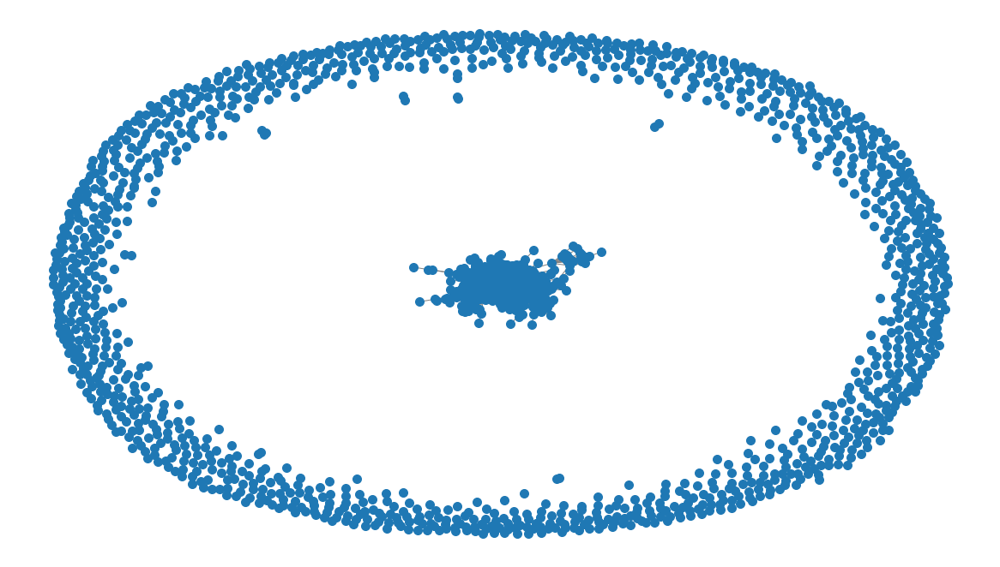

In [94]:
nx.draw(strong1_G, node_size=100, edge_color='gray')

In [95]:
strong_G.remove_nodes_from(list(nx.isolates(strong_G)))

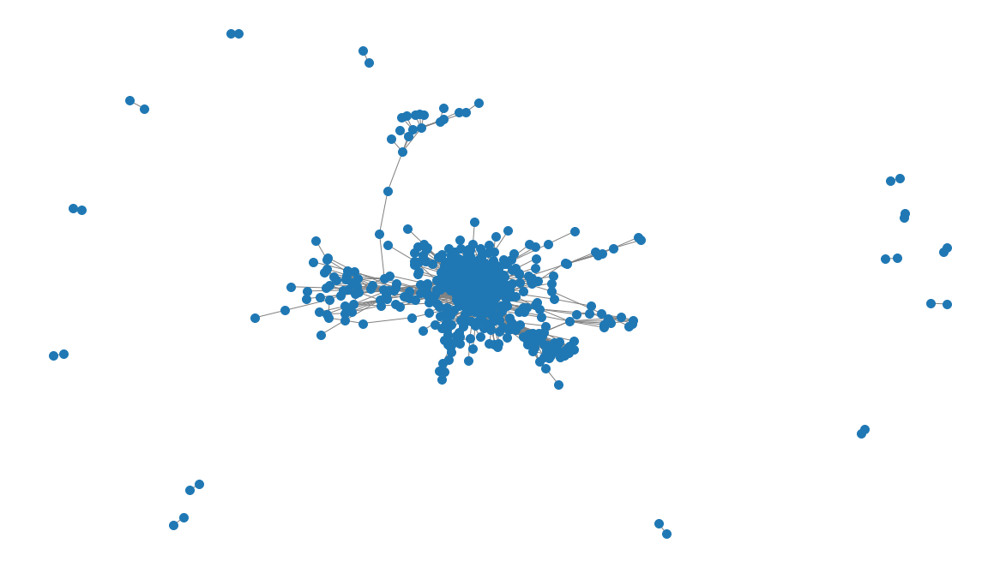

In [96]:
nx.draw(strong_G, node_size=100, edge_color='gray')

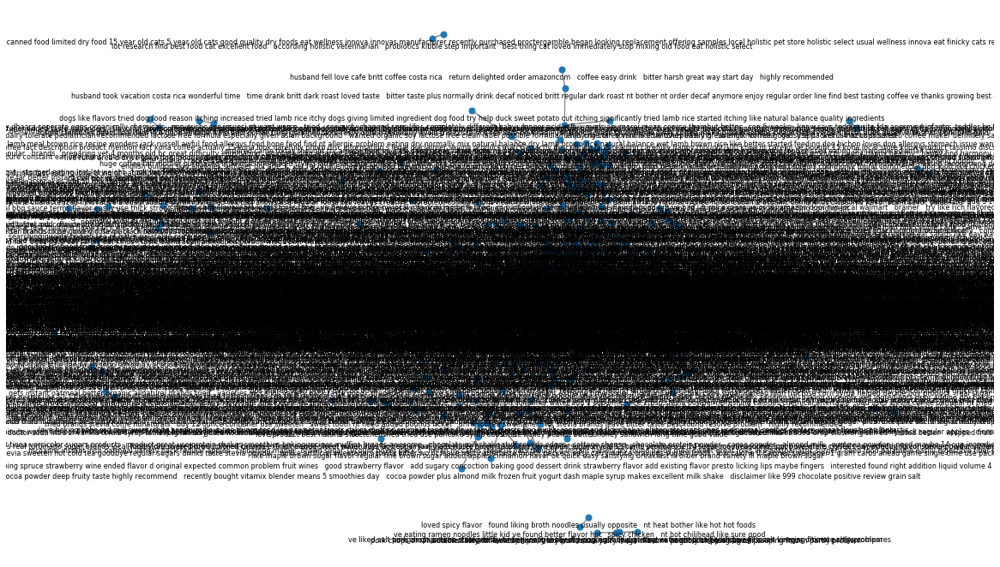

In [97]:
from math import sqrt
count = strong_G.number_of_nodes()
equilibrium = 10 / sqrt(count)    # default for this is 1/sqrt(n), but this will 'blow out' the layout for better visibility
pos = nx.fruchterman_reingold_layout(strong_G, k=equilibrium, iterations=300)
nx.draw(strong_G, pos=pos, node_size=10, edge_color='gray')
plt.rcParams['figure.figsize'] = [16, 9]  # a better aspect ratio for labelled nodes
nx.draw(strong_G, pos, font_size=3, node_size=50, edge_color='gray', with_labels=False)
for p in pos:  # raise positions of the labels, relative to the nodes
    pos[p][1] -= 0.03
nx.draw_networkx_labels(strong_G, pos, font_size=8, font_color='k')

plt.show()

In [67]:
print(nx.info(strong_G))

Name: 
Type: Graph
Number of nodes: 582
Number of edges: 3519
Average degree:  12.0928


In [68]:
w = list(nx.nodes(strong_G,))

In [69]:
w

[nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic internet case sauce ecstatic   love hot saucei mean love hot sauce nt want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan   realize taste want use sauce   thank personal incredible service,
 cats happily eating felidae platinum years got new bag shape food different tried new food bowls bowls sit kitties touch food ve noticed similar reviews related formula changes past unfortunately need find new food cats eat,
 nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic internet case sauce ecstatic   love hot saucei mean love hot sauce nt want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan   realize taste want use sauce   tha

In [70]:
e = dict(nx.edges(strong_G,))

In [71]:
e

[(nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic internet case sauce ecstatic   love hot saucei mean love hot sauce nt want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan   realize taste want use sauce   thank personal incredible service,
  nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic internet case sauce ecstatic   love hot saucei mean love hot sauce nt want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan   realize taste want use sauce   thank personal incredible service),
 (nt know cactus tequila unique combination ingredients flavour hot sauce makes kind   picked bottle trip brought home totally blown away   realized simply nt find city bummed   magic interne

In [ ]:
edge_x = []
edge_y = []
for edge in strong_G.edges():
    x0, y0 = strong_G.nodes[edge[0]]['pos']
    x1, y1 = strong_G.nodes[edge[1]]['pos']
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in strong_G.nodes():
    x, y = strong_G.nodes[node]['pos']
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))